In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from datetime import datetime,timedelta
import warnings
warnings.filterwarnings('ignore')
from collections import Counter
import time
import re
import pickle
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from beautifultable import BeautifulTable
from scipy import stats
import itertools

pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

In [2]:
data=pd.read_csv('Network_anomaly_data.csv')

#data.drop_duplicates(keep='first',inplace=True)
data.rename({'count':'countt'},axis=1,inplace=True)

target_attacks={
'normal': 'normal',
'neptune': 'dos', ##denial of service
    ##, attacks that aim at make machine/network resource unavailable to intended users by overwhelming it with traffic
'satan': 'probe', ##Reconnaissance attacks where attacker scans the network for vulnerabilities(port scanning, diif srv metrics high? etc)
'ipsweep': 'probe',
'portsweep': 'probe',
'smurf': 'dos',
'nmap': 'probe',
'back': 'dos',
'teardrop': 'dos',
'warezclient':'r2l', ## remote to local, attacks where the attacker sends packets to a machine over a network to try to gain unauthorized access (shell use/root use/ dst bytes..)
'pod':'dos',
'guess_passwd':'r2l',
'buffer_overflow':'u2r', ## user to root, attacks that attempt to gain root access to a machine, often by exploiting vulnerabilities
'warezmaster':'r2l',
'land':'dos',
'imap':'r2l',
'rootkit':'u2r',
'loadmodule':'u2r',
'ftp_write':'r2l',
'multihop':'r2l',
'phf':'r2l',
'perl':'u2r',
'spy':'r2l'
}
    
data['target_attacks']=data.attack.map(target_attacks)

data.head()

,duration,protocoltype,service,flag,srcbytes,dstbytes,land,wrongfragment,urgent,hot,numfailedlogins,loggedin,numcompromised,rootshell,suattempted,numroot,numfilecreations,numshells,numaccessfiles,numoutboundcmds,ishostlogin,isguestlogin,countt,srvcount,serrorrate,srvserrorrate,rerrorrate,srvrerrorrate,samesrvrate,diffsrvrate,srvdiffhostrate,dsthostcount,dsthostsrvcount,dsthostsamesrvrate,dsthostdiffsrvrate,dsthostsamesrcportrate,dsthostsrvdiffhostrate,dsthostserrorrate,dsthostsrvserrorrate,dsthostrerrorrate,dsthostsrvrerrorrate,attack,lastflag,target_attacks
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,0.0,0.0,0.0,0.0,1.00,0.00,0.00,150,25,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,20,normal
1,0,udp,other,SF,146,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13,1,0.0,0.0,0.0,0.0,0.08,0.15,0.00,255,1,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,15,normal
2,0,tcp,private,S0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,123,6,1.0,1.0,0.0,0.0,0.05,0.07,0.00,255,26,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,19,dos
3,0,tcp,http,SF,232,8153,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,5,5,0.2,0.2,0.0,0.0,1.00,0.00,0.00,30,255,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,21,normal
4,0,tcp,http,SF,199,420,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,30,32,0.0,0.0,0.0,0.0,1.00,0.00,0.09,255,255,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,21,normal


In [3]:
df=data.copy()

def change_to_flag(dd,cols): ##flagging some of numeric variables 
    for col in cols:
        dd.loc[:,col]=pd.Series(np.where(dd[col]==0,0,1),index=dd.index)
    return dd

df=change_to_flag(df,['wrongfragment','urgent','numfailedlogins','suattempted','numshells'
                      ,'numaccessfiles','numfilecreations','hot','numroot','numcompromised'])

numerical_vars=['duration','srcbytes','dstbytes'
               
               ,'countt','srvcount','serrorrate','srvserrorrate','rerrorrate','srvrerrorrate','samesrvrate'
               ,'diffsrvrate','srvdiffhostrate'
               
               ,'dsthostcount','dsthostsrvcount','dsthostsamesrvrate','dsthostdiffsrvrate'
              ,'dsthostsamesrcportrate','dsthostsrvdiffhostrate','dsthostserrorrate','dsthostsrvserrorrate','dsthostrerrorrate','dsthostsrvrerrorrate']

categorical_vars=['protocoltype','service','flag','land','loggedin','rootshell','isguestlogin','lastflag'  #unflaggs
                 
                 ,'wrongfragment','urgent','numfailedlogins','suattempted','numshells','numaccessfiles','numfilecreations','hot','numroot','numcompromised' #flaggs
                
                  #binned
                ]  

# there is only one record in host login.. this can analyzed separately after things are done
drop_var=['numoutboundcmds','ishostlogin']

df.drop(drop_var,axis=1,inplace=True)

In [4]:
#df.to_csv('Network_anamoly_cleaned.csv',index=False)

In [5]:
def treat_outliers(data,col,low_ext,up_ext):
    s=data[col].describe()
    le=s['25%']-1.5*(s['75%']-s['25%'])
    ue=s['75%']+1.5*(s['75%']-s['25%'])
    d=data.copy()
    if low_ext:
        d.loc[d[col]<le,col]=le
    if up_ext:
        d.loc[d[col]>ue,col]=ue
    return d[col],le,ue
des=df.describe().copy()
lower_threshold=(des.loc['25%']-1.5*(des.loc['75%']-des.loc['25%'])).to_frame().T
lower_threshold.index=['Lower_Threshold']
upper_threshold=(des.loc['75%']+1.5*(des.loc['75%']-des.loc['25%'])).to_frame().T
upper_threshold.index=['Upper_Threshold']

thresholds=pd.concat([des,lower_threshold,upper_threshold],axis=0)
counts=[[],[]]
for col in thresholds.columns:
    lt=thresholds.loc['Lower_Threshold',col]
    lts=len(df.loc[df[col]<lt])
    counts[0].append(lts)
    ut=thresholds.loc['Upper_Threshold',col]
    uts=len(df.loc[df[col]>ut])
    counts[1].append(uts)
    
counts=pd.DataFrame(counts,index=['Volume_below_Lower_Threhold','Volume_above_Upper_Threhold'],columns=thresholds.columns)
thresholds=pd.concat([thresholds,counts],axis=0)
thresholds=thresholds.loc[['count', 'mean', 'std','Volume_below_Lower_Threhold','Lower_Threshold', 'min'
, '25%', '50%', '75%', 'max', 'Upper_Threshold','Volume_above_Upper_Threhold']]
thresholds


,duration,srcbytes,dstbytes,land,wrongfragment,urgent,hot,numfailedlogins,loggedin,numcompromised,rootshell,suattempted,numroot,numfilecreations,numshells,numaccessfiles,isguestlogin,countt,srvcount,serrorrate,srvserrorrate,rerrorrate,srvrerrorrate,samesrvrate,diffsrvrate,srvdiffhostrate,dsthostcount,dsthostsrvcount,dsthostsamesrvrate,dsthostdiffsrvrate,dsthostsamesrcportrate,dsthostsrvdiffhostrate,dsthostserrorrate,dsthostsrvserrorrate,dsthostrerrorrate,dsthostsrvrerrorrate,lastflag
count,125973.00000,1.259730e+05,1.259730e+05,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000
mean,287.14465,4.556674e+04,1.977911e+04,0.000198,0.008653,0.000071,0.021203,0.000968,0.395736,0.010209,0.001342,0.000635,0.005152,0.002278,0.000373,0.002945,0.009423,84.107555,27.737888,0.284485,0.282485,0.119958,0.121183,0.660928,0.063053,0.097322,182.148945,115.653005,0.521242,0.082951,0.148379,0.032542,0.284452,0.278485,0.118832,0.120240,19.504060
std,2604.51531,5.870331e+06,4.021269e+06,0.014086,0.092617,0.008452,0.144061,0.031105,0.489010,0.100521,0.036603,0.025192,0.071592,0.047677,0.019312,0.054189,0.096612,114.508607,72.635840,0.446456,0.447022,0.320436,0.323647,0.439623,0.180314,0.259830,99.206213,110.702741,0.448949,0.188922,0.308997,0.112564,0.444784,0.445669,0.306557,0.319459,2.291503
Volume_below_Lower_Threhold,0.00000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2995.000000
Lower_Threshold,0.00000,-4.140000e+02,-7.740000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,-1.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-209.500000,-22.000000,-1.500000,-1.500000,0.000000,0.000000,-1.275000,-0.090000,0.000000,-177.500000,-357.500000,-1.375000,-0.105000,-0.090000,-0.030000,-1.500000,-1.500000,0.000000,0.000000,13.500000
min,0.00000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.00000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.090000,0.000000,0.000000,82.000000,10.000000,0.050000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.000000
50%,0.00000,4.400000e+01,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,8.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,255.000000,63.000000,0.510000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000
75%,0.00000,2.760000e+02,5.160000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,143.000000,18.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.060000,0.000000,255.000000,255.000000,1.000000,0.070000,0.060000,0.020000,1.000000,1.000000,0.000000,0.000000,21.000000
max,42908.00000,1.379964e+09,1.309937e+09,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000

In [6]:
## Through IQR figured columns with most outliers
## Ignoring outlier in rates(% scores) and 0/1 categories

#(100*thresholds.loc['Volume_above_Upper_Threhold']/len(df)).sort_values(ascending=False)

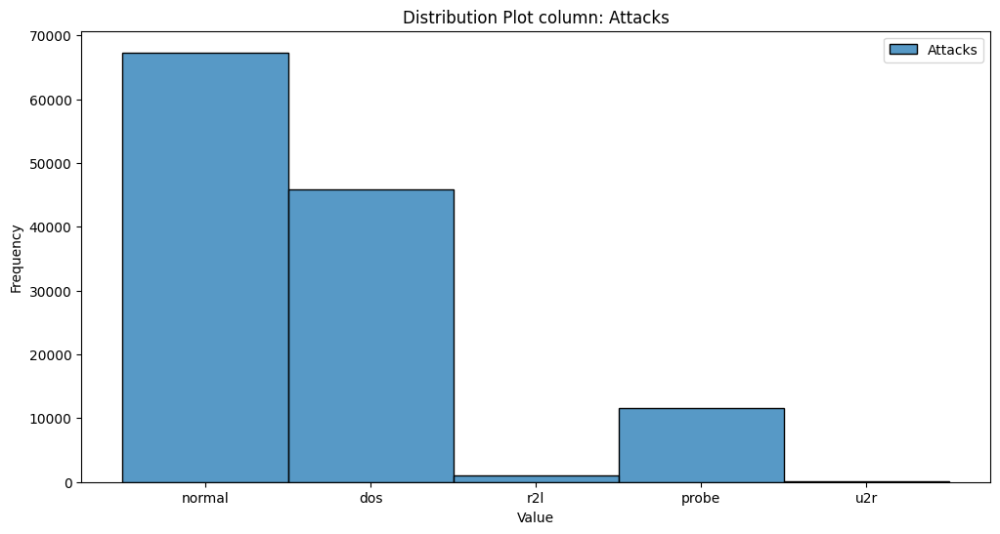

In [7]:
plt.figure(figsize=(12, 6))

sns.histplot(df.target_attacks.astype(str), label='{}'.format('Attacks'), palette='viridis')

plt.title('Distribution Plot column: {}'.format('Attacks'))
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.legend()

# Show plot
plt.show()

### Hypothesis test and Distribution of variables across different ratings

=============== protocoltype-target_attacks ================



protocoltype    icmp    tcp    udp
target_attacks                    
dos             2847  42188    892
normal          1309  53600  12434
probe           4135   5857   1664
r2l                0    995      0
u2r                0     49      3
chi2: 25578.38197295511 with p_value: 0.0
There is a statistically significant association between protocoltype and target_attacks.


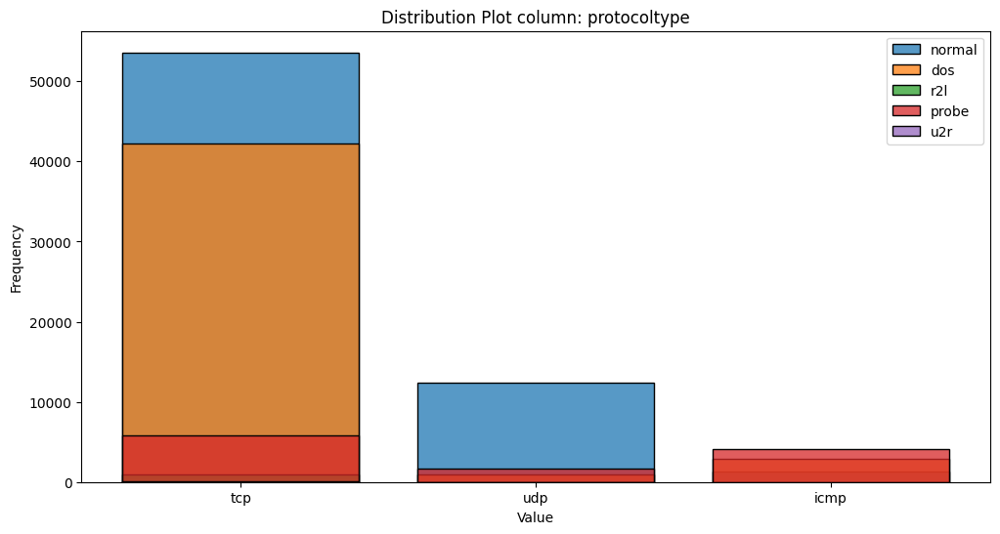

=============== service-target_attacks ================



service         IRC  X11  Z39_50  aol  auth  bgp  courier  csnet_ns  ctf  \
target_attacks                                                             
dos               0    0     851    0   703  699      726       533  538   
normal          186   67       0    0   236    0        0         0    0   
probe             1    6      11    2    16   11        8        12   25   
r2l               0    0       0    0     0    0        0         0    0   
u2r               0    0       0    0     0    0        0         0    0   

service         daytime  discard  domain  domain_u  echo  eco_i  ecr_i  efs  \
target_attacks                                                                
dos                 503      520     508         0   416      0   2844  478   
normal                0        0      38      9034     0    497    190    0   
probe                18       18      23         9    18   4089     43    7   
r2l          

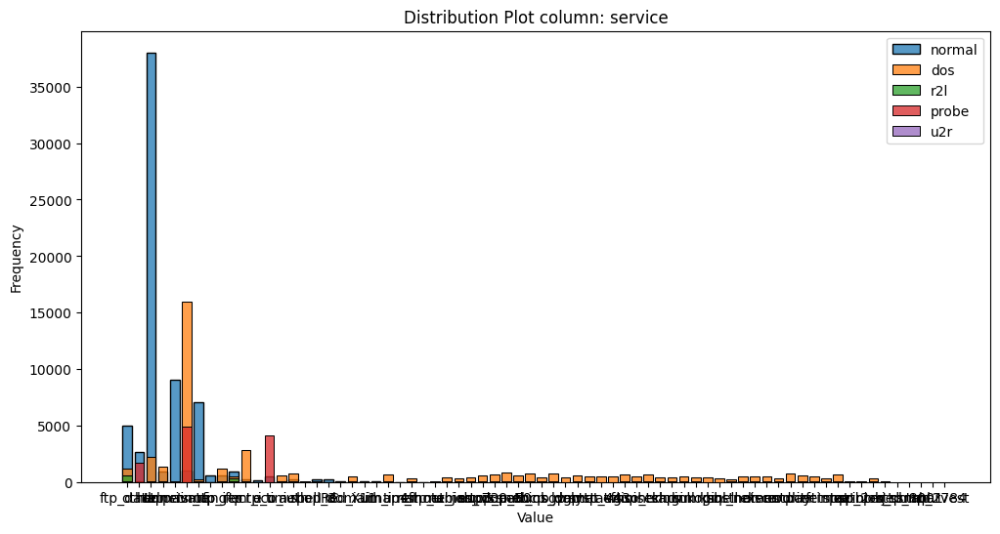

=============== flag-target_attacks ================



flag            OTH   REJ  RSTO  RSTOS0  RSTR     S0   S1   S2  S3     SF   SH
target_attacks                                                                
dos               0  5671  1216       0    90  34344    2    5   0   4599    0
normal           11  2693   219       0   146    354  361  119  45  63393    2
probe            35  2869    80     103  2180    153    1    2   1   5967  265
r2l               0     0    46       0     5      0    1    1   3    935    4
u2r               0     0     1       0     0      0    0    0   0     51    0
chi2: 120934.70628449364 with p_value: 0.0
There is a statistically significant association between flag and target_attacks.


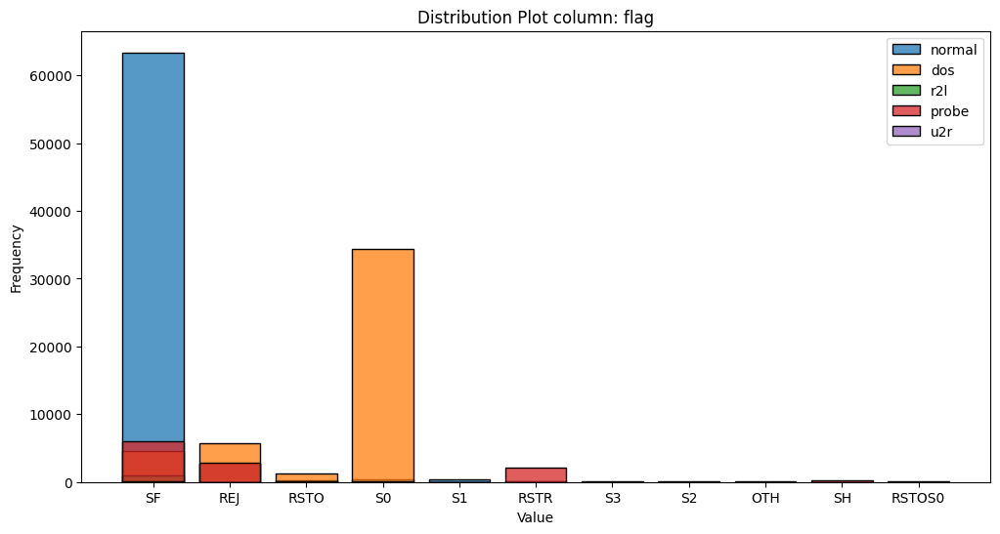

=============== land-target_attacks ================



land                0   1
target_attacks           
dos             45909  18
normal          67336   7
probe           11656   0
r2l               995   0
u2r                52   0
chi2: 14.217168445116707 with p_value: 0.006633246400299416
There is a statistically significant association between land and target_attacks.


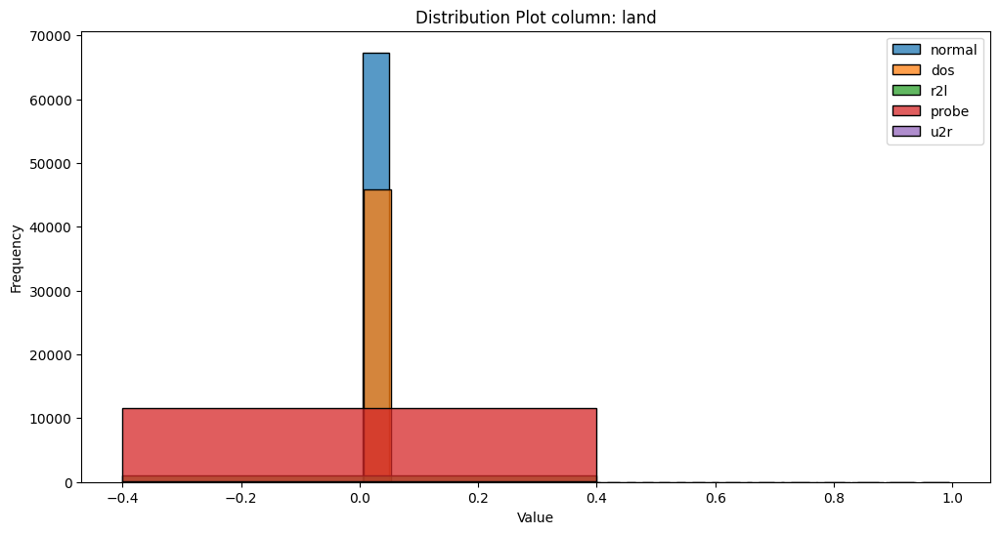

=============== loggedin-target_attacks ================



loggedin            0      1
target_attacks              
dos             44970    957
normal          19486  47857
probe           11573     83
r2l                86    909
u2r                 6     46
chi2: 63450.32612695969 with p_value: 0.0
There is a statistically significant association between loggedin and target_attacks.


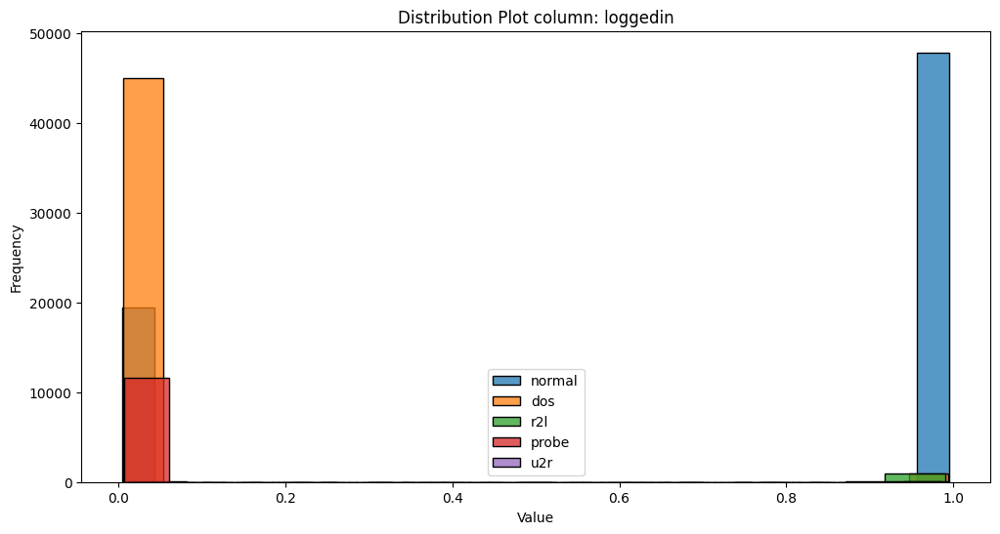

=============== rootshell-target_attacks ================



rootshell           0    1
target_attacks            
dos             45927    0
normal          67206  137
probe           11656    0
r2l               989    6
u2r                26   26
chi2: 9769.055087760655 with p_value: 0.0
There is a statistically significant association between rootshell and target_attacks.


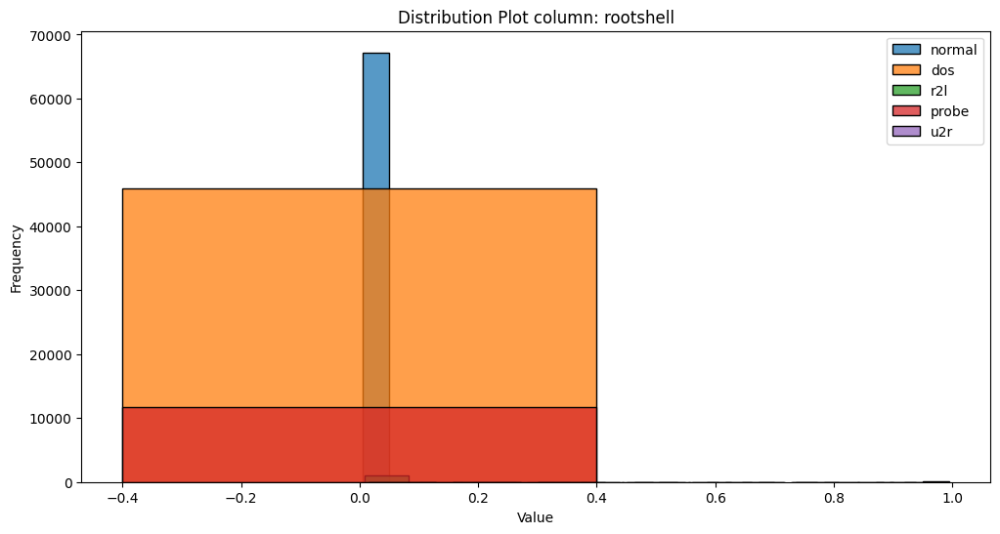

=============== isguestlogin-target_attacks ================



isguestlogin        0    1
target_attacks            
dos             45927    0
normal          66470  873
probe           11655    1
r2l               682  313
u2r                52    0
chi2: 10563.01936437017 with p_value: 0.0
There is a statistically significant association between isguestlogin and target_attacks.


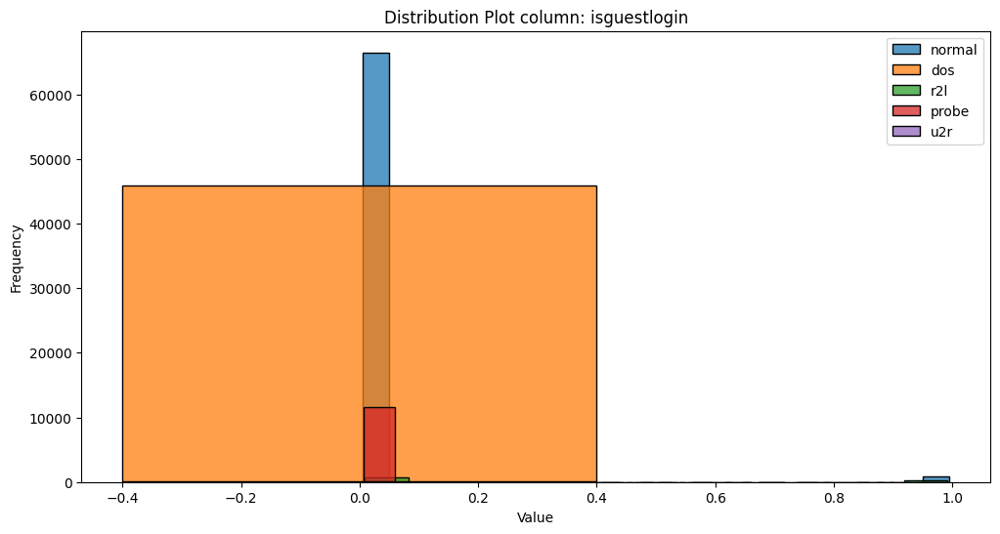

=============== lastflag-target_attacks ================



lastflag        0   1   2   3   4   5   6   7   8   9    10   11   12   13  \
target_attacks                                                               
dos              0   0   0   2   3   5  14   9  14  42   71  319  351   93   
normal           0   3   2   4   9  15   8  22  13  45   40   59  121  111   
probe           25  37  19  22  21  33  52  52  32  27   38   95  141  157   
r2l             38  13  20  34  39  24  21  34  47  79  101  166  113   89   
u2r              3   9  13   3   7   4   1   1   0   1    3    2    3    1   

lastflag         14    15    16    17     18    19     20     21  
target_attacks                                                    
dos              66   618   344   357  11349  8125  10867  13278  
normal          322   230   307  1133   7076  1773   6886  49164  
probe           191  3079  1733  1578   2238   385   1586    115  
r2l              94    63     9     6      4     1      0 

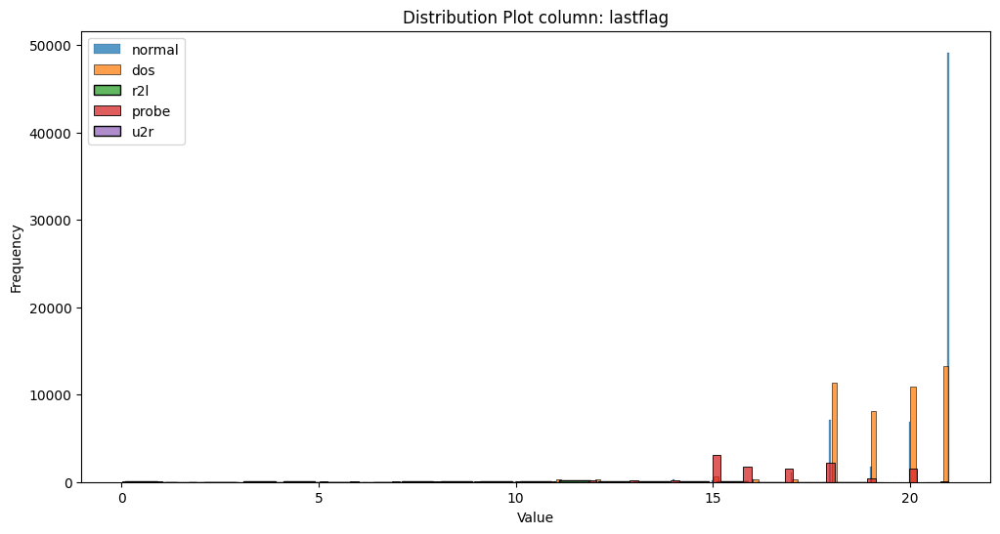

=============== wrongfragment-target_attacks ================



wrongfragment       0     1
target_attacks             
dos             44837  1090
normal          67343     0
probe           11656     0
r2l               995     0
u2r                52     0
chi2: 1916.3384069640858 with p_value: 0.0
There is a statistically significant association between wrongfragment and target_attacks.


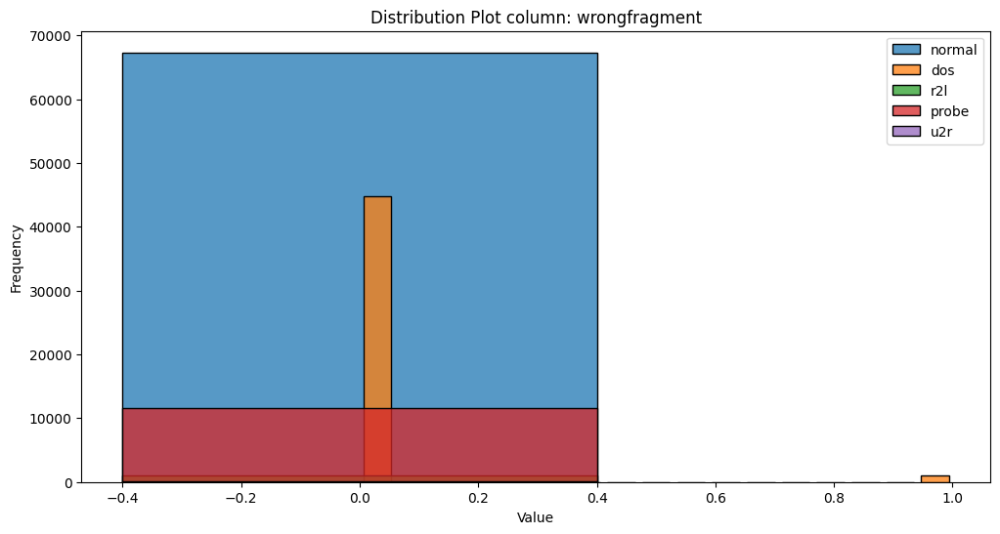

=============== urgent-target_attacks ================



urgent              0  1
target_attacks          
dos             45927  0
normal          67337  6
probe           11656  0
r2l               993  2
u2r                51  1
chi2: 323.9480381001917 with p_value: 7.373873628812056e-69
There is a statistically significant association between urgent and target_attacks.


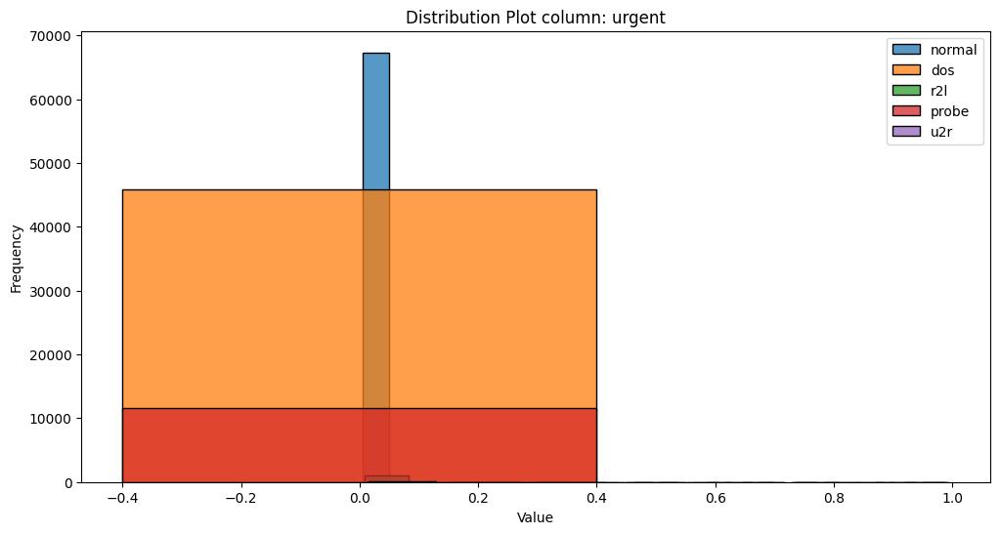

=============== numfailedlogins-target_attacks ================



numfailedlogins      0   1
target_attacks            
dos              45927   0
normal           67275  68
probe            11655   1
r2l                943  52
u2r                 51   1
chi2: 2777.6228609385907 with p_value: 0.0
There is a statistically significant association between numfailedlogins and target_attacks.


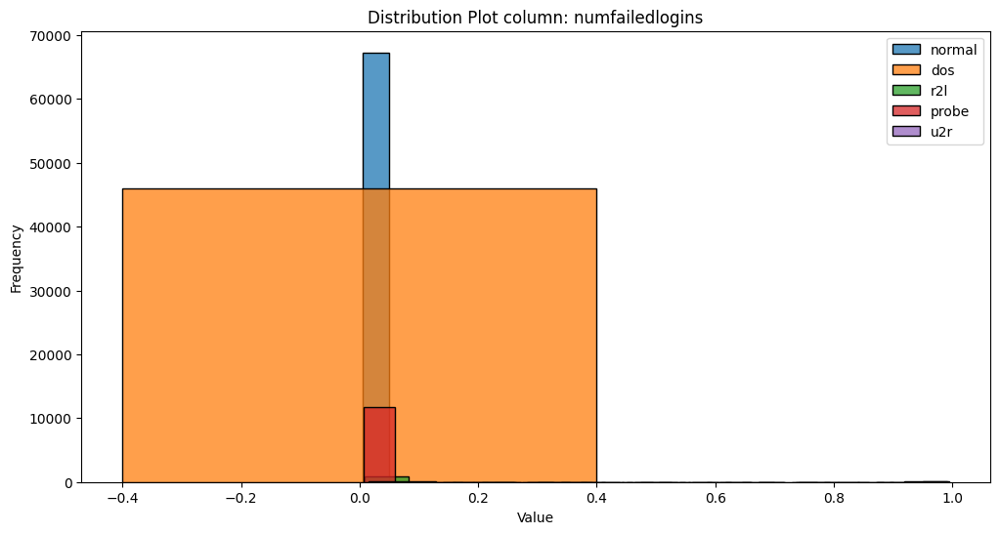

=============== suattempted-target_attacks ================



suattempted         0   1
target_attacks           
dos             45927   0
normal          67264  79
probe           11656   0
r2l               994   1
u2r                52   0
chi2: 67.5570322430269 with p_value: 7.438543203659926e-14
There is a statistically significant association between suattempted and target_attacks.


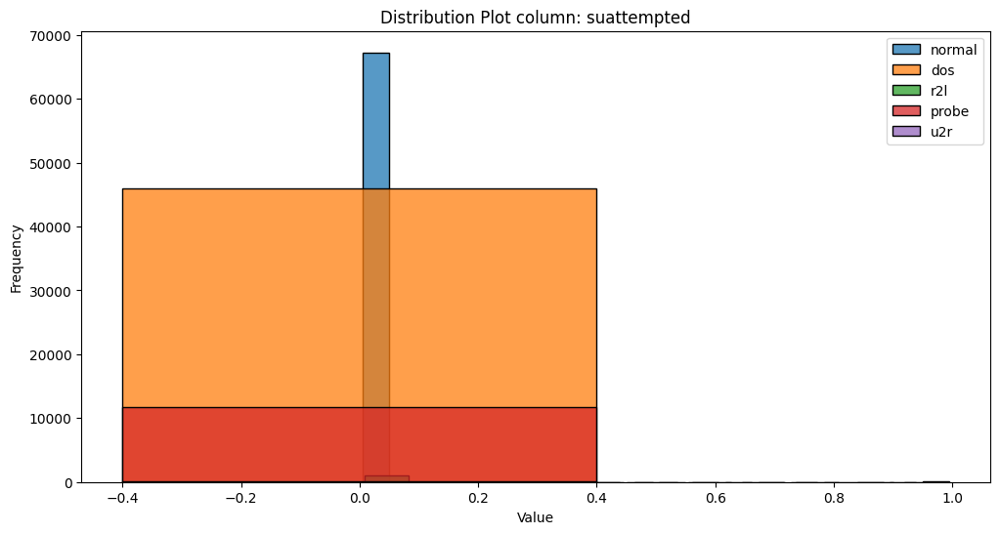

=============== numshells-target_attacks ================



numshells           0   1
target_attacks           
dos             45927   0
normal          67304  39
probe           11656   0
r2l               992   3
u2r                47   5
chi2: 1326.8696436744276 with p_value: 4.970157582777e-286
There is a statistically significant association between numshells and target_attacks.


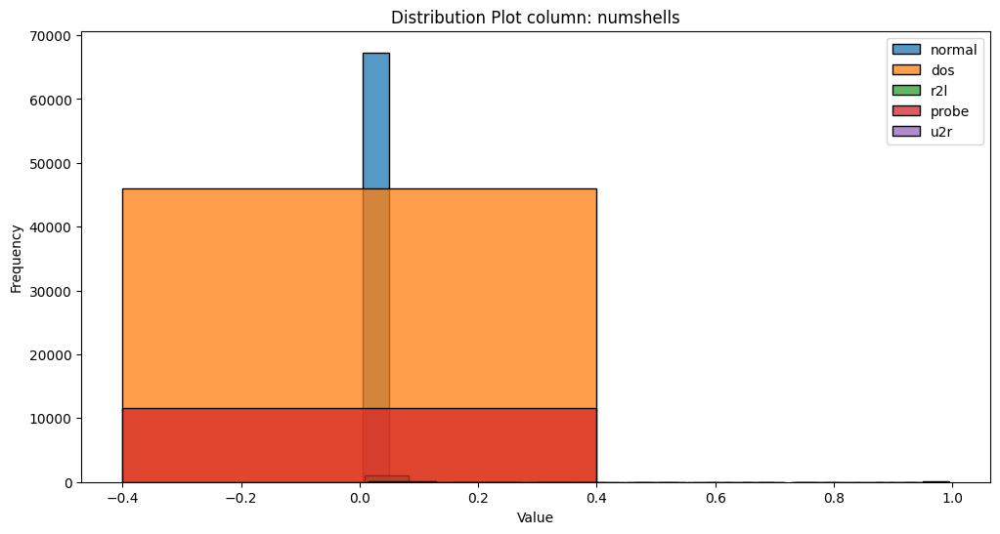

=============== numaccessfiles-target_attacks ================



numaccessfiles      0    1
target_attacks            
dos             45927    0
normal          66982  361
probe           11656    0
r2l               986    9
u2r                51    1
chi2: 321.2085180580611 with p_value: 2.876797785977454e-68
There is a statistically significant association between numaccessfiles and target_attacks.


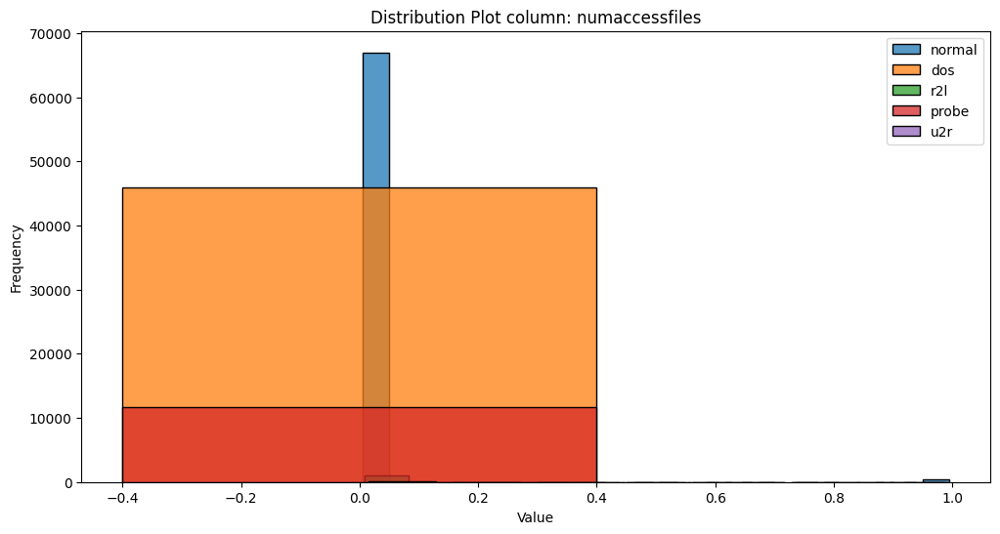

=============== numfilecreations-target_attacks ================



numfilecreations      0    1
target_attacks              
dos               45927    0
normal            67090  253
probe             11654    2
r2l                 986    9
u2r                  29   23
chi2: 4641.929902582871 with p_value: 0.0
There is a statistically significant association between numfilecreations and target_attacks.


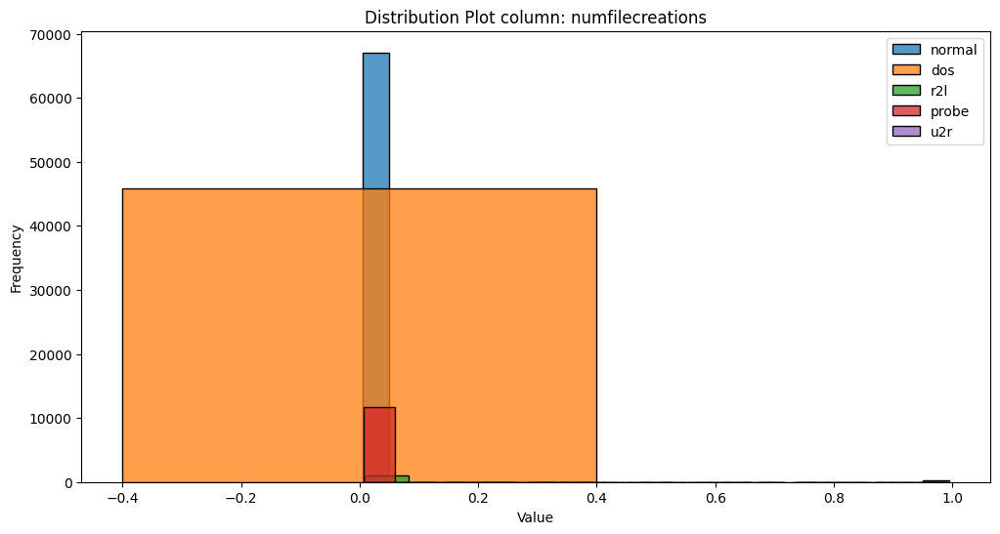

=============== hot-target_attacks ================



hot                 0     1
target_attacks             
dos             44980   947
normal          66087  1256
probe           11639    17
r2l               572   423
u2r                24    28
chi2: 8733.46378927598 with p_value: 0.0
There is a statistically significant association between hot and target_attacks.


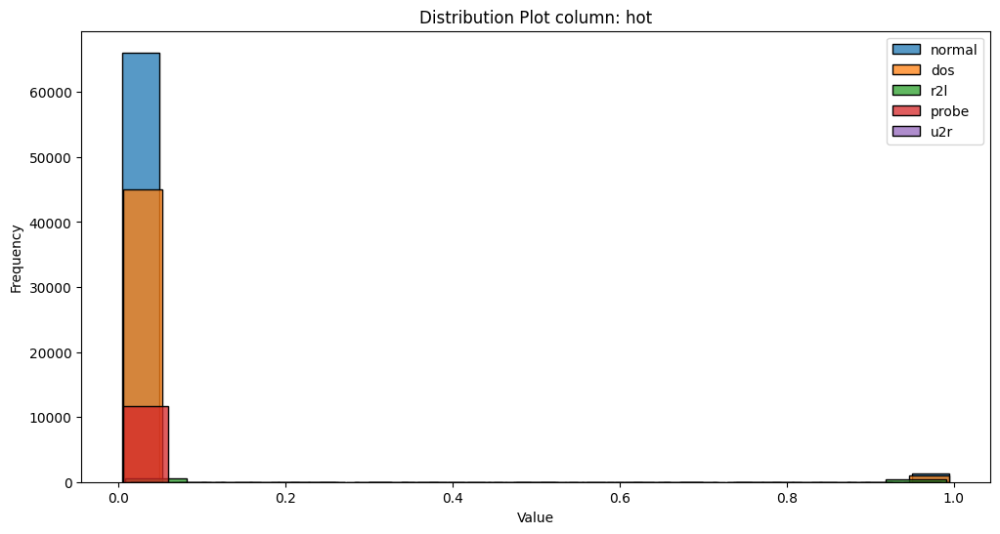

=============== numroot-target_attacks ================



numroot             0    1
target_attacks            
dos             45927    0
normal          66713  630
probe           11652    4
r2l               990    5
u2r                42   10
chi2: 877.9297226769546 with p_value: 1.007861750067639e-188
There is a statistically significant association between numroot and target_attacks.


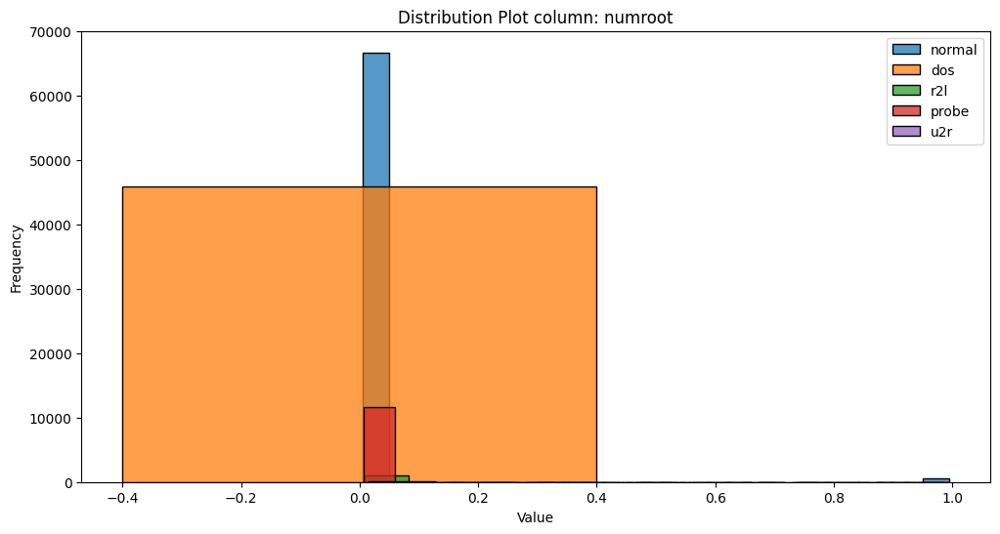

=============== numcompromised-target_attacks ================



numcompromised      0    1
target_attacks            
dos             45044  883
normal          66971  372
probe           11652    4
r2l               991    4
u2r                29   23
chi2: 1592.7803938357283 with p_value: 0.0
There is a statistically significant association between numcompromised and target_attacks.


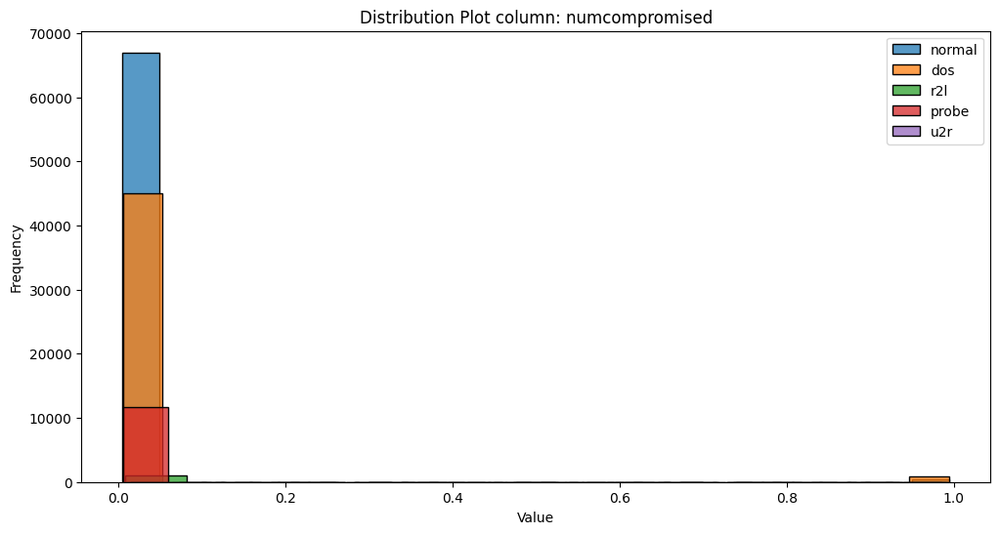

=============== duration-target_attacks ================
                   count         mean          std  min  25%   50%    75%  \
target_attacks                                                             
dos             45927.0     0.006227     0.244800  0.0  0.0   0.0    0.0   
normal          67343.0   168.587396  1304.452127  0.0  0.0   0.0    0.0   
probe           11656.0  2074.858185  7710.333068  0.0  0.0   0.0    0.0   
r2l               995.0   633.417085  2232.535663  0.0  0.0   0.0    1.5   
u2r                52.0    80.942308   120.510908  0.0  0.0  46.0  105.5   

                    max  
target_attacks           
dos                14.0  
normal          40504.0  
probe           42908.0  
r2l             15168.0  
u2r               708.0  




<Figure size 800x600 with 0 Axes>

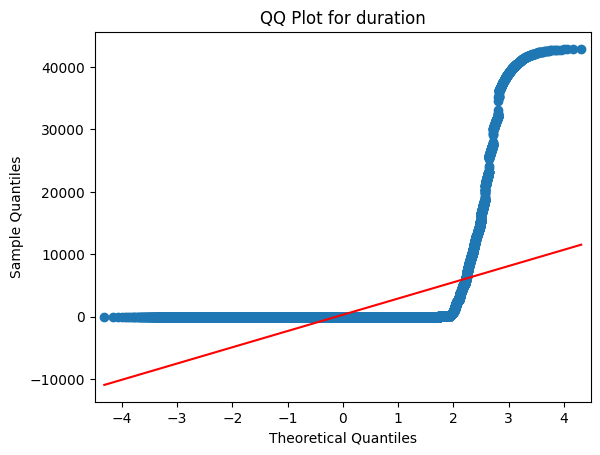

duration does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the duration across the groups in target_attacks (Kruskal-Wallis).


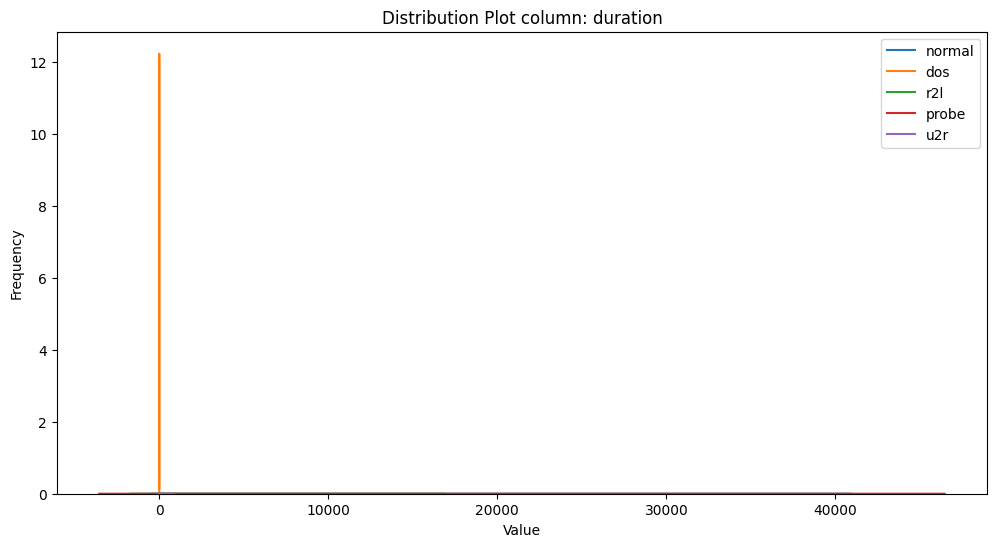

=============== srcbytes-target_attacks ================
                   count           mean           std  min    25%    50%  \
target_attacks                                                            
dos             45927.0    1176.321162  7.686120e+03  0.0    0.0    0.0   
normal          67343.0   13133.279331  4.181131e+05  0.0  129.0  233.0   
probe           11656.0  385679.838367  1.926641e+07  0.0    0.0    1.0   
r2l               995.0  307727.300503  1.214966e+06  0.0  334.0  334.0   
u2r                52.0     906.230769  1.188260e+03  0.0    4.0  273.0   

                   75%           max  
target_attacks                        
dos                0.0  5.454000e+04  
normal           324.0  8.958152e+07  
probe              8.0  1.379964e+09  
r2l             1224.0  5.135678e+06  
u2r             1567.0  6.274000e+03  




<Figure size 800x600 with 0 Axes>

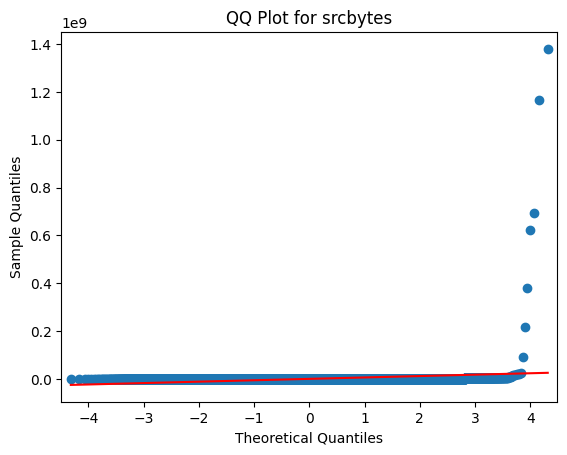

srcbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srcbytes across the groups in target_attacks (Kruskal-Wallis).


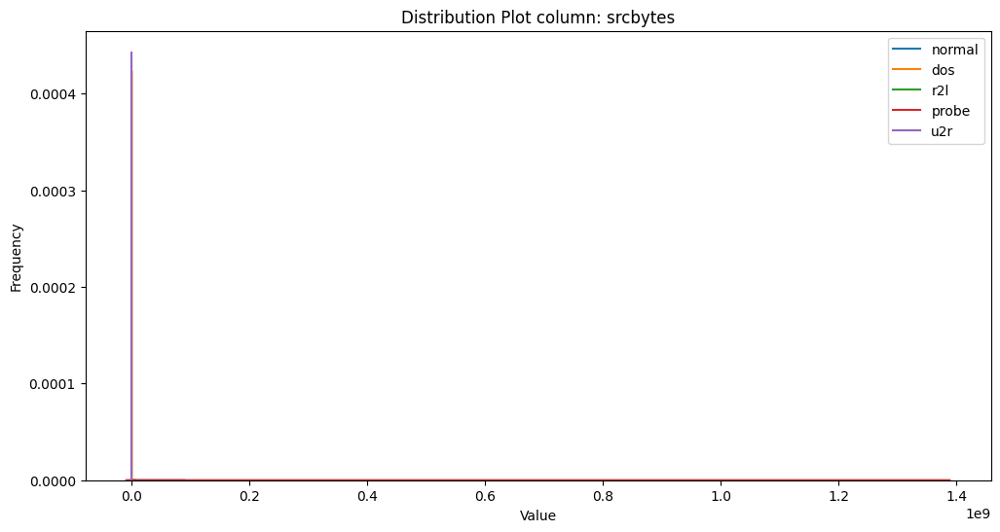

=============== dstbytes-target_attacks ================
                   count           mean           std  min     25%     50%  \
target_attacks                                                              
dos             45927.0     169.201537  1.168004e+03  0.0     0.0     0.0   
normal          67343.0    4329.685223  6.546282e+04  0.0   105.0   379.0   
probe           11656.0  181074.911805  1.321706e+07  0.0     0.0     0.0   
r2l               995.0   81822.026131  6.298782e+05  0.0     0.0     0.0   
u2r                52.0    5141.961538  1.008151e+04  0.0  1753.0  2907.0   

                   75%           max  
target_attacks                        
dos                0.0  8.315000e+03  
normal          2056.0  7.028652e+06  
probe              0.0  1.309937e+09  
r2l             2447.0  5.155468e+06  
u2r             5020.0  7.052900e+04  




<Figure size 800x600 with 0 Axes>

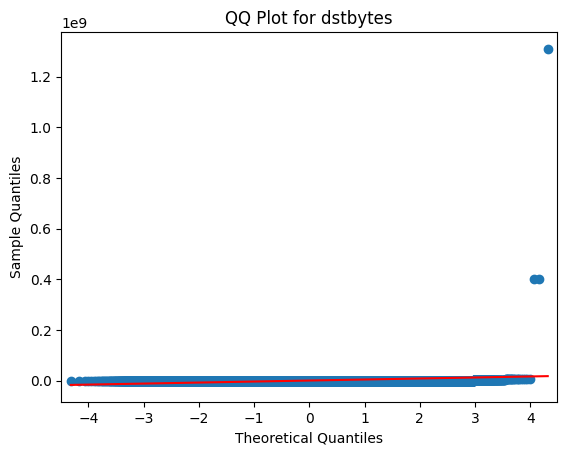

dstbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dstbytes across the groups in target_attacks (Kruskal-Wallis).


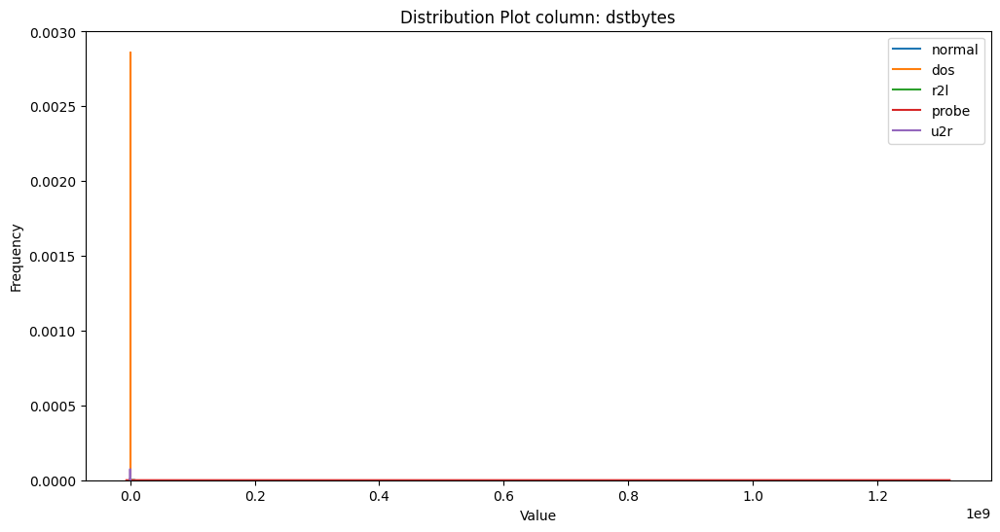

=============== countt-target_attacks ================
                   count        mean         std  min    25%    50%     75%  \
target_attacks                                                               
dos             45927.0  178.090034  104.445748  1.0  109.0  172.0  249.00   
normal          67343.0   22.517945   54.026086  0.0    1.0    4.0   14.00   
probe           11656.0   77.052248  156.470566  0.0    1.0    1.0   30.00   
r2l               995.0    1.297487    0.480970  1.0    1.0    1.0    2.00   
u2r                52.0    5.807692   23.454619  1.0    1.0    1.0    1.25   

                  max  
target_attacks         
dos             511.0  
normal          511.0  
probe           511.0  
r2l               4.0  
u2r             151.0  




<Figure size 800x600 with 0 Axes>

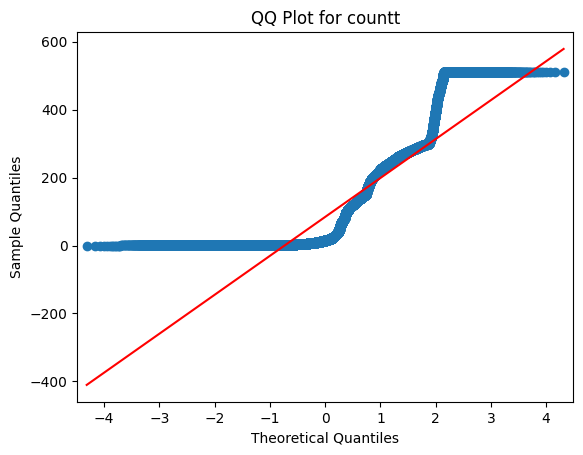

countt does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the countt across the groups in target_attacks (Kruskal-Wallis).


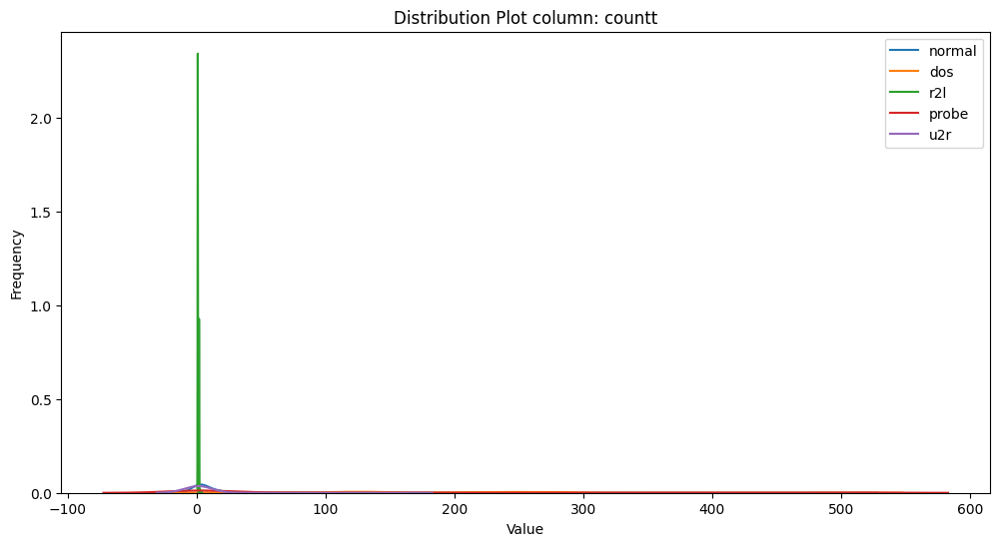

=============== srvcount-target_attacks ================
                   count       mean        std  min  25%   50%   75%    max
target_attacks                                                            
dos             45927.0  32.656346  94.667526  1.0  5.0  11.0  18.0  511.0
normal          67343.0  27.685654  60.182334  0.0  2.0   5.0  18.0  511.0
probe           11656.0  10.936084  18.281411  0.0  1.0   2.0  15.0  150.0
r2l               995.0   2.457286  12.751807  1.0  1.0   1.0   2.0  163.0
u2r                52.0   1.269231   0.629827  1.0  1.0   1.0   1.0    3.0




<Figure size 800x600 with 0 Axes>

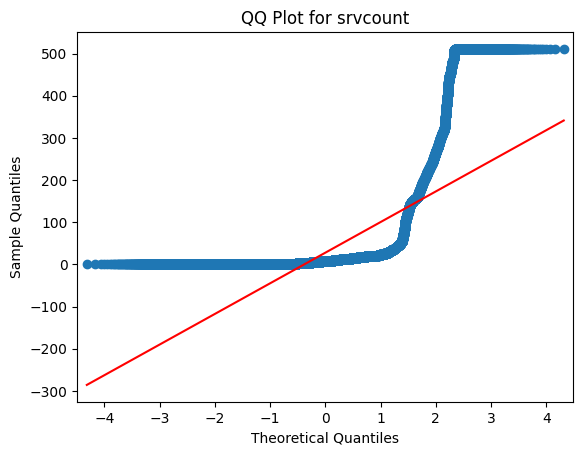

srvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvcount across the groups in target_attacks (Kruskal-Wallis).


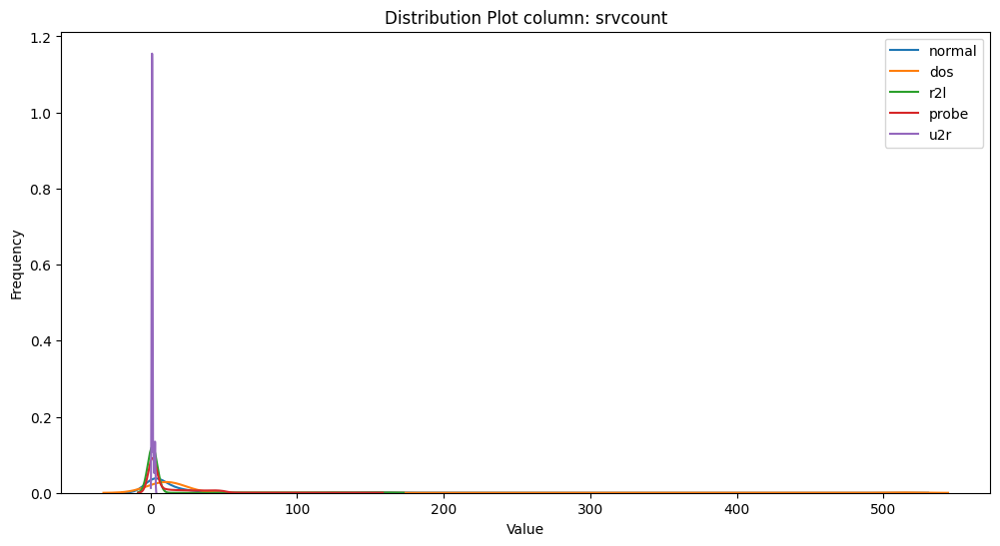

=============== serrorrate-target_attacks ================
                   count      mean       std  min   25%  50%  75%   max
target_attacks                                                        
dos             45927.0  0.748494  0.432559  0.0  0.29  1.0  1.0  1.00
normal          67343.0  0.013441  0.094211  0.0  0.00  0.0  0.0  1.00
probe           11656.0  0.046525  0.169185  0.0  0.00  0.0  0.0  1.00
r2l               995.0  0.011899  0.100336  0.0  0.00  0.0  0.0  1.00
u2r                52.0  0.038077  0.192242  0.0  0.00  0.0  0.0  0.99




<Figure size 800x600 with 0 Axes>

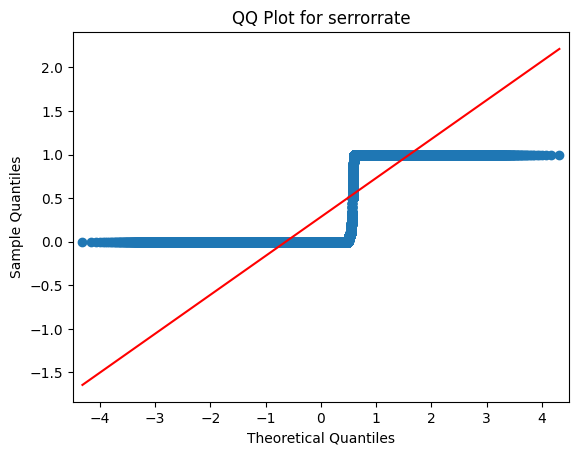

serrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the serrorrate across the groups in target_attacks (Kruskal-Wallis).


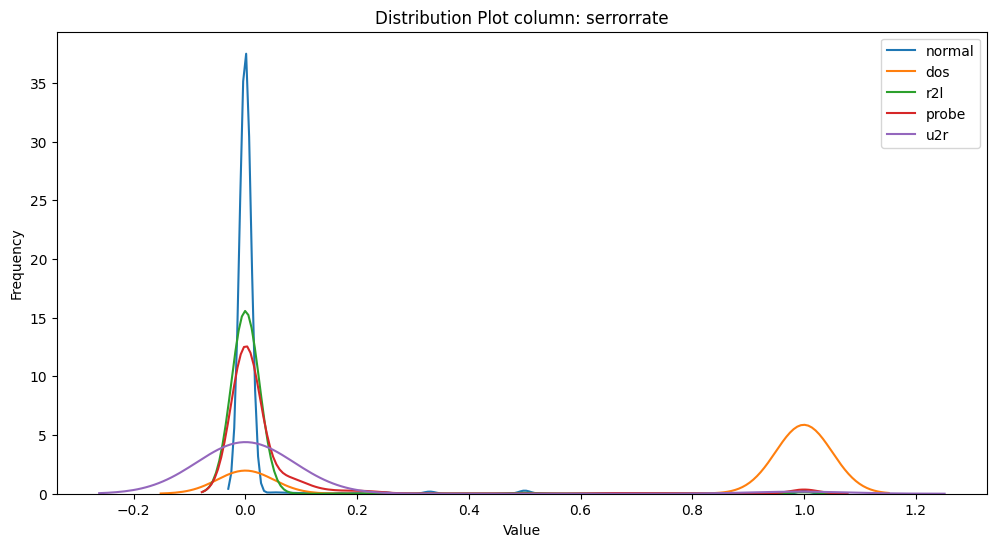

=============== srvserrorrate-target_attacks ================
                   count      mean       std  min  25%  50%  75%  max
target_attacks                                                      
dos             45927.0  0.746678  0.434050  0.0  0.0  1.0  1.0  1.0
normal          67343.0  0.012083  0.086426  0.0  0.0  0.0  0.0  1.0
probe           11656.0  0.040160  0.191445  0.0  0.0  0.0  0.0  1.0
r2l               995.0  0.011045  0.091319  0.0  0.0  0.0  0.0  1.0
u2r                52.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0




<Figure size 800x600 with 0 Axes>

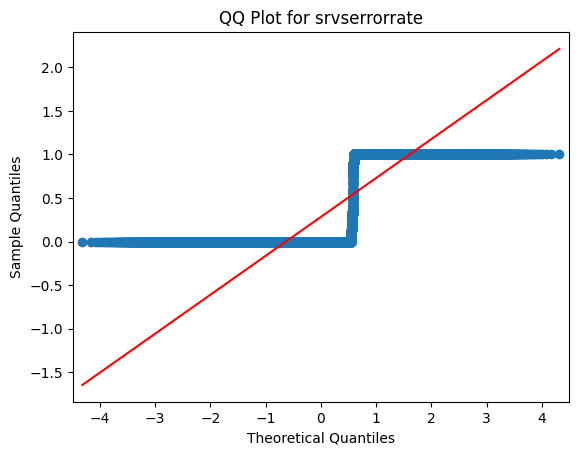

srvserrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvserrorrate across the groups in target_attacks (Kruskal-Wallis).


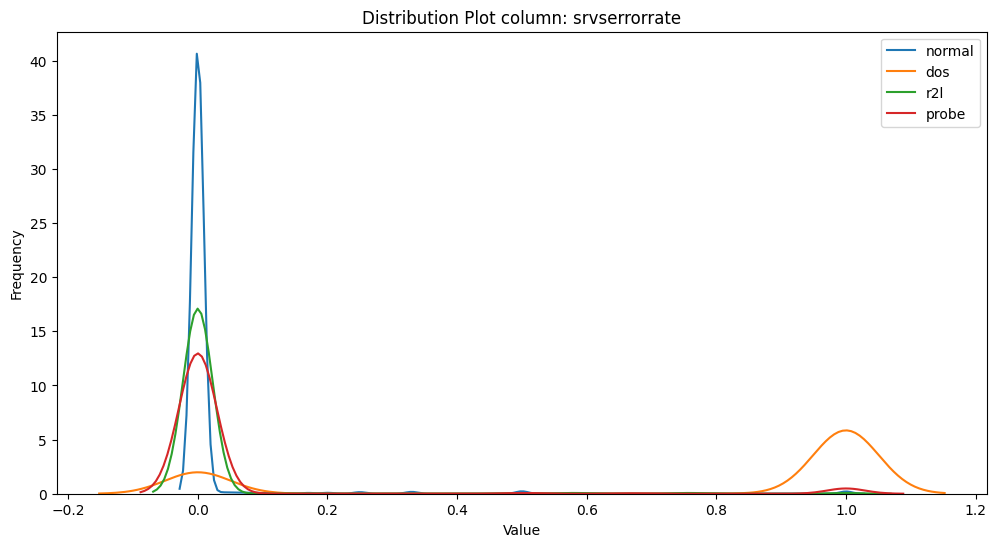

=============== rerrorrate-target_attacks ================
                   count      mean       std  min  25%  50%  75%  max
target_attacks                                                      
dos             45927.0  0.152107  0.357351  0.0  0.0  0.0  0.0  1.0
normal          67343.0  0.044196  0.202975  0.0  0.0  0.0  0.0  1.0
probe           11656.0  0.437319  0.475387  0.0  0.0  0.0  1.0  1.0
r2l               995.0  0.051759  0.219942  0.0  0.0  0.0  0.0  1.0
u2r                52.0  0.009808  0.069324  0.0  0.0  0.0  0.0  0.5




<Figure size 800x600 with 0 Axes>

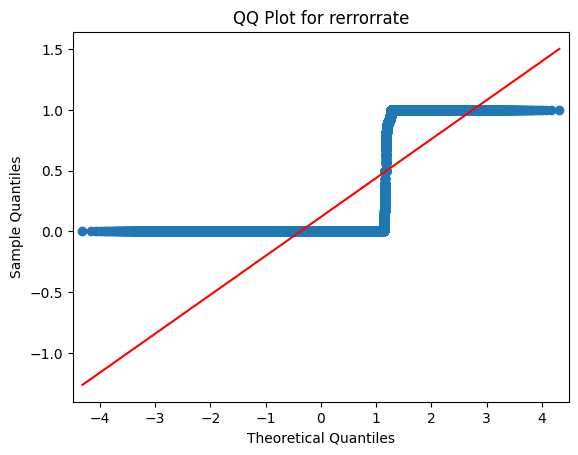

rerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the rerrorrate across the groups in target_attacks (Kruskal-Wallis).


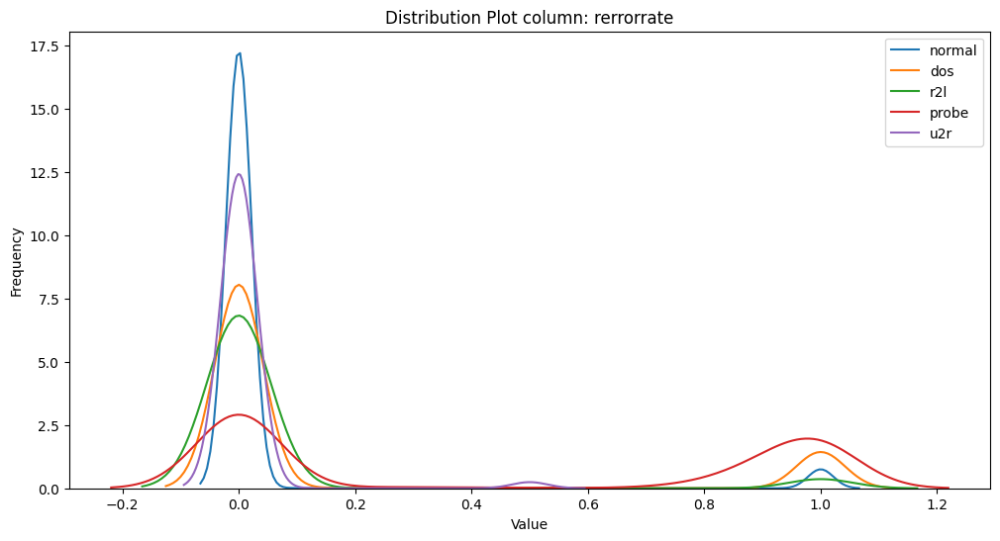

=============== srvrerrorrate-target_attacks ================
                   count      mean       std  min  25%  50%  75%  max
target_attacks                                                      
dos             45927.0  0.153000  0.357561  0.0  0.0  0.0  0.0  1.0
normal          67343.0  0.044629  0.202264  0.0  0.0  0.0  0.0  1.0
probe           11656.0  0.444469  0.494924  0.0  0.0  0.0  1.0  1.0
r2l               995.0  0.052040  0.219899  0.0  0.0  0.0  0.0  1.0
u2r                52.0  0.019231  0.138675  0.0  0.0  0.0  0.0  1.0




<Figure size 800x600 with 0 Axes>

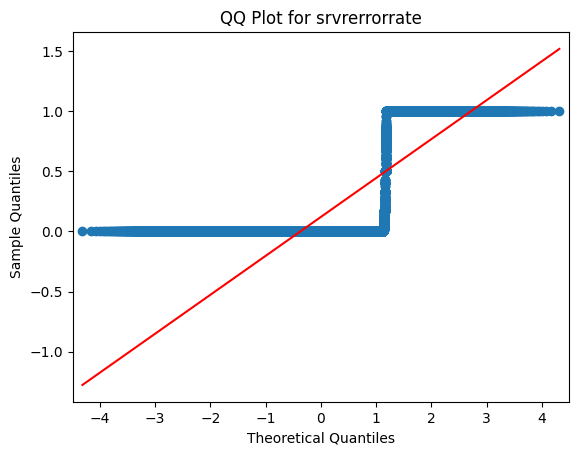

srvrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvrerrorrate across the groups in target_attacks (Kruskal-Wallis).


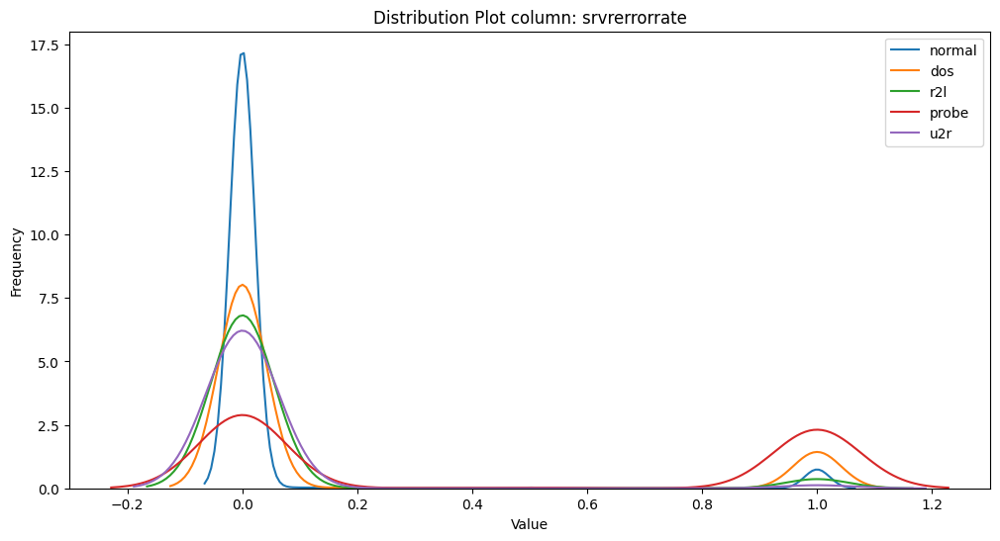

=============== samesrvrate-target_attacks ================
                   count      mean       std   min   25%   50%   75%  max
target_attacks                                                          
dos             45927.0  0.191887  0.299931  0.00  0.04  0.07  0.15  1.0
normal          67343.0  0.969360  0.144371  0.00  1.00  1.00  1.00  1.0
probe           11656.0  0.697196  0.431074  0.00  0.13  1.00  1.00  1.0
r2l               995.0  0.996653  0.040092  0.50  1.00  1.00  1.00  1.0
u2r                52.0  0.931538  0.216382  0.01  1.00  1.00  1.00  1.0




<Figure size 800x600 with 0 Axes>

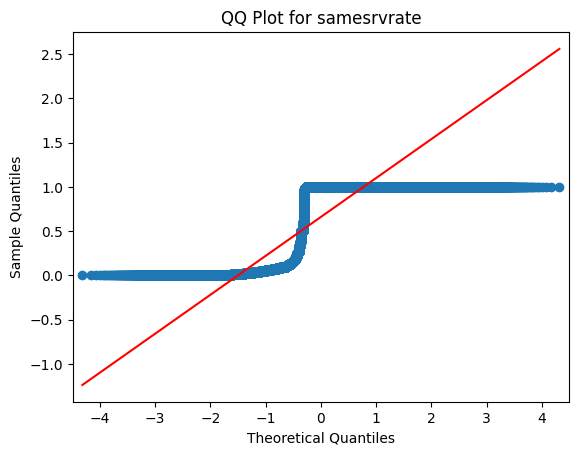

samesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the samesrvrate across the groups in target_attacks (Kruskal-Wallis).


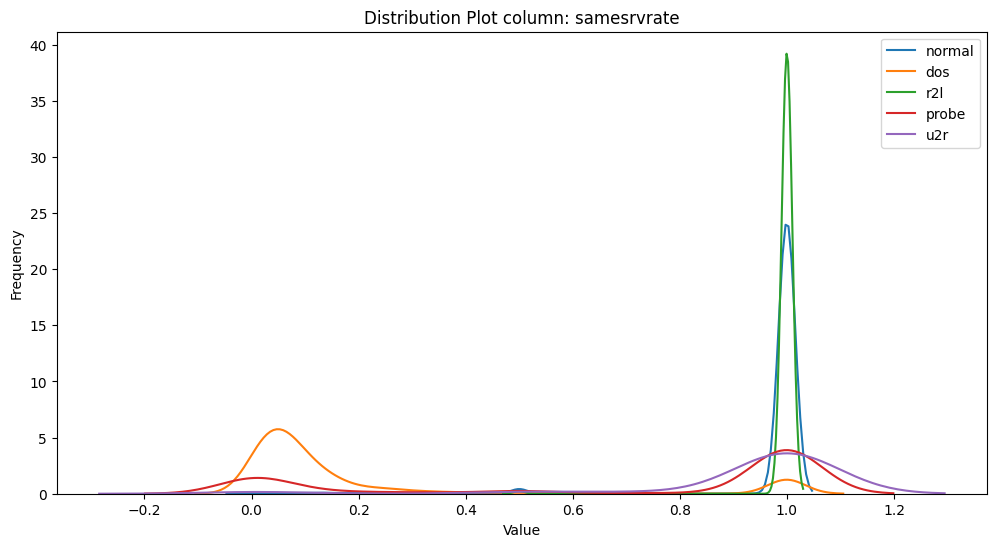

=============== diffsrvrate-target_attacks ================
                   count      mean       std  min   25%   50%   75%  max
target_attacks                                                         
dos             45927.0  0.065403  0.064023  0.0  0.05  0.06  0.07  1.0
normal          67343.0  0.028788  0.145622  0.0  0.00  0.00  0.00  1.0
probe           11656.0  0.256567  0.409204  0.0  0.00  0.00  0.52  1.0
r2l               995.0  0.006704  0.080267  0.0  0.00  0.00  0.00  1.0
u2r                52.0  0.063654  0.221324  0.0  0.00  0.00  0.00  1.0




<Figure size 800x600 with 0 Axes>

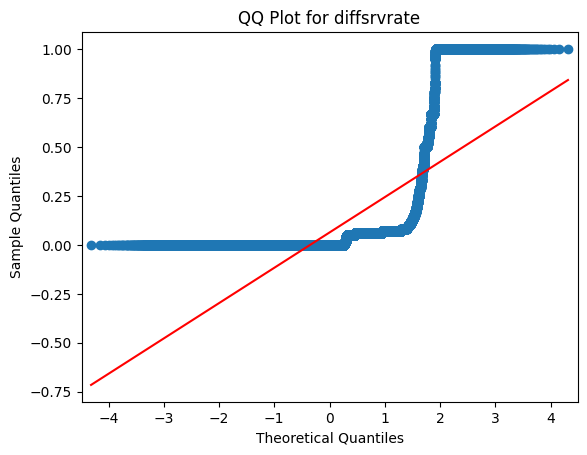

diffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the diffsrvrate across the groups in target_attacks (Kruskal-Wallis).


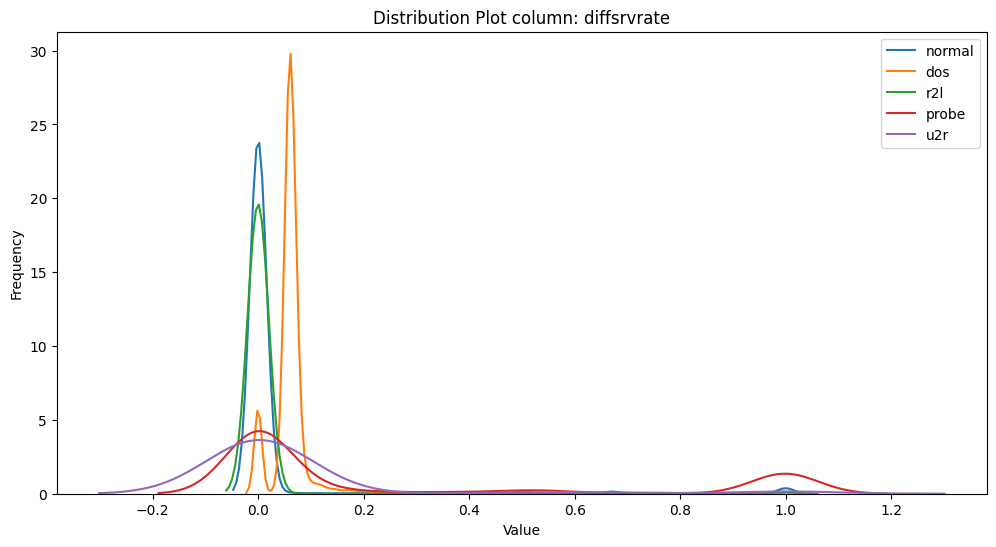

=============== srvdiffhostrate-target_attacks ================
                   count      mean       std  min  25%  50%   75%  max
target_attacks                                                       
dos             45927.0  0.005317  0.056390  0.0  0.0  0.0  0.00  1.0
normal          67343.0  0.126263  0.271621  0.0  0.0  0.0  0.11  1.0
probe           11656.0  0.299903  0.458085  0.0  0.0  0.0  1.00  1.0
r2l               995.0  0.017156  0.119145  0.0  0.0  0.0  0.00  1.0
u2r                52.0  0.000000  0.000000  0.0  0.0  0.0  0.00  0.0




<Figure size 800x600 with 0 Axes>

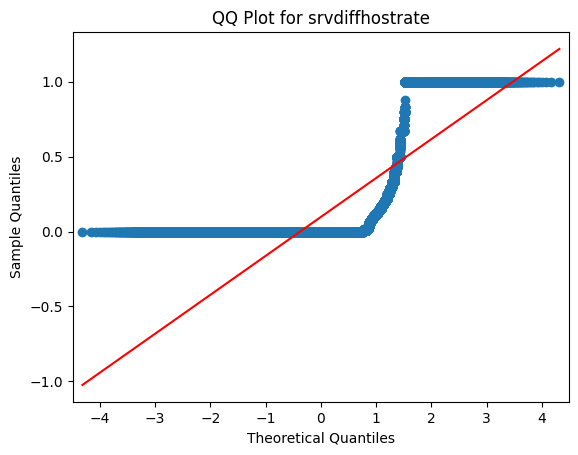

srvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvdiffhostrate across the groups in target_attacks (Kruskal-Wallis).


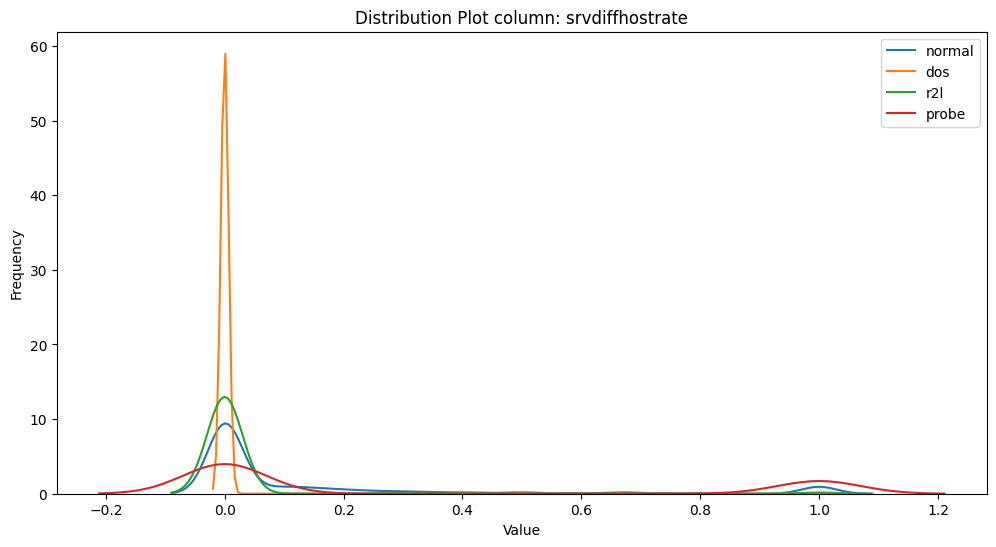

=============== dsthostcount-target_attacks ================
                   count        mean         std  min    25%    50%     75%  \
target_attacks                                                               
dos             45927.0  244.600475   41.324475  1.0  255.0  255.0  255.00   
normal          67343.0  147.431923  101.785400  0.0   40.0  156.0  255.00   
probe           11656.0  145.204101  118.987776  1.0    2.0  239.0  255.00   
r2l               995.0   89.037186  111.873652  1.0    4.0   10.0  248.50   
u2r                52.0   47.769231   96.192131  1.0    1.0    2.5    7.25   

                  max  
target_attacks         
dos             255.0  
normal          255.0  
probe           255.0  
r2l             255.0  
u2r             255.0  




<Figure size 800x600 with 0 Axes>

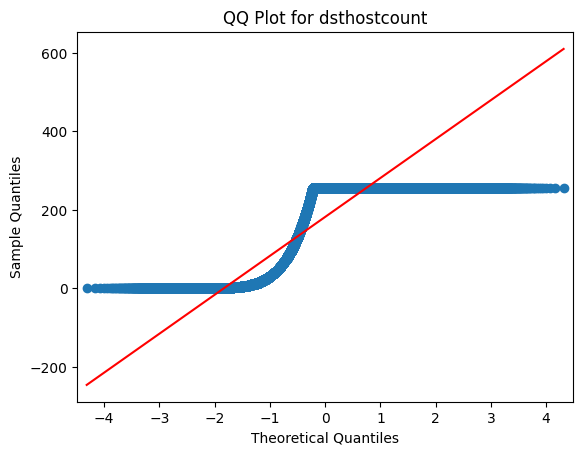

dsthostcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostcount across the groups in target_attacks (Kruskal-Wallis).


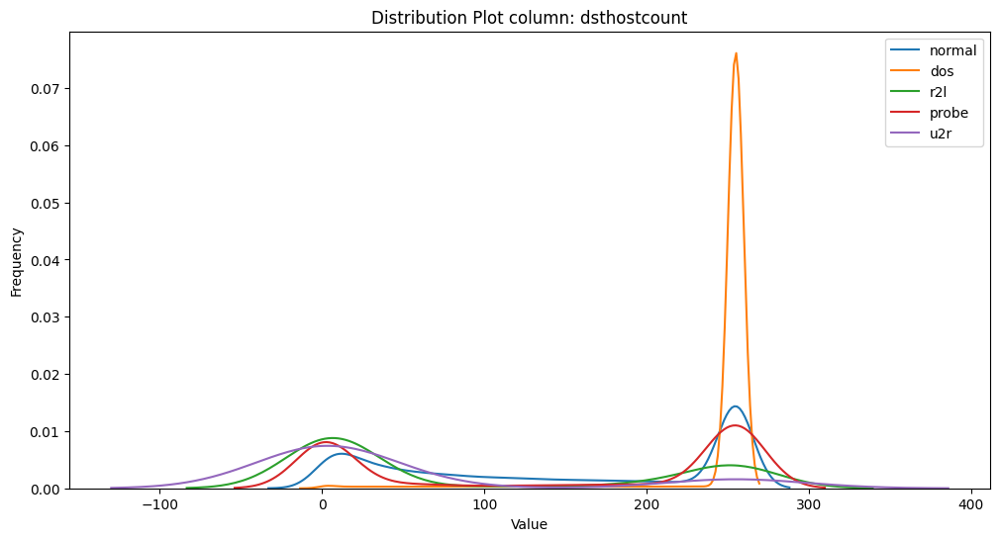

=============== dsthostsrvcount-target_attacks ================
                   count        mean        std  min    25%    50%     75%  \
target_attacks                                                              
dos             45927.0   26.524005  48.303117  1.0    6.0   13.0   20.00   
normal          67343.0  190.285761  92.608377  0.0  121.0  255.0  255.00   
probe           11656.0   42.367193  65.081759  1.0    1.0    2.0   66.00   
r2l               995.0   42.440201  35.377004  1.0   18.0   35.0   51.00   
u2r                52.0    9.884615  21.933638  1.0    1.0    2.5    4.25   

                  max  
target_attacks         
dos             255.0  
normal          255.0  
probe           255.0  
r2l             255.0  
u2r              84.0  




<Figure size 800x600 with 0 Axes>

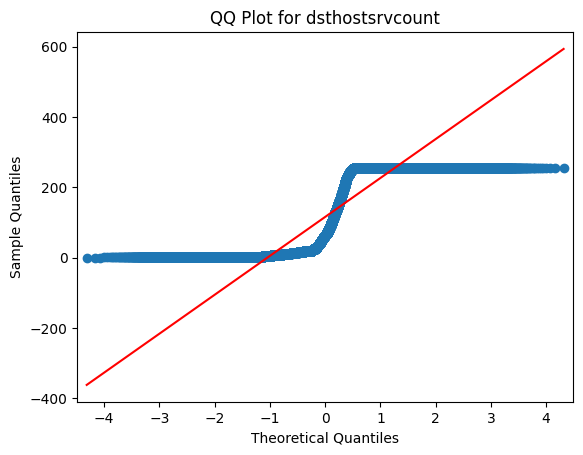

dsthostsrvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvcount across the groups in target_attacks (Kruskal-Wallis).


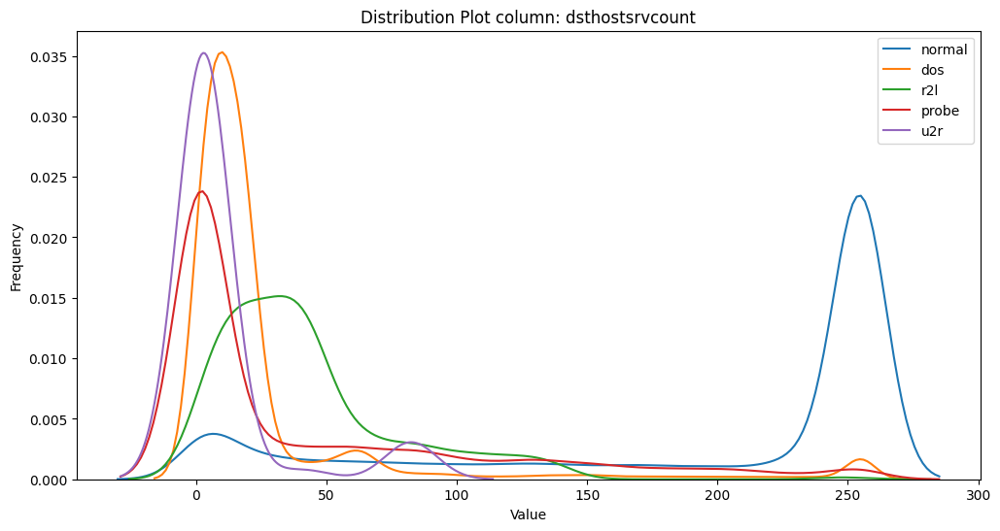

=============== dsthostsamesrvrate-target_attacks ================
                   count      mean       std  min     25%   50%   75%  max
target_attacks                                                           
dos             45927.0  0.123423  0.228287  0.0  0.0200  0.05  0.08  1.0
normal          67343.0  0.811875  0.324091  0.0  0.7500  1.00  1.00  1.0
probe           11656.0  0.390825  0.470884  0.0  0.0000  0.02  1.00  1.0
r2l               995.0  0.727377  0.362322  0.0  0.3500  1.00  1.00  1.0
u2r                52.0  0.781154  0.399581  0.0  0.9175  1.00  1.00  1.0




<Figure size 800x600 with 0 Axes>

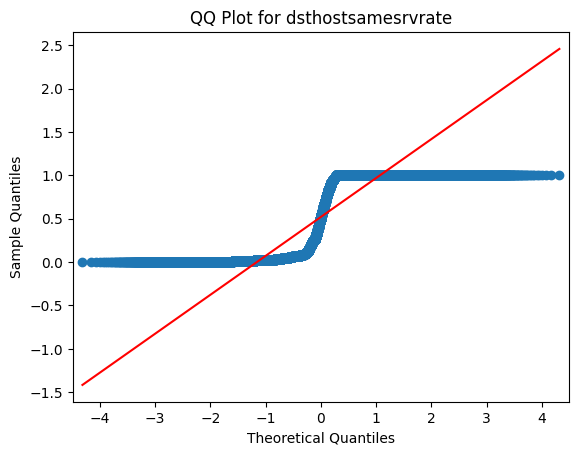

dsthostsamesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrvrate across the groups in target_attacks (Kruskal-Wallis).


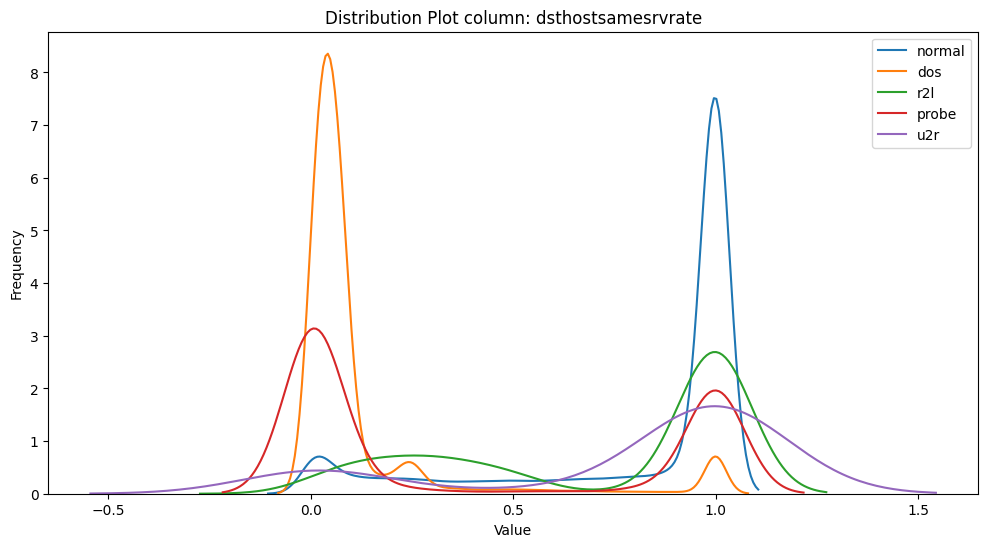

=============== dsthostdiffsrvrate-target_attacks ================
                   count      mean       std  min   25%   50%     75%   max
target_attacks                                                            
dos             45927.0  0.066333  0.058079  0.0  0.05  0.07  0.0700  1.00
normal          67343.0  0.040134  0.128529  0.0  0.00  0.00  0.0200  1.00
probe           11656.0  0.401263  0.403968  0.0  0.00  0.27  0.7900  1.00
r2l               995.0  0.021307  0.068157  0.0  0.00  0.00  0.0200  1.00
u2r                52.0  0.040000  0.146609  0.0  0.00  0.00  0.0025  0.75




<Figure size 800x600 with 0 Axes>

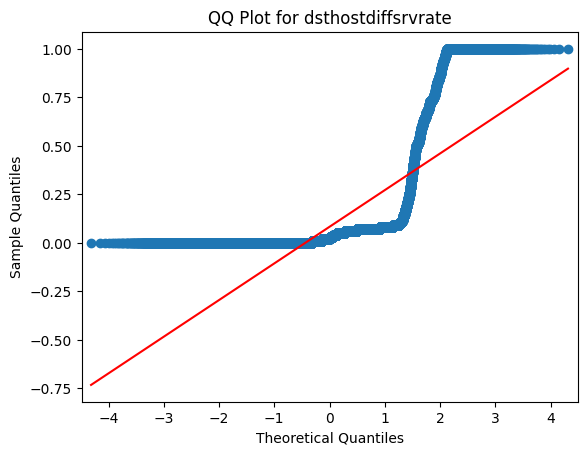

dsthostdiffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostdiffsrvrate across the groups in target_attacks (Kruskal-Wallis).


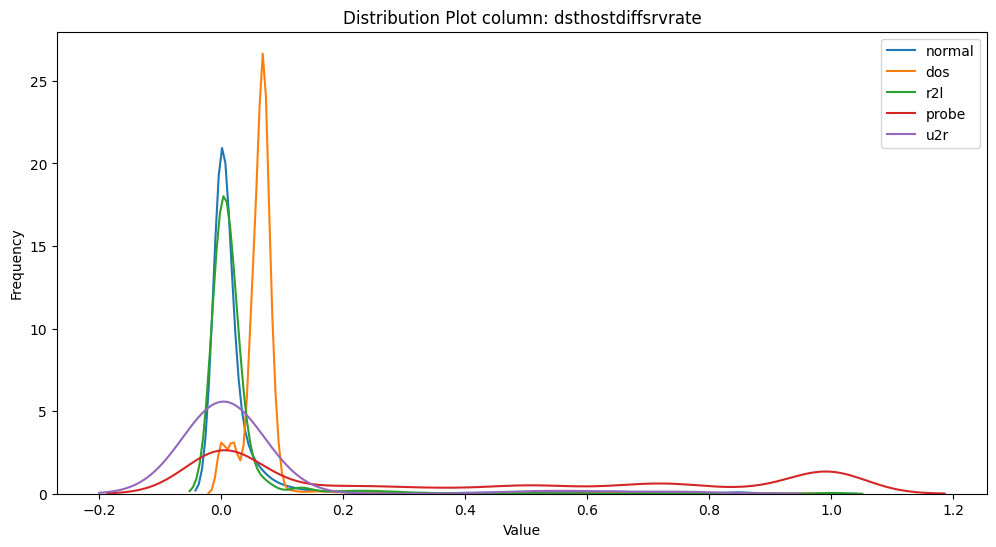

=============== dsthostsamesrcportrate-target_attacks ================
                   count      mean       std  min    25%   50%   75%  max
target_attacks                                                          
dos             45927.0  0.049492  0.188947  0.0  0.000  0.00  0.00  1.0
normal          67343.0  0.121726  0.254382  0.0  0.000  0.01  0.08  1.0
probe           11656.0  0.651840  0.428221  0.0  0.110  1.00  1.00  1.0
r2l               995.0  0.596915  0.473668  0.0  0.000  1.00  1.00  1.0
u2r                52.0  0.568269  0.428988  0.0  0.135  0.50  1.00  1.0




<Figure size 800x600 with 0 Axes>

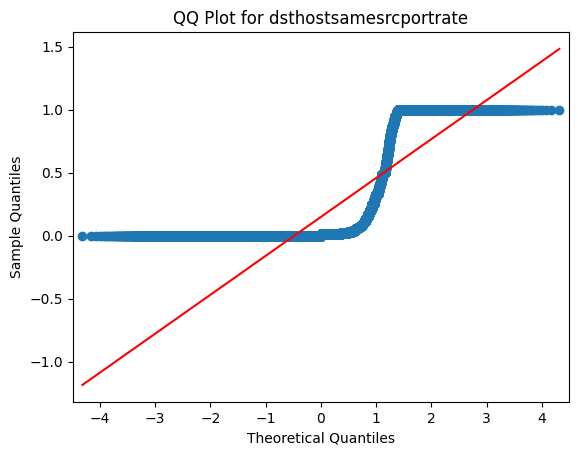

dsthostsamesrcportrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrcportrate across the groups in target_attacks (Kruskal-Wallis).


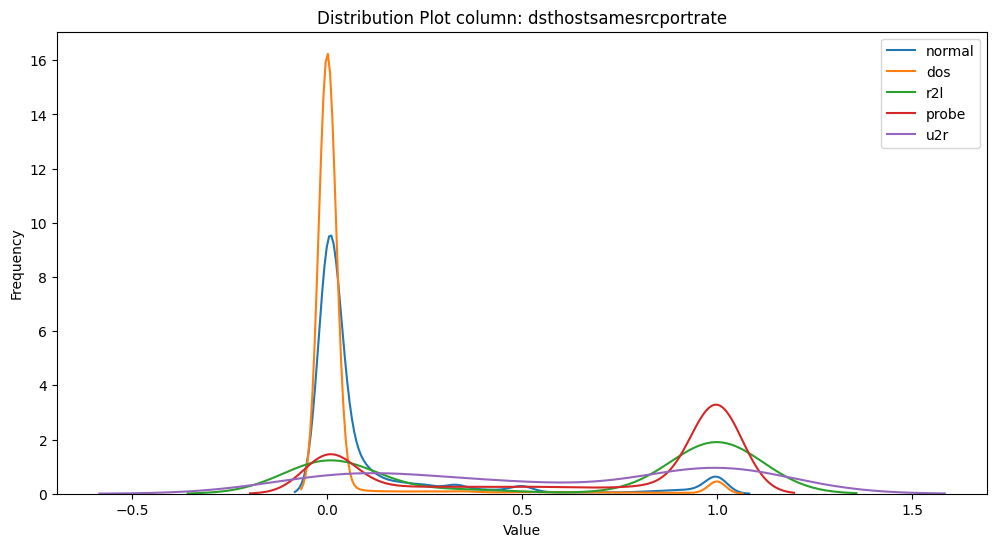

=============== dsthostsrvdiffhostrate-target_attacks ================
                   count      mean       std  min  25%   50%    75%  max
target_attacks                                                         
dos             45927.0  0.001647  0.026454  0.0  0.0  0.00  0.000  1.0
normal          67343.0  0.025996  0.068807  0.0  0.0  0.00  0.030  1.0
probe           11656.0  0.187343  0.278282  0.0  0.0  0.00  0.500  1.0
r2l               995.0  0.085739  0.106648  0.0  0.0  0.07  0.145  1.0
u2r                52.0  0.081154  0.213143  0.0  0.0  0.00  0.000  1.0




<Figure size 800x600 with 0 Axes>

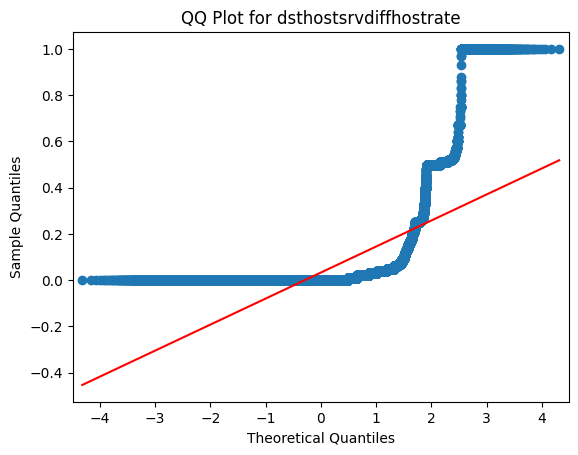

dsthostsrvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvdiffhostrate across the groups in target_attacks (Kruskal-Wallis).


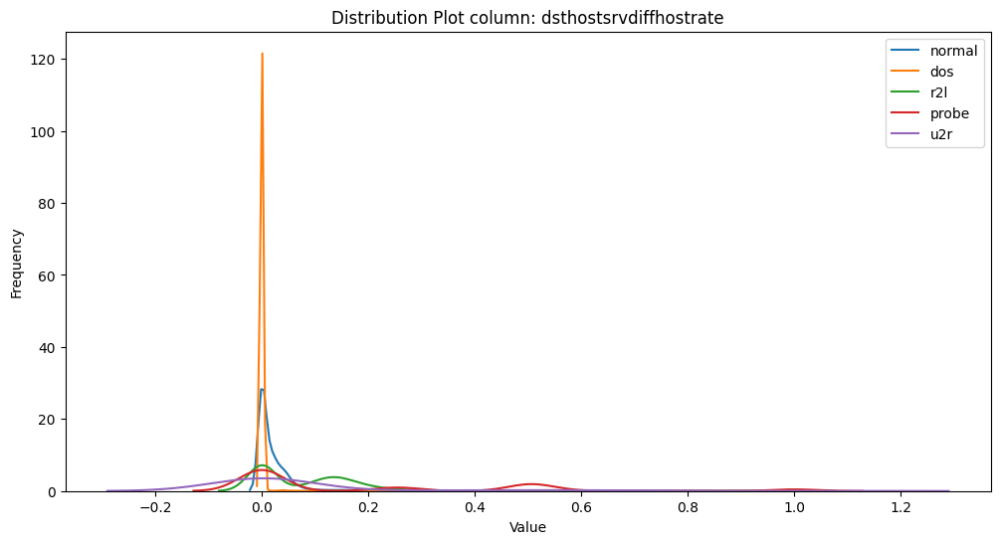

=============== dsthostserrorrate-target_attacks ================
                   count      mean       std  min   25%  50%   75%  max
target_attacks                                                        
dos             45927.0  0.747922  0.431707  0.0  0.18  1.0  1.00  1.0
normal          67343.0  0.013930  0.092006  0.0  0.00  0.0  0.00  1.0
probe           11656.0  0.044757  0.146004  0.0  0.00  0.0  0.01  1.0
r2l               995.0  0.023849  0.092599  0.0  0.00  0.0  0.00  1.0
u2r                52.0  0.000000  0.000000  0.0  0.00  0.0  0.00  0.0




<Figure size 800x600 with 0 Axes>

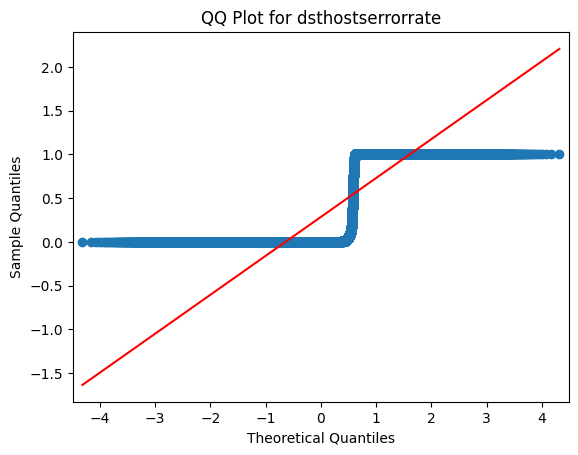

dsthostserrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostserrorrate across the groups in target_attacks (Kruskal-Wallis).


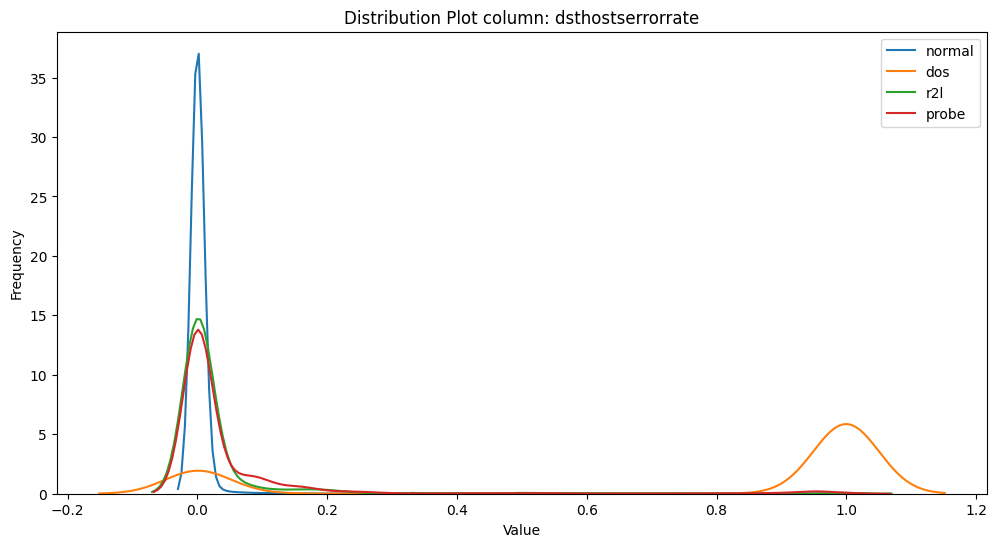

=============== dsthostsrvserrorrate-target_attacks ================
                   count      mean       std  min   25%  50%  75%   max
target_attacks                                                        
dos             45927.0  0.744434  0.434512  0.0  0.01  1.0  1.0  1.00
normal          67343.0  0.006116  0.056724  0.0  0.00  0.0  0.0  1.00
probe           11656.0  0.039799  0.190385  0.0  0.00  0.0  0.0  1.00
r2l               995.0  0.015960  0.084831  0.0  0.00  0.0  0.0  1.00
u2r                52.0  0.004808  0.034669  0.0  0.00  0.0  0.0  0.25




<Figure size 800x600 with 0 Axes>

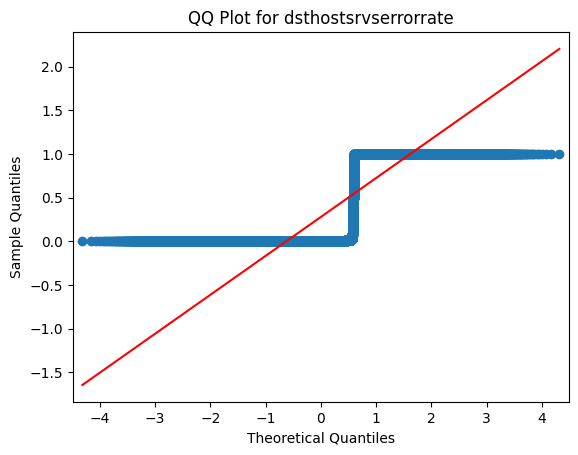

dsthostsrvserrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvserrorrate across the groups in target_attacks (Kruskal-Wallis).


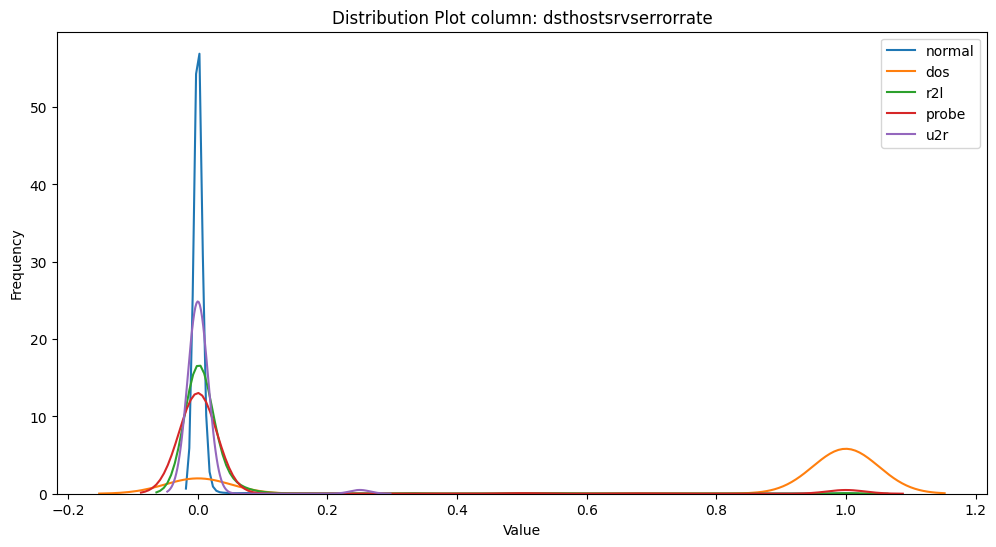

=============== dsthostrerrorrate-target_attacks ================
                   count      mean       std  min  25%   50%   75%   max
target_attacks                                                         
dos             45927.0  0.157569  0.358934  0.0  0.0  0.00  0.00  1.00
normal          67343.0  0.046589  0.195306  0.0  0.0  0.00  0.00  1.00
probe           11656.0  0.389717  0.417415  0.0  0.0  0.19  0.88  1.00
r2l               995.0  0.051116  0.202356  0.0  0.0  0.00  0.00  0.96
u2r                52.0  0.039615  0.140893  0.0  0.0  0.00  0.00  0.73




<Figure size 800x600 with 0 Axes>

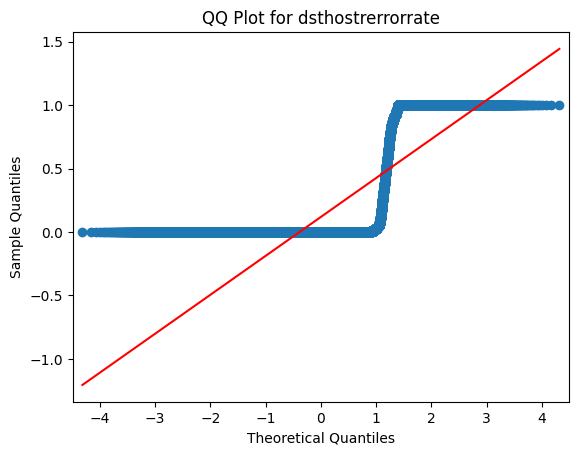

dsthostrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostrerrorrate across the groups in target_attacks (Kruskal-Wallis).


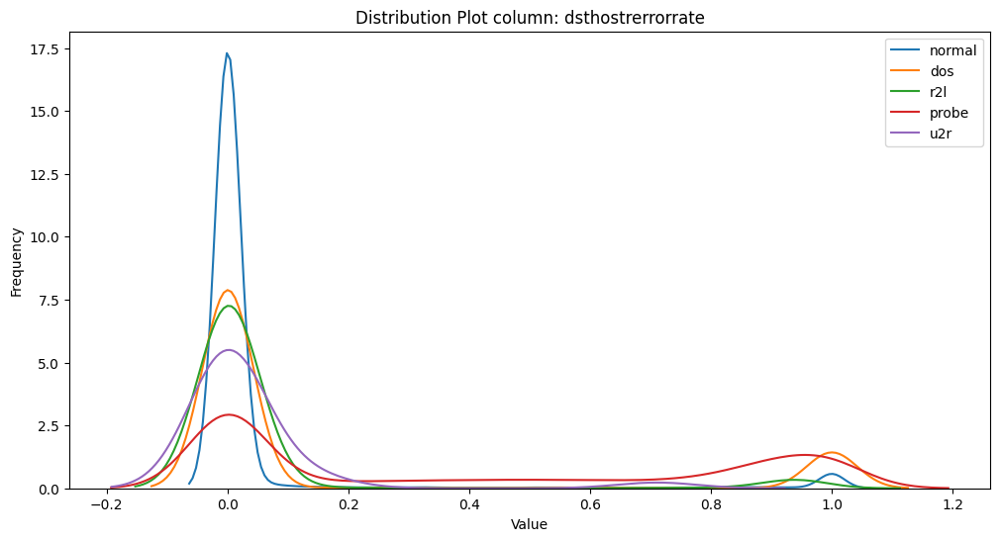

=============== dsthostsrvrerrorrate-target_attacks ================
                   count      mean       std  min  25%  50%  75%   max
target_attacks                                                       
dos             45927.0  0.151286  0.356946  0.0  0.0  0.0  0.0  1.00
normal          67343.0  0.044698  0.192188  0.0  0.0  0.0  0.0  1.00
probe           11656.0  0.441030  0.493846  0.0  0.0  0.0  1.0  1.00
r2l               995.0  0.047367  0.202389  0.0  0.0  0.0  0.0  0.96
u2r                52.0  0.019038  0.052141  0.0  0.0  0.0  0.0  0.25




<Figure size 800x600 with 0 Axes>

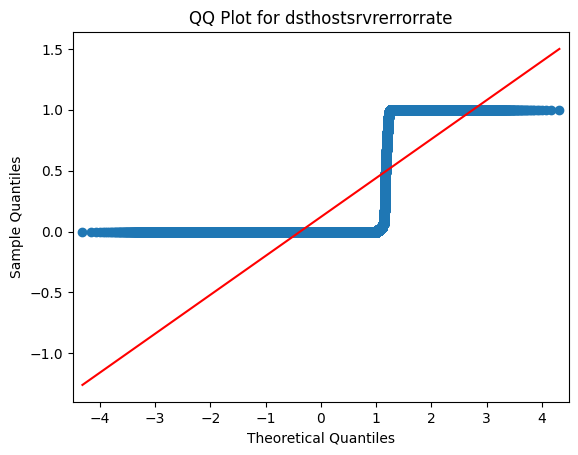

dsthostsrvrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvrerrorrate across the groups in target_attacks (Kruskal-Wallis).


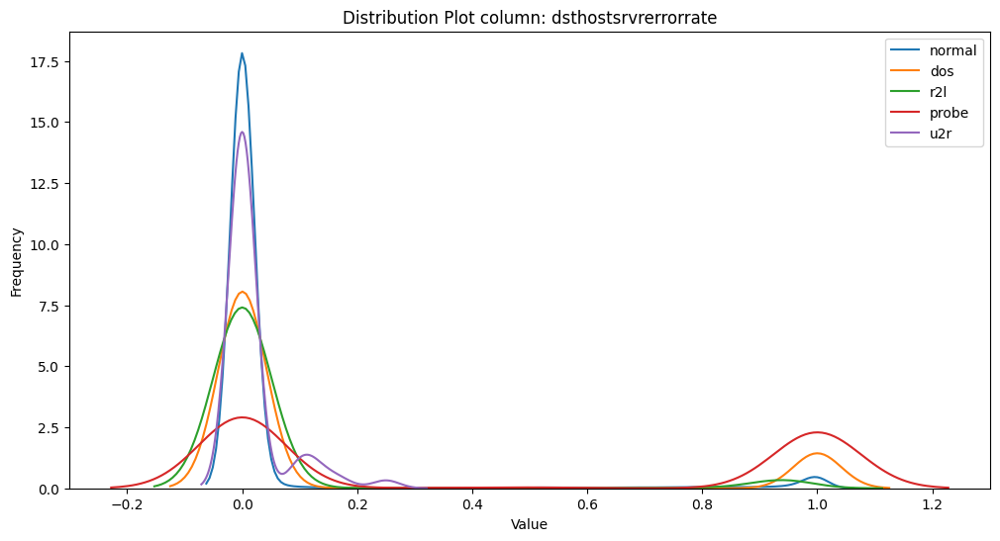

In [8]:

from scipy import stats 
import statsmodels.api as sm
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
import seaborn as sns

target_var='target_attacks'


def anova_lm_test(data, col, tar):
    # Perform ANOVA (Analysis of Variance)
    formula = f'{col} ~ C({tar})'
    model = smf.ols(formula, data=data).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)

    print(anova_table)

    p_value = anova_table["PR(>F)"][0]
    ff=anova_table["F"][0]
    if p_value < 0.05:
        print(f'There is a statistically significant difference between the mean {col} across the groups in {tar}.')
        return ff,1
    else:
        print('There is no sufficient evidence of a significant difference between the means across the groups.')
        return 0,0
    
def anova_kruskal_test(data, col, tar):
    """
    Perform normality check and appropriate test (ANOVA or Kruskal-Wallis) for mean difference.
    
    """
    
    # Step 1: Check normality with Shapiro-Wilk test and QQ plot
    shapiro_stat, shapiro_p_value = stats.shapiro(data[col].dropna())
    plt.figure(figsize=(8, 6))
    sm.qqplot(data[col], line="s")
    plt.title(f"QQ Plot for {col}")
    plt.show()
    
    if shapiro_p_value >= 0.05:
        # Normal distribution: Perform ANOVA
        print(f"{col} appears normally distributed (p = {shapiro_p_value:.4f}), proceeding with ANOVA.")
        formula = f'{col} ~ C({tar})'
        model = smf.ols(formula, data=data).fit()
        anova_table = sm.stats.anova_lm(model, typ=2)

        print(anova_table)

        p_value = anova_table["PR(>F)"][0]
        f_statistic = anova_table["F"][0]
        if p_value < 0.05:
            print(f'There is a statistically significant difference between the mean {col} across the groups in {tar}.')
            return f_statistic, 1
        else:
            print('There is no sufficient evidence of a significant difference between the means across the groups.')
            return 0, 0
    else:
        # Non-normal distribution: Perform Kruskal-Wallis test
        print(f"{col} does not appear normally distributed (p = {shapiro_p_value:.4f}), proceeding with Kruskal-Wallis test.")
        groups = [data[data[tar] == group][col].dropna() for group in data[tar].unique()]
        kw_stat, kw_p_value = stats.kruskal(*groups)
        
        if kw_p_value < 0.05:
            print(f'There is a statistically significant difference in the {col} across the groups in {tar} (Kruskal-Wallis).')
            return kw_stat, 1
        else:
            print('There is no sufficient evidence of a significant difference between the medians across the groups.')
            return 0, 0


def cat_chi2test(data,col,tar):

    contingency_table=pd.crosstab(data[tar],data[col])
    print(contingency_table)

    chi2,p,dof,expected=stats.chi2_contingency(contingency_table)
    print('chi2: {} with p_value: {}'.format(chi2,p))
    if p<0.05:
        print('There is a statistically significant association between {} and {}.'.format(col,tar))
        return chi2,1
    else:
        print('There is no sufficient evidence of a significant association between {} and {}.'.format(col,tar))
        return 0,0

def dist_cat_plot(d1,cols,tar):
    for col in cols:
        plt.figure(figsize=(12, 6))

        for label in d1[tar].unique():

            sns.histplot(d1.loc[d1[tar]==label,col], label='{}'.format(label), palette='viridis', multiple='dodge', shrink=0.8)

        plt.title('Distribution Plot column: {}'.format(col))
        plt.xlabel('Value')
        plt.ylabel('Frequency')
        plt.legend()

        # Show plot
        plt.show()

def dist_plot(d1,cols,tar):
    for col in cols:
        plt.figure(figsize=(12, 6))

        for label in d1[tar].unique():
            sns.kdeplot(d1.loc[d1[tar]==label,col], label='{}'.format(label), palette='viridis')  #kde=True,

        plt.title('Distribution Plot column: {}'.format(col))
        plt.xlabel('Value')
        plt.ylabel('Frequency')
        plt.legend()

        # Show plot
        plt.show()

chi2_df1=pd.DataFrame([[0]]*len(categorical_vars),index=categorical_vars,columns=[target_var])
for col in range(len(categorical_vars)):

    print('=============== {}-{} ================\n'.format(categorical_vars[col],target_var))
    print('\n')
    chi2_df1.loc[categorical_vars[col],target_var],f=cat_chi2test(df,categorical_vars[col],target_var)
    dist_cat_plot(df,[categorical_vars[col]],target_var)

anova_df1=pd.DataFrame([[0]]*len(numerical_vars),index=numerical_vars,columns=[target_var])
for col in numerical_vars:
    print('=============== {}-{} ================\n'.format(col,target_var),df.groupby([target_var])[col].describe())
    print('\n')
    anova_df1.loc[col,target_var],f=anova_kruskal_test(df,col,target_var)
    dist_plot(df,[col],target_var)

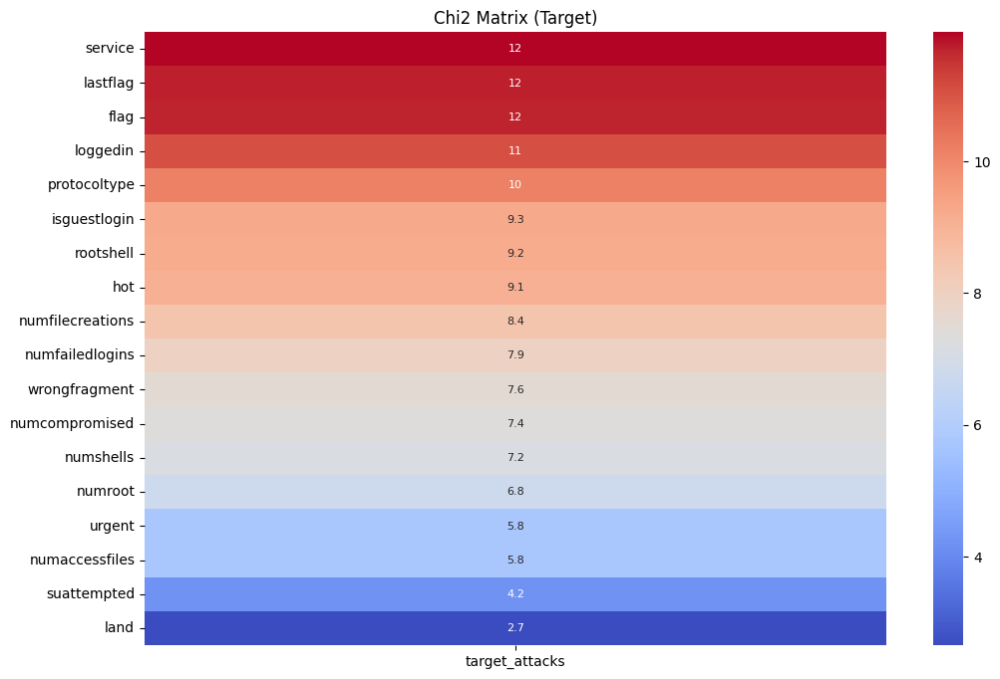

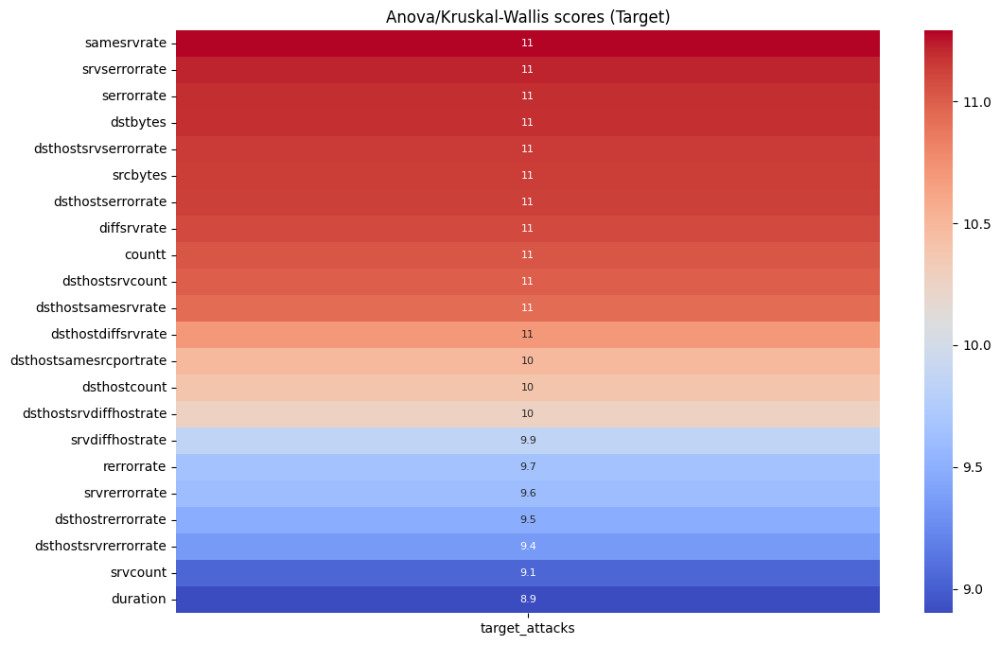

Index(['service', 'lastflag', 'flag', 'samesrvrate', 'srvserrorrate',
       'serrorrate', 'dstbytes', 'dsthostsrvserrorrate', 'srcbytes',
       'dsthostserrorrate', 'diffsrvrate', 'loggedin', 'countt',
       'dsthostsrvcount', 'dsthostsamesrvrate', 'dsthostdiffsrvrate',
       'dsthostsamesrcportrate', 'dsthostcount', 'dsthostsrvdiffhostrate',
       'protocoltype', 'srvdiffhostrate', 'rerrorrate', 'srvrerrorrate',
       'dsthostrerrorrate', 'dsthostsrvrerrorrate', 'isguestlogin',
       'rootshell', 'hot', 'srvcount', 'duration', 'numfilecreations',
       'numfailedlogins', 'wrongfragment', 'numcompromised', 'numshells',
       'numroot', 'urgent', 'numaccessfiles', 'suattempted', 'land'],
      dtype='object')

In [9]:
plt.figure(figsize=(12,8))
sns.heatmap(np.log(chi2_df1.sort_values(target_var,ascending=False)),annot=True,cmap='coolwarm',annot_kws={'size':8})
plt.title('Chi2 Matrix (Target)')
plt.show()

##  target related to service, lastflag, flag, loggedin, protocoltype

plt.figure(figsize=(12,8))
sns.heatmap(np.log(anova_df1.sort_values(target_var,ascending=False)),annot=True,cmap='coolwarm',annot_kws={'size':8})
plt.title('Anova/Kruskal-Wallis scores (Target)')
plt.show()

#### further analysing features with most correlation/scores

important_features=pd.concat([np.log(chi2_df1.sort_values(target_var,ascending=False))
           ,np.log(anova_df1.sort_values(target_var,ascending=False))],axis=0).sort_values(target_var,ascending=False).index

important_features  ##sorted based on importance

In [10]:
def check_high_correlated_vars1(rr):
    r=rr.copy()
    r['dist']=''
    for idx,row in rr.iterrows():
        k1=(100*rr.loc[idx,rr.columns]/(rr.loc[idx,rr.columns].sum()+0.00001)).sort_values(ascending=False).reset_index()
        k2=(100*rr.loc[idx,rr.columns].divide((rr.sum(axis=0)+0.00001))).reset_index()
        k1=k1.merge(k2,how='left',on=[k2.columns[0]])
        
        top_k1 = k1.iloc[:5, :]
        
        # Check if the 5th value in k1 equals 100%
        if top_k1.iloc[-1, 1] == 100.0:
            # Continue adding rows until k1 value is less than 100%
            for i in range(5, len(k1)):
                if k1.iloc[i, 1] < 100.0:
                    break
                top_k1 = top_k1.append(k1.iloc[i, :])

        # Join values for the dist column
        r.loc[idx, 'dist'] = ','.join(
            top_k1.iloc[:, 0].astype(str) + '(' +
            top_k1.iloc[:, 1].astype(float).round(2).astype(str) + '%, ' +
            top_k1.iloc[:, 2].astype(float).round(2).astype(str) + '%)'
        )

    print(r[['dist']])
    
def check_high_correlated_vars2(rr):
    r=rr.copy()
    r['dist']=''
    for idx,row in rr.iterrows():
        k1=(100*rr.loc[idx,rr.columns]/(rr.loc[idx,rr.columns].sum()+0.00001)).reset_index()
        k2=(100*rr.loc[idx,rr.columns].divide((rr.sum(axis=0)+0.00001))).sort_values(ascending=False).reset_index()
        k1=k2.merge(k1,how='left',on=[k1.columns[0]])
        
        top_k1 = k1.iloc[:5, :]
        
        # Check if the 5th value in k1 equals 100%
        if top_k1.iloc[-1, 1] == 100.0:
            # Continue adding rows until k1 value is less than 100%
            for i in range(5, len(k1)):
                if k1.iloc[i, 1] < 100.0:
                    break
                top_k1 = top_k1.append(k1.iloc[i, :])

        # Join values for the dist column
        r.loc[idx, 'dist'] = ','.join(
            top_k1.iloc[:, 0].astype(str) + '(' +
            top_k1.iloc[:, 2].astype(float).round(2).astype(str) + '%, ' +
            top_k1.iloc[:, 1].astype(float).round(2).astype(str) + '%)'
        )

    print(r[['dist']])
    
    
check_high_correlated_vars1(pd.crosstab(df[target_var],df['service']))

check_high_correlated_vars2(pd.crosstab(df[target_var],df['service']))

#(% services are certain attack, %attacks experienced in particular service)

#dos: (majority services with dos attacks) private, ecr_i,..
#dos: (services which are clearly dos specific) courier,nnsp,z39_50..

service                                                                                                                    dist
target_attacks                                                                                                                 
dos               private(34.77%, 73.08%),ecr_i(6.19%, 92.43%),http(4.91%, 5.59%),telnet(2.86%, 55.76%),ftp_data(2.63%, 17.62%)
normal             http(56.5%, 94.33%),domain_u(13.41%, 99.9%),smtp(10.44%, 96.12%),ftp_data(7.4%, 72.65%),other(3.87%, 59.74%)
probe           private(42.04%, 22.42%),eco_i(35.08%, 89.16%),other(14.49%, 38.75%),finger(0.46%, 3.06%),ftp_data(0.44%, 0.74%)
r2l                        ftp_data(60.7%, 8.8%),ftp(31.36%, 17.79%),telnet(5.73%, 2.42%),imap4(1.11%, 1.7%),other(0.5%, 0.11%)
u2r                  telnet(65.38%, 1.44%),ftp_data(23.08%, 0.17%),other(5.77%, 0.07%),ftp(5.77%, 0.17%),remote_job(0.0%, 0.0%)
service                                                                                                 

In [11]:
check_high_correlated_vars1(pd.crosstab(df[target_var],df['lastflag']))

check_high_correlated_vars2(pd.crosstab(df[target_var],df['lastflag']))

lastflag                                                                                                 dist
target_attacks                                                                                               
dos             21(28.91%, 21.23%),18(24.71%, 54.91%),20(23.66%, 56.19%),19(17.69%, 79.01%),15(1.35%, 15.49%)
normal           21(73.01%, 78.59%),18(10.51%, 34.24%),20(10.23%, 35.61%),19(2.63%, 17.24%),17(1.68%, 36.86%)
probe             15(26.42%, 77.17%),18(19.2%, 10.83%),16(14.87%, 72.42%),20(13.61%, 8.2%),17(13.54%, 51.33%)
r2l                11(16.68%, 25.9%),12(11.36%, 15.5%),10(10.15%, 39.92%),14(9.45%, 13.95%),13(8.94%, 19.73%)
u2r                       2(25.0%, 24.07%),1(17.31%, 14.52%),4(13.46%, 8.86%),5(7.69%, 4.94%),0(5.77%, 4.55%)
lastflag                                                                                                dist
target_attacks                                                                                              
dos         

In [12]:
check_high_correlated_vars1(pd.crosstab(df[target_var],df['flag']))

check_high_correlated_vars2(pd.crosstab(df[target_var],df['flag']))

flag                                                                                                      dist
target_attacks                                                                                                
dos             S0(74.78%, 98.55%),REJ(12.35%, 50.49%),SF(10.01%, 6.14%),RSTO(2.65%, 77.85%),RSTR(0.2%, 3.72%)
normal              SF(94.13%, 84.59%),REJ(4.0%, 23.97%),S1(0.54%, 98.9%),S0(0.53%, 1.02%),RSTO(0.33%, 14.02%)
probe             SF(51.19%, 7.96%),REJ(24.61%, 25.54%),RSTR(18.7%, 90.05%),SH(2.27%, 97.79%),S0(1.31%, 0.44%)
r2l                     SF(93.97%, 1.25%),RSTO(4.62%, 2.94%),RSTR(0.5%, 0.21%),SH(0.4%, 1.48%),S3(0.3%, 6.12%)
u2r                    SF(98.08%, 0.07%),RSTO(1.92%, 0.06%),OTH(0.0%, 0.0%),REJ(0.0%, 0.0%),RSTOS0(0.0%, 0.0%)
flag                                                                                                         dist
target_attacks                                                                                               

In [13]:
check_high_correlated_vars1(pd.crosstab(df[target_var],df['loggedin']))


loggedin                                     dist
target_attacks                                   
dos             0(97.92%, 59.08%),1(2.08%, 1.92%)
normal          1(71.06%, 96.0%),0(28.94%, 25.6%)
probe            0(99.29%, 15.2%),1(0.71%, 0.17%)
r2l              1(91.36%, 1.82%),0(8.64%, 0.11%)
u2r             1(88.46%, 0.09%),0(11.54%, 0.01%)


In [14]:
check_high_correlated_vars1(pd.crosstab(df[target_var],df['protocoltype']))


protocoltype                                                          dist
target_attacks                                                            
dos               tcp(91.86%, 41.08%),icmp(6.2%, 34.34%),udp(1.94%, 5.95%)
normal          tcp(79.59%, 52.2%),udp(18.46%, 82.93%),icmp(1.94%, 15.79%)
probe            tcp(50.25%, 5.7%),icmp(35.48%, 49.87%),udp(14.28%, 11.1%)
r2l                    tcp(100.0%, 0.97%),icmp(0.0%, 0.0%),udp(0.0%, 0.0%)
u2r                  tcp(94.23%, 0.05%),udp(5.77%, 0.02%),icmp(0.0%, 0.0%)


### samesrvrate

1. Normal connections almost always reuse the same service (e.g., consistently browsing with HTTP), indicating stable, legitimate behavior.
2. DoS attacks tend to switch between services, which aligns with the goal of overwhelming multiple services or system resources.
3. Probe attacks involve scanning multiple services, but there is variability, suggesting different scanning techniques across sessions.
4. R2L and U2R attacks focus on exploiting vulnerabilities within a single service, making the samesrvrate high for these types of attacks.

### dsthostsrvserrorrate

1. DoS attacks have a very high service error rate at the destination host, reflecting the goal of overwhelming services and causing failures.
2. Normal connections have a near-zero error rate, indicating stable and successful use of services.
3. Probe attacks experience slightly higher error rates than normal traffic due to the exploratory nature of probing multiple services, but there's significant variability based on the aggressiveness of the probes.
4. R2L and U2R attacks have low error rates, indicating that these attacks focus on specific services or vulnerabilities that tend to succeed or fail consistently. However, R2L shows slightly higher variability than U2R.

### dsthostserrorrate

1. DoS attacks have the highest error rate at the destination host, with a mean close to 0.75. This is a clear indication of the disruptive nature of these attacks, which aim to cause service failures.
2. Normal connections have a near-zero error rate, as expected for legitimate traffic.
3. Probe and R2L attacks show slightly elevated error rates compared to normal traffic, likely due to the exploratory nature of probe attacks and the targeted vulnerabilities in R2L attacks.
4. U2R attacks result in no errors, suggesting that they are precise and focused on escalating privileges without generating service disruptions.

### serrorrate

1. DoS attacks have the highest serrorrate, with a mean of 0.748. This indicates that service failures are a significant characteristic of DoS attacks, making this feature highly useful for detecting them.
2. Normal traffic and R2L attacks both have very low serrorrate, close to 0, meaning legitimate connections and certain types of targeted attacks tend to generate few service errors.
3. Probe attacks show slightly elevated serrorrate compared to normal traffic, reflecting the nature of probing activities, which may intermittently cause errors.
4. U2R attacks have a low but somewhat variable serrorrate, indicating that service errors are not a common feature of these attacks, but they do occur in some cases.

### srvserrorrate

1. DoS attacks have the highest srvserrorrate, indicating that these attacks frequently cause service errors on the same host. This feature is highly indicative of a DoS attack.
2. Normal connections and R2L attacks have very low srvserrorrate, close to 0. This shows that service errors are rarely encountered in normal operations or R2L attacks.
3. Probe attacks have a slightly elevated srvserrorrate, reflecting their tendency to occasionally cause service failures, but typically not to the extent of DoS attacks.
4. U2R attacks have no srvserrorrate, further reinforcing the idea that these attacks are focused on privilege escalation rather than causing service disruptions.

### dsthostsrvcount

1. Normal connections have the highest dsthostsrvcount, with a mean of 190, and a large portion of normal traffic reaching up to 255 connections. This indicates a large number of service requests during normal operations.
2. DoS attacks have a moderate dsthostsrvcount (mean: 26.52), suggesting that while DoS attacks attempt to overload a service, they don't always result in a high count of service requests.
3. Probe and R2L attacks have a similar dsthostsrvcount (mean: ~42), indicating a moderate level of interaction with the same service during these attacks, which makes sense given the scanning (probe) and access-gaining (R2L) nature of these attacks.
4. U2R attacks have the lowest dsthostsrvcount, as they are focused on privilege escalation rather than making a large number of service requests.

### dsthostsamesrvrate

1. Normal connections, R2L attacks, and U2R attacks tend to have high dsthostsamesrvrate values, meaning they focus on a single server in the destination host. This is typical of normal traffic and certain attacks that target a specific server for exploitation.
2. DoS attacks have a low dsthostsamesrvrate, indicating they are more distributed across servers, as they aim to overwhelm the system rather than focusing on a single service.
3. Probe attacks have a moderate dsthostsamesrvrate, with high variability, reflecting the fact that they scan multiple servers or services for vulnerabilities but can sometimes focus on a single server.


### services

General Insights:
1. DoS and Probe attacks are strongly associated with certain specific services, which can serve as key identifiers. For example, services like ecr_i and courier are indicative of DoS attacks.

2. Probe attacks have a few services (pm_dump, http_8001) that appear exclusively, making them good indicators of scanning activities.

3. Normal traffic heavily relies on popular services like http and domain_u, while rare services like ntp_u and urh_i are exclusive to it.

4. R2L and U2R attacks mostly target ftp_data, ftp, and telnet services, though these services are also exploited in other types of attacks.

Security Implication:

1. Monitoring rare services that are specific to certain attacks (e.g., pm_dump, http_8001, courier) can be an effective strategy in identifying attack types early.
2. Common services like ftp_data, telnet, and private need special attention since they are targeted across multiple attack types, indicating vulnerability.


### lastflag
General Insights:
1. DoS and Probe attacks: Highly specific flags are linked to these types, such as 19 and 15, which are rarely seen in other attack categories.

2. Normal traffic: Dominated by the 21 flag, but this flag also shows up in DoS, indicating less specificity in distinguishing normal traffic from some types of attacks.

3. R2L and U2R attacks: Show distinct flag usage, with 0 and 3 in R2L and 2 and 1 in U2R being indicative of these attack types. Monitoring these flags can help in identifying such intrusions early.

4. Flag-specific attacks: Certain flags are almost exclusive to specific attacks (e.g., 19 for DoS, 0 for R2L), making them useful markers in anomaly detection.

Security Implication:

1. Highly specific flags like 19 for DoS and 15 for probe attacks can be effective in identifying attacks when monitoring network traffic.
2. Common flags such as 21 in normal traffic need careful consideration since they also appear in attacks like DoS, requiring additional analysis to avoid false positives.

### flag
General Insights:
1. DoS and Probe attacks: Specific flags such as S0 and RSTOS0 are strong indicators of DoS and probe attacks, respectively.

2. Normal traffic: Dominated by the SF flag but the S1 flag is highly specific to normal traffic, offering a clearer distinction from attack traffic.

3. R2L and U2R attacks: These attacks show a broad use of the SF flag, making it difficult to use as an identifier. However, flags like S3 in R2L offer more specificity.

Security Implication:

1. Highly specific flags like S0 for DoS and RSTOS0 for probe attacks can be effective for identifying these attack types.
2. Common flags such as SF appear across multiple attack categories, indicating that relying solely on SF could lead to difficulties in distinguishing between normal and attack traffic.

### loggedin

General Insights:
1. DoS and Probe attacks: These attacks are mostly associated with logged-out users, making the loggedin = 0 feature a strong identifier for these attack types, especially DoS (97.92%) and Probe (99.29%).

2. Normal traffic: Predominantly associated with logged-in users (71.06%), this feature can effectively separate normal activity from attacks, especially when loggedin = 1.

3. R2L and U2R attacks: Although these attack types are mostly linked to logged-in users, the overlap with normal traffic makes the "loggedin" feature less useful as a distinguishing factor for these attacks.

Security Implication:

1. DoS and Probe detection: Monitoring traffic with logged-out users (loggedin = 0) could provide a reliable early indicator for DoS and Probe attacks.
2. Normal behavior detection: Normal traffic is characterized by logged-in users (loggedin = 1), making it a useful feature to identify benign activity.

### protocoltype

General Insights:
1. DoS and Probe attacks: These attacks are primarily carried over TCP and ICMP. ICMP is a strong indicator for both DoS (34.34%) and probe attacks (49.87%).

2. Normal traffic: Predominantly transmitted over TCP (79.59%) and UDP (18.46%). The majority of UDP traffic (82.93%) is normal, making this protocol a good marker for benign activity.

3. R2L and U2R attacks: Almost exclusively transmitted over TCP (R2L: 100%, U2R: 94.23%). However, their small share of overall TCP traffic makes the protocoltype feature less effective for identifying these attacks.

Security Implication:

1. ICMP traffic is strongly associated with both DoS and Probe attacks and could be a useful protocol to monitor closely for these types of attacks.
2. UDP traffic is mostly normal traffic, so anomalies in UDP behavior might indicate potential attacks.
3. TCP traffic is a common denominator for most attacks and normal traffic, so combining protocoltype with other features (like flags or service) may help in better distinguishing attack types.








### Some feature engineering and Hypothesis Test

t_stat: 240.42287785202387 with p_value: 0.0
There is a statistically significant difference between the means of the two related samples.
correlation: 0.3768376611827942 with p_value: 0.0
There is a statistically significant linear correlation between the two variables.
Equation:  y=0.15x+0.01


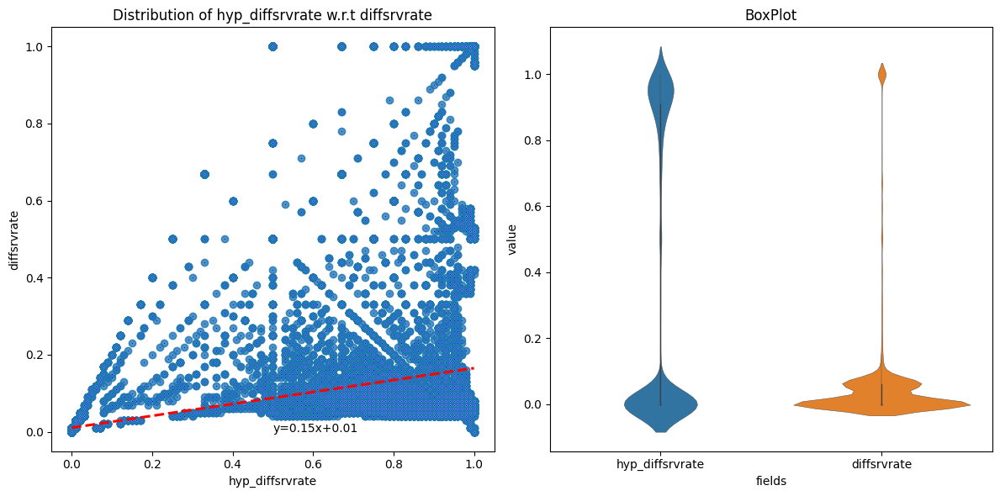

t_stat: 50.61933433712906 with p_value: 0.0
There is a statistically significant difference between the means of the two related samples.
correlation: 0.6290505595039629 with p_value: 0.0
There is a statistically significant linear correlation between the two variables.
Equation:  y=0.55x+0.02


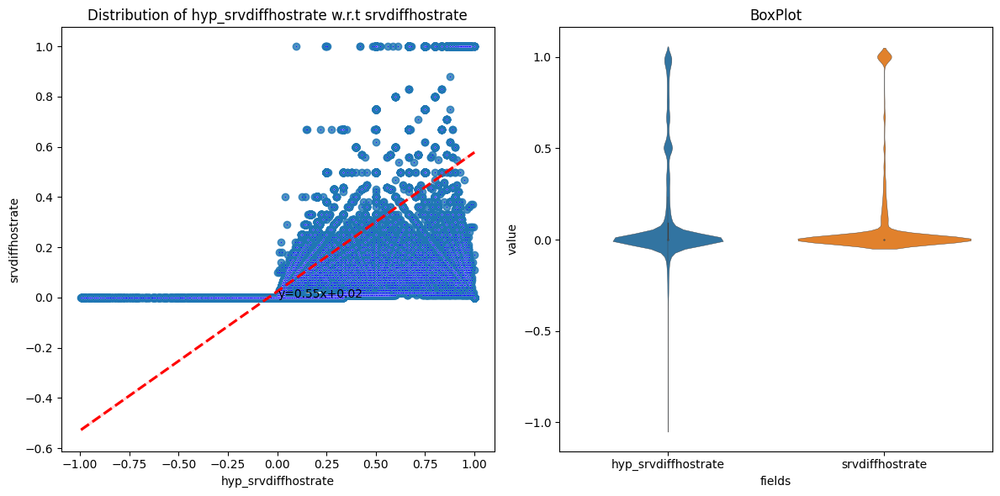

t_stat: 344.6835997549359 with p_value: 0.0
There is a statistically significant difference between the means of the two related samples.
correlation: 0.4193413624862845 with p_value: 0.0
There is a statistically significant linear correlation between the two variables.
Equation:  y=0.18x+-0.00


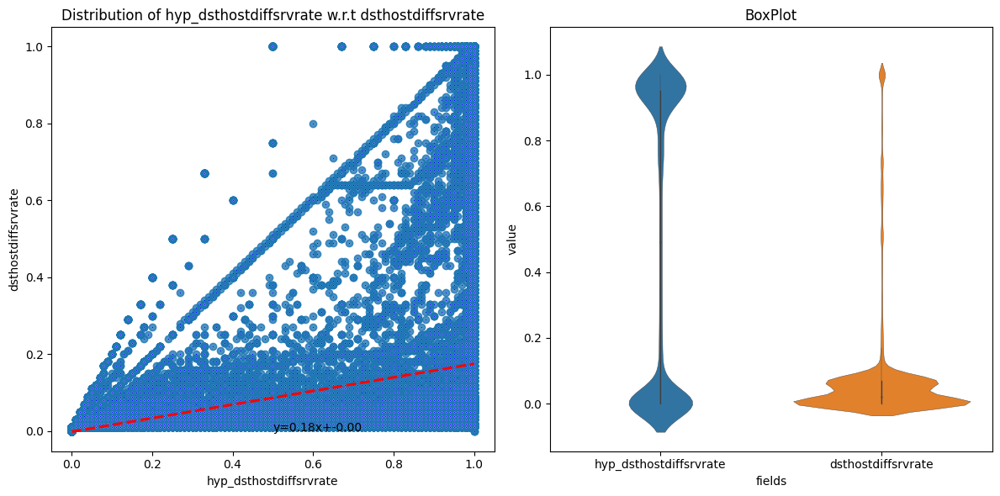

t_stat: 787.3276353795537 with p_value: 0.0
There is a statistically significant difference between the means of the two related samples.
correlation: -0.4052168782300882 with p_value: 0.0
There is a statistically significant linear correlation between the two variables.
Equation:  y=-0.15x+0.16


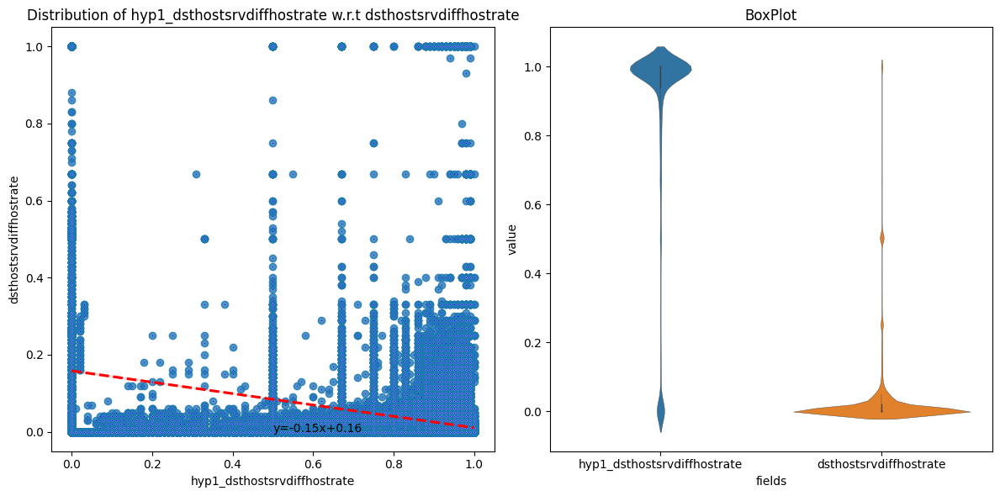

t_stat: 211.54872515073893 with p_value: 0.0
There is a statistically significant difference between the means of the two related samples.
correlation: 0.37975521022650416 with p_value: 0.0
There is a statistically significant linear correlation between the two variables.
Equation:  y=0.10x+0.01


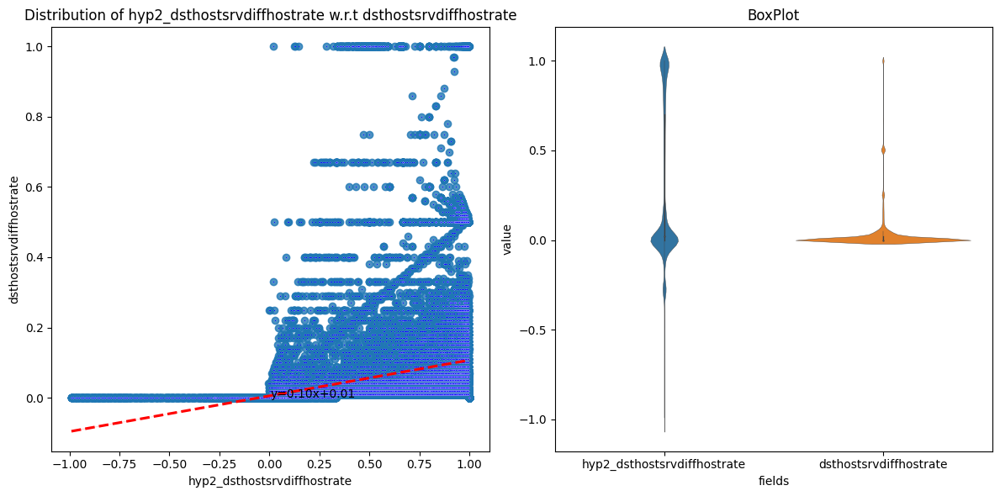

t_stat: 356.382240225395 with p_value: 0.0
There is a statistically significant difference between the means of the two related samples.
correlation: -0.26317941085651136 with p_value: 0.0
There is a statistically significant linear correlation between the two variables.
Equation:  y=-0.19x+0.29


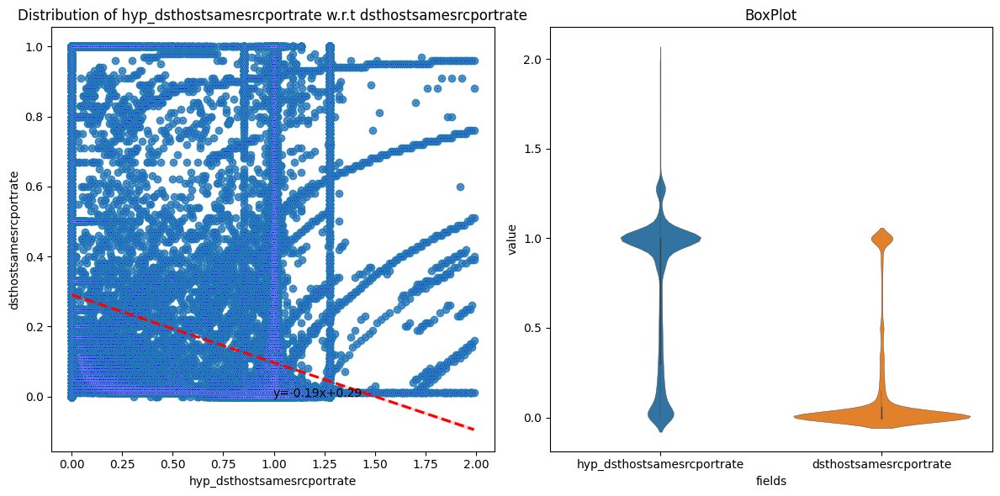

In [15]:
def paired_ttest(data,x,y):
    #paired t-test (assuming Normal dist)
    #HO: mean(difference between the variables)=0
    #H1: mean(difference between the variables)!=0
    #significance level considered = 0.05
    
    t_stat, p_value= stats.ttest_rel(data[x],data[y])
    
    print('t_stat: {} with p_value: {}'.format(t_stat,p_value))
    if p_value<0.05:
        print('There is a statistically significant difference between the means of the two related samples.')
    else:
        print('There is no sufficient evidence of a significant difference between the means.')
        

def pearson(data,x,y):
    #Pearson correlation (assuming linear correlation and normal dist. variables)
    #H0: no linear correlation between 2 variables
    #H1: There is a linear correlation between 2 variables
    
    corr,p_value=stats.pearsonr(data[x],data[y]) 
    print('correlation: {} with p_value: {}'.format(corr,p_value))
    if p_value<0.05:
        print('There is a statistically significant linear correlation between the two variables.')
    else:
        print('There is no sufficient evidence of a significant linear correlation between the two variables.')

def hypt_plot(data,x,y):
    fig,axes=plt.subplots(1,2,figsize=(12,6))
    
    sns.regplot(data=data,x=x,y=y,line_kws={'color':'red','linestyle':'--'},ax=axes[0])
    sns.scatterplot(data=data,x=x,y=y,color='blue',s=1,ax=axes[0])

    slope,intercept=np.polyfit(data[x],data[y],1)
    equation=f'y={slope:.2f}x+{intercept:.2f}'
    print('Equation: ',equation)
    axes[0].set_title('Distribution of {} w.r.t {}'.format(x,y))
    
    axes[0].annotate(equation,((min(data[x])+max(data[x]))/2,max(data[y])-1))
    overall=data[[x]].copy()

    overall.columns=['value']
    overall['fields']=x
    overall1=data[[y]].copy()
    
    overall1.columns=['value']
    overall1['fields']=y
    overall=pd.concat([overall,overall1],axis=0,ignore_index=True)
    
    sns.violinplot(data=overall,x='fields',y='value',linewidth=0.3,ax=axes[1])
    axes[1].set_title('BoxPlot')
    plt.tight_layout()

    plt.show()

def hypothesis_test(data,x,y):
    paired_ttest(data,x,y)
    pearson(data,x,y)
    hypt_plot(data,x,y) 
    

hyptest=df.copy()
hyptest['hyp_diffsrvrate']=1-hyptest['samesrvrate']
hyptest['hyp_srvdiffhostrate']=(hyptest['srvcount']-(hyptest['samesrvrate']*hyptest['countt']))/(hyptest['srvcount']+0.00001)

hyptest['hyp_dsthostdiffsrvrate']=1-hyptest['dsthostsamesrvrate']
hyptest['hyp1_dsthostsrvdiffhostrate']=1-hyptest['dsthostsamesrcportrate']
hyptest['hyp2_dsthostsrvdiffhostrate']=(hyptest['dsthostsrvcount']-(hyptest['dsthostsamesrvrate']*hyptest['dsthostcount']))/(hyptest['dsthostsrvcount']+0.00001)
hyptest['hyp_dsthostsamesrcportrate']=(hyptest['dsthostsamesrvrate']*hyptest['dsthostcount'])/(hyptest['dsthostsrvcount']+0.00001)


hypothesis_test(hyptest,'hyp_diffsrvrate','diffsrvrate')
hypothesis_test(hyptest,'hyp_srvdiffhostrate','srvdiffhostrate')
hypothesis_test(hyptest,'hyp_dsthostdiffsrvrate','dsthostdiffsrvrate')

hypothesis_test(hyptest,'hyp1_dsthostsrvdiffhostrate','dsthostsrvdiffhostrate')
hypothesis_test(hyptest,'hyp2_dsthostsrvdiffhostrate','dsthostsrvdiffhostrate')
hypothesis_test(hyptest,'hyp_dsthostsamesrcportrate','dsthostsamesrcportrate')

### Outlier Treatment

The outlier_treatment_training function caps extreme outliers in the numeric column by detecting significant slope changes in the percentile distribution. Here’s how it works:

1. Percentile Slope Calculation: Calculates the change in numeric values across percentiles using a rolling slope in degrees. This identifies where values sharply increase.

2. Changepoint Detection: Identifies a changepoint in the high-end percentiles (above 75%) where the slope difference exceeds a 5-degree threshold. This changepoint is used to cap outliers.

3. Outlier Capping: Values above this changepoint are capped to the threshold value, reducing the impact of extreme values.

The function outputs a capped duration column and plots the cleaned distribution, improving the dataset’s stability for training.

Changepoints based on slope difference threshold:
97.0 (percentile) :  31.0


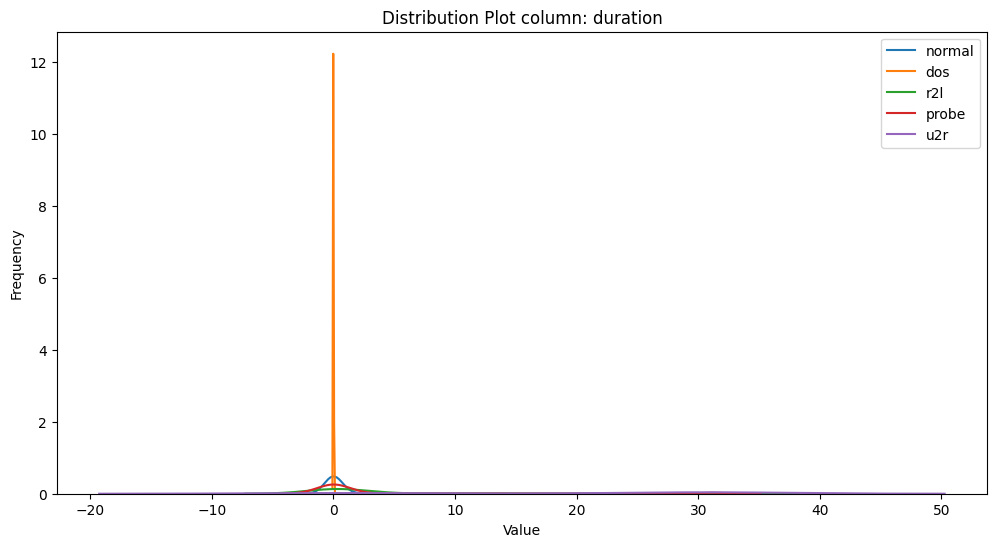

Changepoints based on slope difference threshold:
99.0 (percentile) :  54540.0


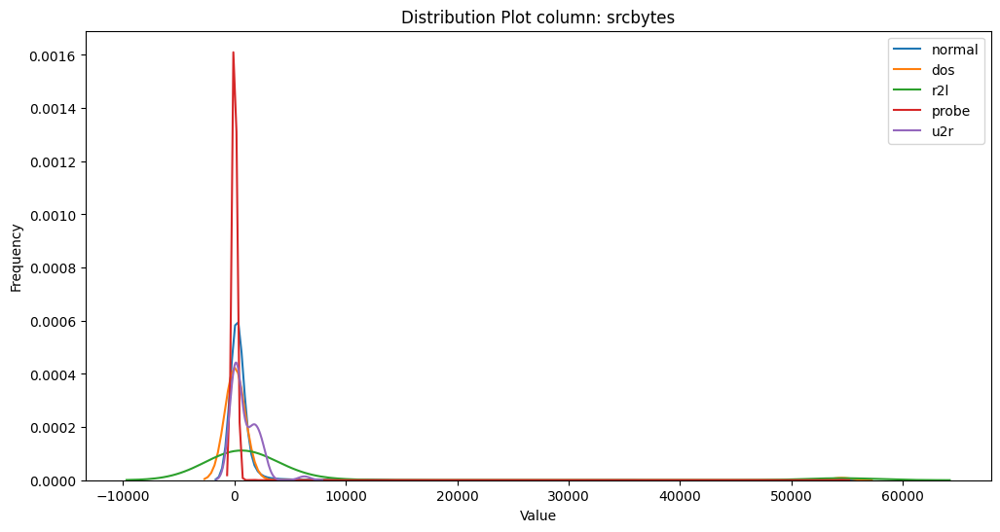

Changepoints based on slope difference threshold:
99.0 (percentile) :  25519.0


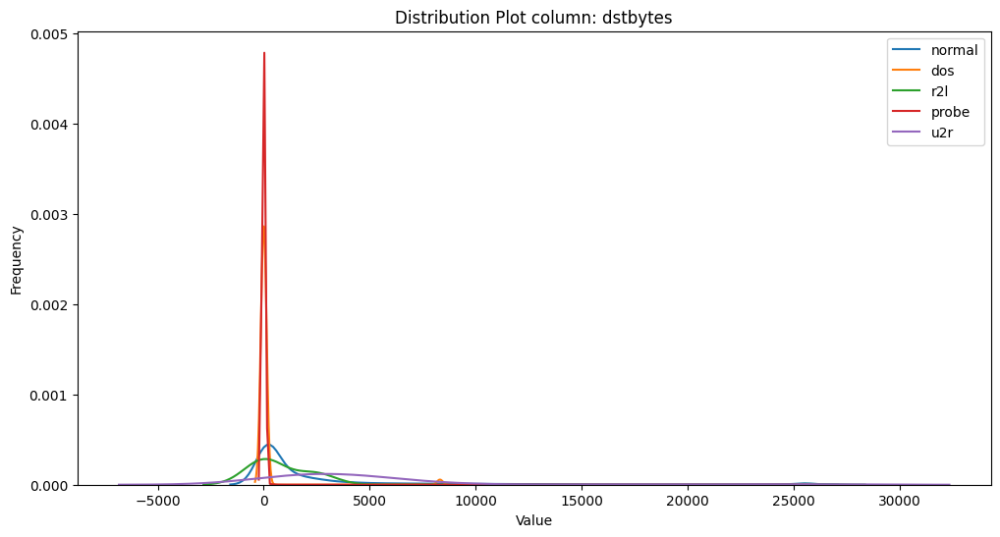

Changepoints based on slope difference threshold:
97.0 (percentile) :  301.0


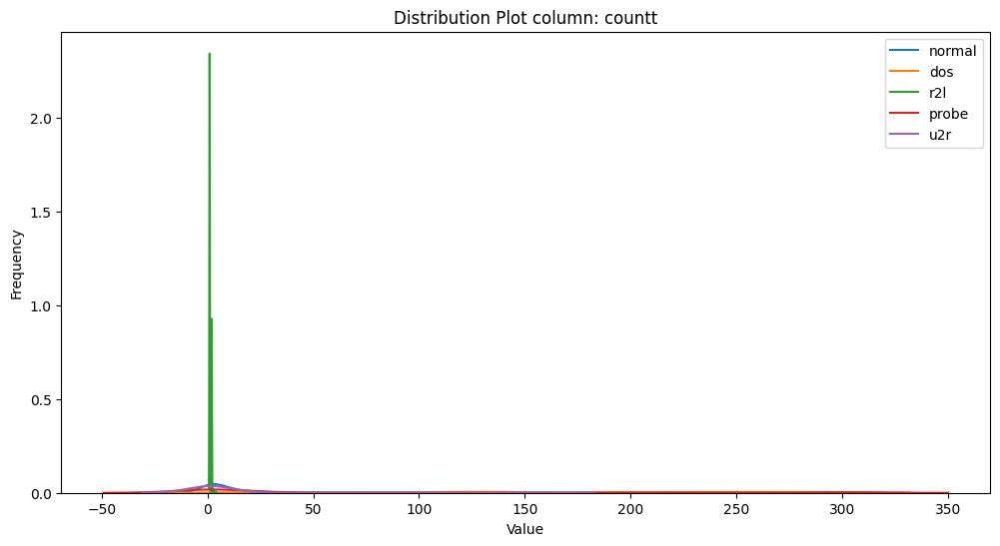

Changepoints based on slope difference threshold:
92.0 (percentile) :  65.0


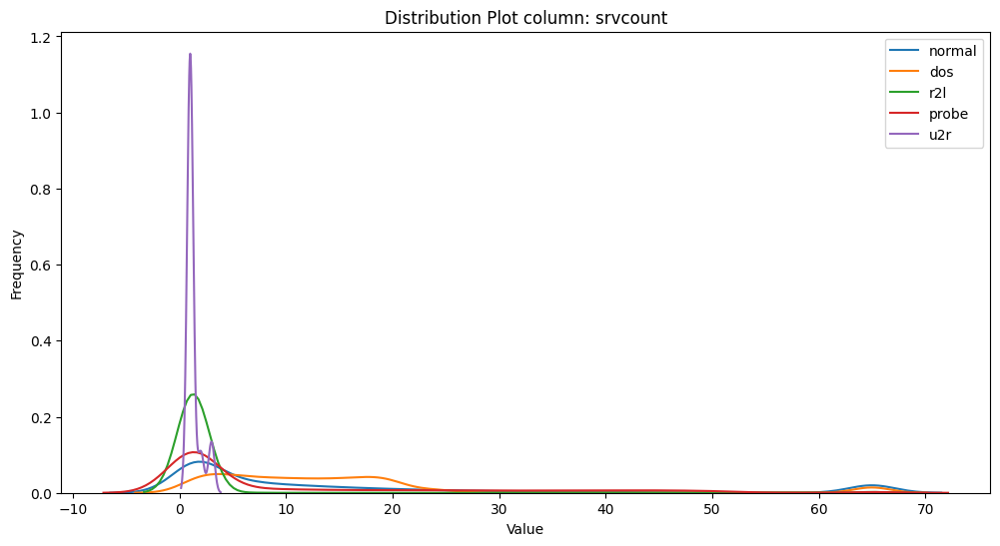

In [16]:
def outlier_treatment_training(data,col,outlier_dict,degree_threshold=5):
    df=data.copy()
    percentiles = np.arange(0, 101, 1)

    # Calculate percentiles for the specified column
    percentile_values = np.percentile(df[col], percentiles)

    percentile_df = pd.DataFrame({
        'Percentile': percentiles,
        'Value': percentile_values
    })


    percentile_df['prev_percentile']=percentile_df['Percentile'].shift(periods=1)
    percentile_df['prev_Value']=percentile_df['Value'].shift(periods=1)
    window_size = 5

    # Get global min and max for Percentile and Value
    mean_value = percentile_df['Value'].mean()
    std_value = percentile_df['Value'].std()

    # Function to calculate slope in degrees with global min/max normalization
    def calculate_slope_degrees_normalized(values, percentiles):
        # Normalize x (Percentile) and y (Value) based on global min and max
        x_normalized = percentiles
        y_normalized = (values - mean_value) / (std_value)

        # Calculate slope of the normalized data
        slope, _ = np.polyfit(x_normalized, y_normalized, 1)

        # Convert slope to degrees
        angle_rad = np.arctan(slope)  # Convert slope to radians
        angle_deg = np.degrees(angle_rad)  # Convert radians to degrees
        return angle_deg

    # Apply rolling window to calculate slopes in degrees with normalization
    percentile_df['slope_deg'] = percentile_df['Value'].rolling(window=window_size).apply(
        lambda values: calculate_slope_degrees_normalized(values, percentile_df['Percentile'].iloc[values.index]), 
        raw=False
    )

    # Calculate the difference between consecutive slopes (in degrees) to detect changepoints
    percentile_df['slope_diff_deg'] = percentile_df['slope_deg'].diff()


    # Identify changepoints based on the threshold
    changepoint = percentile_df[(percentile_df['slope_diff_deg'].abs() >= degree_threshold)&\
                               (percentile_df['Percentile']>75)].sort_values('Percentile').prev_Value.iloc[0]
    changepoint_percentile = percentile_df[(percentile_df['slope_diff_deg'].abs() >= degree_threshold)&\
                               (percentile_df['Percentile']>75)].sort_values('Percentile').prev_percentile.iloc[0]
    df.loc[df[col]>changepoint,col]=changepoint
    outlier_dict[col]=changepoint
    print("Changepoints based on slope difference threshold:")
    print(changepoint_percentile,'(percentile) : ',changepoint)
    
    #print(percentile_df)
    plt.figure(figsize=(12, 6))

    for label in df[target_var].unique():

        sns.kdeplot(df.loc[df[target_var]==label,col], label='{}'.format(label), palette='viridis')
    plt.title('Distribution Plot column: {}'.format(col))
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()
    
    return df,outlier_dict
    
    
def outlier_treatment_test(data, outlier_dict):
    df = data.copy()
    for col in outlier_dict.keys():
        try:
            cap_value = outlier_dict[col]
            df.loc[df[col] > cap_value, col] = cap_value
        except:
            pass

    return df


outlier_dict={}
for col in ['duration','srcbytes','dstbytes','countt','srvcount']:
    df,outlier_dict=outlier_treatment_training(df,col,outlier_dict)
    
    

### Correlations among Non-Target variables

In [17]:
chi2_df=pd.DataFrame([[0]*len(categorical_vars)]*len(categorical_vars),index=categorical_vars,columns=categorical_vars)

for col in range(len(categorical_vars)):
    for col1 in range(col+1,len(categorical_vars)):

        print('=============== {}-{} ================\n'.format(categorical_vars[col],categorical_vars[col1]))
        print('\n')
        chi2_df.loc[categorical_vars[col],categorical_vars[col1]],f=cat_chi2test(df,categorical_vars[col],categorical_vars[col1])




=============== protocoltype-service ================



protocoltype  icmp  tcp  udp
service                     
IRC              0  187    0
X11              0   73    0
Z39_50           0  862    0
aol              0    2    0
auth             0  955    0
...            ...  ...  ...
urp_i          602    0    0
uucp             0  780    0
uucp_path        0  689    0
vmnet            0  617    0
whois            0  693    0

[70 rows x 3 columns]
chi2: 214746.79862771847 with p_value: 0.0
There is a statistically significant association between protocoltype and service.
=============== protocoltype-flag ================



protocoltype  icmp    tcp    udp
flag                            
OTH              0     46      0
REJ              0  11233      0
RSTO             0   1562      0
RSTOS0           0    103      0
RSTR             0   2421      0
S0               0  34851      0
S1               0    365      0
S2               0    127      0
S3               0     49      0


service       IRC  X11  Z39_50  aol  auth  bgp  courier  csnet_ns  ctf  \
isguestlogin                                                             
0             187   73     862    2   955  710      734       545  563   
1               0    0       0    0     0    0        0         0    0   

service       daytime  discard  domain  domain_u  echo  eco_i  ecr_i  efs  \
isguestlogin                                                                
0                 521      538     569      9043   434   4586   3077  485   
1                   0        0       0         0     0      0      0    0   

service       exec  finger   ftp  ftp_data  gopher  harvest  hostnames   http  \
isguestlogin                                                                    
0              474    1767   568      6860     518        2        460  40338   
1                0       0  1186         0       0        0          0      0   

service       http_2784  http_443  http_8001  imap4  iso_tsap  klogin

service           IRC  X11  Z39_50  aol  auth  bgp  courier  csnet_ns  ctf  \
numfilecreations                                                             
0                 187   73     862    2   955  710      734       545  563   
1                   0    0       0    0     0    0        0         0    0   

service           daytime  discard  domain  domain_u  echo  eco_i  ecr_i  efs  \
numfilecreations                                                                
0                     521      538     569      9043   434   4586   3077  485   
1                       0        0       0         0     0      0      0    0   

service           exec  finger   ftp  ftp_data  gopher  harvest  hostnames  \
numfilecreations                                                             
0                  474    1767  1743      6805     518        2        460   
1                    0       0    11        55       0        0          0   

service            http  http_2784  http_443  htt

flag    OTH    REJ  RSTO  RSTOS0  RSTR     S0   S1   S2  S3     SF   SH
urgent                                                                 
0        46  11233  1562     103  2421  34851  365  127  49  74936  271
1         0      0     0       0     0      0    0    0   0      9    0
chi2: 6.128291588357518 with p_value: 0.8043719835896372
There is no sufficient evidence of a significant association between flag and urgent.
=============== flag-numfailedlogins ================



flag             OTH    REJ  RSTO  RSTOS0  RSTR     S0   S1   S2  S3     SF  \
numfailedlogins                                                               
0                 46  11233  1514     103  2415  34851  364  127  47  74880   
1                  0      0    48       0     6      0    1    0   2     65   

flag              SH  
numfailedlogins       
0                271  
1                  0  
chi2: 1563.265934192728 with p_value: 0.0
There is a statistically significant association between flag

loggedin             0      1
numfailedlogins              
0                76026  49825
1                   95     27
chi2: 14.815256188258504 with p_value: 0.0001185723849657935
There is a statistically significant association between loggedin and numfailedlogins.
=============== loggedin-suattempted ================



loggedin         0      1
suattempted              
0            76121  49772
1                0     80
chi2: 119.71733515104557 with p_value: 7.294871724236085e-28
There is a statistically significant association between loggedin and suattempted.
=============== loggedin-numshells ================



loggedin       0      1
numshells              
0          76121  49805
1              0     47
chi2: 69.28732277924215 with p_value: 8.51149215965341e-17
There is a statistically significant association between loggedin and numshells.
=============== loggedin-numaccessfiles ================



loggedin            0      1
numaccessfiles              
0               76

lastflag         0   1   2   3   4   5   6    7    8    9    10   11   12  \
numfailedlogins                                                             
0                66  62  54  65  78  81  95  117  105  166  241  637  723   
1                 0   0   0   0   1   0   1    1    1   28   12    4    6   

lastflag          13   14    15    16    17     18     19     20     21  
numfailedlogins                                                          
0                446  668  3985  2365  3067  20665  10276  19332  62557  
1                  5    6     5    28     7      2      8      7      0  
chi2: 5245.562437042515 with p_value: 0.0
There is a statistically significant association between lastflag and numfailedlogins.
=============== lastflag-suattempted ================



lastflag     0   1   2   3   4   5   6    7    8    9    10   11   12   13  \
suattempted                                                                  
0            66  62  54  65  79  80  96  118  106  19

wrongfragment        0     1
numcompromised              
0               123597  1090
1                 1286     0
chi2: 10.343957920796615 with p_value: 0.0012989917961701099
There is a statistically significant association between wrongfragment and numcompromised.
=============== urgent-numfailedlogins ================



urgent                0  1
numfailedlogins           
0                125844  7
1                   120  2
chi2: 255.4157000834785 with p_value: 1.713237944092537e-57
There is a statistically significant association between urgent and numfailedlogins.
=============== urgent-suattempted ================



urgent            0  1
suattempted           
0            125887  6
1                77  3
chi2: 1089.290875744905 with p_value: 7.0220203382565795e-239
There is a statistically significant association between urgent and suattempted.
=============== urgent-numshells ================



urgent          0  1
numshells           
0          125917  9
1             

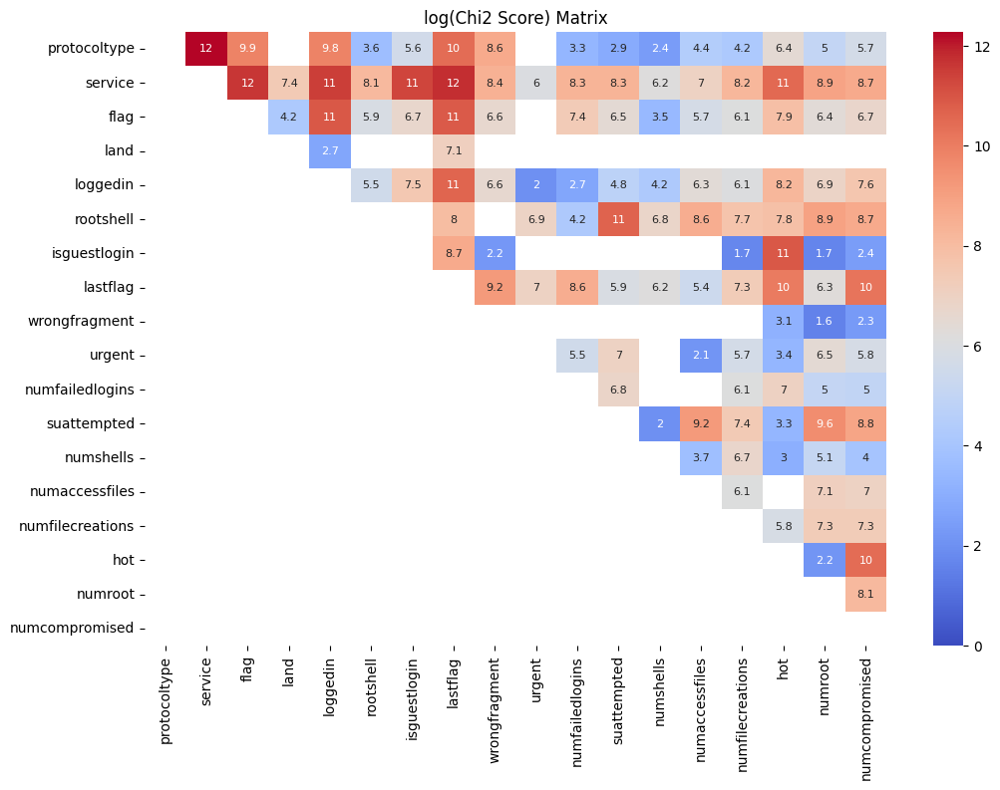

In [18]:
mask = np.tril(np.ones_like(chi2_df, dtype=bool))
plt.figure(figsize=(12,8))
sns.heatmap(np.log(chi2_df),mask=mask,vmin=0,annot=True,cmap='coolwarm',annot_kws={'size':8})
plt.title('log(Chi2 Score) Matrix')
plt.show()



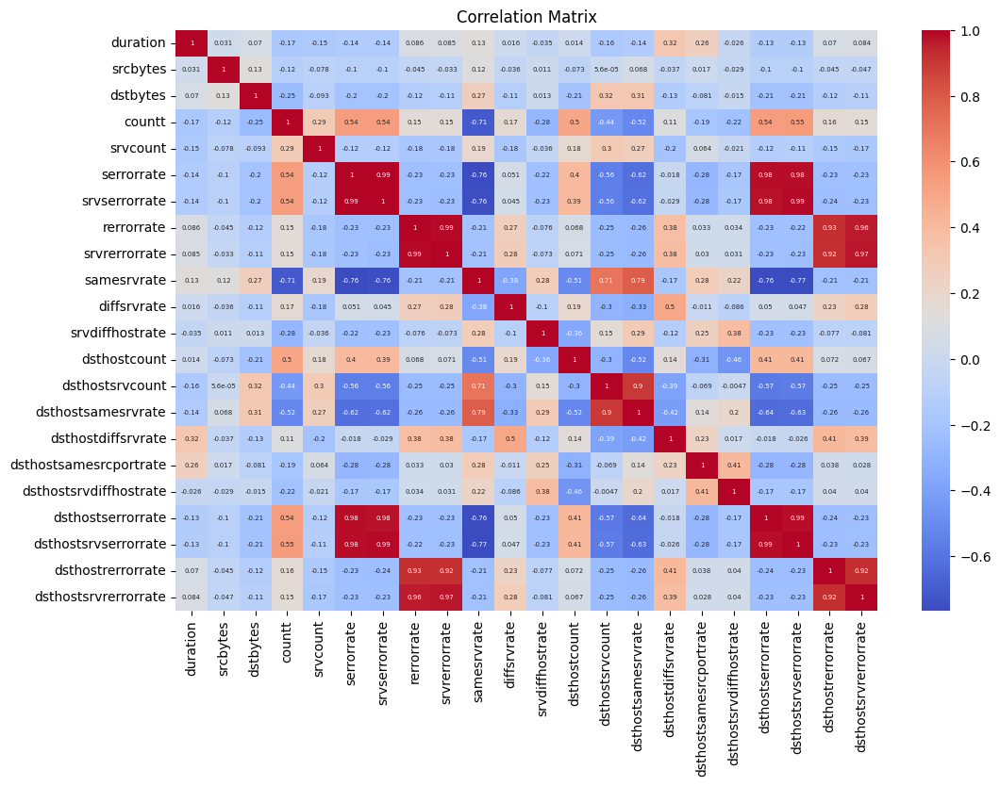

In [19]:
plt.figure(figsize=(12,8))
sns.heatmap(df.loc[:,numerical_vars].corr(),annot=True,cmap='coolwarm',annot_kws={'size':5})
plt.title('Correlation Matrix')
plt.show()

In [20]:
### highly correlated variables >9 scores

def check_high_correlated_vars(rr):
    r=rr.copy()
    r['dist']=''
    for idx,row in rr.iterrows():
        k=(rr.loc[idx,rr.columns]).sort_values(ascending=False).reset_index()
        r.loc[idx,'dist']=','.join(k.iloc[:5,0]+'('+k.iloc[:5,1].astype(float).round(2).astype(str)+')')

    print(r[['dist']])
    
#check_high_correlated_vars(np.log(anova_df))

print("================")

check_high_correlated_vars(np.log(chi2_df))

print("================")

pearson_df=df.loc[:,numerical_vars].corr().abs()
for i in range(len(numerical_vars)):
    j=0
    while j<=i:
        pearson_df.loc[pearson_df.index[i],pearson_df.columns[j]]=0
        j+=1

check_high_correlated_vars(pearson_df)

                                                                                                               dist
protocoltype                           service(12.28),lastflag(10.43),flag(9.88),loggedin(9.84),wrongfragment(8.64)
service                                  lastflag(11.79),flag(11.63),loggedin(11.46),isguestlogin(11.35),hot(10.54)
flag                           loggedin(10.89),lastflag(10.85),hot(7.89),numfailedlogins(7.35),numcompromised(6.72)
land                           lastflag(7.14),loggedin(2.69),protocoltype(-inf),numfailedlogins(-inf),numroot(-inf)
loggedin                              lastflag(10.62),hot(8.22),numcompromised(7.59),isguestlogin(7.5),numroot(6.9)
rootshell                 suattempted(10.65),numroot(8.92),numcompromised(8.65),numaccessfiles(8.57),lastflag(7.98)
isguestlogin              hot(10.91),lastflag(8.67),numcompromised(2.43),wrongfragment(2.25),numfilecreations(1.68)
lastflag           numcompromised(10.22),hot(10.07),wrongfragment(9.2),n

In [21]:
#protocoltype-service

check_high_correlated_vars1(pd.crosstab(df['protocoltype'],df['service']))

check_high_correlated_vars2(pd.crosstab(df['protocoltype'],df['service']))

service                                                                                                                    dist
protocoltype                                                                                                                   
icmp                  eco_i(55.31%, 100.0%),ecr_i(37.11%, 100.0%),urp_i(7.26%, 100.0%),urh_i(0.12%, 100.0%),red_i(0.1%, 100.0%)
tcp              http(39.28%, 100.0%),private(18.08%, 84.94%),smtp(7.12%, 100.0%),ftp_data(6.68%, 100.0%),telnet(2.29%, 100.0%)
udp           domain_u(60.31%, 100.0%),private(21.95%, 15.06%),other(16.59%, 57.08%),ntp_u(1.12%, 100.0%),tftp_u(0.02%, 100.0%)
service                                                                                                                    dist
protocoltype                                                                                                                   
icmp                  eco_i(55.31%, 100.0%),ecr_i(37.11%, 100.0%),urp_i(7.26%, 100.0%),urh_i(0.12%, 100.

In [22]:
#protocoltype-lastflag

check_high_correlated_vars1(pd.crosstab(df['protocoltype'],df['lastflag']))

check_high_correlated_vars2(pd.crosstab(df['protocoltype'],df['lastflag']))

lastflag                                                                                                dist
protocoltype                                                                                                
icmp          18(27.97%, 11.22%),15(19.71%, 40.95%),16(16.13%, 55.87%),19(13.24%, 10.68%),17(12.22%, 32.95%)
tcp             21(56.19%, 92.24%),20(16.28%, 86.43%),18(12.49%, 62.07%),19(8.28%, 82.68%),15(1.74%, 44.79%)
udp                 18(36.82%, 26.71%),21(31.0%, 7.43%),20(14.22%, 11.02%),19(4.56%, 6.64%),17(4.47%, 21.8%)
lastflag                                                                                            dist
protocoltype                                                                                            
icmp          16(16.13%, 55.87%),15(19.71%, 40.95%),17(12.22%, 32.95%),3(0.17%, 21.54%),6(0.21%, 17.71%)
tcp               0(0.06%, 96.97%),2(0.05%, 96.3%),9(0.18%, 94.85%),10(0.23%, 92.89%),21(56.19%, 92.24%)
udp             12(1.35%, 27.71%),1

In [23]:
#protocoltype-flag

check_high_correlated_vars1(pd.crosstab(data['protocoltype'],data['flag']))

check_high_correlated_vars2(pd.crosstab(data['protocoltype'],data['flag']))

flag                                                                                                       dist
protocoltype                                                                                                   
icmp                     SF(100.0%, 11.06%),OTH(0.0%, 0.0%),REJ(0.0%, 0.0%),RSTO(0.0%, 0.0%),RSTOS0(0.0%, 0.0%)
tcp           SF(50.31%, 68.93%),S0(33.94%, 100.0%),REJ(10.94%, 100.0%),RSTR(2.36%, 100.0%),RSTO(1.52%, 100.0%)
udp                      SF(100.0%, 20.01%),OTH(0.0%, 0.0%),REJ(0.0%, 0.0%),RSTO(0.0%, 0.0%),RSTOS0(0.0%, 0.0%)
flag                                                                                                      dist
protocoltype                                                                                                  
icmp                    SF(100.0%, 11.06%),OTH(0.0%, 0.0%),REJ(0.0%, 0.0%),RSTO(0.0%, 0.0%),RSTOS0(0.0%, 0.0%)
tcp           S0(33.94%, 100.0%),REJ(10.94%, 100.0%),RSTR(2.36%, 100.0%),RSTO(1.52%, 100.0%),S1(0.36%, 100.

In [24]:
#protocoltype-loggedin

check_high_correlated_vars1(pd.crosstab(data['protocoltype'],data['loggedin']))

check_high_correlated_vars2(pd.crosstab(data['protocoltype'],data['loggedin']))

loggedin                                     dist
protocoltype                                     
icmp              0(100.0%, 10.89%),1(0.0%, 0.0%)
tcp           0(51.45%, 69.41%),1(48.55%, 100.0%)
udp                0(100.0%, 19.7%),1(0.0%, 0.0%)
loggedin                                     dist
protocoltype                                     
icmp              0(100.0%, 10.89%),1(0.0%, 0.0%)
tcp           1(48.55%, 100.0%),0(51.45%, 69.41%)
udp                0(100.0%, 19.7%),1(0.0%, 0.0%)


In [25]:
#suattempted-numaccessfiles

check_high_correlated_vars1(pd.crosstab(df['suattempted'],df['numaccessfiles']))

check_high_correlated_vars2(pd.crosstab(df['suattempted'],df['numaccessfiles']))

numaccessfiles                                dist
suattempted                                       
0               0(99.74%, 99.97%),1(0.26%, 87.06%)
1                 1(60.0%, 12.94%),0(40.0%, 0.03%)
numaccessfiles                                dist
suattempted                                       
0               0(99.74%, 99.97%),1(0.26%, 87.06%)
1                 1(60.0%, 12.94%),0(40.0%, 0.03%)


In [26]:
#suattempted-numaccessfiles

check_high_correlated_vars1(pd.crosstab(df['lastflag'],df['wrongfragment']))

check_high_correlated_vars2(pd.crosstab(df['lastflag'],df['wrongfragment']))

wrongfragment                                dist
lastflag                                         
0                  0(100.0%, 0.05%),1(0.0%, 0.0%)
1                  0(100.0%, 0.05%),1(0.0%, 0.0%)
2                  0(100.0%, 0.04%),1(0.0%, 0.0%)
3                  0(100.0%, 0.05%),1(0.0%, 0.0%)
4                  0(100.0%, 0.06%),1(0.0%, 0.0%)
5                  0(100.0%, 0.06%),1(0.0%, 0.0%)
6                  0(100.0%, 0.08%),1(0.0%, 0.0%)
7                  0(100.0%, 0.09%),1(0.0%, 0.0%)
8                  0(100.0%, 0.08%),1(0.0%, 0.0%)
9                0(99.48%, 0.15%),1(0.52%, 0.09%)
10                  0(100.0%, 0.2%),1(0.0%, 0.0%)
11               0(99.69%, 0.51%),1(0.31%, 0.18%)
12               0(86.42%, 0.5%),1(13.58%, 9.08%)
13               0(94.24%, 0.34%),1(5.76%, 2.39%)
14               0(95.85%, 0.52%),1(4.15%, 2.57%)
15             0(87.29%, 2.79%),1(12.71%, 46.51%)
16              0(93.36%, 1.79%),1(6.64%, 14.59%)
17                0(97.53%, 2.4%),1(2.47%, 6.97%)


In [27]:
#rootshell-suattempted

check_high_correlated_vars1(pd.crosstab(df['rootshell'],df['suattempted']))

check_high_correlated_vars2(pd.crosstab(df['rootshell'],df['suattempted']))

suattempted                               dist
rootshell                                     
0            0(99.99%, 99.92%),1(0.01%, 15.0%)
1            0(59.76%, 0.08%),1(40.24%, 85.0%)
suattempted                               dist
rootshell                                     
0            0(99.99%, 99.92%),1(0.01%, 15.0%)
1            1(40.24%, 85.0%),0(59.76%, 0.08%)


In [28]:
#loggedin-lastflag

check_high_correlated_vars1(pd.crosstab(df['loggedin'],df['lastflag']))

check_high_correlated_vars2(pd.crosstab(df['loggedin'],df['lastflag']))

lastflag                                                                                           dist
loggedin                                                                                               
0         21(27.83%, 33.86%),18(25.31%, 93.22%),20(21.11%, 83.08%),19(12.59%, 93.22%),15(4.88%, 93.01%)
1                21(83.0%, 66.14%),20(6.57%, 16.92%),18(2.81%, 6.78%),19(1.4%, 6.78%),11(1.04%, 80.66%)
lastflag                                                                                         dist
loggedin                                                                                             
0         19(12.59%, 93.22%),18(25.31%, 93.22%),15(4.88%, 93.01%),16(2.82%, 89.55%),17(3.56%, 88.09%)
1              11(1.04%, 80.66%),0(0.11%, 80.3%),2(0.08%, 75.93%),10(0.37%, 72.33%),21(83.0%, 66.14%)


### protocoltype-service

General Insights:
1. ICMP Protocol: Mostly involves eco_i (55.31%) and ecr_i (37.11%). These are the primary services to look out for when analyzing ICMP traffic.

2. TCP Protocol: Heavily concentrated in http (39.28%) and private (18.08%) services. Traffic anomalies in these two services may signal potential attacks or issues.

3. UDP Protocol: Dominated by domain_u service (60.31%). If a large proportion of UDP traffic shifts away from this service, it could indicate an anomaly.

Security Implication:

1. Monitoring HTTP and private services on TCP is crucial, as these two services account for the majority of TCP traffic.
2. ICMP traffic is largely associated with eco_i and ecr_i, so these services should be a focus when investigating ICMP-based anomalies.
3. UDP domain_u traffic is the most common, and deviations from this might suggest unusual behavior.







### High Correlation Insights (only numerical features):

1. numcompromised and numroot (Correlation = 1.0):

Insight: This indicates a perfect positive correlation between the number of compromised hosts and the number of root accesses or compromises. This makes sense, as a higher number of compromised hosts would likely result in a higher number of root access attempts. These two variables are so strongly related that you could potentially use one as a proxy for the other.

2. serrorrate with srvserrorrate, dsthostsrvserrorrate, and dsthostserrorrate (Correlations = 0.99, 0.98, 0.98):

Insight: There is a very strong positive correlation between the error rates across different dimensions (i.e., service, destination host, and server error rates). This suggests that whenever there are errors in one aspect of communication (e.g., service or destination host errors), it's highly likely that errors will propagate across other related components. Monitoring error rates at any of these levels could give early warning signs of issues in other areas.

3. srvserrorrate with dsthostsrvserrorrate and dsthostserrorrate (Correlations = 0.99, 0.98):

Insight: Similar to the serrorrate, service-related errors are closely related to destination host error rates. This suggests that when server errors occur, they are mirrored across destination hosts, indicating potential systemic issues across both services and their corresponding destination hosts.

4. rerrorrate with srvrerrorrate, dsthostsrvrerrorrate, and dsthostrerrorrate (Correlations = 0.99, 0.96, 0.93):

Insight: The retransmission error rate (rerrorrate) is highly correlated with server retransmission error rates and destination host retransmission error rates. This suggests that retransmission errors are not isolated to a specific point in the network, but likely affect both the server and destination hosts, indicating potential network congestion or misconfiguration issues.

5. srvrerrorrate with dsthostsrvrerrorrate and dsthostrerrorrate (Correlations = 0.97, 0.92):

Insight: Server retransmission errors are highly related to destination host retransmission errors, which could point to larger-scale network issues or communication breakdowns across the system. This reinforces the importance of monitoring retransmission errors at both the server and destination host levels.

6. dsthostsrvcount with dsthostsamesrvrate (Correlation = 0.9):

Insight: This high correlation suggests that when the number of services a destination host connects to increases, there is a proportional increase in the rate of same-server communication at the destination host level. This could indicate more consistent usage patterns, where destination hosts tend to connect to the same set of servers frequently.

7. dsthostserrorrate with dsthostsrvserrorrate (Correlation = 0.99):

Insight: There is a very strong correlation between the destination host error rate and the destination host service error rate. This likely means that errors occurring at the destination host level are predominantly driven by service-related errors. Investigating the root cause of service errors would likely mitigate issues at the destination host level as well.

8. dsthostrerrorrate with dsthostsrvrerrorrate (Correlation = 0.92):

Insight: Similarly, retransmission errors at the destination host level are strongly linked to server retransmission errors. This suggests that if servers experience retransmission issues, destination hosts are also affected, reinforcing the need to address retransmission problems at both levels.

### Dropping some highly correlated variables

In [29]:


def get_correlated_vars(corr,th,if_abs=False):
    value_vars=corr.columns
    corr.reset_index(inplace=True)
    corr1=pd.melt(corr,id_vars='index',value_vars=value_vars)
    corr1=corr1.loc[corr1['index']!=corr1['variable']]
    dropping_cols=[]
    if if_abs:
        corr1=corr1.loc[abs(corr1['value'])>=th]
    else:
        corr1=corr1.loc[(corr1['value'])>=th]
    for ind,row in corr1.iterrows():
        corr1.loc[ind,['index','variable']]=corr1.loc[ind,['index','variable']].sort_values(ascending=True).values

    corr1.drop_duplicates(keep='first',inplace=True)

    corr1['abs_val']=corr1['value'].abs()
    corr1=corr1.sort_values('abs_val',ascending=False)
    corr1.reset_index(drop=True,inplace=True)

    corr1.columns=['Field1','Field2','Correlation','abs_val']

    #print(corr1)
    while len(corr1):
        c=Counter(list(corr1.Field1.values)+list(corr1.Field2.values))
        if c[corr1.iloc[0].Field2]>=c[corr1.iloc[0].Field1]:
            dropping_col=corr1.iloc[0].Field2
        else:
            dropping_col=corr1.iloc[0].Field1
        print('dropping_col:',dropping_col)
        dropping_cols.append(dropping_col)
        #df.drop(dropping_col,axis=1,inplace=True)

        corr1=corr1.loc[~((corr1.Field2==dropping_col)|(corr1.Field1==dropping_col))].copy()
        try:
            corr1=corr1.sort_values('abs_val',ascending=False)
            corr1.reset_index(drop=True,inplace=True)
        except:
            pass
    return dropping_cols




chi2_drop_cols=get_correlated_vars(np.log(chi2_df),12,False)  #Threshold log(chi2) score=12

pearson_drop_cols=get_correlated_vars(df.loc[:,numerical_vars].corr(method='pearson'),0.95,True) #Threshold pearson score=0.95

numerical_vars=list(set(numerical_vars)-set(pearson_drop_cols))
categorical_vars=list(set(categorical_vars)-set(chi2_drop_cols))


dropping_col: service
dropping_col: srvserrorrate
dropping_col: srvrerrorrate
dropping_col: dsthostsrvserrorrate
dropping_col: serrorrate
dropping_col: rerrorrate


=============== dsthostcount-suattempted ================
                 count        mean         std  min    25%    50%    75%    max
suattempted                                                                   
0            125893.0  182.178477   99.198737  0.0  82.00  255.0  255.0  255.0
1                80.0  135.675000  100.704829  1.0  38.75  112.0  255.0  255.0




<Figure size 800x600 with 0 Axes>

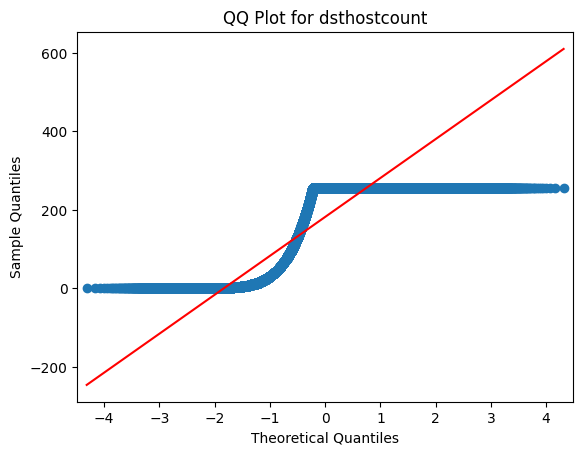

dsthostcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostcount across the groups in suattempted (Kruskal-Wallis).
=============== dsthostcount-numfilecreations ================
                      count        mean        std  min   25%    50%    75%  \
numfilecreations                                                             
0                 125686.0  182.238181  99.196372  0.0  82.0  255.0  255.0   
1                    287.0  143.069686  95.907637  1.0  51.5  142.0  255.0   

                    max  
numfilecreations         
0                 255.0  
1                 255.0  




<Figure size 800x600 with 0 Axes>

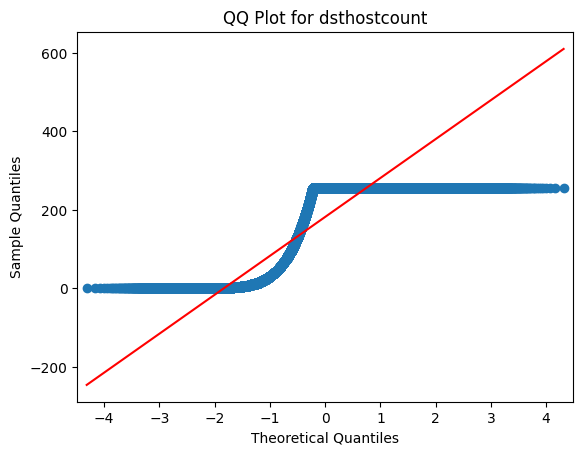

dsthostcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostcount across the groups in numfilecreations (Kruskal-Wallis).
=============== dsthostcount-numfailedlogins ================
                     count        mean        std  min    25%    50%    75%  \
numfailedlogins                                                              
0                125851.0  182.249557  99.171047  0.0  82.00  255.0  255.0   
1                   122.0   78.360656  79.419283  1.0  24.25   40.0  118.5   

                   max  
numfailedlogins         
0                255.0  
1                255.0  




<Figure size 800x600 with 0 Axes>

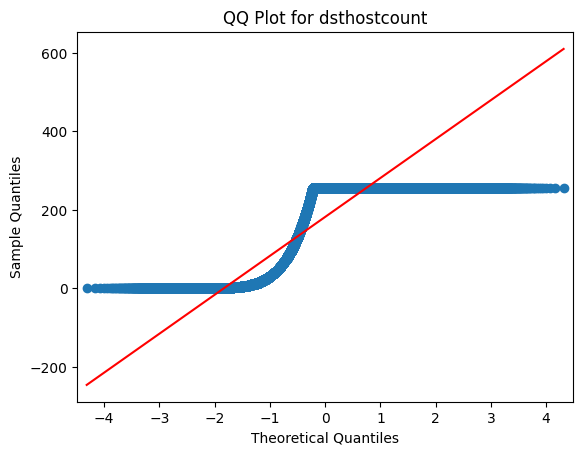

dsthostcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostcount across the groups in numfailedlogins (Kruskal-Wallis).
=============== dsthostcount-numroot ================
             count        mean        std  min   25%    50%    75%    max
numroot                                                                 
0        125324.0  182.488861  99.124536  0.0  83.0  255.0  255.0  255.0
1           649.0  116.510015  93.018750  1.0  29.0   97.0  208.0  255.0




<Figure size 800x600 with 0 Axes>

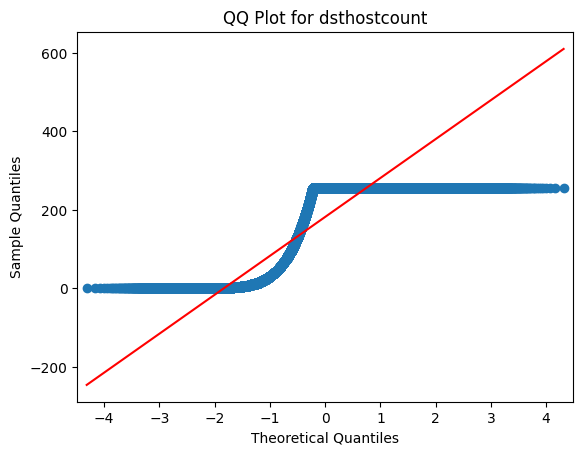

dsthostcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostcount across the groups in numroot (Kruskal-Wallis).
=============== dsthostcount-numshells ================
               count        mean        std  min   25%    50%    75%    max
numshells                                                                 
0          125926.0  182.164080  99.206152  0.0  82.0  255.0  255.0  255.0
1              47.0  141.595745  91.694118  1.0  81.5  121.0  252.0  255.0




<Figure size 800x600 with 0 Axes>

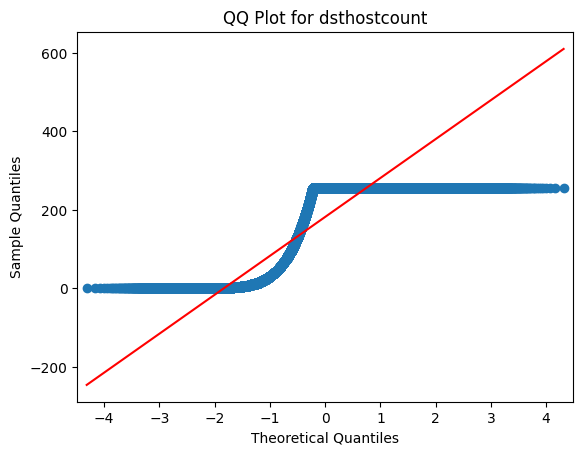

dsthostcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostcount across the groups in numshells (Kruskal-Wallis).
=============== dsthostcount-loggedin ================
             count        mean         std  min    25%    50%    75%    max
loggedin                                                                  
0         76121.0  214.349339   84.298968  0.0  255.0  255.0  255.0  255.0
1         49852.0  132.980883  100.091558  1.0   32.0  118.0  255.0  255.0




<Figure size 800x600 with 0 Axes>

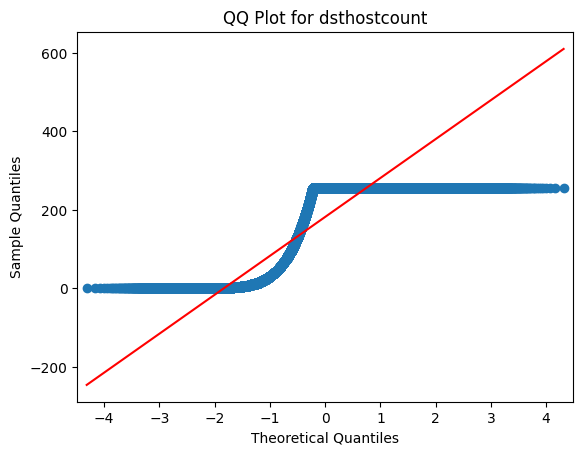

dsthostcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostcount across the groups in loggedin (Kruskal-Wallis).
=============== dsthostcount-urgent ================
            count        mean         std  min   25%    50%    75%    max
urgent                                                                  
0       125964.0  182.154886   99.202657  0.0  82.0  255.0  255.0  255.0
1            9.0   99.000000  120.014582  1.0   2.0   36.0  255.0  255.0




<Figure size 800x600 with 0 Axes>

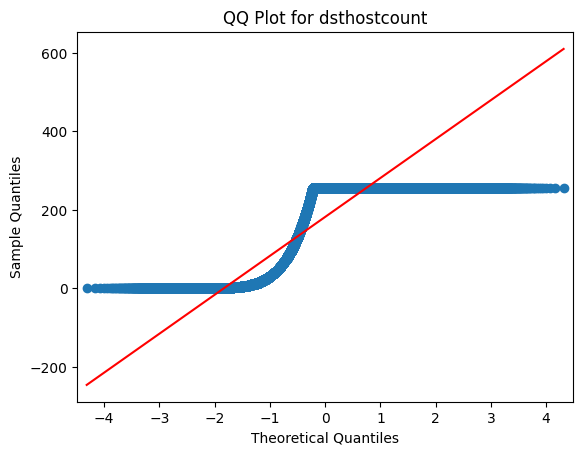

dsthostcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostcount across the groups in urgent (Kruskal-Wallis).
=============== dsthostcount-land ================
          count        mean        std  min   25%    50%    75%    max
land                                                                 
0     125948.0  182.184584  99.183780  0.0  82.0  255.0  255.0  255.0
1         25.0    2.600000   4.462809  1.0   1.0    1.0    1.0   16.0




<Figure size 800x600 with 0 Axes>

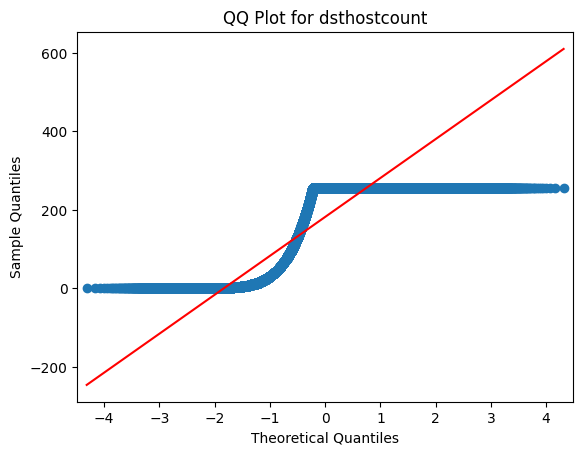

dsthostcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostcount across the groups in land (Kruskal-Wallis).
=============== dsthostcount-lastflag ================
             count        mean         std  min     25%    50%     75%    max
lastflag                                                                    
0            66.0  176.833333   93.579515  1.0  127.75  222.5  255.00  255.0
1            62.0   59.048387   86.056296  1.0    6.00   14.5   60.00  255.0
2            54.0   85.296296  103.828347  1.0    6.00   18.0  152.25  255.0
3            65.0  105.430769  102.746194  1.0   10.00   85.0  212.00  255.0
4            79.0  130.417722  106.358321  1.0   15.00  110.0  255.00  255.0
5            81.0  145.567901  110.056683  1.0   34.00  156.0  255.00  255.0
6            96.0  142.625000   91.842686  1.0   66.25  165.0  227.25  255.0
7           118.0  151.016949   98.686

<Figure size 800x600 with 0 Axes>

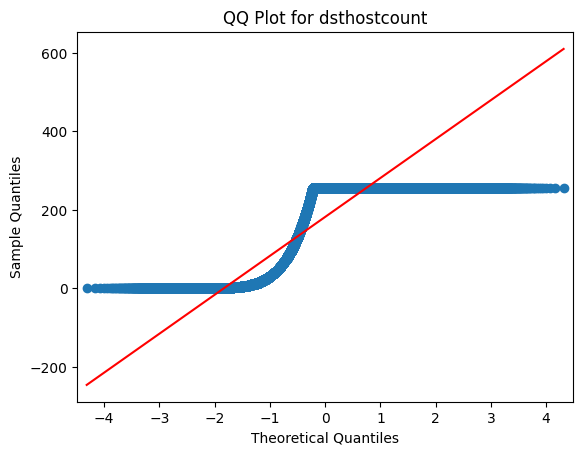

dsthostcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostcount across the groups in lastflag (Kruskal-Wallis).
=============== dsthostcount-hot ================
         count        mean        std  min   25%    50%    75%    max
hot                                                                 
0    123302.0  182.888299  99.163793  0.0  83.0  255.0  255.0  255.0
1      2671.0  148.017971  95.097587  1.0  54.5  156.0  255.0  255.0




<Figure size 800x600 with 0 Axes>

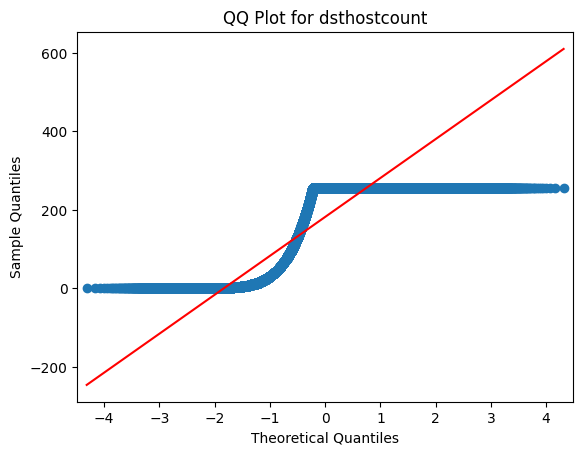

dsthostcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostcount across the groups in hot (Kruskal-Wallis).
=============== dsthostcount-rootshell ================
               count        mean         std  min   25%    50%    75%    max
rootshell                                                                  
0          125804.0  182.257607   99.159881  0.0  82.0  255.0  255.0  255.0
1             169.0  101.260355  100.955275  1.0  12.0   58.0  231.0  255.0




<Figure size 800x600 with 0 Axes>

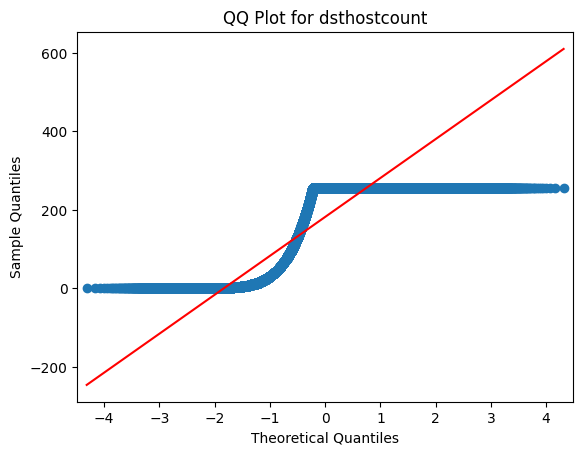

dsthostcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostcount across the groups in rootshell (Kruskal-Wallis).
=============== dsthostcount-isguestlogin ================
                  count        mean        std  min   25%    50%    75%    max
isguestlogin                                                                 
0             124786.0  182.286274  99.310397  0.0  82.0  255.0  255.0  255.0
1               1187.0  167.711879  86.391523  1.0  95.5  193.0  255.0  255.0




<Figure size 800x600 with 0 Axes>

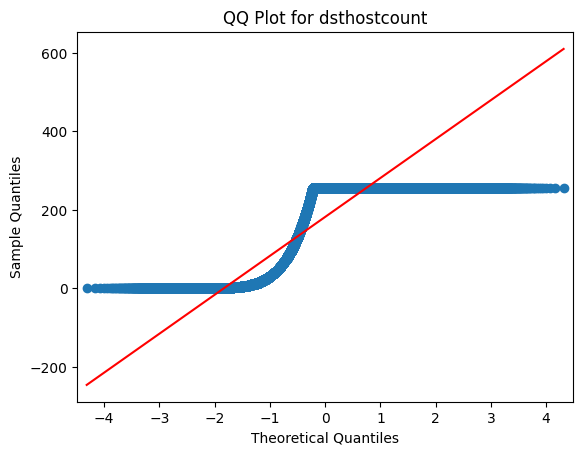

dsthostcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostcount across the groups in isguestlogin (Kruskal-Wallis).
=============== dsthostcount-wrongfragment ================
                   count        mean        std  min     25%    50%    75%  \
wrongfragment                                                               
0              124883.0  181.902084  99.286171  0.0   81.00  255.0  255.0   
1                1090.0  210.432110  84.989566  1.0  226.25  255.0  255.0   

                 max  
wrongfragment         
0              255.0  
1              255.0  




<Figure size 800x600 with 0 Axes>

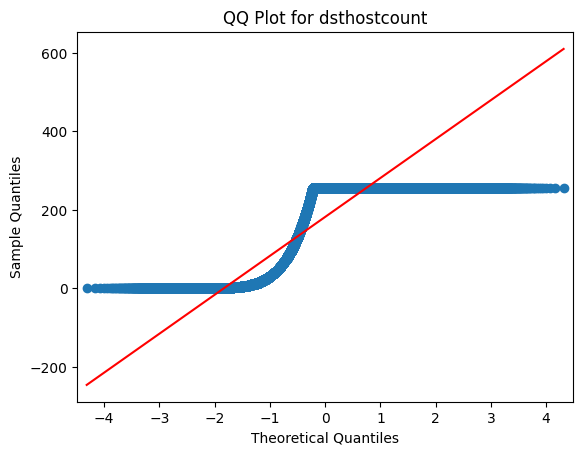

dsthostcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostcount across the groups in wrongfragment (Kruskal-Wallis).
=============== dsthostcount-flag ================
           count        mean         std   min     25%    50%     75%    max
flag                                                                       
OTH        46.0  162.608696   58.917448  34.0  145.25  166.0  198.25  255.0
REJ     11233.0  191.088667  101.840019   0.0   77.00  255.0  255.00  255.0
RSTO     1562.0  227.291293   70.111170   1.0  255.00  255.0  255.00  255.0
RSTOS0    103.0  237.631068   52.762136  73.0  255.00  255.0  255.00  255.0
RSTR     2421.0  222.646427   63.837654   1.0  222.00  255.0  255.00  255.0
S0      34851.0  246.112737   39.172587   1.0  255.00  255.0  255.00  255.0
S1        365.0  115.493151   89.586401   1.0   38.00   88.0  179.00  255.0
S2        127.0  106.275591   98.943922   

<Figure size 800x600 with 0 Axes>

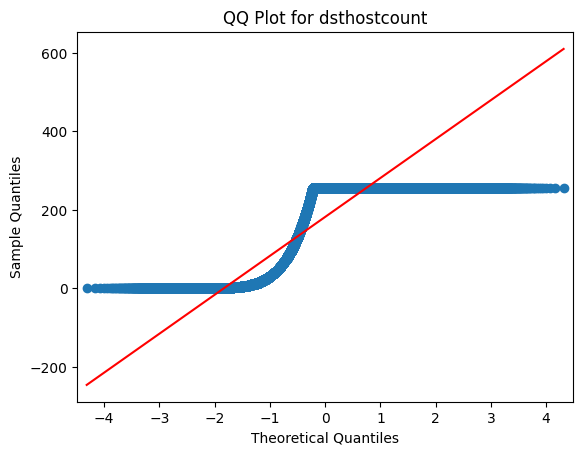

dsthostcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostcount across the groups in flag (Kruskal-Wallis).
=============== dsthostcount-protocoltype ================
                  count        mean         std  min    25%    50%    75%  \
protocoltype                                                               
icmp            8291.0  110.791581  120.029356  1.0    2.0    4.0  255.0   
tcp           102689.0  181.411329   97.978025  0.0   81.0  255.0  255.0   
udp            14993.0  226.660975   64.625866  1.0  255.0  255.0  255.0   

                max  
protocoltype         
icmp          255.0  
tcp           255.0  
udp           255.0  




<Figure size 800x600 with 0 Axes>

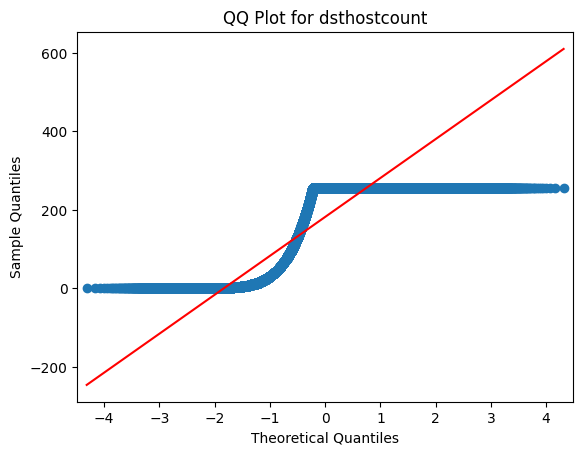

dsthostcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostcount across the groups in protocoltype (Kruskal-Wallis).
=============== dsthostcount-numaccessfiles ================
                    count        mean        std  min   25%    50%    75%  \
numaccessfiles                                                             
0               125602.0  182.143612  99.223934  0.0  82.0  255.0  255.0   
1                  371.0  183.954178  93.120994  1.0  99.0  255.0  255.0   

                  max  
numaccessfiles         
0               255.0  
1               255.0  




<Figure size 800x600 with 0 Axes>

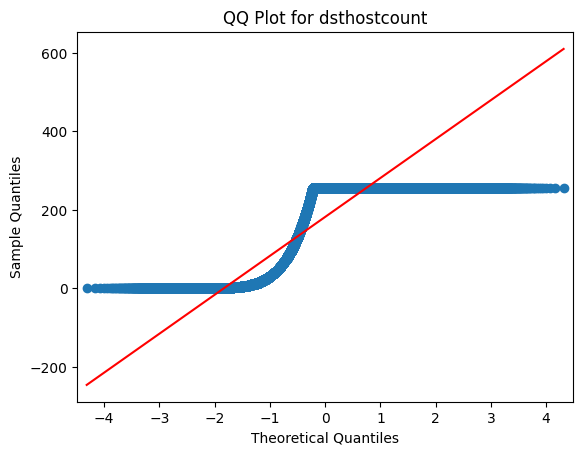

dsthostcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostcount-numcompromised ================
                    count        mean        std  min   25%    50%    75%  \
numcompromised                                                             
0               124687.0  182.523062  99.194848  0.0  83.0  255.0  255.0   
1                 1286.0  145.875583  93.477029  1.0  56.0  143.0  255.0   

                  max  
numcompromised         
0               255.0  
1               255.0  




<Figure size 800x600 with 0 Axes>

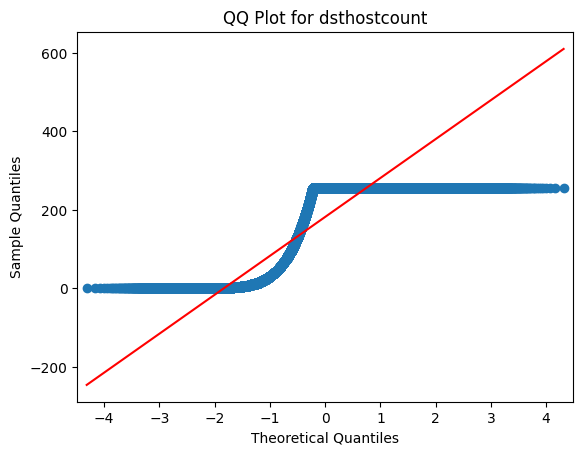

dsthostcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostcount across the groups in numcompromised (Kruskal-Wallis).
=============== dsthostsrvcount-suattempted ================
                 count        mean         std  min   25%   50%     75%    max
suattempted                                                                  
0            125893.0  115.713002  110.710168  0.0  10.0  63.0  255.00  255.0
1                80.0   21.237500   27.507533  1.0   4.0  11.0   25.25  152.0




<Figure size 800x600 with 0 Axes>

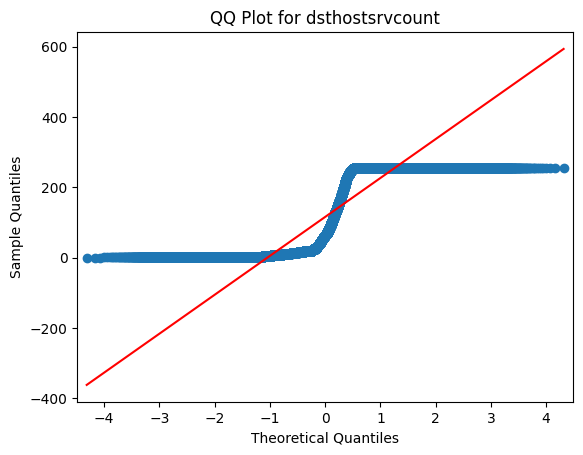

dsthostsrvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvcount across the groups in suattempted (Kruskal-Wallis).
=============== dsthostsrvcount-numfilecreations ================
                      count        mean         std  min   25%   50%    75%  \
numfilecreations                                                             
0                 125686.0  115.787216  110.755762  0.0  10.0  63.0  255.0   
1                    287.0   56.878049   60.525690  1.0   7.0  29.0   94.0   

                    max  
numfilecreations         
0                 255.0  
1                 246.0  




<Figure size 800x600 with 0 Axes>

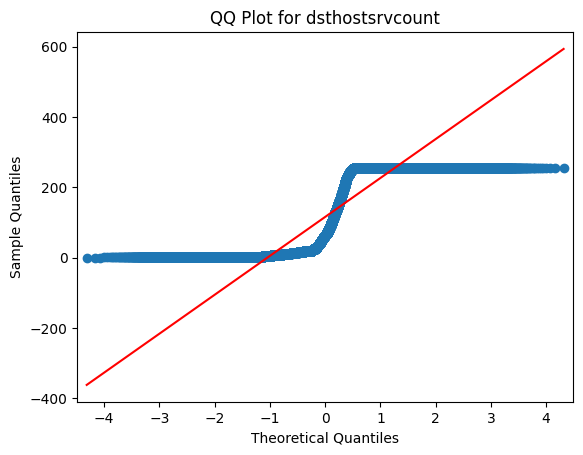

dsthostsrvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvcount across the groups in numfilecreations (Kruskal-Wallis).
=============== dsthostsrvcount-numfailedlogins ================
                     count        mean         std  min    25%   50%     75%  \
numfailedlogins                                                               
0                125851.0  115.743196  110.717043  0.0  10.00  63.0  255.00   
1                   122.0   22.614754   18.067571  1.0   7.25  19.5   33.75   

                   max  
numfailedlogins         
0                255.0  
1                112.0  




<Figure size 800x600 with 0 Axes>

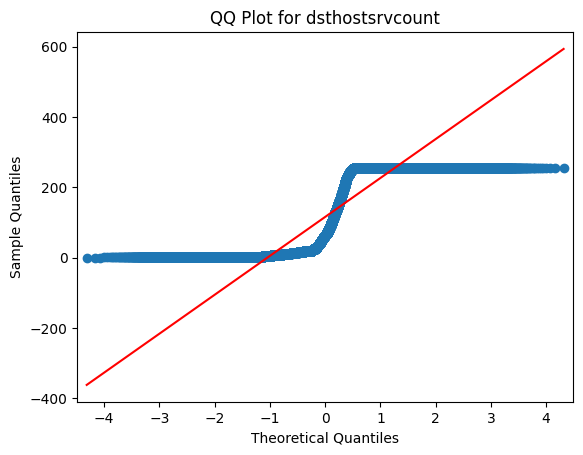

dsthostsrvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvcount across the groups in numfailedlogins (Kruskal-Wallis).
=============== dsthostsrvcount-numroot ================
             count        mean         std  min   25%   50%    75%    max
numroot                                                                 
0        125324.0  116.012400  110.837829  0.0  10.0  63.0  255.0  255.0
1           649.0   46.252696   40.462308  1.0   8.0  42.0   74.0  241.0




<Figure size 800x600 with 0 Axes>

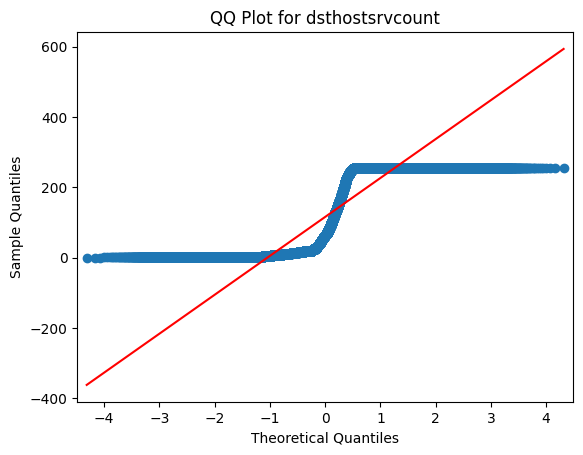

dsthostsrvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvcount across the groups in numroot (Kruskal-Wallis).
=============== dsthostsrvcount-numshells ================
               count        mean         std  min   25%   50%    75%    max
numshells                                                                 
0          125926.0  115.677811  110.712465  0.0  10.0  63.0  255.0  255.0
1              47.0   49.191489   45.960114  1.0   8.0  48.0   76.0  255.0




<Figure size 800x600 with 0 Axes>

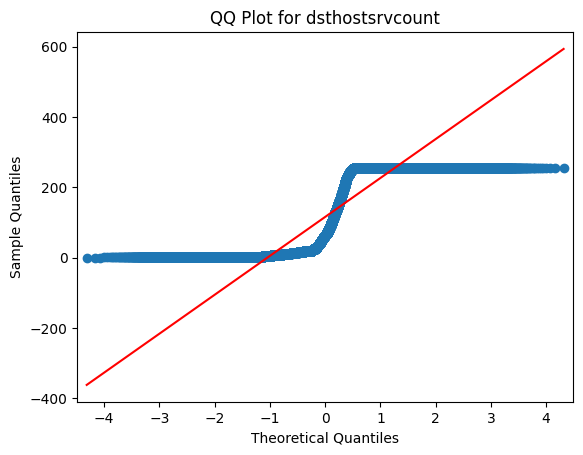

dsthostsrvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvcount across the groups in numshells (Kruskal-Wallis).
=============== dsthostsrvcount-loggedin ================
             count        mean        std  min    25%    50%    75%    max
loggedin                                                                 
0         76121.0   59.717962  87.128533  0.0    5.0   16.0   66.0  255.0
1         49852.0  201.062445  85.464667  1.0  148.0  255.0  255.0  255.0




<Figure size 800x600 with 0 Axes>

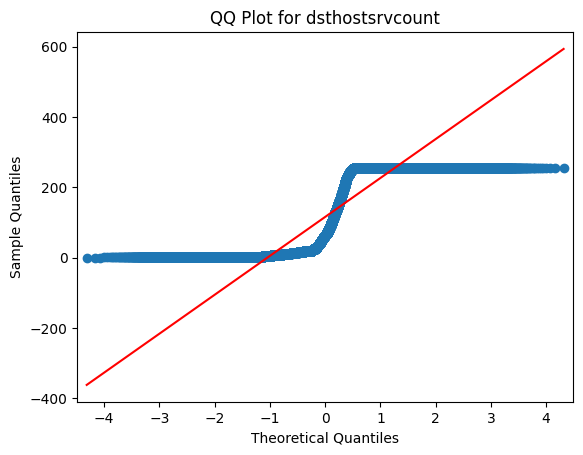

dsthostsrvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvcount across the groups in loggedin (Kruskal-Wallis).
=============== dsthostsrvcount-urgent ================
            count        mean         std  min   25%   50%    75%    max
urgent                                                                 
0       125964.0  115.661022  110.702628  0.0  10.0  63.0  255.0  255.0
1            9.0    3.444444    3.876568  1.0   1.0   1.0    4.0   11.0




<Figure size 800x600 with 0 Axes>

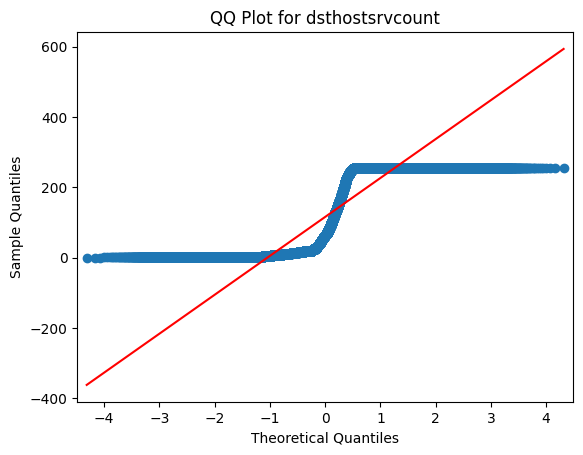

dsthostsrvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvcount across the groups in urgent (Kruskal-Wallis).
=============== dsthostsrvcount-land ================
          count        mean         std  min   25%   50%    75%    max
land                                                                 
0     125948.0  115.675088  110.702623  0.0  10.0  63.0  255.0  255.0
1         25.0    4.400000    2.738613  1.0   2.0   4.0    6.0   11.0




<Figure size 800x600 with 0 Axes>

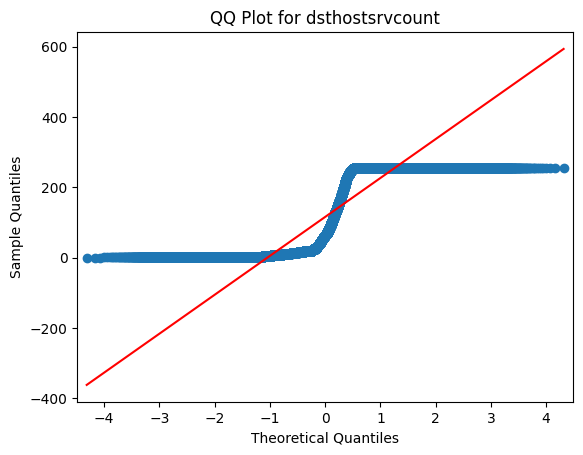

dsthostsrvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvcount across the groups in land (Kruskal-Wallis).
=============== dsthostsrvcount-lastflag ================
             count        mean         std  min    25%    50%     75%    max
lastflag                                                                   
0            66.0   53.333333   43.271356  1.0   4.25   63.5   83.75  128.0
1            62.0   21.919355   43.043363  1.0   2.00    5.0   13.75  255.0
2            54.0   26.129630   39.838375  1.0   2.00    8.5   24.00  166.0
3            65.0   42.661538   59.442272  1.0   2.00   22.0   64.00  245.0
4            79.0   32.848101   61.482349  1.0   3.00    9.0   26.50  249.0
5            81.0   20.716049   31.226685  1.0   1.00    4.0   38.00  206.0
6            96.0   32.135417   49.932928  1.0   2.00   12.5   42.25  255.0
7           118.0   28.601695   48.586

<Figure size 800x600 with 0 Axes>

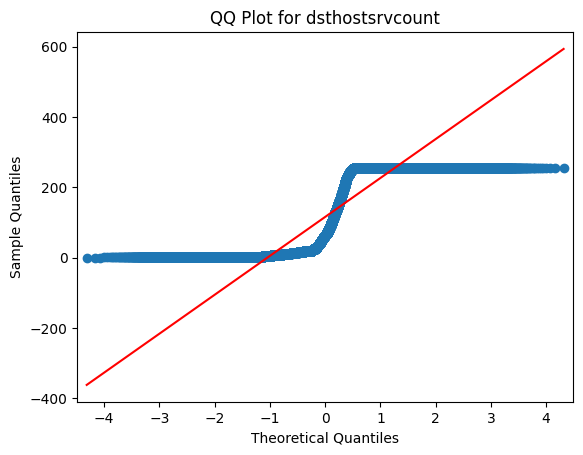

dsthostsrvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvcount across the groups in lastflag (Kruskal-Wallis).
=============== dsthostsrvcount-hot ================
         count        mean         std  min   25%   50%    75%    max
hot                                                                 
0    123302.0  116.004647  111.024243  0.0  10.0  63.0  255.0  255.0
1      2671.0   99.420067   93.265142  1.0  25.0  56.0  186.5  255.0




<Figure size 800x600 with 0 Axes>

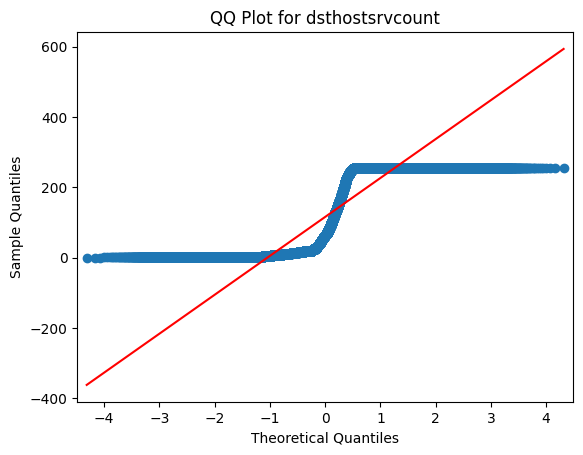

dsthostsrvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostsrvcount-rootshell ================
               count        mean         std  min   25%   50%    75%    max
rootshell                                                                 
0          125804.0  115.679342  110.697016  0.0  10.0  63.0  255.0  255.0
1             169.0   96.047337  113.533654  1.0   4.0  17.0  255.0  255.0




<Figure size 800x600 with 0 Axes>

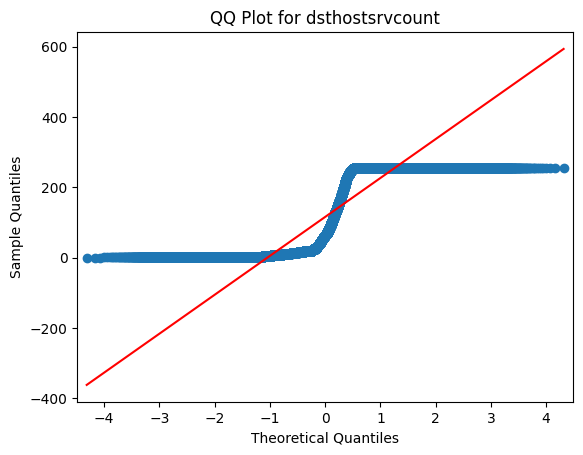

dsthostsrvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvcount across the groups in rootshell (Kruskal-Wallis).
=============== dsthostsrvcount-isguestlogin ================
                  count        mean         std  min   25%   50%    75%    max
isguestlogin                                                                 
0             124786.0  116.367790  110.941678  0.0  10.0  64.0  255.0  255.0
1               1187.0   40.509688   31.437438  1.0  16.0  37.0   55.0  144.0




<Figure size 800x600 with 0 Axes>

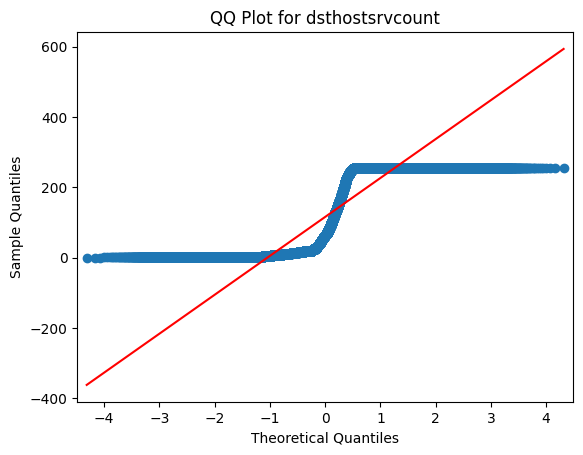

dsthostsrvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvcount across the groups in isguestlogin (Kruskal-Wallis).
=============== dsthostsrvcount-wrongfragment ================
                   count        mean         std  min   25%   50%     75%  \
wrongfragment                                                              
0              124883.0  116.149019  110.979668  0.0  10.0  63.0  255.00   
1                1090.0   58.823853   44.335935  1.0  21.0  52.0   84.75   

                 max  
wrongfragment         
0              255.0  
1              185.0  




<Figure size 800x600 with 0 Axes>

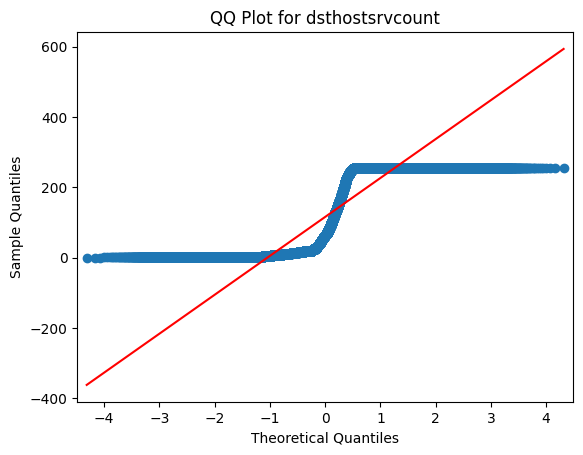

dsthostsrvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvcount across the groups in wrongfragment (Kruskal-Wallis).
=============== dsthostsrvcount-flag ================
           count        mean         std  min    25%    50%    75%    max
flag                                                                    
OTH        46.0   34.195652   77.605733  1.0    1.0    1.0    5.5  255.0
REJ     11233.0   51.442090   88.344127  0.0    1.0   10.0   20.0  255.0
RSTO     1562.0   25.270807   56.149684  1.0    4.0   10.0   18.0  255.0
RSTOS0    103.0    5.699029   24.650433  1.0    2.0    2.0    3.0  204.0
RSTR     2421.0   10.182569   41.804006  1.0    1.0    2.0    2.0  255.0
S0      34851.0   16.685949   25.098934  1.0    6.0   12.0   19.0  255.0
S1        365.0  140.378082  111.404690  1.0   19.0  154.0  255.0  255.0
S2        127.0  199.740157   85.750581  1.0  162.5  255.0  

<Figure size 800x600 with 0 Axes>

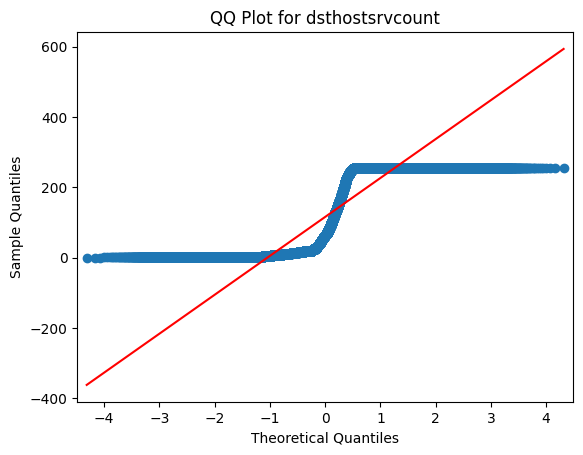

dsthostsrvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvcount across the groups in flag (Kruskal-Wallis).
=============== dsthostsrvcount-protocoltype ================
                  count        mean         std  min   25%    50%    75%    max
protocoltype                                                                  
icmp            8291.0  111.764323   84.277834  1.0  35.0   93.0  180.0  255.0
tcp           102689.0  110.260301  112.191896  0.0   9.0   39.0  255.0  255.0
udp            14993.0  154.738745  105.341830  1.0  28.0  212.0  254.0  255.0




<Figure size 800x600 with 0 Axes>

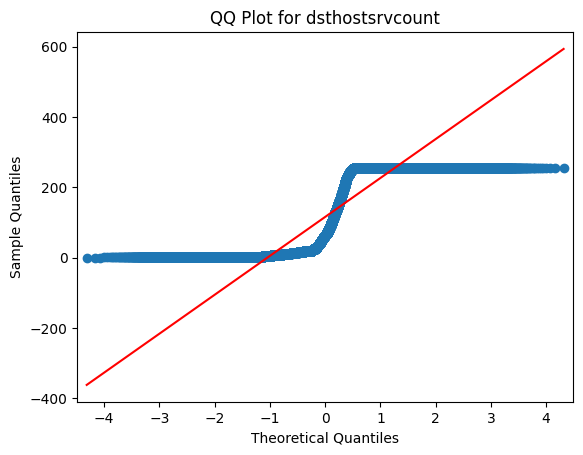

dsthostsrvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvcount across the groups in protocoltype (Kruskal-Wallis).
=============== dsthostsrvcount-numaccessfiles ================
                    count        mean         std  min   25%    50%    75%  \
numaccessfiles                                                              
0               125602.0  115.529761  110.716345  0.0  10.0   62.0  255.0   
1                  371.0  157.377358   97.544240  1.0  52.5  198.0  247.0   

                  max  
numaccessfiles         
0               255.0  
1               255.0  




<Figure size 800x600 with 0 Axes>

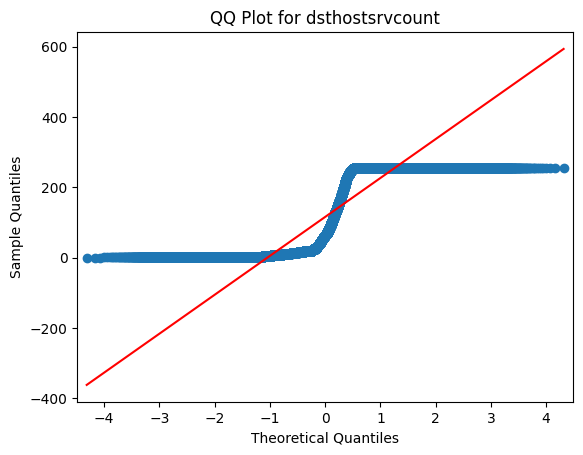

dsthostsrvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvcount across the groups in numaccessfiles (Kruskal-Wallis).
=============== dsthostsrvcount-numcompromised ================
                    count        mean         std  min    25%   50%     75%  \
numcompromised                                                               
0               124687.0  115.702423  110.852084  0.0  10.00  62.0  255.00   
1                 1286.0  110.861586   95.030855  1.0  23.25  80.0  212.75   

                  max  
numcompromised         
0               255.0  
1               255.0  




<Figure size 800x600 with 0 Axes>

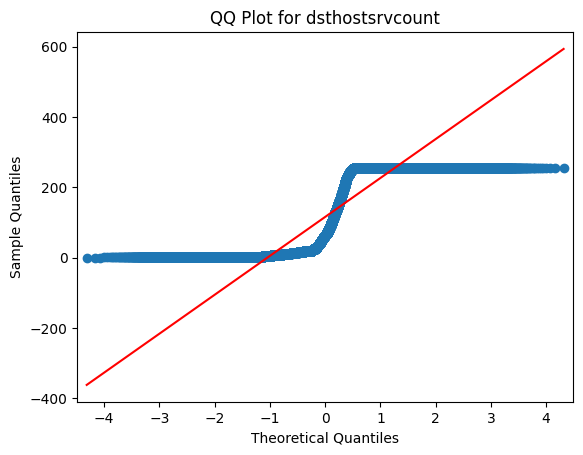

dsthostsrvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvcount across the groups in numcompromised (Kruskal-Wallis).
=============== dsthostsrvrerrorrate-suattempted ================
                 count      mean       std  min  25%  50%   75%   max
suattempted                                                         
0            125893.0  0.120281  0.319546  0.0  0.0  0.0  0.00  1.00
1                80.0  0.055000  0.102500  0.0  0.0  0.0  0.08  0.36




<Figure size 800x600 with 0 Axes>

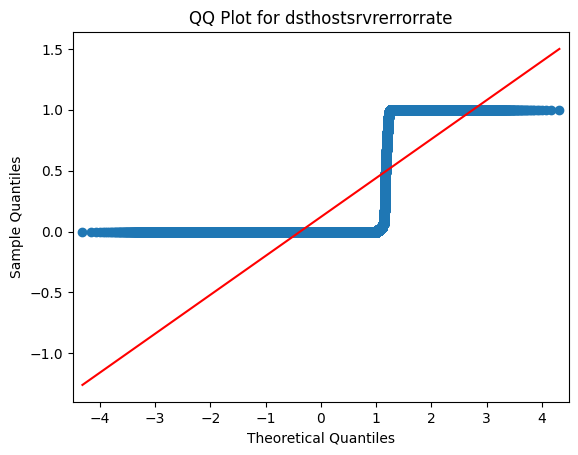

dsthostsrvrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvrerrorrate across the groups in suattempted (Kruskal-Wallis).
=============== dsthostsrvrerrorrate-numfilecreations ================
                      count      mean       std  min  25%  50%  75%   max
numfilecreations                                                        
0                 125686.0  0.120449  0.319771  0.0  0.0  0.0  0.0  1.00
1                    287.0  0.028850  0.081329  0.0  0.0  0.0  0.0  0.67




<Figure size 800x600 with 0 Axes>

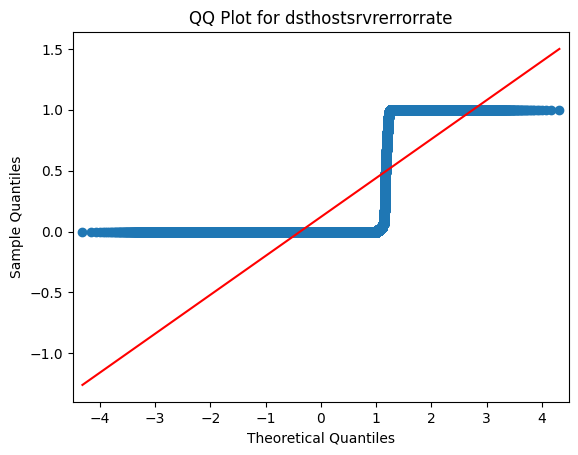

dsthostsrvrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostsrvrerrorrate-numfailedlogins ================
                     count      mean       std  min  25%    50%   75%   max
numfailedlogins                                                           
0                125851.0  0.119967  0.319202  0.0  0.0  0.000  0.00  1.00
1                   122.0  0.401393  0.440262  0.0  0.0  0.095  0.93  0.96




<Figure size 800x600 with 0 Axes>

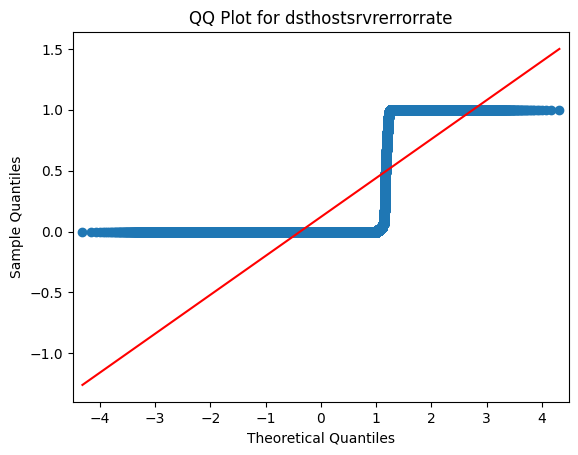

dsthostsrvrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvrerrorrate across the groups in numfailedlogins (Kruskal-Wallis).
=============== dsthostsrvrerrorrate-numroot ================
             count      mean       std  min  25%  50%  75%  max
numroot                                                       
0        125324.0  0.120791  0.320158  0.0  0.0  0.0  0.0  1.0
1           649.0  0.013837  0.066208  0.0  0.0  0.0  0.0  1.0




<Figure size 800x600 with 0 Axes>

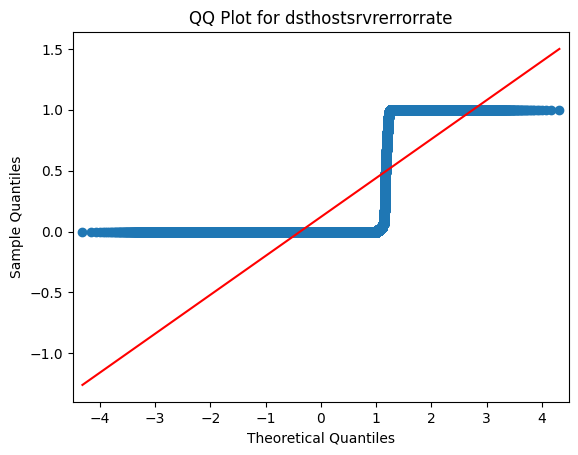

dsthostsrvrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvrerrorrate across the groups in numroot (Kruskal-Wallis).
=============== dsthostsrvrerrorrate-numshells ================
               count      mean       std  min  25%  50%  75%  max
numshells                                                       
0          125926.0  0.120284  0.319511  0.0  0.0  0.0  0.0  1.0
1              47.0  0.002128  0.014586  0.0  0.0  0.0  0.0  0.1




<Figure size 800x600 with 0 Axes>

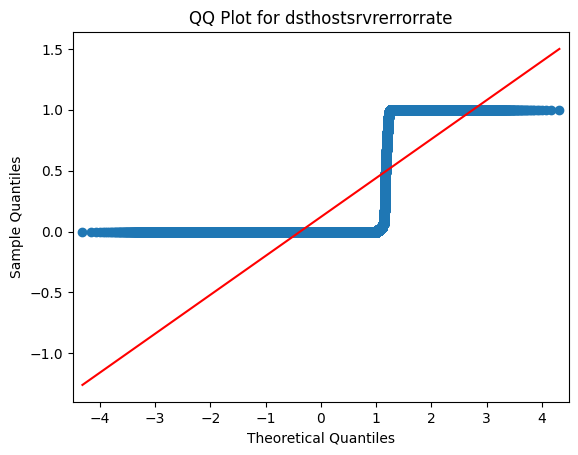

dsthostsrvrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvrerrorrate across the groups in numshells (Kruskal-Wallis).
=============== dsthostsrvrerrorrate-loggedin ================
             count      mean       std  min  25%  50%  75%  max
loggedin                                                      
0         76121.0  0.190767  0.389271  0.0  0.0  0.0  0.0  1.0
1         49852.0  0.012549  0.085522  0.0  0.0  0.0  0.0  1.0




<Figure size 800x600 with 0 Axes>

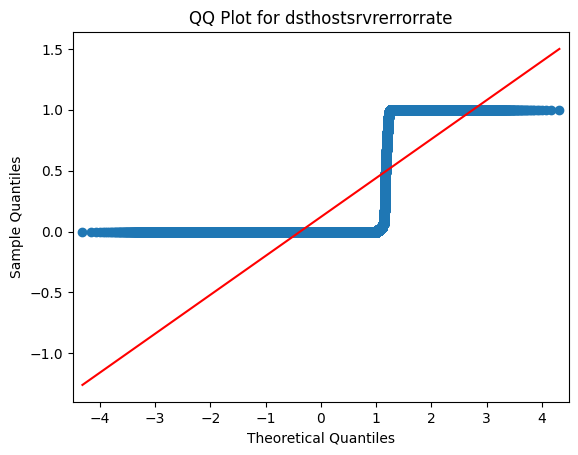

dsthostsrvrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvrerrorrate across the groups in loggedin (Kruskal-Wallis).
=============== dsthostsrvrerrorrate-urgent ================
            count      mean       std  min  25%  50%  75%  max
urgent                                                       
0       125964.0  0.120248  0.319469  0.0  0.0  0.0  0.0  1.0
1            9.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0




<Figure size 800x600 with 0 Axes>

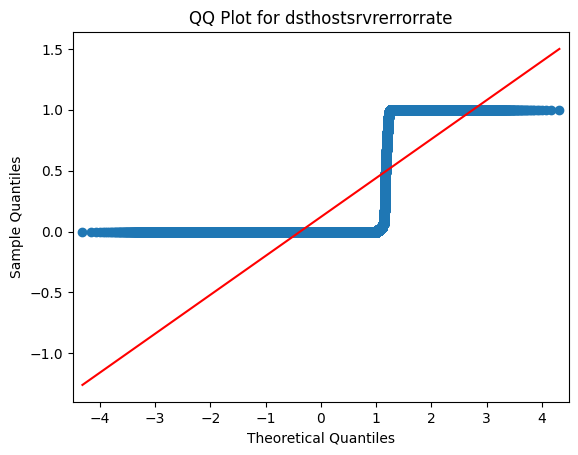

dsthostsrvrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostsrvrerrorrate-land ================
          count      mean       std  min  25%  50%  75%  max
land                                                       
0     125948.0  0.120264  0.319487  0.0  0.0  0.0  0.0  1.0
1         25.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0




<Figure size 800x600 with 0 Axes>

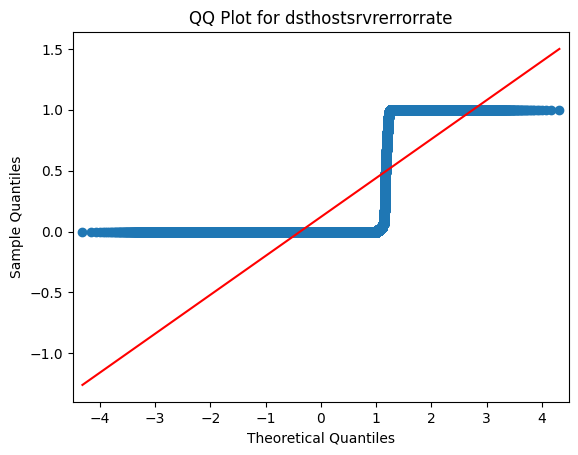

dsthostsrvrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvrerrorrate across the groups in land (Kruskal-Wallis).
=============== dsthostsrvrerrorrate-lastflag ================
             count      mean       std  min  25%   50%     75%   max
lastflag                                                           
0            66.0  0.010152  0.082471  0.0  0.0  0.00  0.0000  0.67
1            62.0  0.013387  0.068256  0.0  0.0  0.00  0.0000  0.50
2            54.0  0.010926  0.034764  0.0  0.0  0.00  0.0000  0.14
3            65.0  0.030154  0.142725  0.0  0.0  0.00  0.0000  1.00
4            79.0  0.031646  0.138281  0.0  0.0  0.00  0.0000  1.00
5            81.0  0.088519  0.234974  0.0  0.0  0.00  0.0000  1.00
6            96.0  0.086979  0.253207  0.0  0.0  0.00  0.0025  1.00
7           118.0  0.146610  0.325275  0.0  0.0  0.00  0.0500  1.00
8           106.0  0.134528

<Figure size 800x600 with 0 Axes>

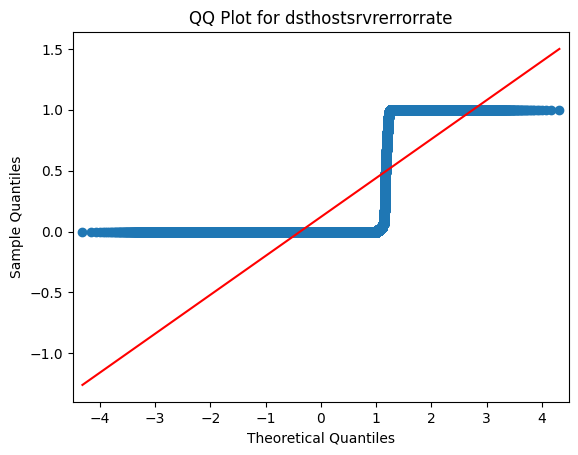

dsthostsrvrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvrerrorrate across the groups in lastflag (Kruskal-Wallis).
=============== dsthostsrvrerrorrate-hot ================
         count      mean       std  min  25%  50%   75%  max
hot                                                        
0    123302.0  0.121724  0.321910  0.0  0.0  0.0  0.00  1.0
1      2671.0  0.051715  0.157198  0.0  0.0  0.0  0.04  1.0




<Figure size 800x600 with 0 Axes>

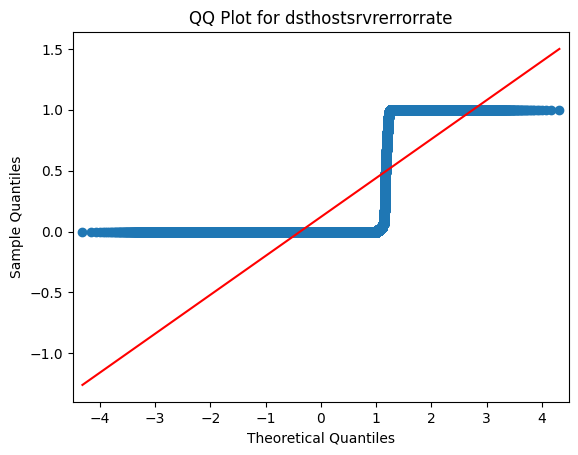

dsthostsrvrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvrerrorrate across the groups in hot (Kruskal-Wallis).
=============== dsthostsrvrerrorrate-rootshell ================
               count      mean       std  min  25%  50%  75%   max
rootshell                                                        
0          125804.0  0.120354  0.319638  0.0  0.0  0.0  0.0  1.00
1             169.0  0.035325  0.100659  0.0  0.0  0.0  0.0  0.96




<Figure size 800x600 with 0 Axes>

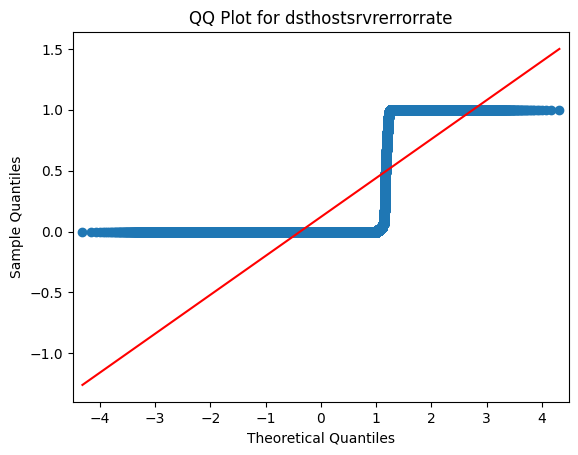

dsthostsrvrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostsrvrerrorrate-isguestlogin ================
                  count      mean       std  min  25%  50%  75%  max
isguestlogin                                                       
0             124786.0  0.121271  0.320745  0.0  0.0  0.0  0.0  1.0
1               1187.0  0.011879  0.060560  0.0  0.0  0.0  0.0  1.0




<Figure size 800x600 with 0 Axes>

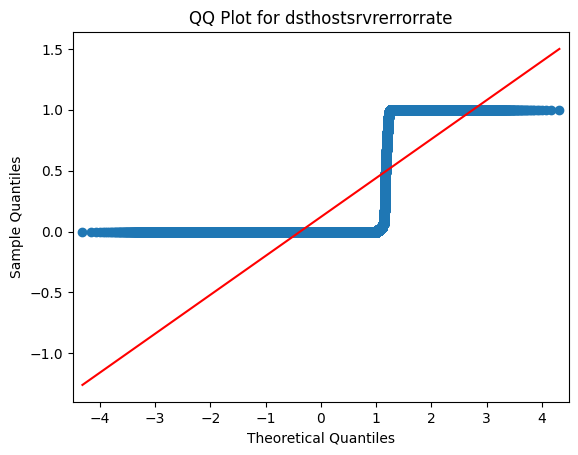

dsthostsrvrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvrerrorrate across the groups in isguestlogin (Kruskal-Wallis).
=============== dsthostsrvrerrorrate-wrongfragment ================
                   count      mean       std  min  25%  50%  75%  max
wrongfragment                                                       
0              124883.0  0.121289  0.320652  0.0  0.0  0.0  0.0  1.0
1                1090.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0




<Figure size 800x600 with 0 Axes>

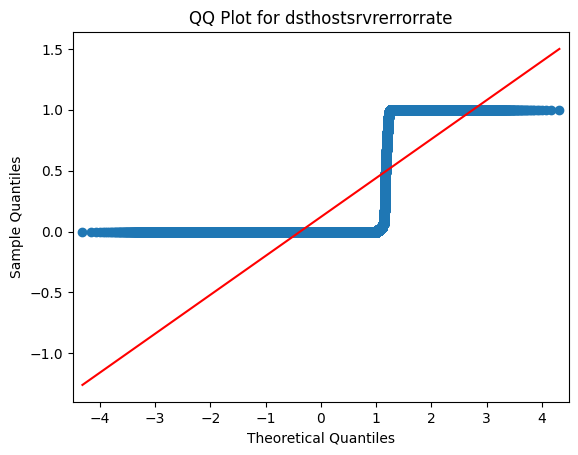

dsthostsrvrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvrerrorrate across the groups in wrongfragment (Kruskal-Wallis).
=============== dsthostsrvrerrorrate-flag ================
           count      mean       std   min   25%  50%  75%   max
flag                                                           
OTH        46.0  0.000000  0.000000  0.00  0.00  0.0  0.0  0.00
REJ     11233.0  0.966717  0.133696  0.00  1.00  1.0  1.0  1.00
RSTO     1562.0  0.882151  0.301342  0.00  1.00  1.0  1.0  1.00
RSTOS0    103.0  0.482816  0.199536  0.00  0.33  0.5  0.5  1.00
RSTR     2421.0  0.942131  0.209213  0.01  1.00  1.0  1.0  1.00
S0      34851.0  0.000809  0.027136  0.00  0.00  0.0  0.0  1.00
S1        365.0  0.041151  0.153994  0.00  0.00  0.0  0.0  1.00
S2        127.0  0.028031  0.122507  0.00  0.00  0.0  0.0  0.97
S3         49.0  0.052449  0.199181  0.00  0.00  0.0  0.0  0.9

<Figure size 800x600 with 0 Axes>

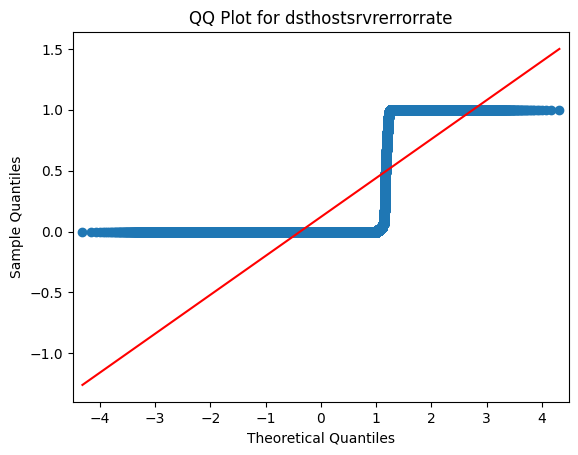

dsthostsrvrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvrerrorrate across the groups in flag (Kruskal-Wallis).
=============== dsthostsrvrerrorrate-protocoltype ================
                  count      mean       std  min  25%  50%  75%  max
protocoltype                                                       
icmp            8291.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0
tcp           102689.0  0.147503  0.348099  0.0  0.0  0.0  0.0  1.0
udp            14993.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0




<Figure size 800x600 with 0 Axes>

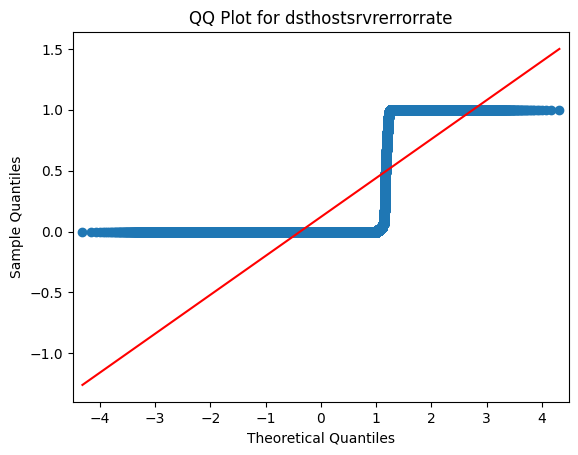

dsthostsrvrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvrerrorrate across the groups in protocoltype (Kruskal-Wallis).
=============== dsthostsrvrerrorrate-numaccessfiles ================
                    count      mean       std  min  25%  50%  75%   max
numaccessfiles                                                        
0               125602.0  0.120556  0.319866  0.0  0.0  0.0  0.0  1.00
1                  371.0  0.013208  0.050604  0.0  0.0  0.0  0.0  0.44




<Figure size 800x600 with 0 Axes>

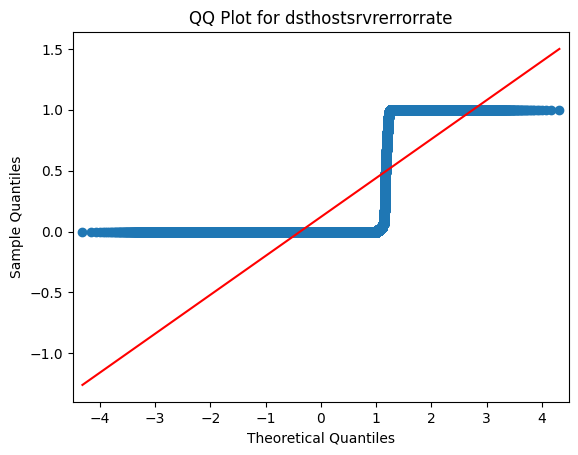

dsthostsrvrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvrerrorrate across the groups in numaccessfiles (Kruskal-Wallis).
=============== dsthostsrvrerrorrate-numcompromised ================
                    count      mean       std  min   25%   50%   75%  max
numcompromised                                                          
0               124687.0  0.120905  0.320899  0.0  0.00  0.00  0.00  1.0
1                 1286.0  0.055754  0.092248  0.0  0.01  0.03  0.06  1.0




<Figure size 800x600 with 0 Axes>

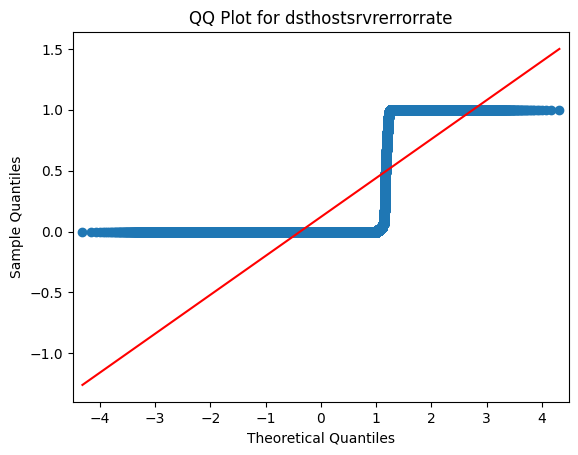

dsthostsrvrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvrerrorrate across the groups in numcompromised (Kruskal-Wallis).
=============== dsthostsamesrcportrate-suattempted ================
                 count      mean       std  min  25%   50%   75%  max
suattempted                                                         
0            125893.0  0.148429  0.309047  0.0  0.0  0.00  0.06  1.0
1                80.0  0.070250  0.204382  0.0  0.0  0.01  0.03  1.0




<Figure size 800x600 with 0 Axes>

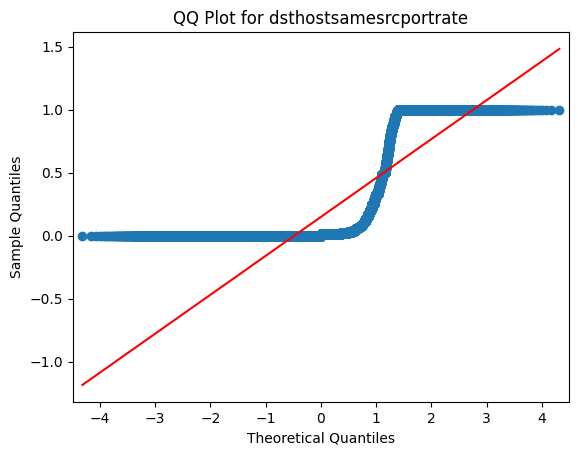

dsthostsamesrcportrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostsamesrcportrate-numfilecreations ================
                      count      mean       std  min  25%   50%   75%  max
numfilecreations                                                         
0                 125686.0  0.148348  0.309061  0.0  0.0  0.00  0.06  1.0
1                    287.0  0.161847  0.279703  0.0  0.0  0.01  0.20  1.0




<Figure size 800x600 with 0 Axes>

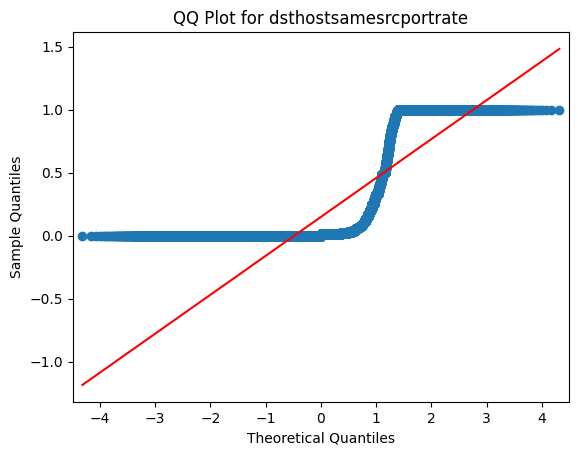

dsthostsamesrcportrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrcportrate across the groups in numfilecreations (Kruskal-Wallis).
=============== dsthostsamesrcportrate-numfailedlogins ================
                     count      mean       std  min   25%   50%   75%  max
numfailedlogins                                                          
0                125851.0  0.148460  0.309095  0.0  0.00  0.00  0.06  1.0
1                   122.0  0.064672  0.162634  0.0  0.01  0.03  0.04  1.0




<Figure size 800x600 with 0 Axes>

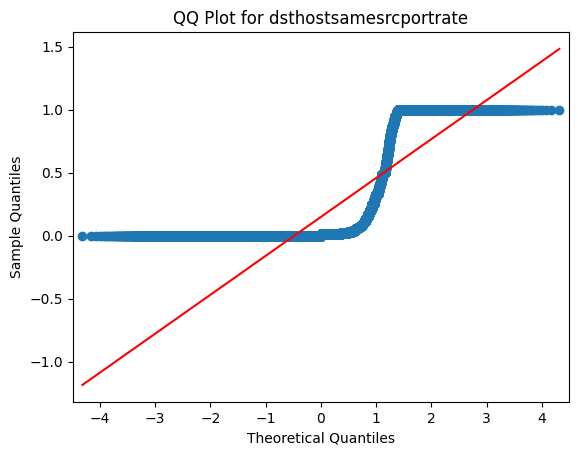

dsthostsamesrcportrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrcportrate across the groups in numfailedlogins (Kruskal-Wallis).
=============== dsthostsamesrcportrate-numroot ================
             count      mean       std  min   25%   50%   75%  max
numroot                                                          
0        125324.0  0.147761  0.308888  0.0  0.00  0.00  0.06  1.0
1           649.0  0.267627  0.307141  0.0  0.02  0.15  0.38  1.0




<Figure size 800x600 with 0 Axes>

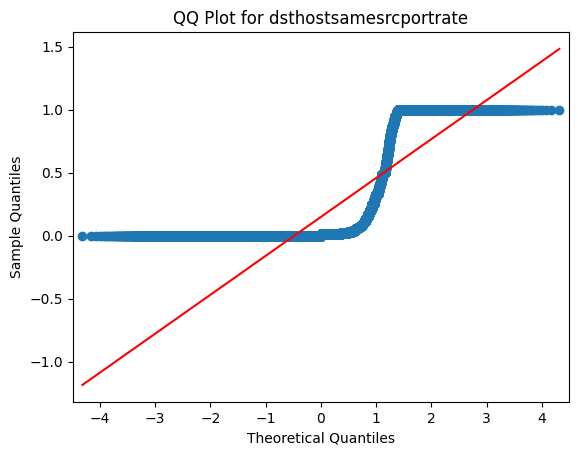

dsthostsamesrcportrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrcportrate across the groups in numroot (Kruskal-Wallis).
=============== dsthostsamesrcportrate-numshells ================
               count      mean       std  min    25%   50%   75%  max
numshells                                                           
0          125926.0  0.148307  0.308984  0.0  0.000  0.00  0.06  1.0
1              47.0  0.340638  0.287783  0.0  0.165  0.28  0.42  1.0




<Figure size 800x600 with 0 Axes>

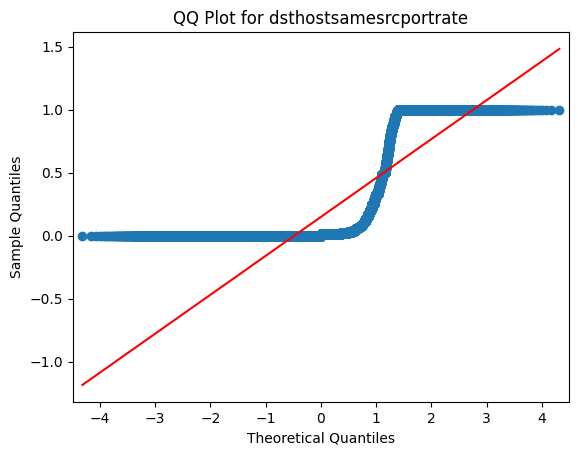

dsthostsamesrcportrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrcportrate across the groups in numshells (Kruskal-Wallis).
=============== dsthostsamesrcportrate-loggedin ================
             count      mean       std  min  25%   50%   75%  max
loggedin                                                        
0         76121.0  0.188637  0.356453  0.0  0.0  0.00  0.11  1.0
1         49852.0  0.086907  0.202502  0.0  0.0  0.01  0.05  1.0




<Figure size 800x600 with 0 Axes>

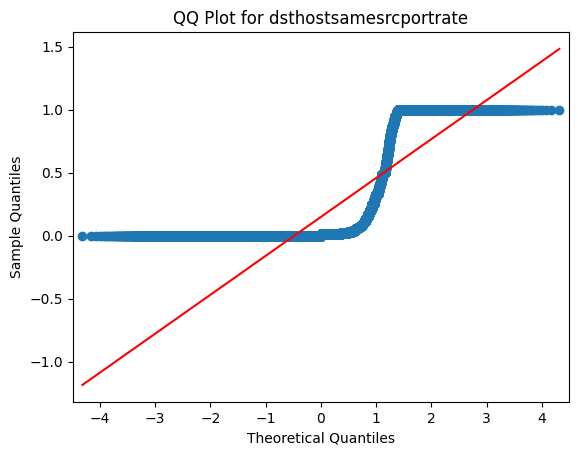

dsthostsamesrcportrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrcportrate across the groups in loggedin (Kruskal-Wallis).
=============== dsthostsamesrcportrate-urgent ================
            count      mean       std  min  25%   50%   75%  max
urgent                                                         
0       125964.0  0.148365  0.308985  0.0  0.0  0.00  0.06  1.0
1            9.0  0.337778  0.429266  0.0  0.0  0.03  0.50  1.0




<Figure size 800x600 with 0 Axes>

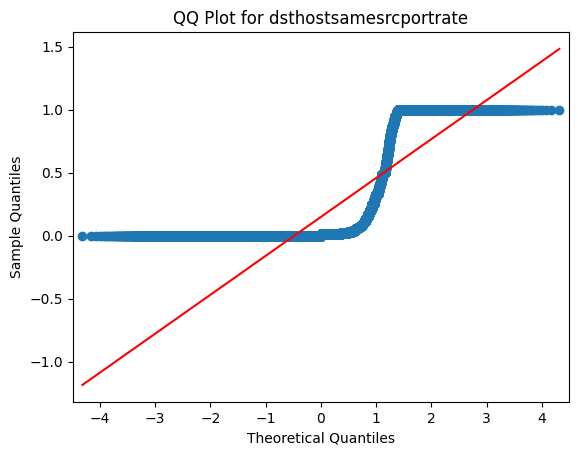

dsthostsamesrcportrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostsamesrcportrate-land ================
          count      mean       std   min  25%  50%   75%  max
land                                                         
0     125948.0  0.148231  0.308823  0.00  0.0  0.0  0.06  1.0
1         25.0  0.890800  0.301909  0.07  1.0  1.0  1.00  1.0




<Figure size 800x600 with 0 Axes>

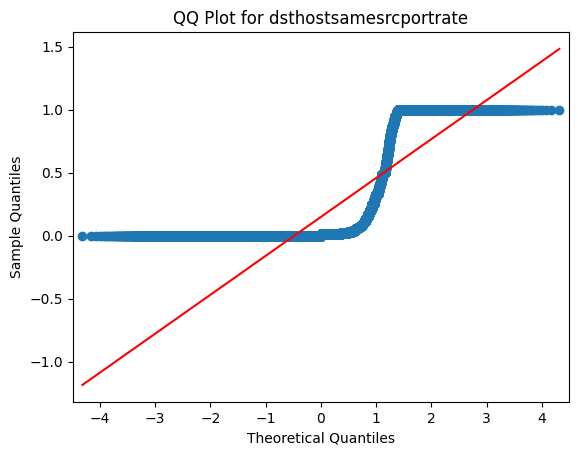

dsthostsamesrcportrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrcportrate across the groups in land (Kruskal-Wallis).
=============== dsthostsamesrcportrate-lastflag ================
             count      mean       std  min   25%    50%     75%  max
lastflag                                                            
0            66.0  0.245606  0.214125  0.0  0.01  0.320  0.3600  1.0
1            62.0  0.409677  0.418604  0.0  0.02  0.185  1.0000  1.0
2            54.0  0.229074  0.326937  0.0  0.01  0.080  0.2375  1.0
3            65.0  0.403385  0.438664  0.0  0.01  0.200  1.0000  1.0
4            79.0  0.256962  0.415073  0.0  0.00  0.010  0.2800  1.0
5            81.0  0.169259  0.342523  0.0  0.00  0.010  0.0400  1.0
6            96.0  0.196667  0.335649  0.0  0.01  0.020  0.1625  1.0
7           118.0  0.245424  0.383463  0.0  0.00  0.015  0.2500  1.0
8          

<Figure size 800x600 with 0 Axes>

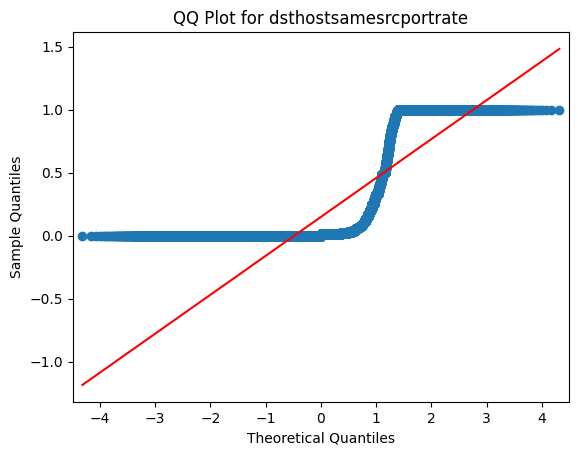

dsthostsamesrcportrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrcportrate across the groups in lastflag (Kruskal-Wallis).
=============== dsthostsamesrcportrate-hot ================
         count      mean       std  min  25%   50%   75%  max
hot                                                         
0    123302.0  0.150188  0.310660  0.0  0.0  0.00  0.07  1.0
1      2671.0  0.064845  0.202006  0.0  0.0  0.01  0.02  1.0




<Figure size 800x600 with 0 Axes>

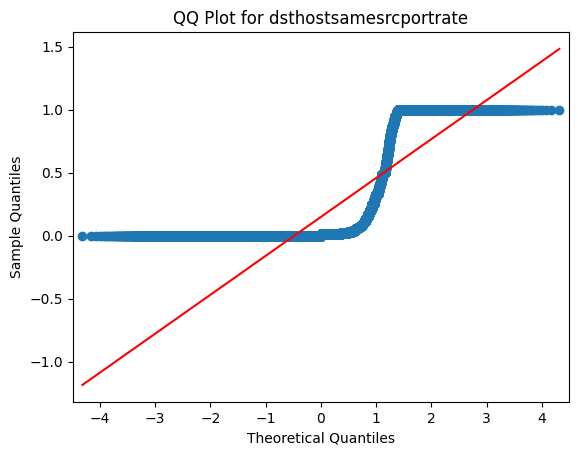

dsthostsamesrcportrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostsamesrcportrate-rootshell ================
               count      mean       std  min  25%   50%   75%  max
rootshell                                                         
0          125804.0  0.148361  0.308986  0.0  0.0  0.00  0.06  1.0
1             169.0  0.161598  0.317914  0.0  0.0  0.02  0.08  1.0




<Figure size 800x600 with 0 Axes>

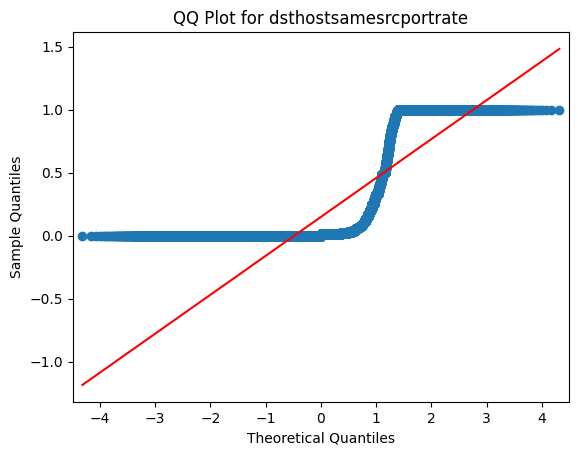

dsthostsamesrcportrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrcportrate across the groups in rootshell (Kruskal-Wallis).
=============== dsthostsamesrcportrate-isguestlogin ================
                  count      mean       std  min  25%   50%   75%  max
isguestlogin                                                         
0             124786.0  0.149450  0.309949  0.0  0.0  0.00  0.06  1.0
1               1187.0  0.035762  0.144180  0.0  0.0  0.01  0.01  1.0




<Figure size 800x600 with 0 Axes>

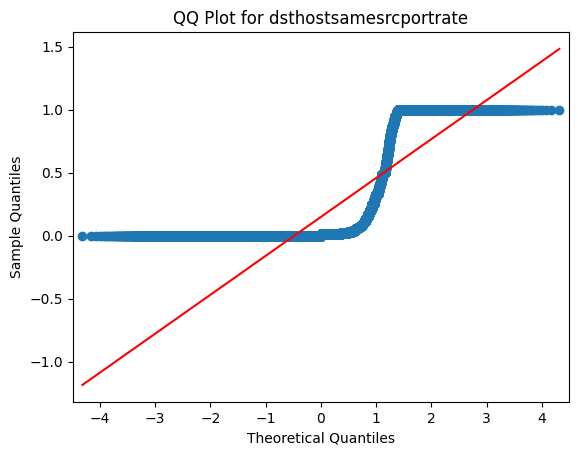

dsthostsamesrcportrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrcportrate across the groups in isguestlogin (Kruskal-Wallis).
=============== dsthostsamesrcportrate-wrongfragment ================
                   count      mean       std  min   25%   50%   75%  max
wrongfragment                                                          
0              124883.0  0.146969  0.309000  0.0  0.00  0.00  0.06  1.0
1                1090.0  0.309881  0.262728  0.0  0.12  0.25  0.38  1.0




<Figure size 800x600 with 0 Axes>

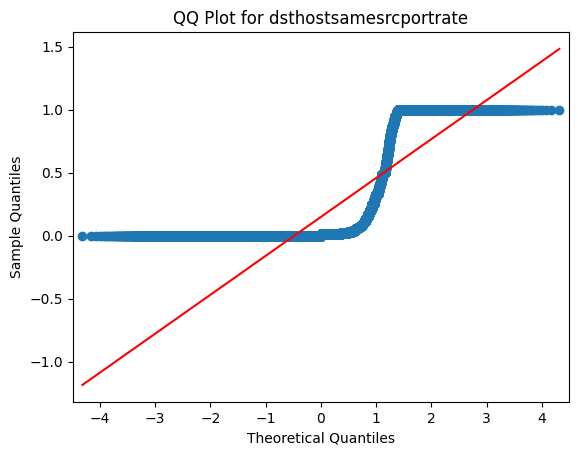

dsthostsamesrcportrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrcportrate across the groups in wrongfragment (Kruskal-Wallis).
=============== dsthostsamesrcportrate-flag ================
           count      mean       std   min    25%    50%   75%   max
flag                                                               
OTH        46.0  0.531957  0.341478  0.00  0.085  0.695  0.74  1.00
REJ     11233.0  0.079959  0.216785  0.00  0.000  0.000  0.02  1.00
RSTO     1562.0  0.042503  0.172484  0.00  0.000  0.000  0.00  1.00
RSTOS0    103.0  0.498544  0.266872  0.01  0.300  0.540  0.71  0.92
RSTR     2421.0  0.692090  0.364706  0.00  0.380  0.960  1.00  1.00
S0      34851.0  0.005660  0.055730  0.00  0.000  0.000  0.00  1.00
S1        365.0  0.116329  0.227112  0.00  0.010  0.010  0.09  1.00
S2        127.0  0.131732  0.258976  0.00  0.010  0.020  0.09  1.00
S3         49.0 

<Figure size 800x600 with 0 Axes>

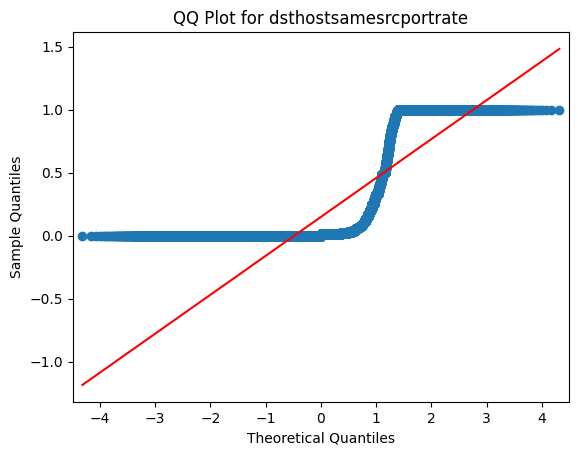

dsthostsamesrcportrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrcportrate across the groups in flag (Kruskal-Wallis).
=============== dsthostsamesrcportrate-protocoltype ================
                  count      mean       std  min   25%   50%   75%  max
protocoltype                                                          
icmp            8291.0  0.789840  0.346418  0.0  0.62  1.00  1.00  1.0
tcp           102689.0  0.078612  0.211666  0.0  0.00  0.00  0.02  1.0
udp            14993.0  0.271497  0.391135  0.0  0.00  0.01  0.61  1.0




<Figure size 800x600 with 0 Axes>

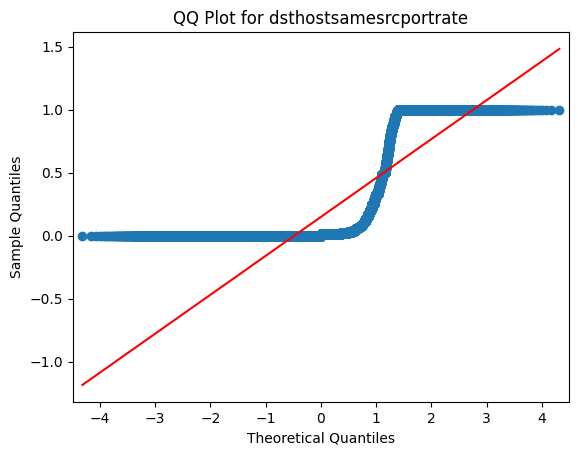

dsthostsamesrcportrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrcportrate across the groups in protocoltype (Kruskal-Wallis).
=============== dsthostsamesrcportrate-numaccessfiles ================
                    count      mean       std  min  25%  50%   75%  max
numaccessfiles                                                        
0               125602.0  0.148655  0.309262  0.0  0.0  0.0  0.06  1.0
1                  371.0  0.054798  0.177065  0.0  0.0  0.0  0.01  1.0




<Figure size 800x600 with 0 Axes>

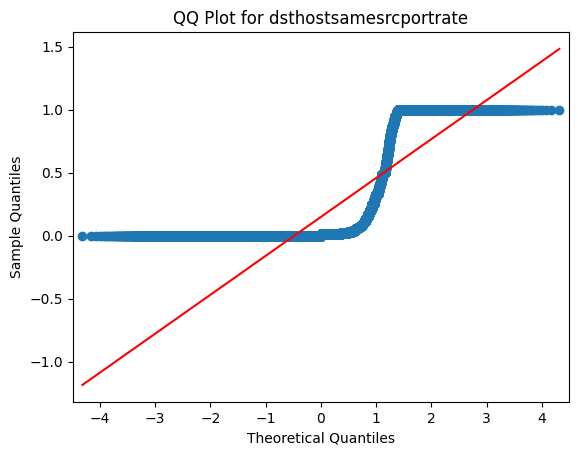

dsthostsamesrcportrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrcportrate across the groups in numaccessfiles (Kruskal-Wallis).
=============== dsthostsamesrcportrate-numcompromised ================
                    count      mean       std  min  25%   50%   75%  max
numcompromised                                                         
0               124687.0  0.149451  0.309998  0.0  0.0  0.00  0.06  1.0
1                 1286.0  0.044386  0.156474  0.0  0.0  0.01  0.02  1.0




<Figure size 800x600 with 0 Axes>

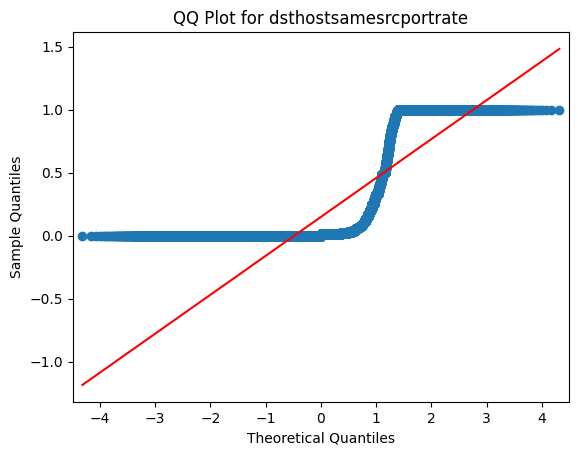

dsthostsamesrcportrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== duration-suattempted ================
                 count      mean        std  min   25%   50%   75%   max
suattempted                                                            
0            125893.0   1.29475   5.813043  0.0   0.0   0.0   0.0  31.0
1                80.0  25.96250  11.508328  0.0  31.0  31.0  31.0  31.0




<Figure size 800x600 with 0 Axes>

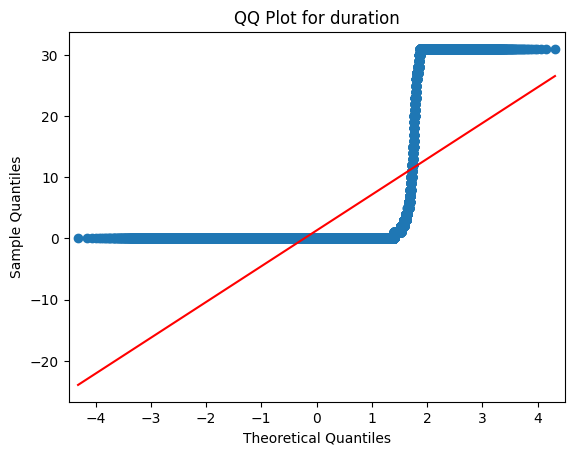

duration does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the duration across the groups in suattempted (Kruskal-Wallis).
=============== duration-numfilecreations ================
                      count       mean        std  min  25%  50%   75%   max
numfilecreations                                                           
0                 125686.0   1.281845   5.782799  0.0  0.0  0.0   0.0  31.0
1                    287.0  13.822300  15.093408  0.0  0.0  1.0  31.0  31.0




<Figure size 800x600 with 0 Axes>

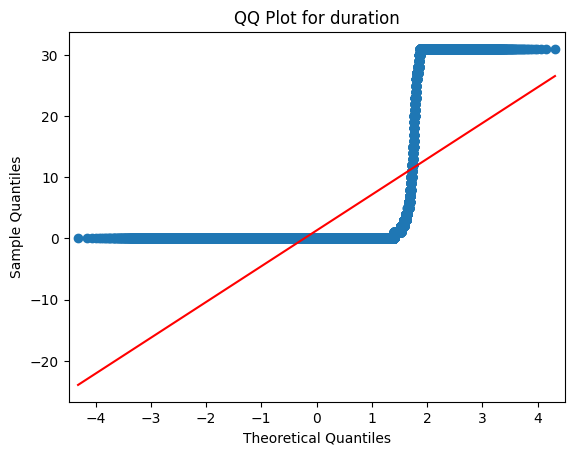

duration does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the duration across the groups in numfilecreations (Kruskal-Wallis).
=============== duration-numfailedlogins ================
                     count       mean        std  min  25%  50%   75%   max
numfailedlogins                                                           
0                125851.0   1.300697   5.829406  0.0  0.0  0.0   0.0  31.0
1                   122.0  11.336066  14.165848  0.0  0.0  1.0  31.0  31.0




<Figure size 800x600 with 0 Axes>

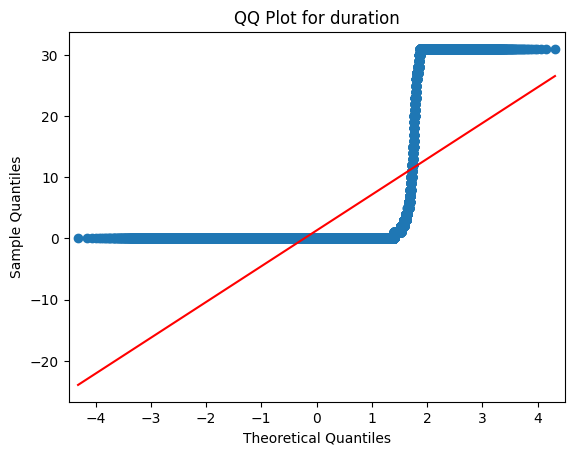

duration does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the duration across the groups in numfailedlogins (Kruskal-Wallis).
=============== duration-numroot ================
             count      mean        std  min  25%  50%  75%   max
numroot                                                         
0        125324.0  1.284128   5.786656  0.0  0.0  0.0  0.0  31.0
1           649.0  6.386749  12.415637  0.0  0.0  0.0  0.0  31.0




<Figure size 800x600 with 0 Axes>

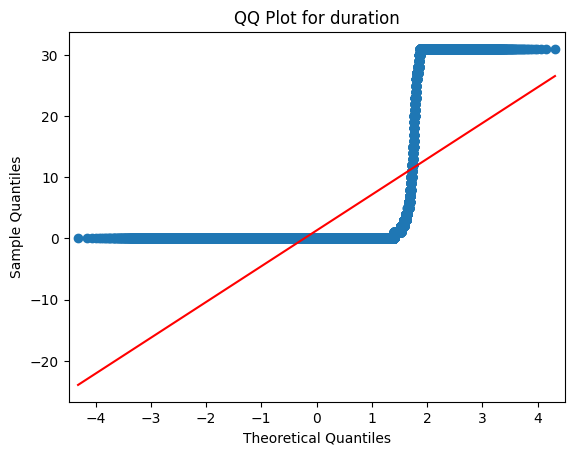

duration does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the duration across the groups in numroot (Kruskal-Wallis).
=============== duration-numshells ================
               count      mean        std  min  25%  50%  75%   max
numshells                                                         
0          125926.0  1.308491   5.846714  0.0  0.0  0.0  0.0  31.0
1              47.0  6.468085  12.604090  0.0  0.0  0.0  0.0  31.0




<Figure size 800x600 with 0 Axes>

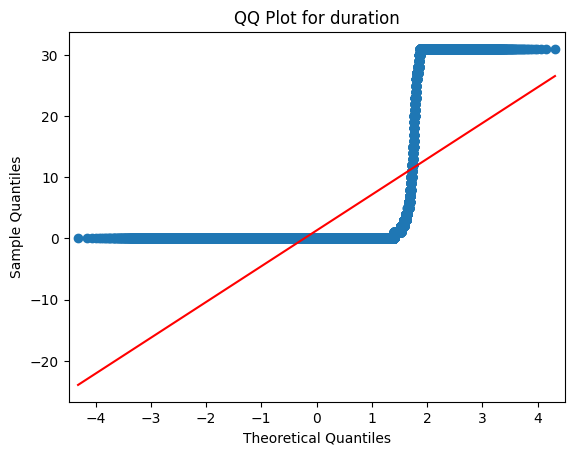

duration does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the duration across the groups in numshells (Kruskal-Wallis).
=============== duration-loggedin ================
             count      mean       std  min  25%  50%  75%   max
loggedin                                                       
0         76121.0  1.234206  5.917346  0.0  0.0  0.0  0.0  31.0
1         49852.0  1.426783  5.747437  0.0  0.0  0.0  0.0  31.0




<Figure size 800x600 with 0 Axes>

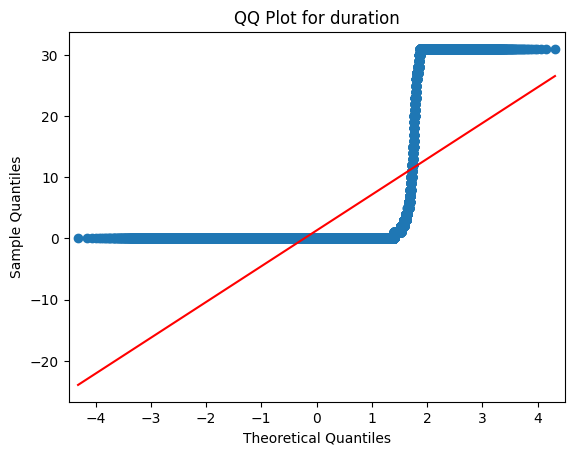

duration does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the duration across the groups in loggedin (Kruskal-Wallis).
=============== duration-urgent ================
            count       mean       std   min   25%   50%   75%   max
urgent                                                             
0       125964.0   1.308421  5.846728   0.0   0.0   0.0   0.0  31.0
1            9.0  29.222222  5.333333  15.0  31.0  31.0  31.0  31.0




<Figure size 800x600 with 0 Axes>

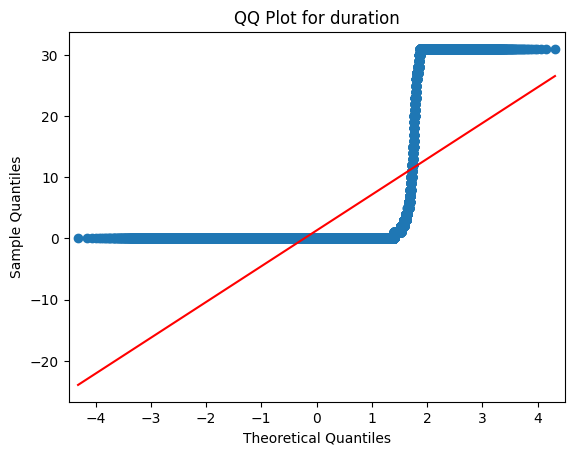

duration does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the duration across the groups in urgent (Kruskal-Wallis).
=============== duration-land ================
          count      mean       std  min  25%  50%  75%   max
land                                                        
0     125948.0  1.310676  5.851984  0.0  0.0  0.0  0.0  31.0
1         25.0  0.000000  0.000000  0.0  0.0  0.0  0.0   0.0




<Figure size 800x600 with 0 Axes>

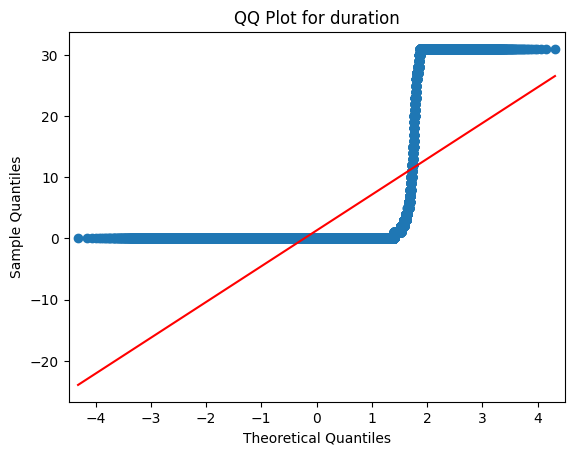

duration does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== duration-lastflag ================
             count       mean        std  min  25%  50%   75%   max
lastflag                                                          
0            66.0   2.393939   7.293577  0.0  0.0  0.0   0.0  31.0
1            62.0   6.000000  10.942473  0.0  0.0  0.0   6.0  31.0
2            54.0  15.851852  14.891314  0.0  0.0  9.0  31.0  31.0
3            65.0   6.846154  12.356970  0.0  0.0  0.0   3.0  31.0
4            79.0  10.253165  13.960079  0.0  0.0  1.0  31.0  31.0
5            81.0   4.382716   9.490216  0.0  0.0  0.0   1.0  31.0
6            96.0   2.072917   6.560239  0.0  0.0  0.0   0.0  31.0
7           118.0   2.754237   7.016387  0.0  0.0  0.0   2.0  31.0
8           106.0   2.160377   5.119778  0.0  0.0  0.0   2.0  31.0
9           194

<Figure size 800x600 with 0 Axes>

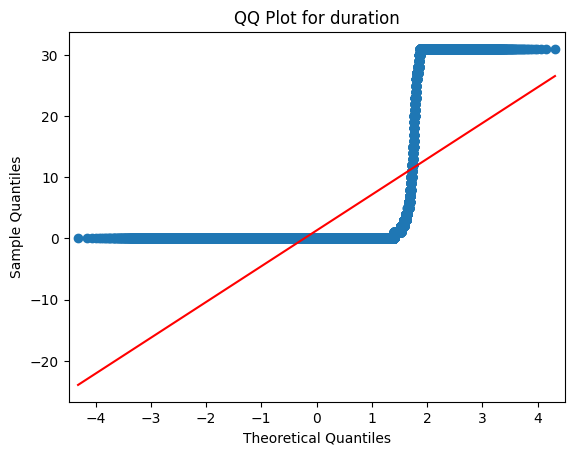

duration does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the duration across the groups in lastflag (Kruskal-Wallis).
=============== duration-hot ================
         count       mean        std  min  25%  50%   75%   max
hot                                                           
0    123302.0   1.103064   5.393855  0.0  0.0  0.0   0.0  31.0
1      2671.0  10.882441  13.350379  0.0  0.0  0.0  27.0  31.0




<Figure size 800x600 with 0 Axes>

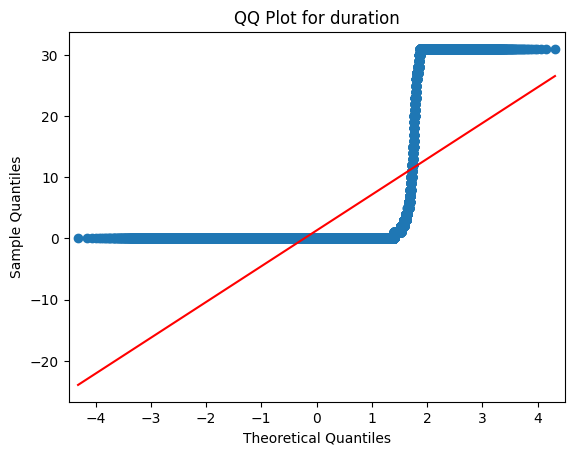

duration does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the duration across the groups in hot (Kruskal-Wallis).
=============== duration-rootshell ================
               count       mean        std  min  25%   50%   75%   max
rootshell                                                            
0          125804.0   1.289291   5.800054  0.0  0.0   0.0   0.0  31.0
1             169.0  17.035503  15.284950  0.0  0.0  31.0  31.0  31.0




<Figure size 800x600 with 0 Axes>

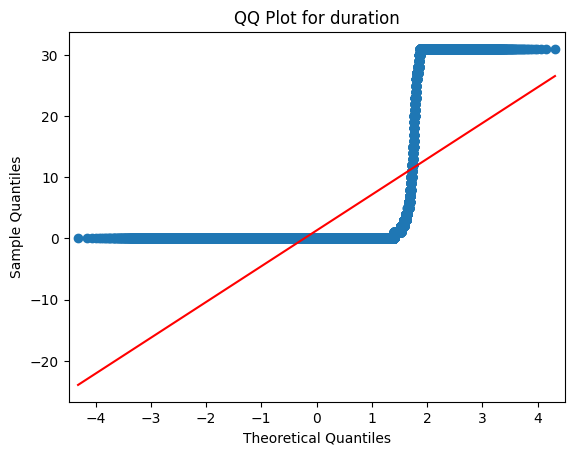

duration does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the duration across the groups in rootshell (Kruskal-Wallis).
=============== duration-isguestlogin ================
                  count       mean        std  min   25%   50%   75%   max
isguestlogin                                                             
0             124786.0   1.126737   5.451432  0.0   0.0   0.0   0.0  31.0
1               1187.0  20.620051  11.542708  0.0  20.0  26.0  29.0  31.0




<Figure size 800x600 with 0 Axes>

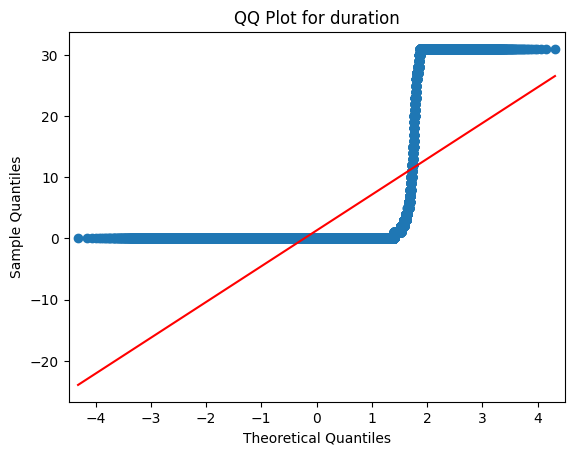

duration does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the duration across the groups in isguestlogin (Kruskal-Wallis).
=============== duration-wrongfragment ================
                   count      mean       std  min  25%  50%  75%   max
wrongfragment                                                        
0              124883.0  1.321853  5.875626  0.0  0.0  0.0  0.0  31.0
1                1090.0  0.000000  0.000000  0.0  0.0  0.0  0.0   0.0




<Figure size 800x600 with 0 Axes>

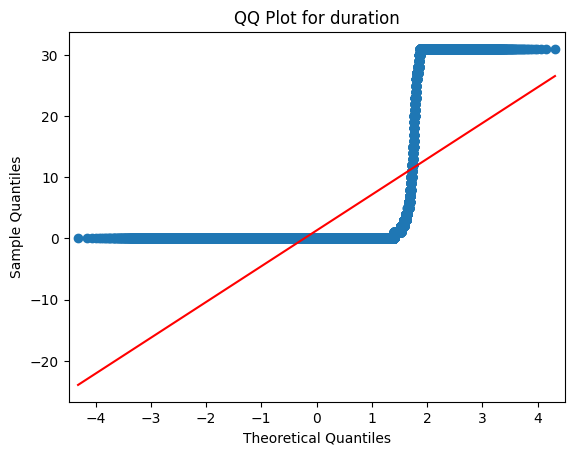

duration does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the duration across the groups in wrongfragment (Kruskal-Wallis).
=============== duration-flag ================
           count       mean        std  min  25%   50%   75%   max
flag                                                             
OTH        46.0   0.000000   0.000000  0.0  0.0   0.0   0.0   0.0
REJ     11233.0   0.020475   0.377342  0.0  0.0   0.0   0.0  23.0
RSTO     1562.0   0.966709   5.028189  0.0  0.0   0.0   0.0  31.0
RSTOS0    103.0   3.912621   8.925736  1.0  1.0   1.0   1.0  31.0
RSTR     2421.0  15.760017  15.046286  0.0  0.0  15.0  31.0  31.0
S0      34851.0   0.000000   0.000000  0.0  0.0   0.0   0.0   0.0
S1        365.0   0.000000   0.000000  0.0  0.0   0.0   0.0   0.0
S2        127.0   2.716535   7.325643  0.0  0.0   0.0   0.0  31.0
S3         49.0   4.938776  10.239646  0.0  0.0   0.0   2.0  31.0
SF      7494

<Figure size 800x600 with 0 Axes>

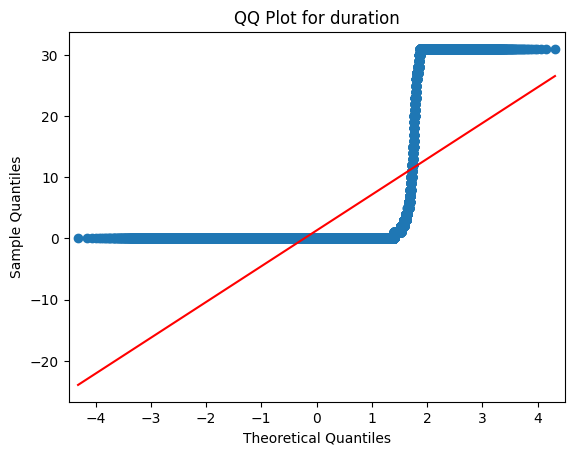

duration does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the duration across the groups in flag (Kruskal-Wallis).
=============== duration-protocoltype ================
                  count      mean       std  min  25%  50%  75%   max
protocoltype                                                        
icmp            8291.0  0.000000  0.000000  0.0  0.0  0.0  0.0   0.0
tcp           102689.0  1.081596  5.211603  0.0  0.0  0.0  0.0  31.0
udp            14993.0  3.602281  9.751896  0.0  0.0  0.0  0.0  31.0




<Figure size 800x600 with 0 Axes>

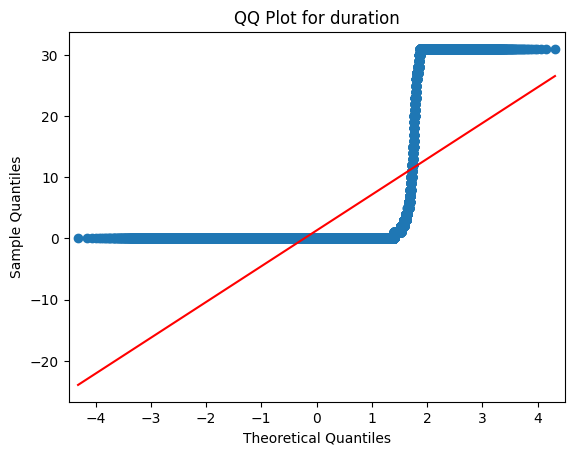

duration does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the duration across the groups in protocoltype (Kruskal-Wallis).
=============== duration-numaccessfiles ================
                    count      mean        std  min  25%  50%  75%   max
numaccessfiles                                                         
0               125602.0  1.294159   5.812804  0.0  0.0  0.0  0.0  31.0
1                  371.0  6.814016  12.522862  0.0  0.0  0.0  2.0  31.0




<Figure size 800x600 with 0 Axes>

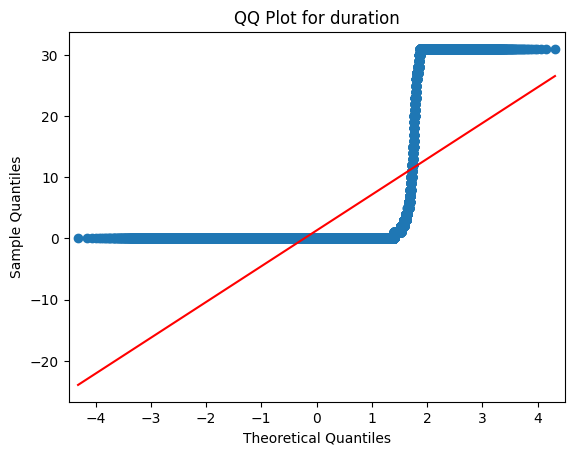

duration does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the duration across the groups in numaccessfiles (Kruskal-Wallis).
=============== duration-numcompromised ================
                    count     mean        std  min  25%  50%   75%   max
numcompromised                                                         
0               124687.0  1.24199   5.682878  0.0  0.0  0.0   0.0  31.0
1                 1286.0  7.94479  13.356911  0.0  0.0  0.0  18.0  31.0




<Figure size 800x600 with 0 Axes>

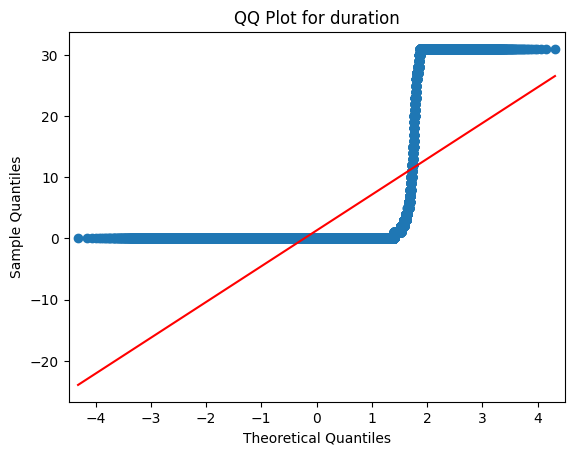

duration does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the duration across the groups in numcompromised (Kruskal-Wallis).
=============== dstbytes-suattempted ================
                 count         mean          std    min      25%      50%  \
suattempted                                                                
0            125893.0   1328.35782  3762.911107    0.0      0.0      0.0   
1                80.0  22996.86250  6206.549264  325.0  25519.0  25519.0   

                 75%      max  
suattempted                    
0              511.0  25519.0  
1            25519.0  25519.0  




<Figure size 800x600 with 0 Axes>

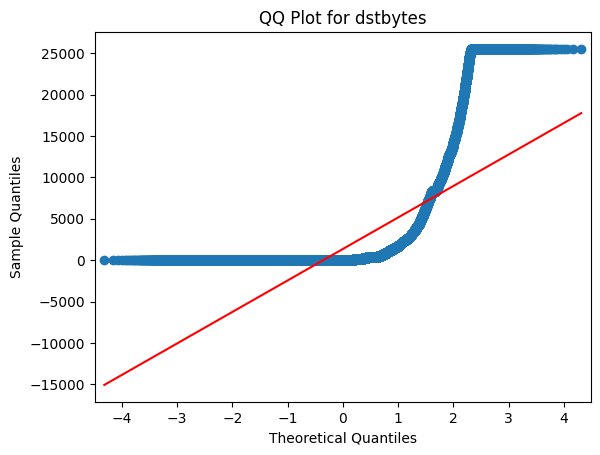

dstbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dstbytes across the groups in suattempted (Kruskal-Wallis).
=============== dstbytes-numfilecreations ================
                      count         mean           std  min    25%    50%  \
numfilecreations                                                           
0                 125686.0  1327.527601   3765.166123  0.0    0.0    0.0   
1                    287.0  7731.937282  10179.120051  0.0  284.5  394.0   

                      75%      max  
numfilecreations                    
0                   511.0  25519.0  
1                 15890.5  25519.0  




<Figure size 800x600 with 0 Axes>

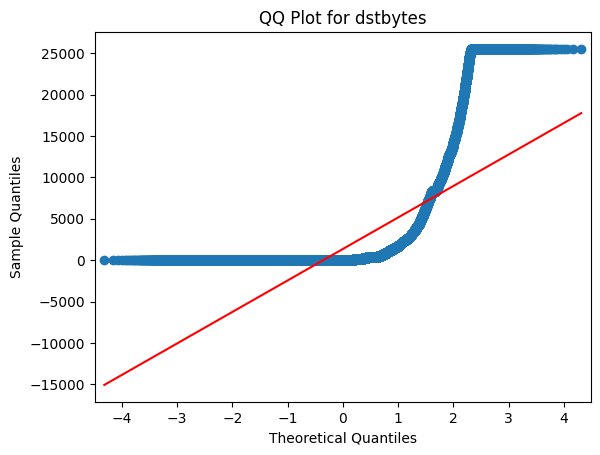

dstbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dstbytes across the groups in numfilecreations (Kruskal-Wallis).
=============== dstbytes-numfailedlogins ================
                     count         mean          std    min    25%    50%  \
numfailedlogins                                                            
0                125851.0  1340.138569  3798.122740    0.0    0.0    0.0   
1                   122.0  3384.598361  7692.791261  170.0  179.0  189.0   

                   75%      max  
numfailedlogins                  
0                516.0  25519.0  
1                780.0  25519.0  




<Figure size 800x600 with 0 Axes>

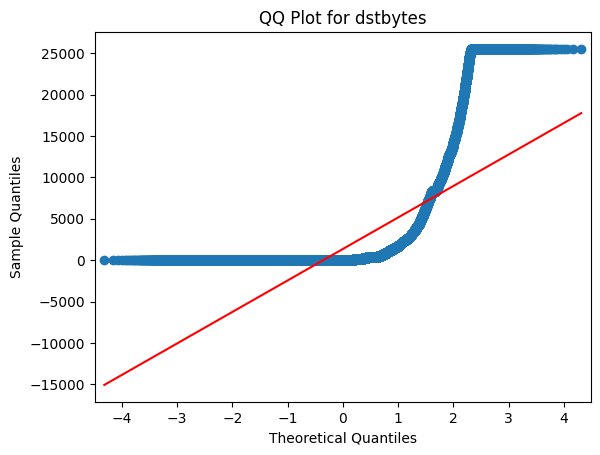

dstbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dstbytes across the groups in numfailedlogins (Kruskal-Wallis).
=============== dstbytes-numroot ================
             count         mean          std  min  25%  50%     75%      max
numroot                                                                    
0        125324.0  1324.238167  3744.115834  0.0  0.0  0.0  516.25  25519.0
1           649.0  4794.878274  9504.994416  0.0  0.0  0.0  329.00  25519.0




<Figure size 800x600 with 0 Axes>

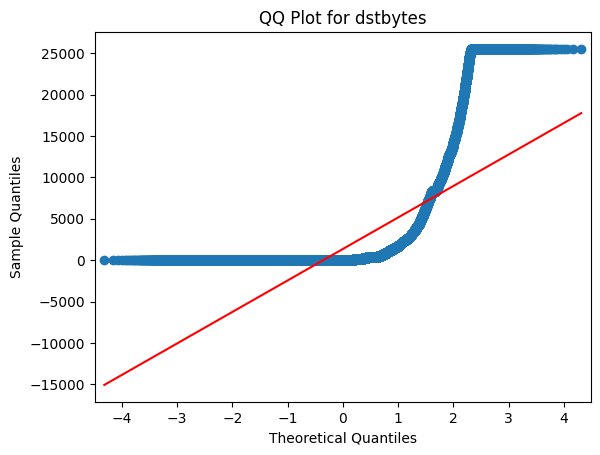

dstbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dstbytes across the groups in numroot (Kruskal-Wallis).
=============== dstbytes-numshells ================
               count         mean          std  min  25%  50%    75%      max
numshells                                                                   
0          125926.0  1342.119157  3804.157724  0.0  0.0  0.0  516.0  25519.0
1              47.0  1340.489362  4198.298449  0.0  0.0  0.0    0.0  25260.0




<Figure size 800x600 with 0 Axes>

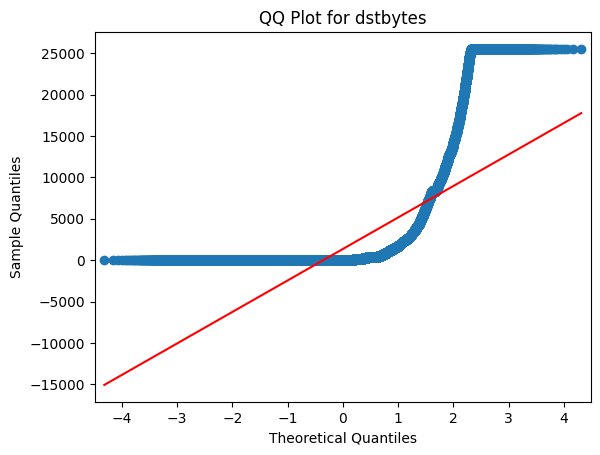

dstbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dstbytes across the groups in numshells (Kruskal-Wallis).
=============== dstbytes-loggedin ================
             count         mean          std  min    25%     50%     75%  \
loggedin                                                                  
0         76121.0    42.924699   693.219478  0.0    0.0     0.0     0.0   
1         49852.0  3325.909271  5415.283841  0.0  334.0  1095.5  3373.0   

              max  
loggedin           
0         25519.0  
1         25519.0  




<Figure size 800x600 with 0 Axes>

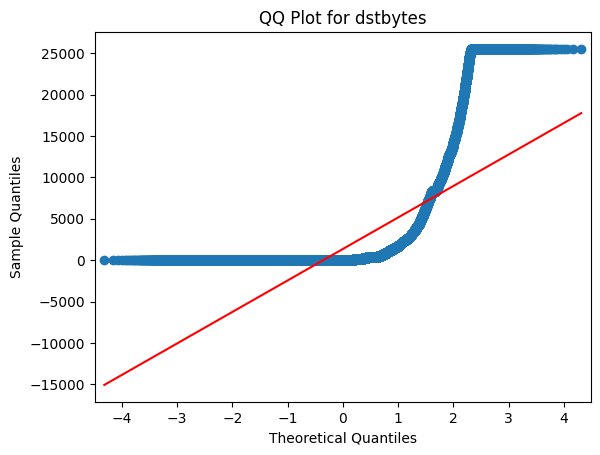

dstbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dstbytes across the groups in loggedin (Kruskal-Wallis).
=============== dstbytes-urgent ================
            count          mean           std    min     25%      50%      75%  \
urgent                                                                          
0       125964.0   1341.109579   3801.323413    0.0     0.0      0.0    516.0   
1            9.0  15463.666667  12151.471382  136.0  2703.0  25519.0  25519.0   

            max  
urgent           
0       25519.0  
1       25519.0  




<Figure size 800x600 with 0 Axes>

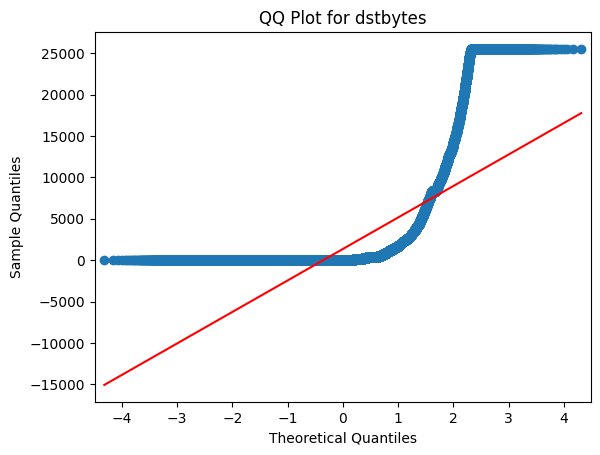

dstbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dstbytes across the groups in urgent (Kruskal-Wallis).
=============== dstbytes-land ================
          count         mean          std  min  25%  50%    75%      max
land                                                                   
0     125948.0  1342.384953  3804.624556  0.0  0.0  0.0  516.0  25519.0
1         25.0     0.000000     0.000000  0.0  0.0  0.0    0.0      0.0




<Figure size 800x600 with 0 Axes>

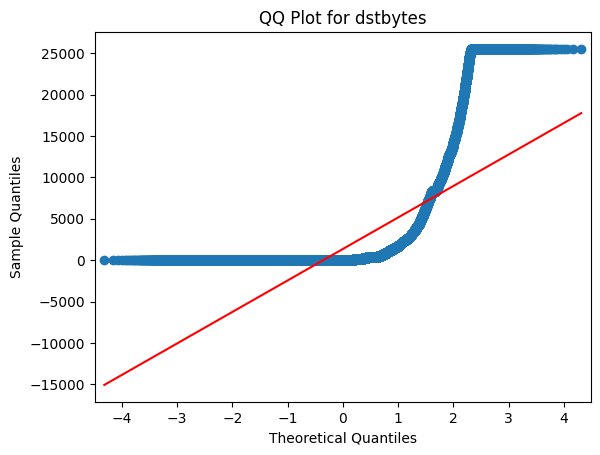

dstbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dstbytes across the groups in land (Kruskal-Wallis).
=============== dstbytes-lastflag ================
             count         mean          std  min   25%     50%      75%  \
lastflag                                                                  
0            66.0  1020.242424  4388.550975  0.0   0.0     0.0   164.75   
1            62.0  1346.741935  4743.270919  0.0   0.0     0.0    70.25   
2            54.0  1643.462963  1771.656731  0.0  35.0  2273.5  2526.50   
3            65.0  1330.523077  3908.428857  0.0   0.0     0.0  1191.00   
4            79.0  1448.164557  2039.753381  0.0   0.0   693.0  2364.50   
5            81.0  1110.111111  1835.239603  0.0   0.0    15.0  2447.00   
6            96.0  1340.562500  2302.172602  0.0   0.0     0.0  2451.00   
7           118.0  1278.042373  2969.858385  0.0   0.0     0.0  2447

<Figure size 800x600 with 0 Axes>

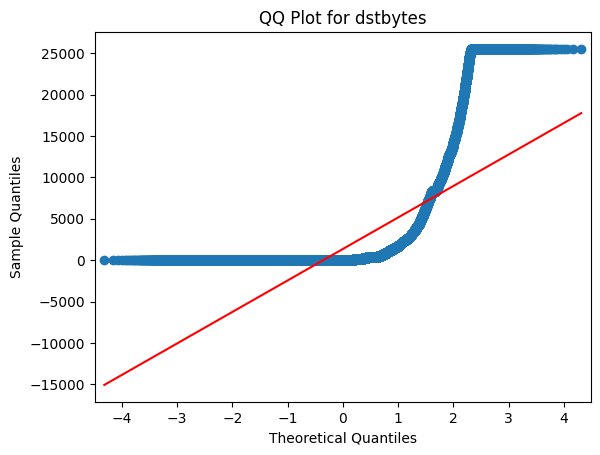

dstbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dstbytes across the groups in lastflag (Kruskal-Wallis).
=============== dstbytes-hot ================
         count         mean          std  min     25%     50%     75%      max
hot                                                                          
0    123302.0  1254.146064  3718.967485  0.0     0.0     0.0   429.0  25519.0
1      2671.0  5403.213029  5221.743429  0.0  2074.5  4152.0  8314.0  25519.0




<Figure size 800x600 with 0 Axes>

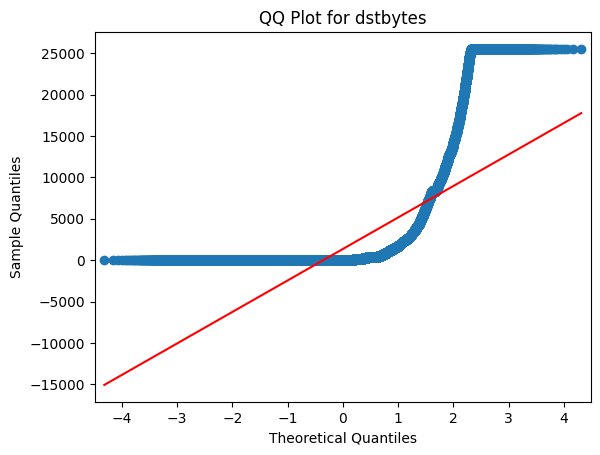

dstbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dstbytes across the groups in hot (Kruskal-Wallis).
=============== dstbytes-rootshell ================
               count          mean           std    min     25%      50%  \
rootshell                                                                 
0          125804.0   1321.864519   3747.186396    0.0     0.0      0.0   
1             169.0  16419.266272  10416.701736  734.0  4194.0  25519.0   

                75%      max  
rootshell                     
0            507.25  25519.0  
1          25519.00  25519.0  




<Figure size 800x600 with 0 Axes>

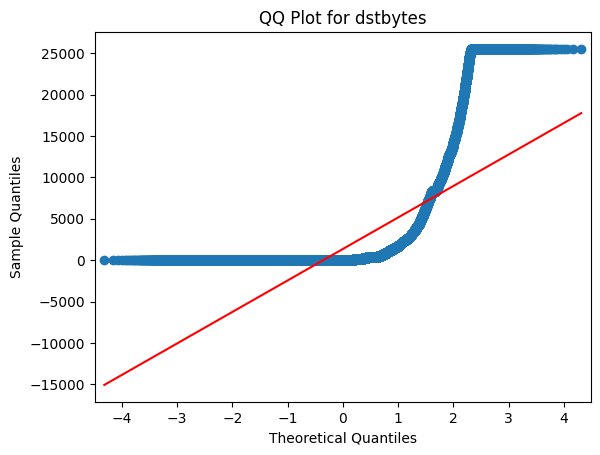

dstbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dstbytes across the groups in rootshell (Kruskal-Wallis).
=============== dstbytes-isguestlogin ================
                  count         mean          std    min     25%     50%  \
isguestlogin                                                              
0             124786.0  1331.715040  3819.010253    0.0     0.0     0.0   
1               1187.0  2435.810447  1213.507184  197.0  1063.0  2451.0   

                 75%      max  
isguestlogin                   
0              474.0  25519.0  
1             3380.0   4152.0  




<Figure size 800x600 with 0 Axes>

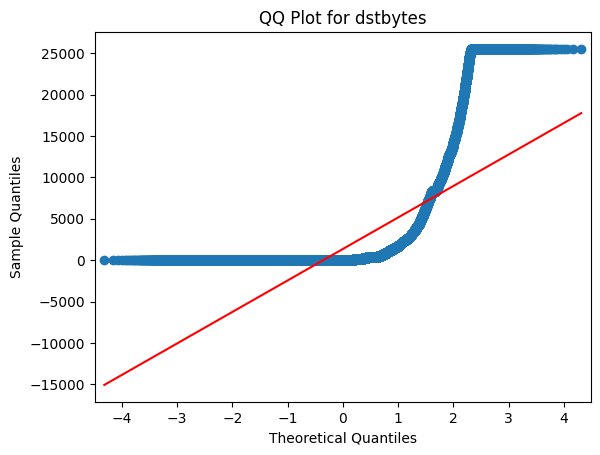

dstbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dstbytes across the groups in isguestlogin (Kruskal-Wallis).
=============== dstbytes-wrongfragment ================
                   count         mean          std  min  25%  50%    75%  \
wrongfragment                                                             
0              124883.0  1353.832339  3818.784571  0.0  0.0  0.0  538.0   
1                1090.0     0.051376     1.198837  0.0  0.0  0.0    0.0   

                   max  
wrongfragment           
0              25519.0  
1                 28.0  




<Figure size 800x600 with 0 Axes>

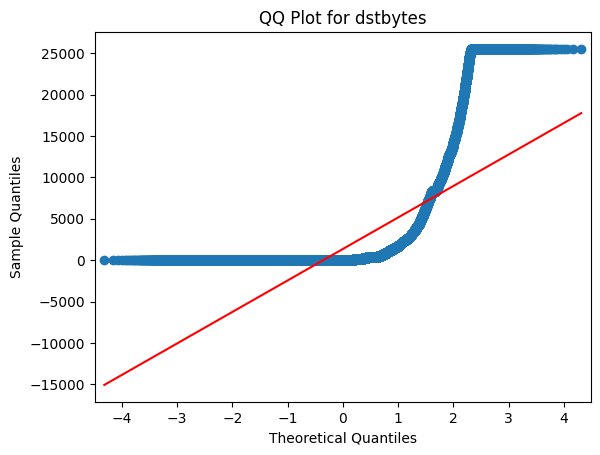

dstbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dstbytes across the groups in wrongfragment (Kruskal-Wallis).
=============== dstbytes-flag ================
           count          mean           std  min    25%      50%      75%  \
flag                                                                        
OTH        46.0   1693.456522   5773.158768  0.0    0.0      0.0      0.0   
REJ     11233.0      0.000000      0.000000  0.0    0.0      0.0      0.0   
RSTO     1562.0    203.555058   1573.024785  0.0    0.0      0.0      0.0   
RSTOS0    103.0      0.000000      0.000000  0.0    0.0      0.0      0.0   
RSTR     2421.0    757.441140   2672.008270  0.0    0.0      0.0      0.0   
S0      34851.0      0.000000      0.000000  0.0    0.0      0.0      0.0   
S1        365.0  11014.147945  10287.930617  0.0  115.0  10220.0  21900.0   
S2        127.0   6560.866142   9887.151721  

<Figure size 800x600 with 0 Axes>

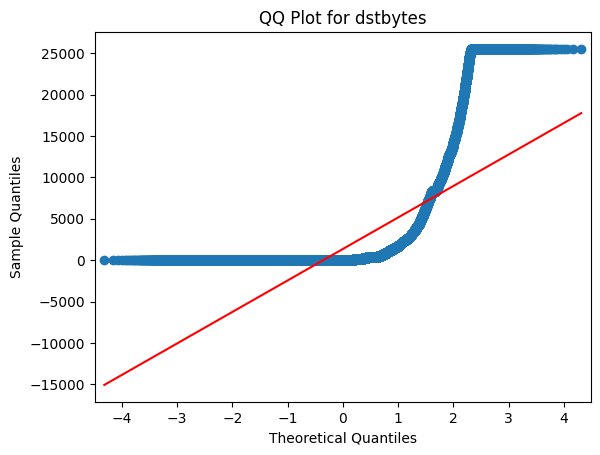

dstbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dstbytes across the groups in flag (Kruskal-Wallis).
=============== dstbytes-protocoltype ================
                  count         mean          std  min  25%   50%     75%  \
protocoltype                                                               
icmp            8291.0     0.000000     0.000000  0.0  0.0   0.0     0.0   
tcp           102689.0  1636.092902  4157.644956  0.0  0.0   0.0  1053.0   
udp            14993.0    70.830121    53.468443  0.0  4.0  74.0   122.0   

                  max  
protocoltype           
icmp              0.0  
tcp           25519.0  
udp             498.0  




<Figure size 800x600 with 0 Axes>

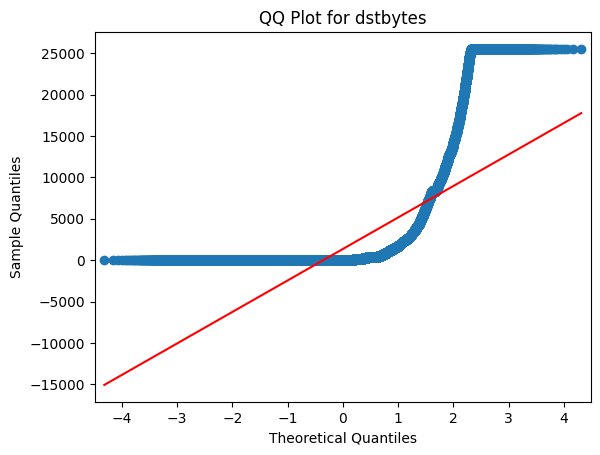

dstbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dstbytes across the groups in protocoltype (Kruskal-Wallis).
=============== dstbytes-numaccessfiles ================
                    count         mean          std  min    25%     50%  \
numaccessfiles                                                           
0               125602.0  1327.128175  3768.913849  0.0    0.0     0.0   
1                  371.0  6417.107817  8919.993361  0.0  494.5  2698.0   

                   75%      max  
numaccessfiles                   
0                502.0  25519.0  
1               2698.0  25519.0  




<Figure size 800x600 with 0 Axes>

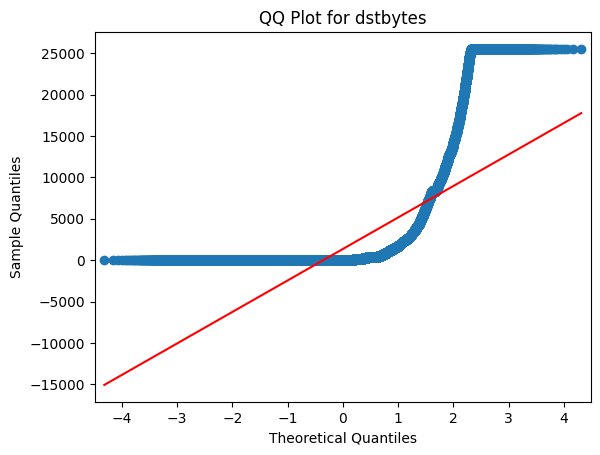

dstbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dstbytes across the groups in numaccessfiles (Kruskal-Wallis).
=============== dstbytes-numcompromised ================
                    count          mean          std   min     25%     50%  \
numcompromised                                                              
0               124687.0   1250.413147  3663.479437   0.0     0.0     0.0   
1                 1286.0  10233.620529  6048.430914  35.0  8314.0  8314.0   

                   75%      max  
numcompromised                   
0                470.5  25519.0  
1               8314.0  25519.0  




<Figure size 800x600 with 0 Axes>

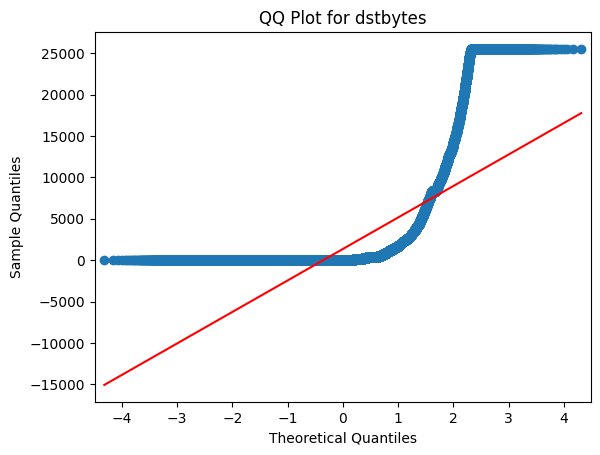

dstbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dstbytes across the groups in numcompromised (Kruskal-Wallis).
=============== dsthostrerrorrate-suattempted ================
                 count      mean       std  min  25%  50%   75%   max
suattempted                                                         
0            125893.0  0.118874  0.306622  0.0  0.0  0.0  0.00  1.00
1                80.0  0.052625  0.165290  0.0  0.0  0.0  0.02  0.77




<Figure size 800x600 with 0 Axes>

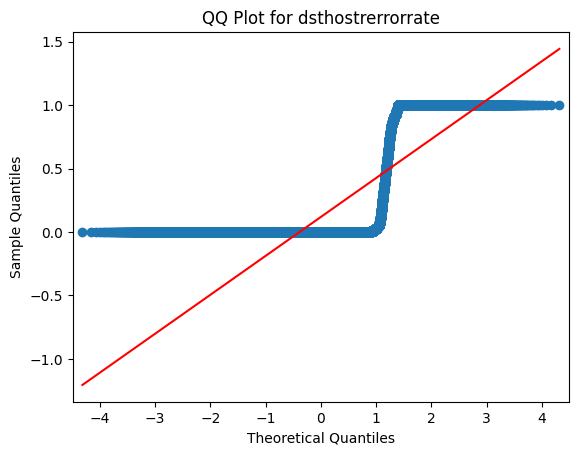

dsthostrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostrerrorrate across the groups in suattempted (Kruskal-Wallis).
=============== dsthostrerrorrate-numfilecreations ================
                      count      mean       std  min  25%  50%  75%   max
numfilecreations                                                        
0                 125686.0  0.119035  0.306818  0.0  0.0  0.0  0.0  1.00
1                    287.0  0.029895  0.126901  0.0  0.0  0.0  0.0  0.96




<Figure size 800x600 with 0 Axes>

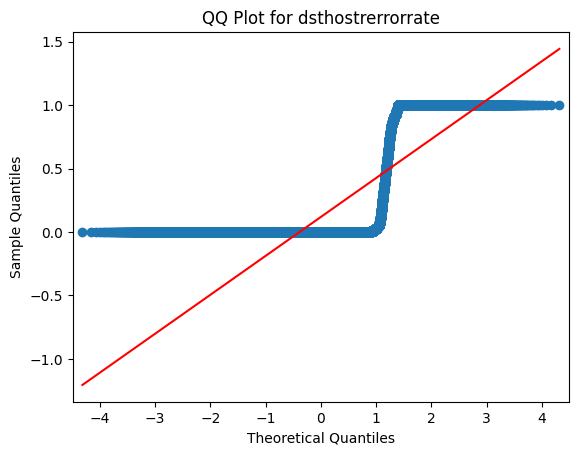

dsthostrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostrerrorrate-numfailedlogins ================
                     count      mean       std  min  25%   50%   75%   max
numfailedlogins                                                          
0                125851.0  0.118559  0.306264  0.0  0.0  0.00  0.00  1.00
1                   122.0  0.400082  0.449222  0.0  0.0  0.05  0.93  0.96




<Figure size 800x600 with 0 Axes>

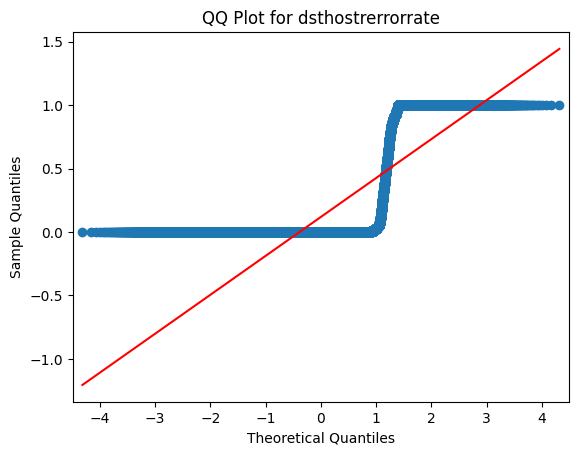

dsthostrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostrerrorrate across the groups in numfailedlogins (Kruskal-Wallis).
=============== dsthostrerrorrate-numroot ================
             count      mean       std  min  25%  50%  75%   max
numroot                                                        
0        125324.0  0.119250  0.307093  0.0  0.0  0.0  0.0  1.00
1           649.0  0.038043  0.155004  0.0  0.0  0.0  0.0  0.96




<Figure size 800x600 with 0 Axes>

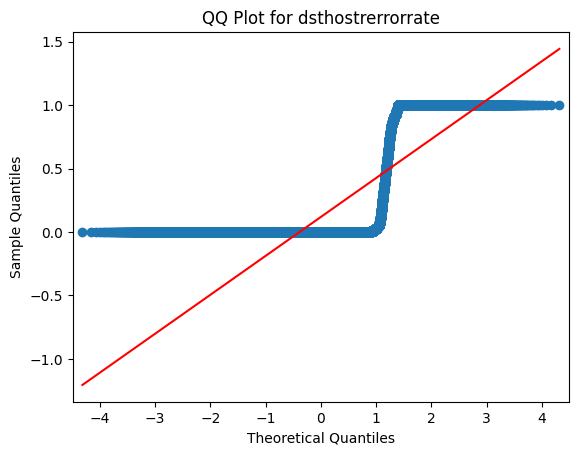

dsthostrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostrerrorrate across the groups in numroot (Kruskal-Wallis).
=============== dsthostrerrorrate-numshells ================
               count      mean       std  min  25%  50%  75%   max
numshells                                                        
0          125926.0  0.118858  0.306594  0.0  0.0  0.0  0.0  1.00
1              47.0  0.048511  0.174069  0.0  0.0  0.0  0.0  0.74




<Figure size 800x600 with 0 Axes>

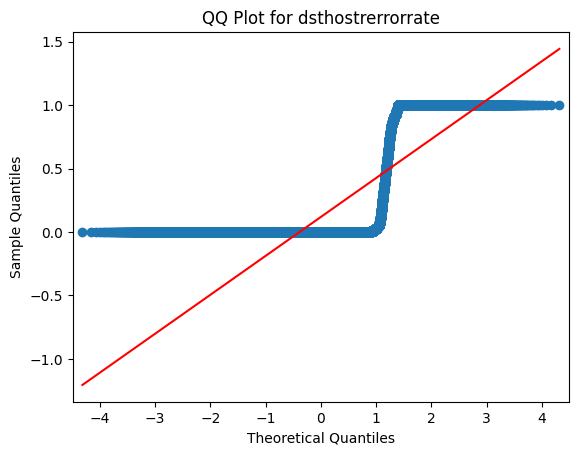

dsthostrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostrerrorrate-loggedin ================
             count      mean       std  min  25%  50%  75%  max
loggedin                                                      
0         76121.0  0.187296  0.372433  0.0  0.0  0.0  0.0  1.0
1         49852.0  0.014291  0.087142  0.0  0.0  0.0  0.0  1.0




<Figure size 800x600 with 0 Axes>

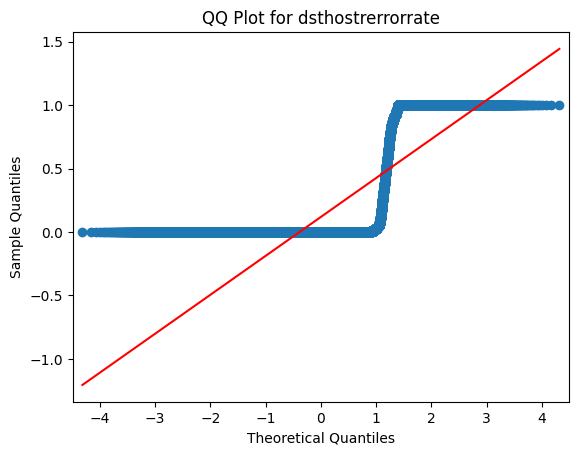

dsthostrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostrerrorrate across the groups in loggedin (Kruskal-Wallis).
=============== dsthostrerrorrate-urgent ================
            count     mean       std  min  25%  50%  75%  max
urgent                                                      
0       125964.0  0.11884  0.306567  0.0  0.0  0.0  0.0  1.0
1            9.0  0.00000  0.000000  0.0  0.0  0.0  0.0  0.0




<Figure size 800x600 with 0 Axes>

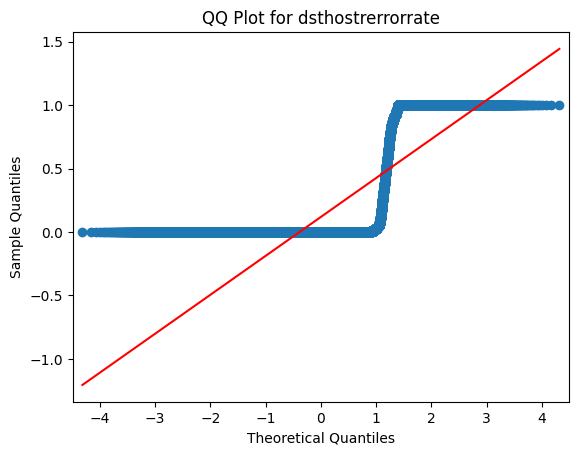

dsthostrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostrerrorrate-land ================
          count      mean       std  min  25%  50%  75%   max
land                                                        
0     125948.0  0.118854  0.306584  0.0  0.0  0.0  0.0  1.00
1         25.0  0.005200  0.018055  0.0  0.0  0.0  0.0  0.07




<Figure size 800x600 with 0 Axes>

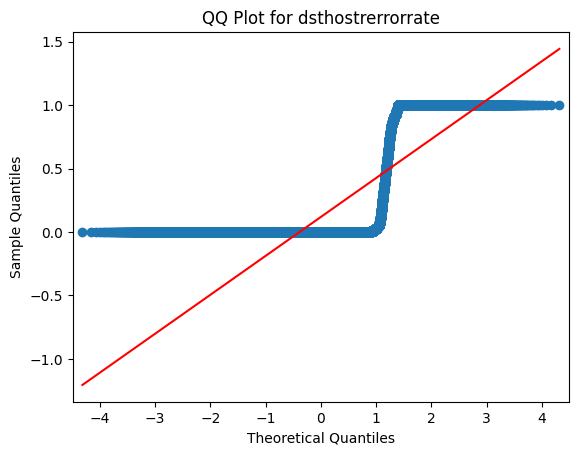

dsthostrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostrerrorrate-lastflag ================
             count      mean       std  min  25%    50%     75%   max
lastflag                                                            
0            66.0  0.048939  0.149410  0.0  0.0  0.000  0.0000  0.96
1            62.0  0.316452  0.425734  0.0  0.0  0.000  0.8900  0.97
2            54.0  0.216852  0.343982  0.0  0.0  0.005  0.1375  0.89
3            65.0  0.102462  0.217895  0.0  0.0  0.000  0.0700  1.00
4            79.0  0.066329  0.201082  0.0  0.0  0.000  0.0200  1.00
5            81.0  0.162222  0.305246  0.0  0.0  0.000  0.1400  1.00
6            96.0  0.122292  0.270724  0.0  0.0  0.000  0.0500  1.00
7           118.0  0.178305  0.337245  0.0  0.0  0.010  0.0500  1.00
8           106.0  0.202170  0.353214  0.0  

<Figure size 800x600 with 0 Axes>

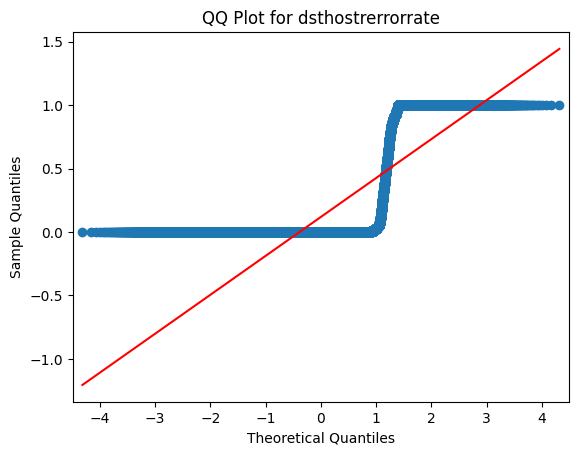

dsthostrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostrerrorrate across the groups in lastflag (Kruskal-Wallis).
=============== dsthostrerrorrate-hot ================
         count      mean       std  min  25%  50%   75%  max
hot                                                        
0    123302.0  0.120248  0.308838  0.0  0.0  0.0  0.00  1.0
1      2671.0  0.053456  0.157578  0.0  0.0  0.0  0.04  1.0




<Figure size 800x600 with 0 Axes>

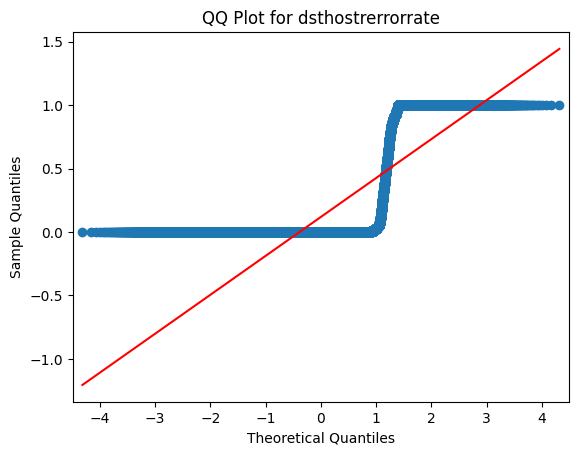

dsthostrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostrerrorrate across the groups in hot (Kruskal-Wallis).
=============== dsthostrerrorrate-rootshell ================
               count      mean      std  min  25%  50%  75%   max
rootshell                                                       
0          125804.0  0.118934  0.30670  0.0  0.0  0.0  0.0  1.00
1             169.0  0.042663  0.15222  0.0  0.0  0.0  0.0  0.77




<Figure size 800x600 with 0 Axes>

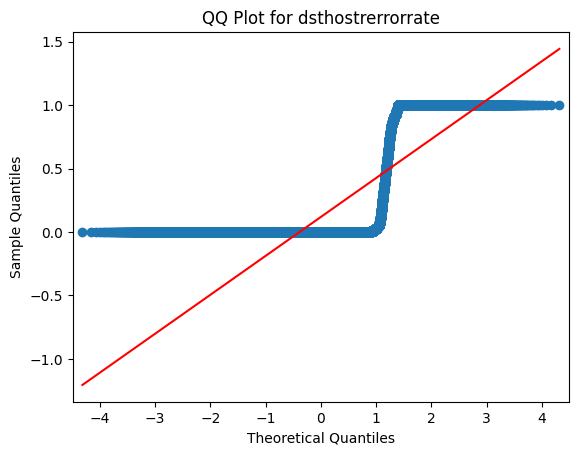

dsthostrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostrerrorrate-isguestlogin ================
                  count     mean       std  min  25%  50%   75%  max
isguestlogin                                                       
0             124786.0  0.11975  0.307708  0.0  0.0  0.0  0.00  1.0
1               1187.0  0.02230  0.101403  0.0  0.0  0.0  0.01  1.0




<Figure size 800x600 with 0 Axes>

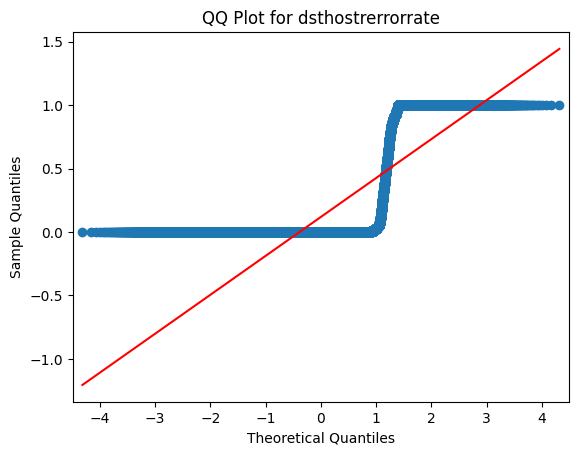

dsthostrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostrerrorrate across the groups in isguestlogin (Kruskal-Wallis).
=============== dsthostrerrorrate-wrongfragment ================
                   count      mean       std  min  25%  50%  75%   max
wrongfragment                                                        
0              124883.0  0.118194  0.306691  0.0  0.0  0.0  0.0  1.00
1                1090.0  0.191890  0.281572  0.0  0.0  0.0  0.5  0.91




<Figure size 800x600 with 0 Axes>

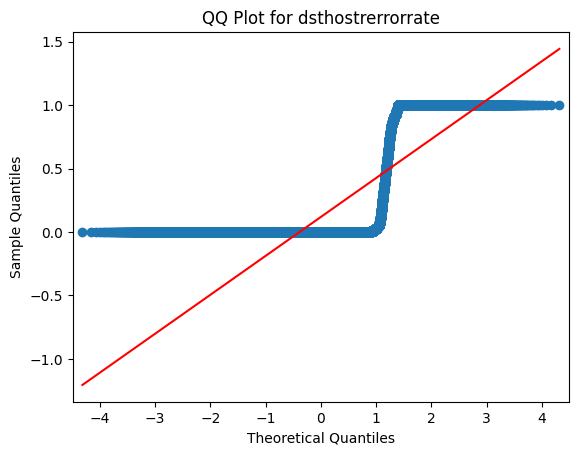

dsthostrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostrerrorrate across the groups in wrongfragment (Kruskal-Wallis).
=============== dsthostrerrorrate-flag ================
           count      mean       std  min     25%   50%   75%   max
flag                                                              
OTH        46.0  0.475870  0.317879  0.0  0.0625  0.63  0.63  1.00
REJ     11233.0  0.915222  0.197058  0.0  0.9200  1.00  1.00  1.00
RSTO     1562.0  0.865480  0.321641  0.0  1.0000  1.00  1.00  1.00
RSTOS0    103.0  0.197864  0.144790  0.0  0.0850  0.17  0.28  0.55
RSTR     2421.0  0.711826  0.340585  0.0  0.4200  0.96  1.00  1.00
S0      34851.0  0.003536  0.053557  0.0  0.0000  0.00  0.00  1.00
S1        365.0  0.053178  0.168928  0.0  0.0000  0.00  0.00  0.99
S2        127.0  0.028268  0.124742  0.0  0.0000  0.00  0.00  0.97
S3         49.0  0.046327  0.164845  0.0 

<Figure size 800x600 with 0 Axes>

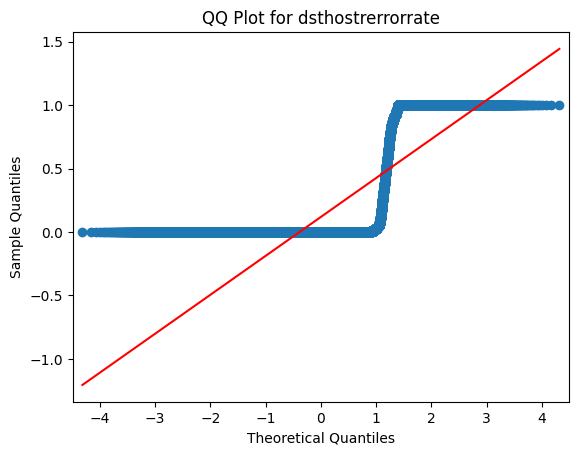

dsthostrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostrerrorrate across the groups in flag (Kruskal-Wallis).
=============== dsthostrerrorrate-protocoltype ================
                  count      mean       std  min  25%  50%  75%   max
protocoltype                                                        
icmp            8291.0  0.010092  0.060562  0.0  0.0  0.0  0.0  0.90
tcp           102689.0  0.138867  0.330876  0.0  0.0  0.0  0.0  1.00
udp            14993.0  0.041739  0.150054  0.0  0.0  0.0  0.0  0.97




<Figure size 800x600 with 0 Axes>

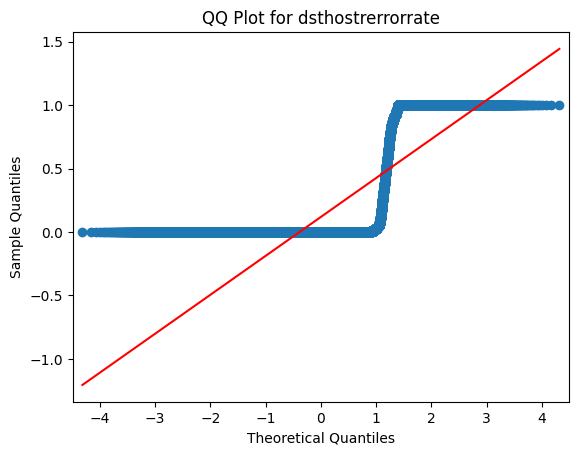

dsthostrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostrerrorrate across the groups in protocoltype (Kruskal-Wallis).
=============== dsthostrerrorrate-numaccessfiles ================
                    count      mean       std  min  25%  50%  75%  max
numaccessfiles                                                       
0               125602.0  0.119139  0.306924  0.0  0.0  0.0  0.0  1.0
1                  371.0  0.014960  0.084292  0.0  0.0  0.0  0.0  0.8




<Figure size 800x600 with 0 Axes>

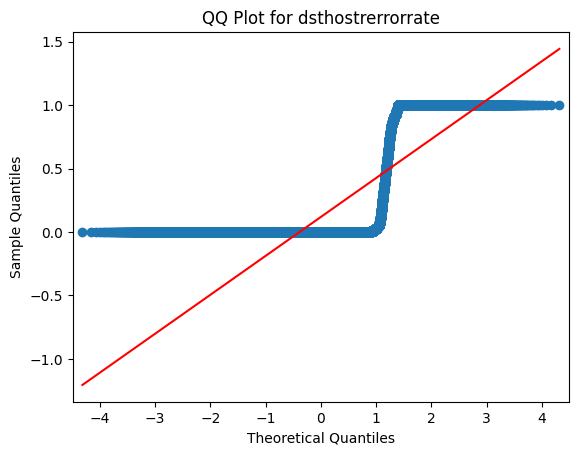

dsthostrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostrerrorrate across the groups in numaccessfiles (Kruskal-Wallis).
=============== dsthostrerrorrate-numcompromised ================
                    count      mean       std  min   25%   50%   75%   max
numcompromised                                                           
0               124687.0  0.119543  0.307885  0.0  0.00  0.00  0.00  1.00
1                 1286.0  0.049868  0.100374  0.0  0.01  0.02  0.05  0.96




<Figure size 800x600 with 0 Axes>

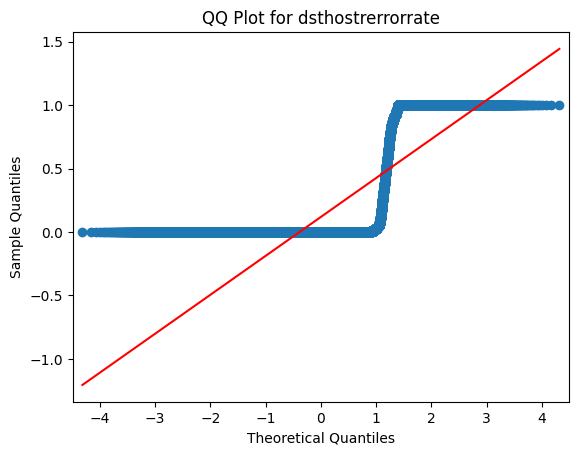

dsthostrerrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostrerrorrate across the groups in numcompromised (Kruskal-Wallis).
=============== dsthostdiffsrvrate-suattempted ================
                 count      mean       std  min   25%   50%     75%  max
suattempted                                                            
0            125893.0  0.082936  0.188933  0.0  0.00  0.02  0.0700  1.0
1                80.0  0.106500  0.170339  0.0  0.02  0.06  0.1025  1.0




<Figure size 800x600 with 0 Axes>

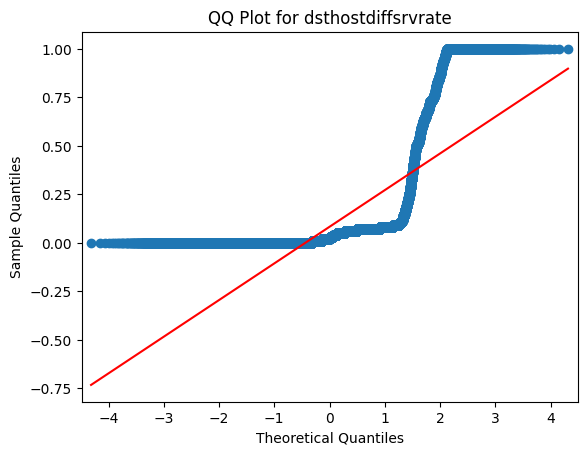

dsthostdiffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostdiffsrvrate across the groups in suattempted (Kruskal-Wallis).
=============== dsthostdiffsrvrate-numfilecreations ================
                      count      mean       std  min   25%   50%   75%  max
numfilecreations                                                          
0                 125686.0  0.082919  0.188969  0.0  0.00  0.02  0.07  1.0
1                    287.0  0.097143  0.166744  0.0  0.02  0.05  0.08  1.0




<Figure size 800x600 with 0 Axes>

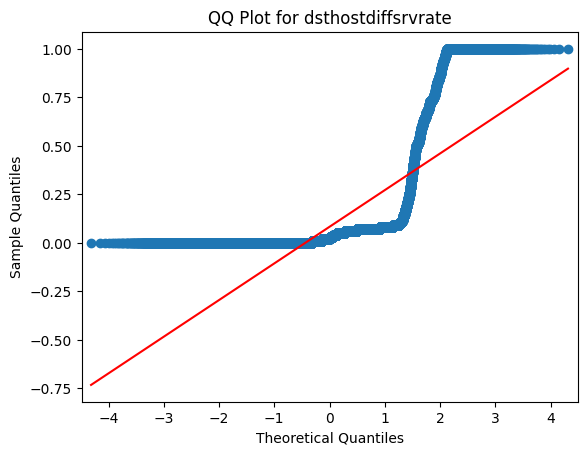

dsthostdiffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostdiffsrvrate across the groups in numfilecreations (Kruskal-Wallis).
=============== dsthostdiffsrvrate-numfailedlogins ================
                     count      mean       std  min  25%   50%   75%   max
numfailedlogins                                                          
0                125851.0  0.082967  0.188951  0.0  0.0  0.02  0.07  1.00
1                   122.0  0.066803  0.155278  0.0  0.0  0.02  0.07  0.99




<Figure size 800x600 with 0 Axes>

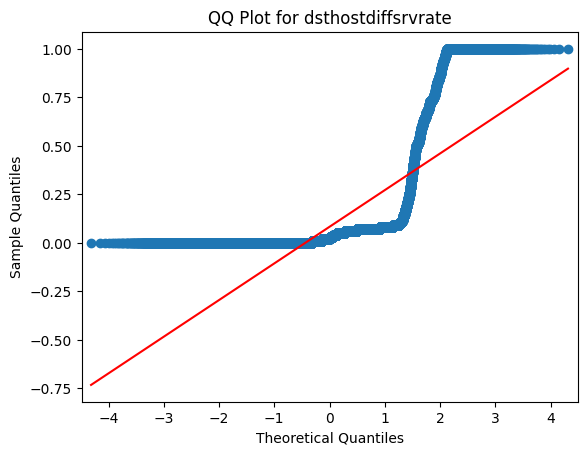

dsthostdiffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostdiffsrvrate-numroot ================
             count      mean       std  min   25%   50%   75%  max
numroot                                                          
0        125324.0  0.082729  0.188875  0.0  0.00  0.02  0.07  1.0
1           649.0  0.125809  0.193118  0.0  0.02  0.05  0.12  1.0




<Figure size 800x600 with 0 Axes>

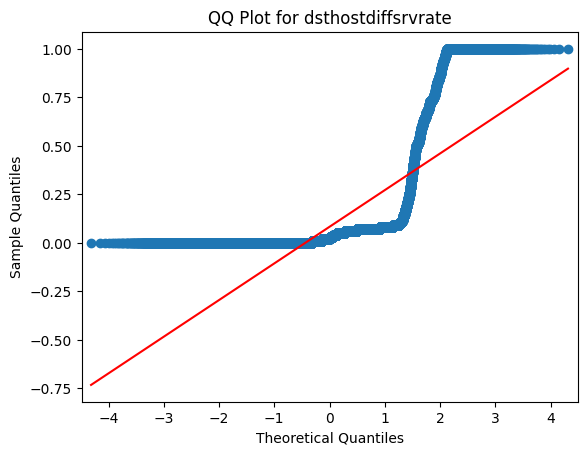

dsthostdiffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostdiffsrvrate across the groups in numroot (Kruskal-Wallis).
=============== dsthostdiffsrvrate-numshells ================
               count      mean       std  min   25%   50%   75%   max
numshells                                                           
0          125926.0  0.082963  0.188951  0.0  0.00  0.02  0.07  1.00
1              47.0  0.050638  0.072694  0.0  0.02  0.03  0.06  0.48




<Figure size 800x600 with 0 Axes>

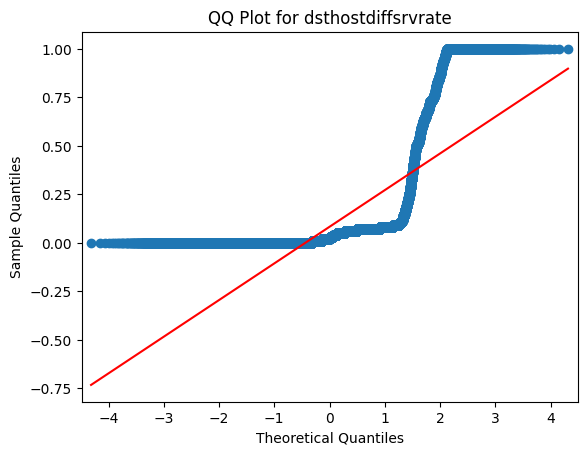

dsthostdiffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostdiffsrvrate-loggedin ================
             count      mean       std  min   25%   50%   75%  max
loggedin                                                         
0         76121.0  0.122100  0.224996  0.0  0.01  0.06  0.08  1.0
1         49852.0  0.023173  0.083539  0.0  0.00  0.00  0.02  1.0




<Figure size 800x600 with 0 Axes>

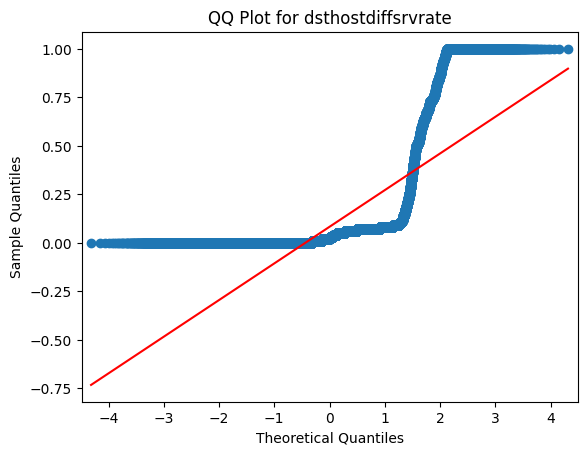

dsthostdiffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostdiffsrvrate across the groups in loggedin (Kruskal-Wallis).
=============== dsthostdiffsrvrate-urgent ================
            count      mean       std  min   25%   50%   75%  max
urgent                                                          
0       125964.0  0.082939  0.188893  0.0  0.00  0.02  0.07  1.0
1            9.0  0.245556  0.429189  0.0  0.01  0.02  0.11  1.0




<Figure size 800x600 with 0 Axes>

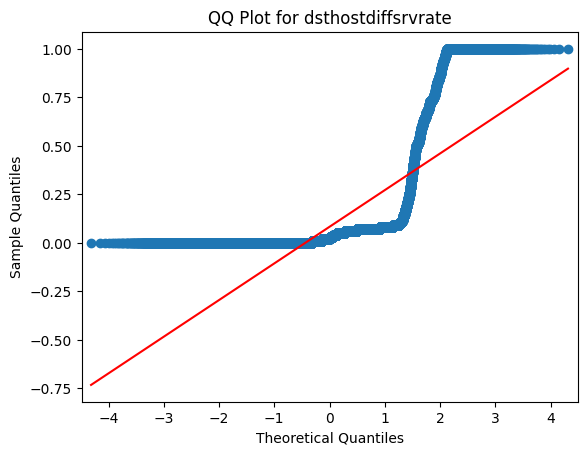

dsthostdiffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostdiffsrvrate-land ================
          count      mean       std  min  25%   50%   75%  max
land                                                         
0     125948.0  0.082963  0.188937  0.0  0.0  0.02  0.07  1.0
1         25.0  0.022400  0.062067  0.0  0.0  0.00  0.00  0.2




<Figure size 800x600 with 0 Axes>

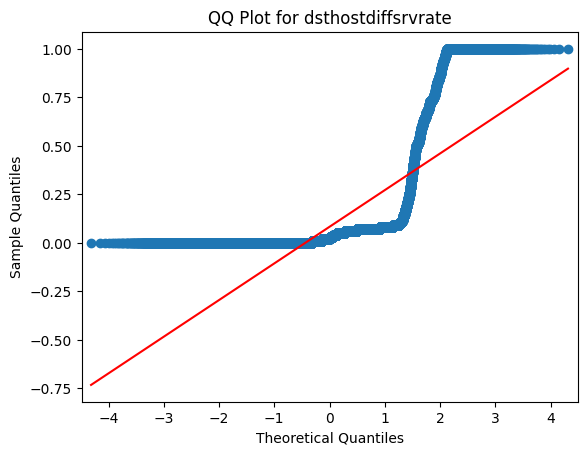

dsthostdiffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostdiffsrvrate across the groups in land (Kruskal-Wallis).
=============== dsthostdiffsrvrate-lastflag ================
             count      mean       std  min   25%   50%    75%  max
lastflag                                                          
0            66.0  0.175000  0.228118  0.0  0.03  0.07  0.130  1.0
1            62.0  0.444677  0.441951  0.0  0.00  0.31  1.000  1.0
2            54.0  0.263704  0.420423  0.0  0.00  0.02  0.200  1.0
3            65.0  0.212154  0.266490  0.0  0.05  0.13  0.250  1.0
4            79.0  0.072405  0.137255  0.0  0.01  0.02  0.060  1.0
5            81.0  0.178148  0.323914  0.0  0.02  0.02  0.110  1.0
6            96.0  0.099062  0.234301  0.0  0.00  0.02  0.045  1.0
7           118.0  0.187119  0.342929  0.0  0.01  0.03  0.070  1.0
8           106.0  0.115472  0.262411  0.0 

<Figure size 800x600 with 0 Axes>

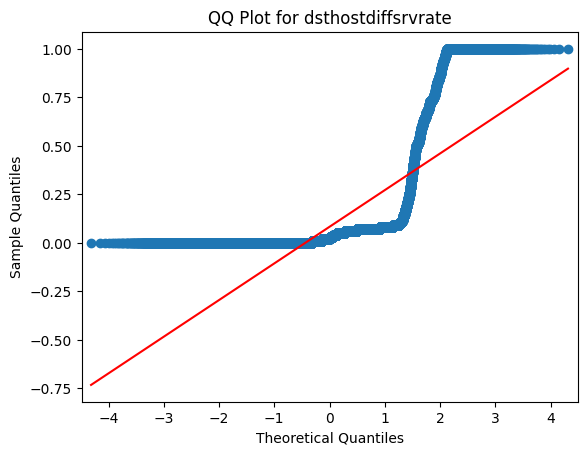

dsthostdiffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostdiffsrvrate across the groups in lastflag (Kruskal-Wallis).
=============== dsthostdiffsrvrate-hot ================
         count      mean       std  min  25%   50%   75%  max
hot                                                         
0    123302.0  0.083922  0.190149  0.0  0.0  0.03  0.07  1.0
1      2671.0  0.038113  0.110283  0.0  0.0  0.00  0.03  1.0




<Figure size 800x600 with 0 Axes>

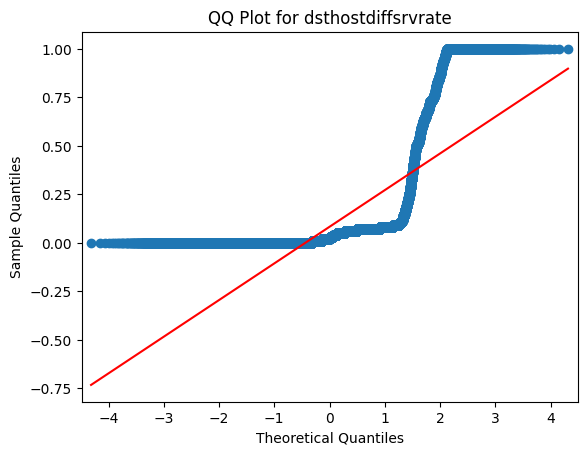

dsthostdiffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostdiffsrvrate across the groups in hot (Kruskal-Wallis).
=============== dsthostdiffsrvrate-rootshell ================
               count      mean       std  min  25%   50%   75%  max
rootshell                                                         
0          125804.0  0.082987  0.188975  0.0  0.0  0.03  0.07  1.0
1             169.0  0.056450  0.141961  0.0  0.0  0.00  0.05  1.0




<Figure size 800x600 with 0 Axes>

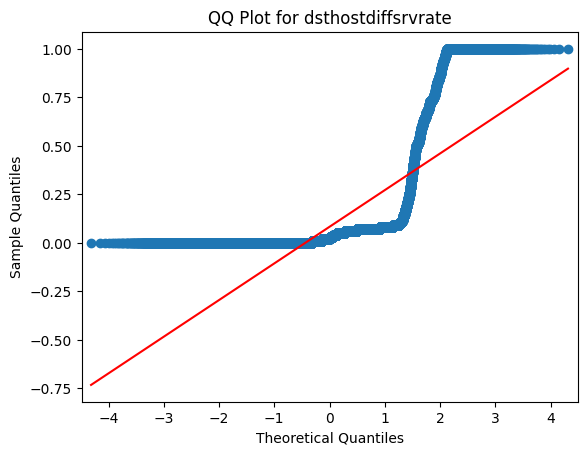

dsthostdiffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostdiffsrvrate across the groups in rootshell (Kruskal-Wallis).
=============== dsthostdiffsrvrate-isguestlogin ================
                  count      mean       std  min   25%   50%   75%  max
isguestlogin                                                          
0             124786.0  0.083082  0.189378  0.0  0.00  0.02  0.07  1.0
1               1187.0  0.069200  0.131856  0.0  0.02  0.03  0.05  1.0




<Figure size 800x600 with 0 Axes>

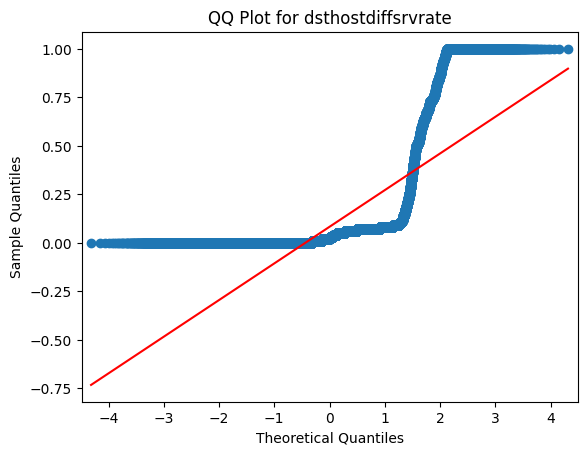

dsthostdiffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostdiffsrvrate across the groups in isguestlogin (Kruskal-Wallis).
=============== dsthostdiffsrvrate-wrongfragment ================
                   count      mean       std  min   25%   50%   75%  max
wrongfragment                                                          
0              124883.0  0.081922  0.187344  0.0  0.00  0.02  0.07  1.0
1                1090.0  0.200835  0.299655  0.0  0.01  0.02  0.41  1.0




<Figure size 800x600 with 0 Axes>

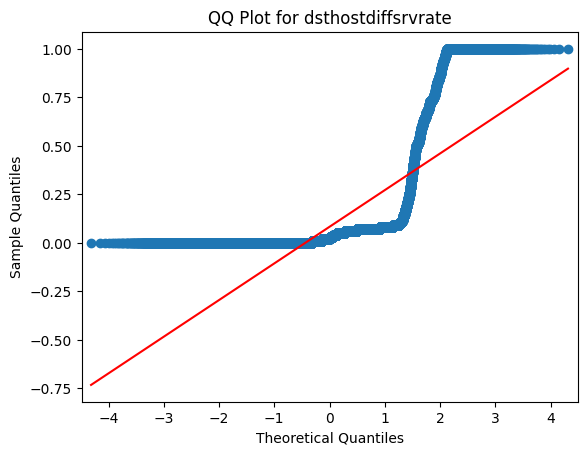

dsthostdiffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostdiffsrvrate across the groups in wrongfragment (Kruskal-Wallis).
=============== dsthostdiffsrvrate-flag ================
           count      mean       std   min     25%    50%   75%   max
flag                                                                
OTH        46.0  0.539348  0.331900  0.00  0.1575  0.695  0.74  1.00
REJ     11233.0  0.247198  0.365978  0.00  0.0500  0.070  0.15  1.00
RSTO     1562.0  0.099526  0.174796  0.00  0.0600  0.070  0.07  1.00
RSTOS0    103.0  0.213883  0.104490  0.01  0.1250  0.210  0.31  0.39
RSTR     2421.0  0.515960  0.270634  0.00  0.3100  0.550  0.73  1.00
S0      34851.0  0.068166  0.059540  0.00  0.0600  0.070  0.07  1.00
S1        365.0  0.073973  0.158049  0.00  0.0000  0.020  0.06  1.00
S2        127.0  0.033465  0.129605  0.00  0.0000  0.000  0.02  1.00
S3         49.0  0

<Figure size 800x600 with 0 Axes>

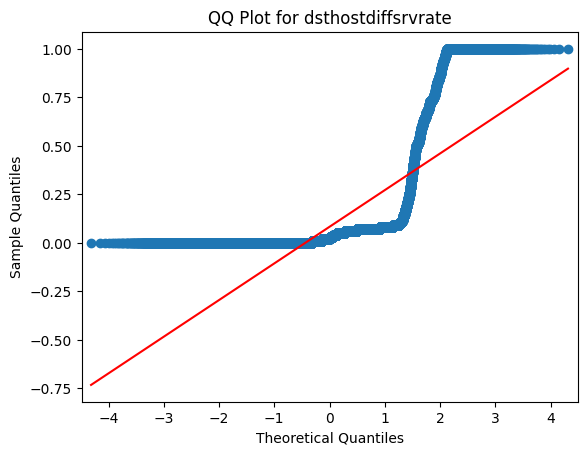

dsthostdiffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostdiffsrvrate across the groups in flag (Kruskal-Wallis).
=============== dsthostdiffsrvrate-protocoltype ================
                  count      mean       std  min   25%   50%   75%  max
protocoltype                                                          
icmp            8291.0  0.019007  0.072728  0.0  0.00  0.00  0.01  1.0
tcp           102689.0  0.080287  0.182660  0.0  0.00  0.05  0.07  1.0
udp            14993.0  0.136560  0.251519  0.0  0.01  0.01  0.06  1.0




<Figure size 800x600 with 0 Axes>

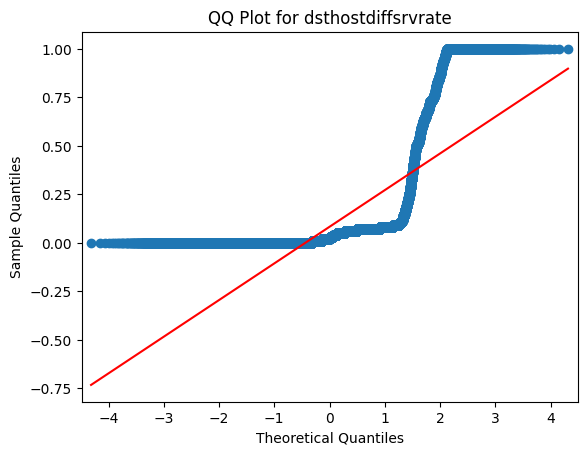

dsthostdiffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostdiffsrvrate across the groups in protocoltype (Kruskal-Wallis).
=============== dsthostdiffsrvrate-numaccessfiles ================
                    count      mean       std  min   25%   50%   75%  max
numaccessfiles                                                          
0               125602.0  0.083015  0.189034  0.0  0.00  0.03  0.07  1.0
1                  371.0  0.061294  0.144518  0.0  0.01  0.02  0.05  1.0




<Figure size 800x600 with 0 Axes>

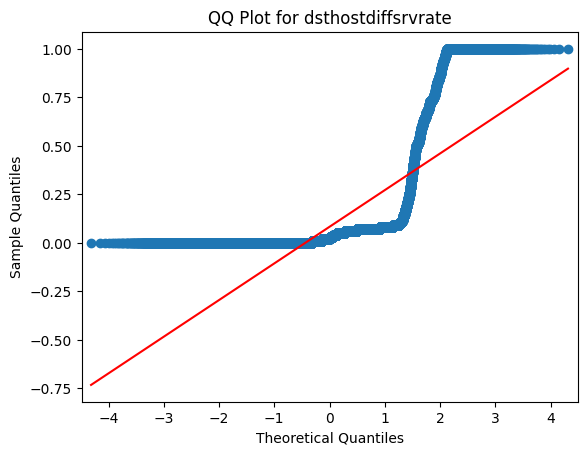

dsthostdiffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostdiffsrvrate-numcompromised ================
                    count      mean       std  min  25%   50%   75%  max
numcompromised                                                         
0               124687.0  0.083484  0.189479  0.0  0.0  0.03  0.07  1.0
1                 1286.0  0.031291  0.112065  0.0  0.0  0.00  0.01  1.0




<Figure size 800x600 with 0 Axes>

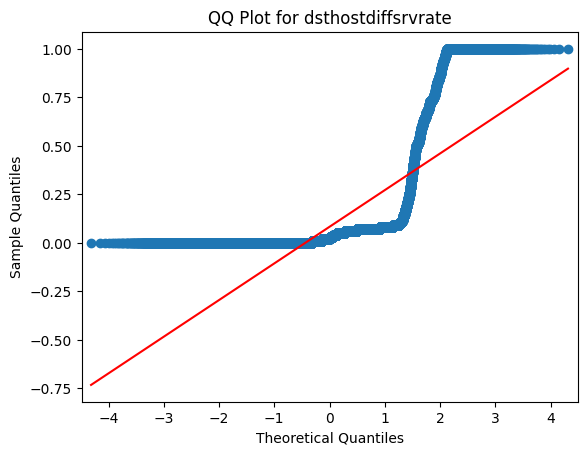

dsthostdiffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostdiffsrvrate across the groups in numcompromised (Kruskal-Wallis).
=============== srvcount-suattempted ================
                 count       mean        std  min  25%  50%   75%   max
suattempted                                                           
0            125893.0  14.107782  17.859332  0.0  2.0  8.0  18.0  65.0
1                80.0   1.012500   0.111803  1.0  1.0  1.0   1.0   2.0




<Figure size 800x600 with 0 Axes>

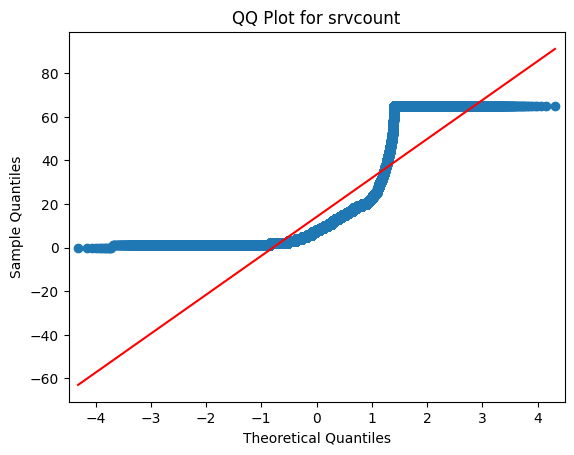

srvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvcount across the groups in suattempted (Kruskal-Wallis).
=============== srvcount-numfilecreations ================
                      count       mean        std  min  25%  50%   75%   max
numfilecreations                                                           
0                 125686.0  14.126116  17.867725  0.0  2.0  8.0  18.0  65.0
1                    287.0   2.428571   3.164646  1.0  1.0  1.0   2.0  22.0




<Figure size 800x600 with 0 Axes>

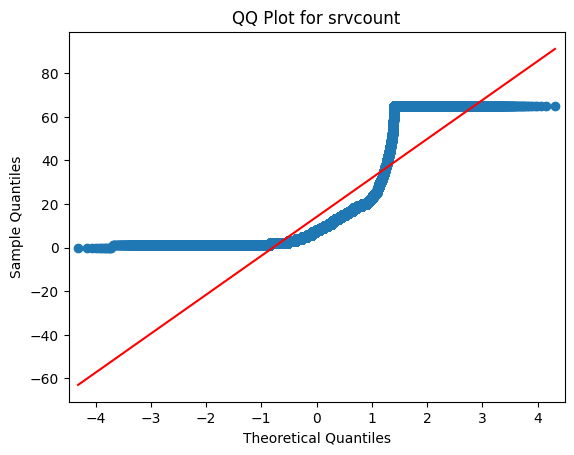

srvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvcount across the groups in numfilecreations (Kruskal-Wallis).
=============== srvcount-numfailedlogins ================
                     count       mean        std  min  25%  50%   75%   max
numfailedlogins                                                           
0                125851.0  14.111942  17.860857  0.0  2.0  8.0  18.0  65.0
1                   122.0   1.229508   0.441389  1.0  1.0  1.0   1.0   3.0




<Figure size 800x600 with 0 Axes>

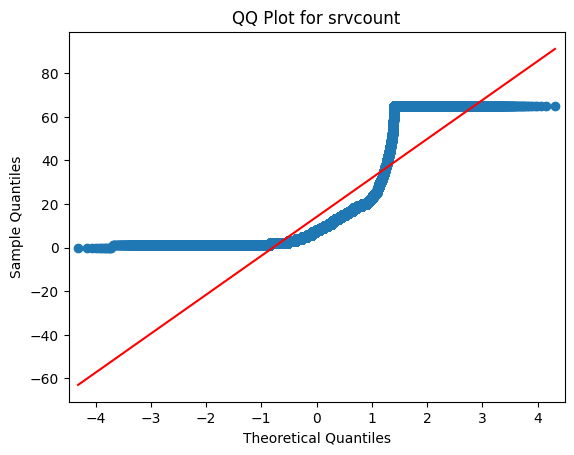

srvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvcount across the groups in numfailedlogins (Kruskal-Wallis).
=============== srvcount-numroot ================
             count       mean        std  min  25%  50%   75%   max
numroot                                                           
0        125324.0  14.162746  17.880086  0.0  2.0  8.0  18.0  65.0
1           649.0   1.879815   2.730324  1.0  1.0  1.0   2.0  25.0




<Figure size 800x600 with 0 Axes>

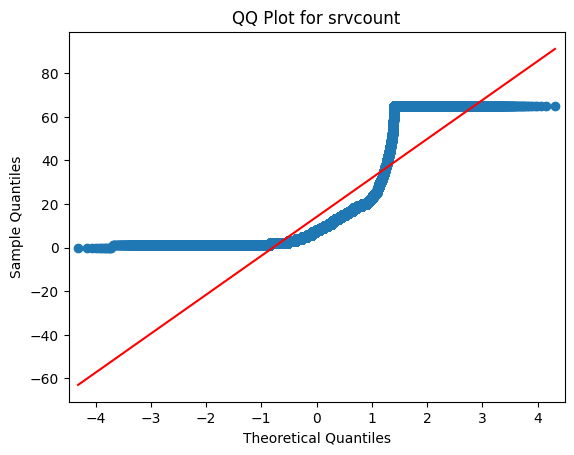

srvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvcount across the groups in numroot (Kruskal-Wallis).
=============== srvcount-numshells ================
               count       mean        std  min  25%  50%   75%   max
numshells                                                           
0          125926.0  14.102187  17.859114  0.0  2.0  8.0  18.0  65.0
1              47.0   6.808511   6.013168  1.0  1.0  5.0  11.0  18.0




<Figure size 800x600 with 0 Axes>

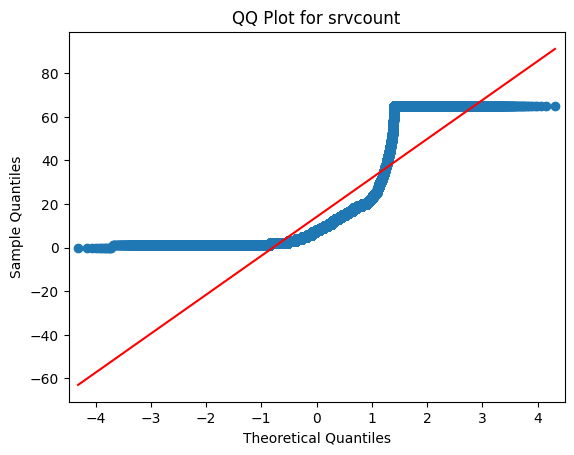

srvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvcount across the groups in numshells (Kruskal-Wallis).
=============== srvcount-loggedin ================
             count       mean        std  min  25%  50%   75%   max
loggedin                                                          
0         76121.0  16.922479  20.652129  0.0  2.0  9.0  19.0  65.0
1         49852.0   9.788895  11.124037  0.0  2.0  5.0  14.0  65.0




<Figure size 800x600 with 0 Axes>

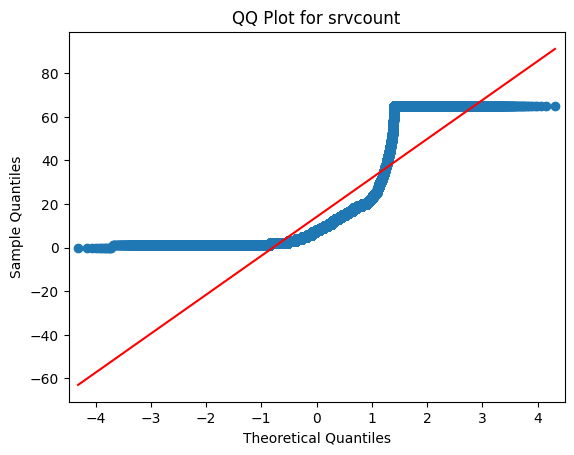

srvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvcount across the groups in loggedin (Kruskal-Wallis).
=============== srvcount-urgent ================
            count       mean        std  min  25%  50%   75%   max
urgent                                                           
0       125964.0  14.100402  17.857002  0.0  2.0  8.0  18.0  65.0
1            9.0   1.000000   0.000000  1.0  1.0  1.0   1.0   1.0




<Figure size 800x600 with 0 Axes>

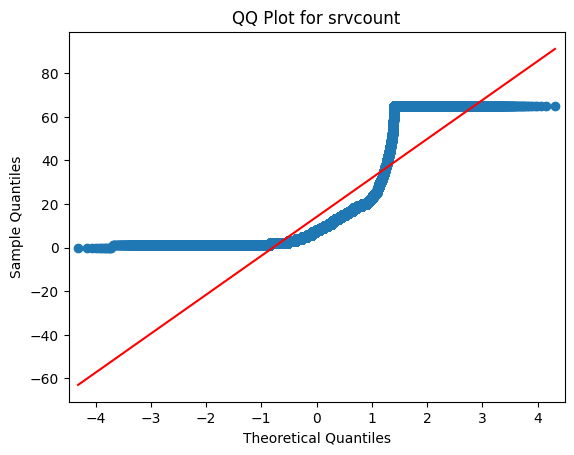

srvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvcount across the groups in urgent (Kruskal-Wallis).
=============== srvcount-land ================
          count       mean        std  min  25%  50%   75%   max
land                                                           
0     125948.0  14.101907  17.857638  0.0  2.0  8.0  18.0  65.0
1         25.0   1.800000   0.408248  1.0  2.0  2.0   2.0   2.0




<Figure size 800x600 with 0 Axes>

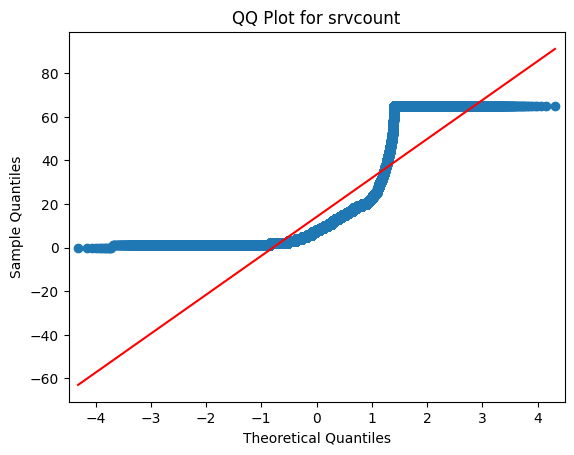

srvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvcount across the groups in land (Kruskal-Wallis).
=============== srvcount-lastflag ================
             count       mean        std  min  25%   50%    75%   max
lastflag                                                            
0            66.0   1.590909   0.876659  1.0  1.0   1.0   2.00   5.0
1            62.0   1.225806   0.458771  1.0  1.0   1.0   1.00   3.0
2            54.0   1.092593   0.292582  1.0  1.0   1.0   1.00   2.0
3            65.0   1.492308   1.032640  1.0  1.0   1.0   2.00   6.0
4            79.0   1.405063   0.927071  1.0  1.0   1.0   1.00   5.0
5            81.0   1.320988   0.771802  1.0  1.0   1.0   1.00   5.0
6            96.0   1.791667   1.160006  1.0  1.0   1.0   2.00   6.0
7           118.0   1.449153   0.983605  1.0  1.0   1.0   1.75   6.0
8           106.0   2.226415   5.153423  1.0  1.0   1

<Figure size 800x600 with 0 Axes>

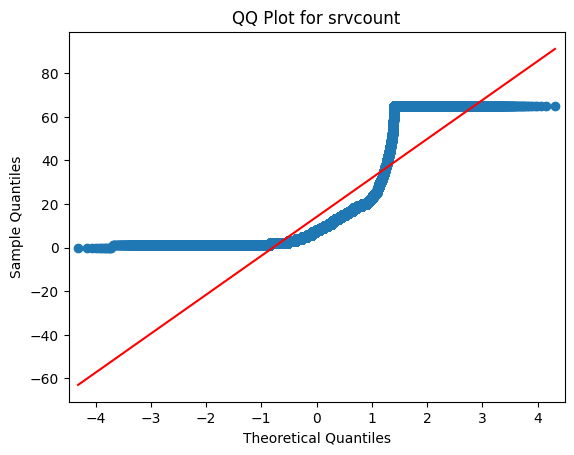

srvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvcount across the groups in lastflag (Kruskal-Wallis).
=============== srvcount-hot ================
         count      mean        std  min  25%  50%   75%   max
hot                                                          
0    123302.0  14.34864  17.960007  0.0  2.0  8.0  18.0  65.0
1      2671.0   2.59678   3.590913  1.0  1.0  1.0   3.0  65.0




<Figure size 800x600 with 0 Axes>

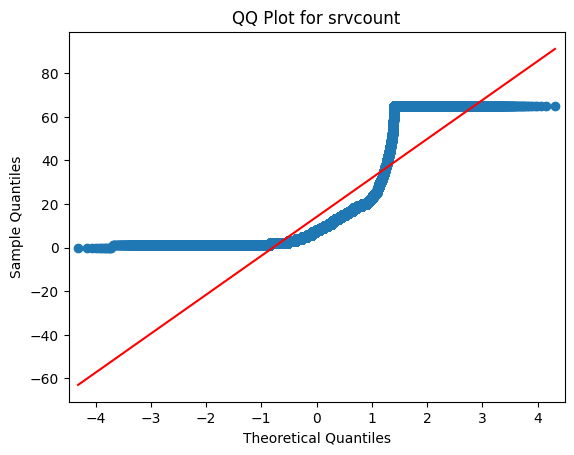

srvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvcount across the groups in hot (Kruskal-Wallis).
=============== srvcount-rootshell ================
               count       mean        std  min  25%  50%   75%   max
rootshell                                                           
0          125804.0  14.112802  17.862752  0.0  2.0  8.0  18.0  65.0
1             169.0   4.171598   7.732901  1.0  1.0  1.0   2.0  51.0




<Figure size 800x600 with 0 Axes>

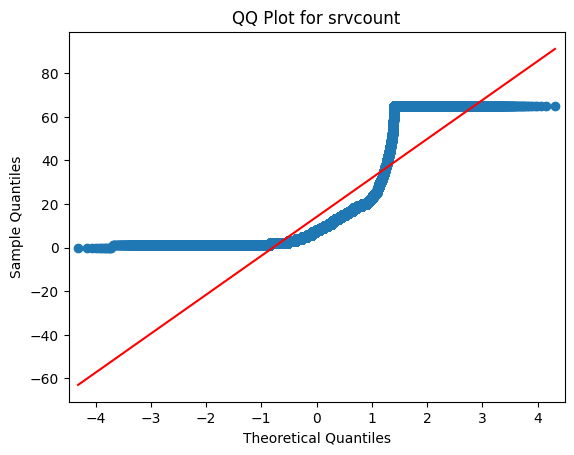

srvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvcount across the groups in rootshell (Kruskal-Wallis).
=============== srvcount-isguestlogin ================
                  count       mean        std  min  25%  50%   75%   max
isguestlogin                                                           
0             124786.0  14.223847  17.895615  0.0  2.0  8.0  18.0  65.0
1               1187.0   1.023589   0.151828  1.0  1.0  1.0   1.0   2.0




<Figure size 800x600 with 0 Axes>

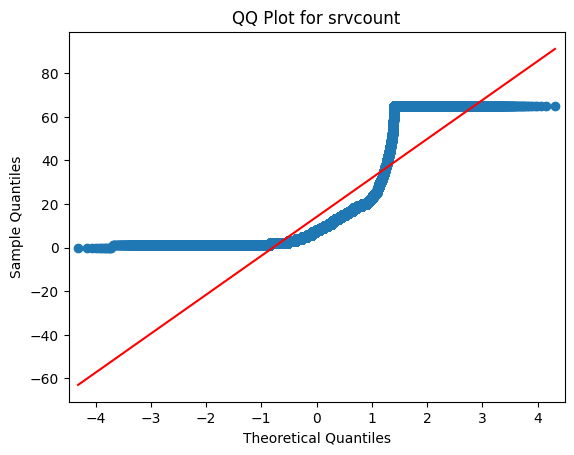

srvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvcount across the groups in isguestlogin (Kruskal-Wallis).
=============== srvcount-wrongfragment ================
                   count       mean        std  min   25%   50%   75%   max
wrongfragment                                                             
0              124883.0  13.895670  17.652525  0.0   2.0   7.0  17.0  65.0
1                1090.0  37.448624  24.498002  1.0  13.0  40.0  65.0  65.0




<Figure size 800x600 with 0 Axes>

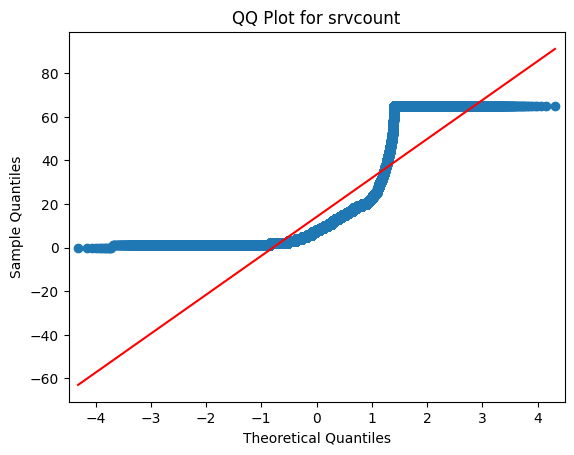

srvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvcount across the groups in wrongfragment (Kruskal-Wallis).
=============== srvcount-flag ================
           count       mean        std  min  25%   50%   75%   max
flag                                                             
OTH        46.0   1.782609   2.674265  1.0  1.0   1.0   1.0  15.0
REJ     11233.0   6.240719   6.575018  0.0  1.0   2.0  11.0  51.0
RSTO     1562.0   8.375800   6.735052  1.0  2.0   7.0  15.0  27.0
RSTOS0    103.0   2.165049   0.643171  1.0  2.0   2.0   3.0   3.0
RSTR     2421.0   1.606774   0.744581  0.0  1.0   2.0   2.0  11.0
S0      34851.0  10.961149   6.731419  1.0  5.0  11.0  17.0  49.0
S1        365.0   3.550685   6.651099  1.0  1.0   1.0   3.0  52.0
S2        127.0   3.629921   4.787224  1.0  1.0   2.0   4.0  24.0
S3         49.0   5.816327   8.368277  1.0  1.0   2.0   6.0  45.0
SF      7494

<Figure size 800x600 with 0 Axes>

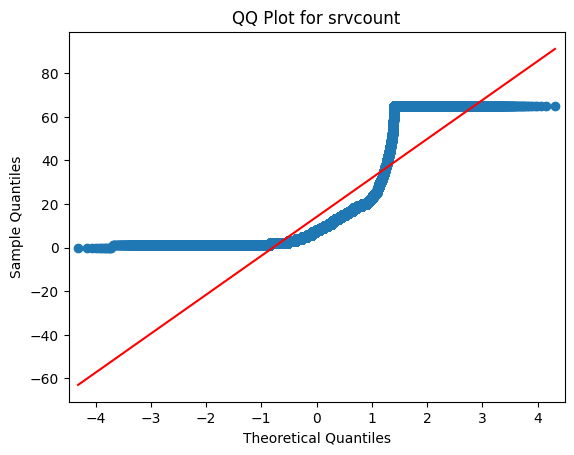

srvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvcount across the groups in flag (Kruskal-Wallis).
=============== srvcount-protocoltype ================
                  count       mean        std  min  25%   50%   75%   max
protocoltype                                                            
icmp            8291.0  31.736702  25.841132  0.0  4.0  29.0  65.0  65.0
tcp           102689.0   9.426881   9.289157  0.0  2.0   7.0  15.0  65.0
udp            14993.0  36.349363  30.038682  0.0  2.0  65.0  65.0  65.0




<Figure size 800x600 with 0 Axes>

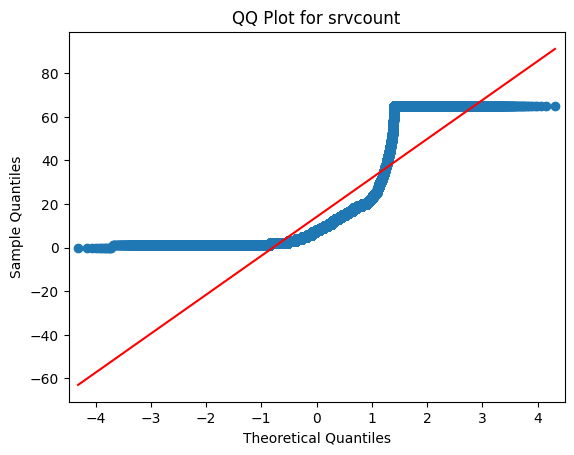

srvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvcount across the groups in protocoltype (Kruskal-Wallis).
=============== srvcount-numaccessfiles ================
                    count       mean        std  min  25%  50%   75%   max
numaccessfiles                                                           
0               125602.0  14.131248  17.872000  0.0  2.0  8.0  18.0  65.0
1                  371.0   3.339623   4.221953  1.0  1.0  2.0   4.0  49.0




<Figure size 800x600 with 0 Axes>

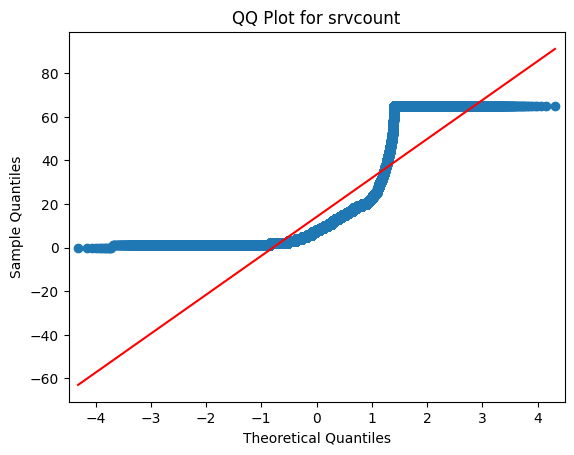

srvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvcount across the groups in numaccessfiles (Kruskal-Wallis).
=============== srvcount-numcompromised ================
                    count       mean        std  min  25%  50%   75%   max
numcompromised                                                           
0               124687.0  14.213390  17.911514  0.0  2.0  8.0  18.0  65.0
1                 1286.0   3.053655   2.351802  1.0  1.0  3.0   4.0  25.0




<Figure size 800x600 with 0 Axes>

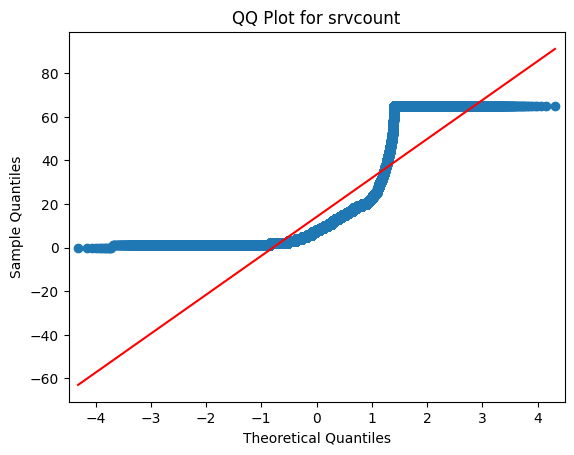

srvcount does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvcount across the groups in numcompromised (Kruskal-Wallis).
=============== dsthostsrvdiffhostrate-suattempted ================
                 count      mean       std  min  25%  50%   75%  max
suattempted                                                        
0            125893.0  0.032521  0.112483  0.0  0.0  0.0  0.02  1.0
1                80.0  0.066250  0.201616  0.0  0.0  0.0  0.00  1.0




<Figure size 800x600 with 0 Axes>

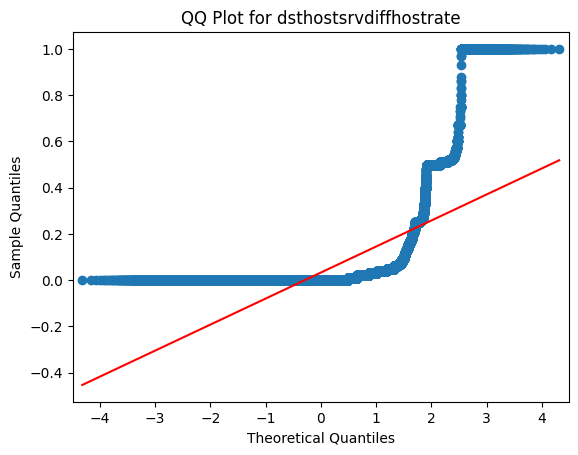

dsthostsrvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvdiffhostrate across the groups in suattempted (Kruskal-Wallis).
=============== dsthostsrvdiffhostrate-numfilecreations ================
                      count      mean       std  min  25%  50%   75%   max
numfilecreations                                                         
0                 125686.0  0.032560  0.112607  0.0  0.0  0.0  0.02  1.00
1                    287.0  0.024843  0.091613  0.0  0.0  0.0  0.01  0.67




<Figure size 800x600 with 0 Axes>

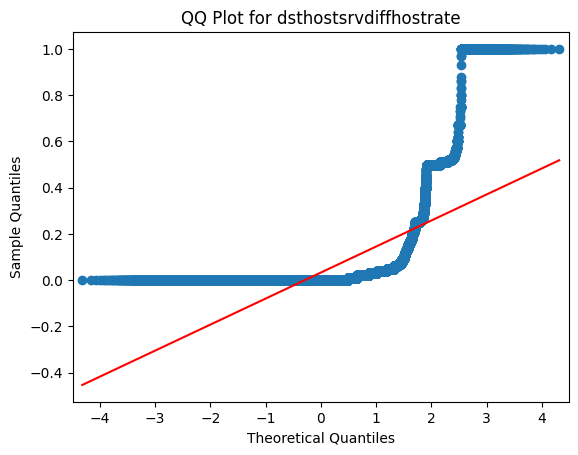

dsthostsrvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostsrvdiffhostrate-numfailedlogins ================
                     count      mean       std  min  25%  50%   75%  max
numfailedlogins                                                        
0                125851.0  0.032555  0.112549  0.0  0.0  0.0  0.02  1.0
1                   122.0  0.019672  0.126445  0.0  0.0  0.0  0.00  1.0




<Figure size 800x600 with 0 Axes>

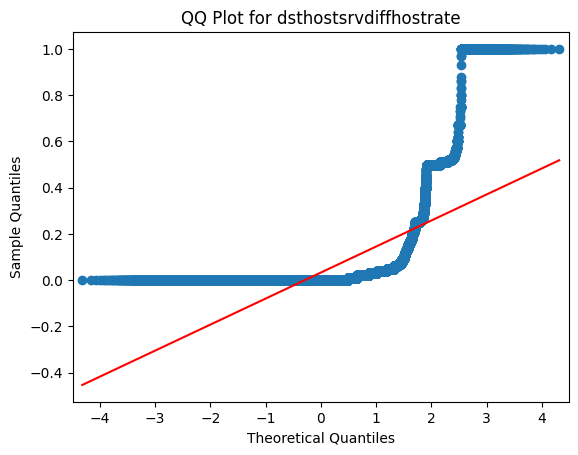

dsthostsrvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvdiffhostrate across the groups in numfailedlogins (Kruskal-Wallis).
=============== dsthostsrvdiffhostrate-numroot ================
             count      mean       std  min  25%   50%   75%  max
numroot                                                         
0        125324.0  0.032462  0.112447  0.0  0.0  0.00  0.02  1.0
1           649.0  0.047982  0.132410  0.0  0.0  0.02  0.04  1.0




<Figure size 800x600 with 0 Axes>

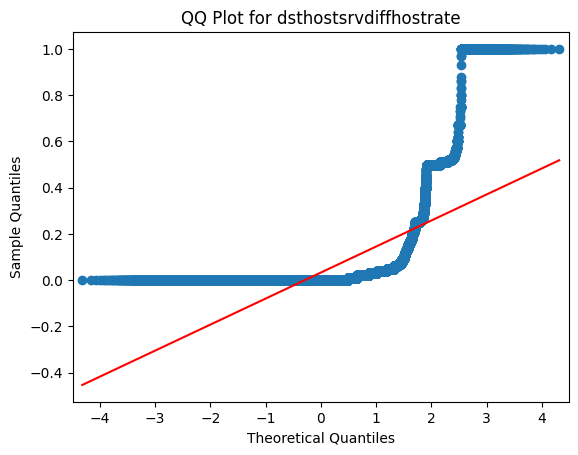

dsthostsrvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvdiffhostrate across the groups in numroot (Kruskal-Wallis).
=============== dsthostsrvdiffhostrate-numshells ================
               count      mean       std  min  25%  50%   75%  max
numshells                                                        
0          125926.0  0.032548  0.112581  0.0  0.0  0.0  0.02  1.0
1              47.0  0.016383  0.044596  0.0  0.0  0.0  0.02  0.3




<Figure size 800x600 with 0 Axes>

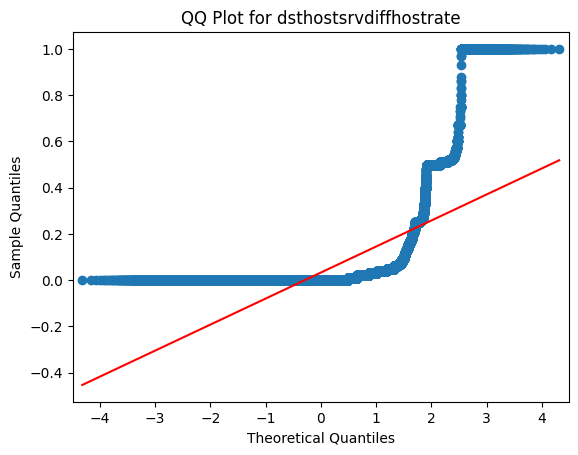

dsthostsrvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostsrvdiffhostrate-loggedin ================
             count      mean       std  min  25%   50%   75%  max
loggedin                                                        
0         76121.0  0.037639  0.135442  0.0  0.0  0.00  0.00  1.0
1         49852.0  0.024760  0.062504  0.0  0.0  0.01  0.03  1.0




<Figure size 800x600 with 0 Axes>

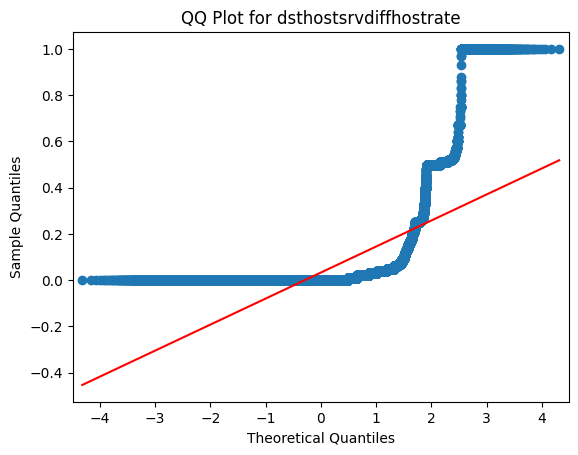

dsthostsrvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvdiffhostrate across the groups in loggedin (Kruskal-Wallis).
=============== dsthostsrvdiffhostrate-urgent ================
            count      mean       std  min  25%  50%   75%   max
urgent                                                         
0       125964.0  0.032533  0.112531  0.0  0.0  0.0  0.02  1.00
1            9.0  0.167778  0.333158  0.0  0.0  0.0  0.00  0.78




<Figure size 800x600 with 0 Axes>

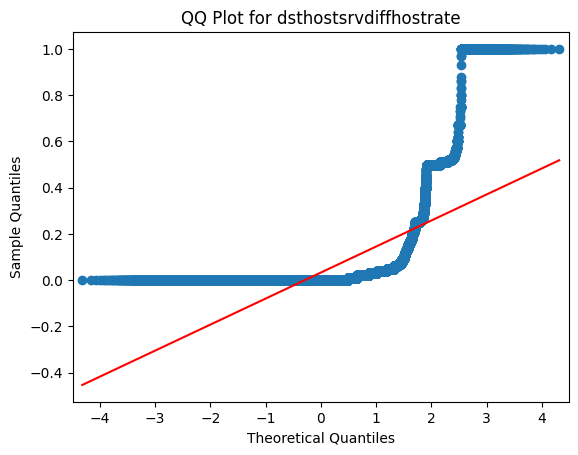

dsthostsrvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostsrvdiffhostrate-land ================
          count      mean       std  min   25%  50%   75%  max
land                                                         
0     125948.0  0.032431  0.112145  0.0  0.00  0.0  0.02  1.0
1         25.0  0.595600  0.420219  0.0  0.27  0.5  1.00  1.0




<Figure size 800x600 with 0 Axes>

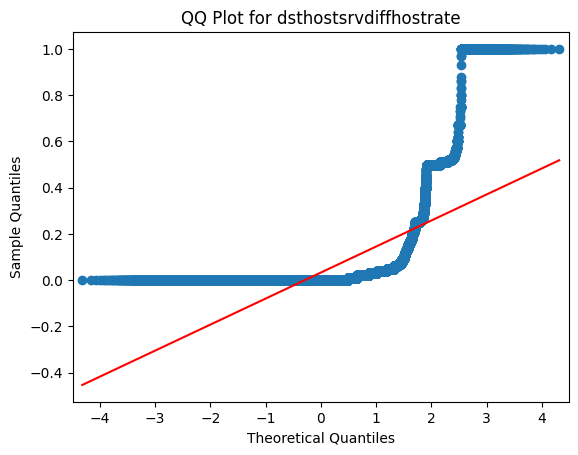

dsthostsrvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvdiffhostrate across the groups in land (Kruskal-Wallis).
=============== dsthostsrvdiffhostrate-lastflag ================
             count      mean       std  min  25%   50%     75%   max
lastflag                                                           
0            66.0  0.022424  0.087724  0.0  0.0  0.00  0.0200  0.67
1            62.0  0.180000  0.311837  0.0  0.0  0.00  0.2425  1.00
2            54.0  0.132963  0.318982  0.0  0.0  0.00  0.0300  1.00
3            65.0  0.055385  0.136646  0.0  0.0  0.00  0.1100  1.00
4            79.0  0.080127  0.215647  0.0  0.0  0.00  0.0050  1.00
5            81.0  0.072346  0.246269  0.0  0.0  0.00  0.0000  1.00
6            96.0  0.015313  0.096855  0.0  0.0  0.00  0.0000  0.93
7           118.0  0.110000  0.293959  0.0  0.0  0.00  0.0000  1.00
8           106.0  0.

<Figure size 800x600 with 0 Axes>

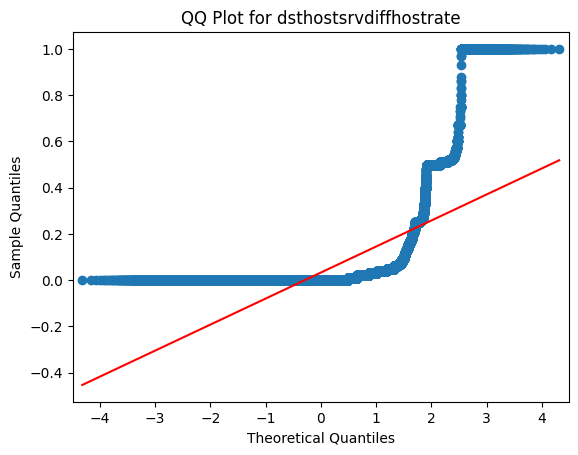

dsthostsrvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvdiffhostrate across the groups in lastflag (Kruskal-Wallis).
=============== dsthostsrvdiffhostrate-hot ================
         count      mean       std  min  25%  50%   75%  max
hot                                                        
0    123302.0  0.033068  0.113488  0.0  0.0  0.0  0.02  1.0
1      2671.0  0.008297  0.049219  0.0  0.0  0.0  0.00  1.0




<Figure size 800x600 with 0 Axes>

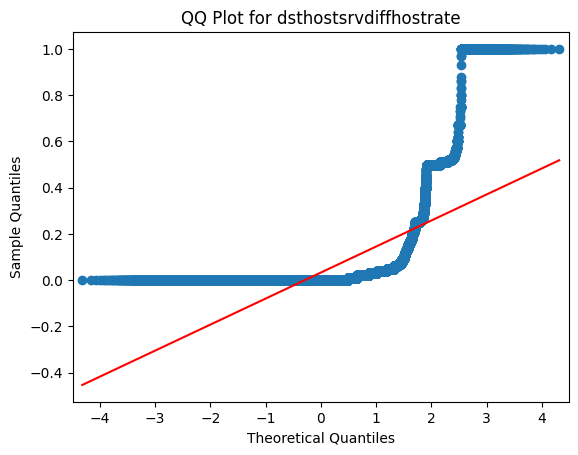

dsthostsrvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvdiffhostrate across the groups in hot (Kruskal-Wallis).
=============== dsthostsrvdiffhostrate-rootshell ================
               count      mean       std  min  25%  50%   75%  max
rootshell                                                        
0          125804.0  0.032487  0.112403  0.0  0.0  0.0  0.02  1.0
1             169.0  0.073669  0.195286  0.0  0.0  0.0  0.04  1.0




<Figure size 800x600 with 0 Axes>

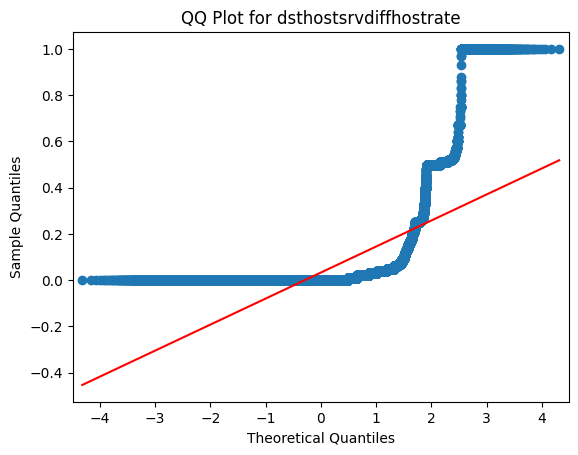

dsthostsrvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvdiffhostrate across the groups in rootshell (Kruskal-Wallis).
=============== dsthostsrvdiffhostrate-isguestlogin ================
                  count      mean       std  min  25%  50%   75%  max
isguestlogin                                                        
0             124786.0  0.032815  0.112981  0.0  0.0  0.0  0.02  1.0
1               1187.0  0.003901  0.044086  0.0  0.0  0.0  0.00  1.0




<Figure size 800x600 with 0 Axes>

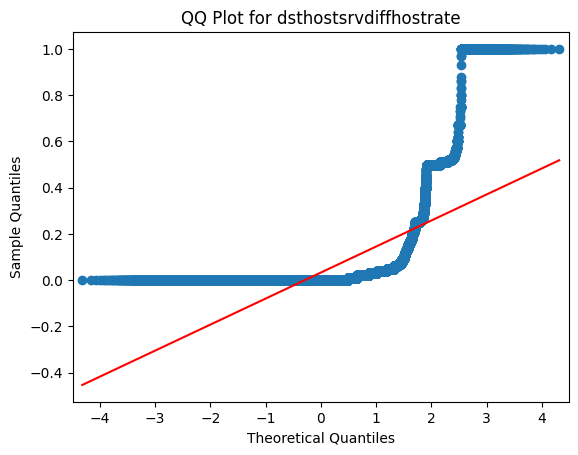

dsthostsrvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvdiffhostrate across the groups in isguestlogin (Kruskal-Wallis).
=============== dsthostsrvdiffhostrate-wrongfragment ================
                   count      mean       std  min  25%  50%   75%   max
wrongfragment                                                         
0              124883.0  0.032550  0.112512  0.0  0.0  0.0  0.02  1.00
1                1090.0  0.031725  0.118446  0.0  0.0  0.0  0.00  0.67




<Figure size 800x600 with 0 Axes>

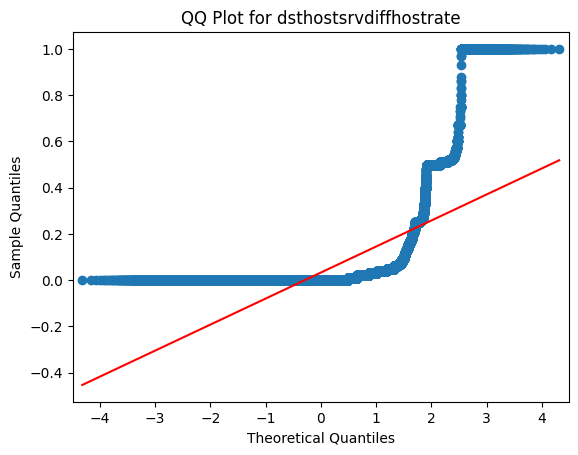

dsthostsrvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvdiffhostrate across the groups in wrongfragment (Kruskal-Wallis).
=============== dsthostsrvdiffhostrate-flag ================
           count      mean       std  min  25%   50%   75%   max
flag                                                           
OTH        46.0  0.010652  0.044091  0.0  0.0  0.00  0.00  0.29
REJ     11233.0  0.055333  0.163662  0.0  0.0  0.00  0.00  1.00
RSTO     1562.0  0.017695  0.121813  0.0  0.0  0.00  0.00  1.00
RSTOS0    103.0  0.002524  0.024643  0.0  0.0  0.00  0.00  0.25
RSTR     2421.0  0.001355  0.026053  0.0  0.0  0.00  0.00  0.67
S0      34851.0  0.001709  0.025107  0.0  0.0  0.00  0.00  1.00
S1        365.0  0.030466  0.100096  0.0  0.0  0.00  0.03  1.00
S2        127.0  0.027165  0.052431  0.0  0.0  0.02  0.03  0.40
S3         49.0  0.018571  0.026615  0.0  0.0  0.00  0.0

<Figure size 800x600 with 0 Axes>

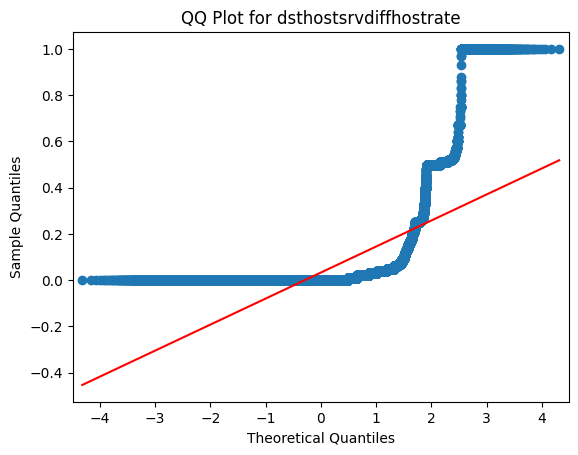

dsthostsrvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvdiffhostrate across the groups in flag (Kruskal-Wallis).
=============== dsthostsrvdiffhostrate-protocoltype ================
                  count      mean       std  min  25%   50%   75%  max
protocoltype                                                         
icmp            8291.0  0.236372  0.264190  0.0  0.0  0.25  0.50  1.0
tcp           102689.0  0.020611  0.078877  0.0  0.0  0.00  0.02  1.0
udp            14993.0  0.001545  0.018569  0.0  0.0  0.00  0.00  1.0




<Figure size 800x600 with 0 Axes>

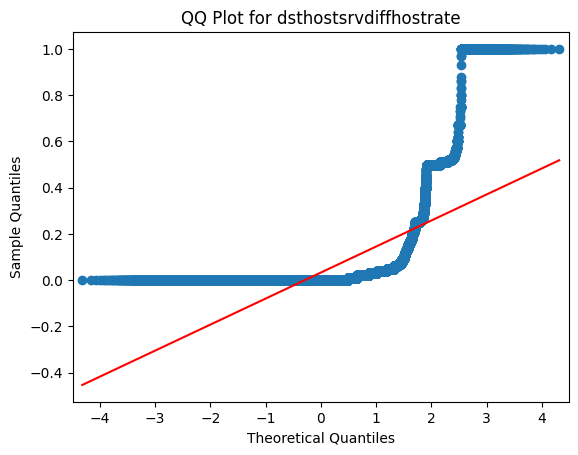

dsthostsrvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvdiffhostrate across the groups in protocoltype (Kruskal-Wallis).
=============== dsthostsrvdiffhostrate-numaccessfiles ================
                    count      mean       std  min  25%  50%   75%  max
numaccessfiles                                                        
0               125602.0  0.032585  0.112608  0.0  0.0  0.0  0.02  1.0
1                  371.0  0.018086  0.095591  0.0  0.0  0.0  0.00  1.0




<Figure size 800x600 with 0 Axes>

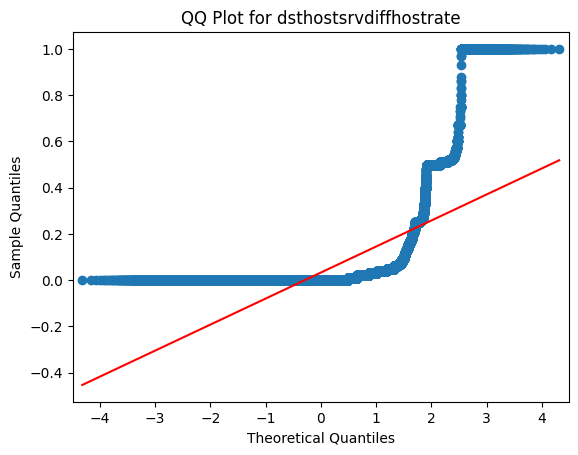

dsthostsrvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvdiffhostrate across the groups in numaccessfiles (Kruskal-Wallis).
=============== dsthostsrvdiffhostrate-numcompromised ================
                    count      mean       std  min  25%  50%   75%  max
numcompromised                                                        
0               124687.0  0.032680  0.112559  0.0  0.0  0.0  0.02  1.0
1                 1286.0  0.019176  0.112305  0.0  0.0  0.0  0.00  1.0




<Figure size 800x600 with 0 Axes>

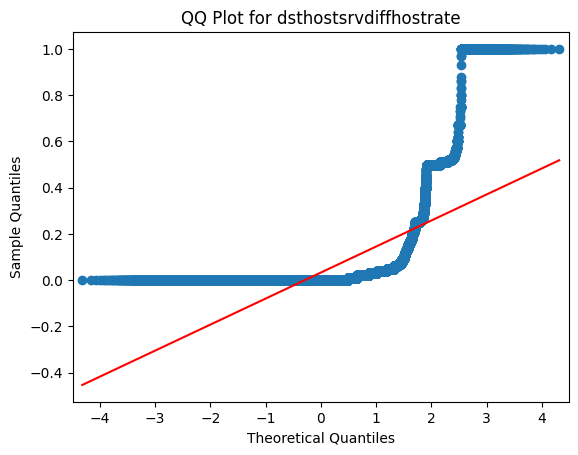

dsthostsrvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsrvdiffhostrate across the groups in numcompromised (Kruskal-Wallis).
=============== dsthostserrorrate-suattempted ================
                 count      mean       std  min  25%   50%   75%   max
suattempted                                                          
0            125893.0  0.284519  0.444848  0.0  0.0  0.00  1.00  1.00
1                80.0  0.180375  0.313770  0.0  0.0  0.01  0.22  0.99




<Figure size 800x600 with 0 Axes>

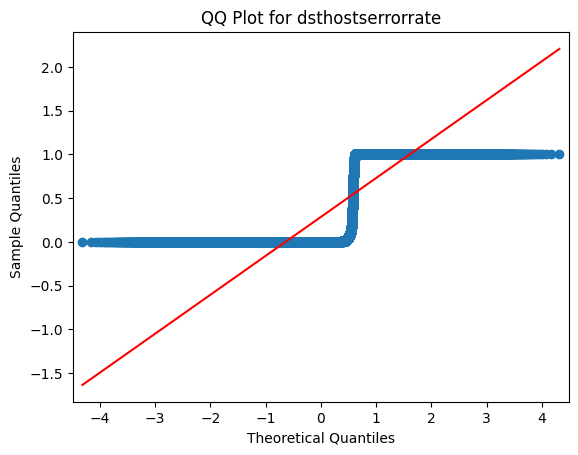

dsthostserrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostserrorrate-numfilecreations ================
                      count      mean       std  min  25%  50%    75%   max
numfilecreations                                                          
0                 125686.0  0.284762  0.445051  0.0  0.0  0.0  1.000  1.00
1                    287.0  0.148850  0.275311  0.0  0.0  0.0  0.115  0.98




<Figure size 800x600 with 0 Axes>

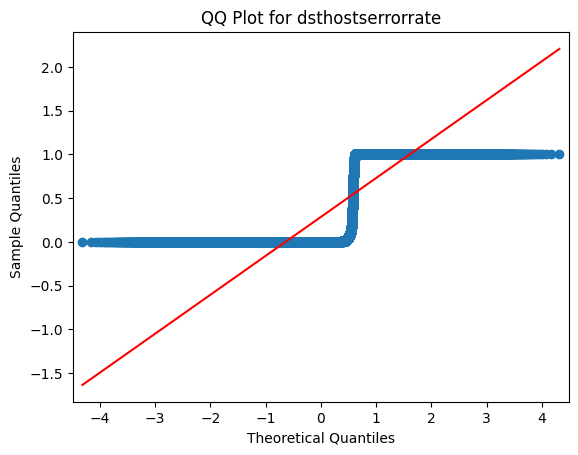

dsthostserrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostserrorrate-numfailedlogins ================
                     count      mean       std  min  25%   50%   75%  max
numfailedlogins                                                         
0                125851.0  0.284639  0.444919  0.0  0.0  0.00  1.00  1.0
1                   122.0  0.092049  0.193741  0.0  0.0  0.04  0.07  1.0




<Figure size 800x600 with 0 Axes>

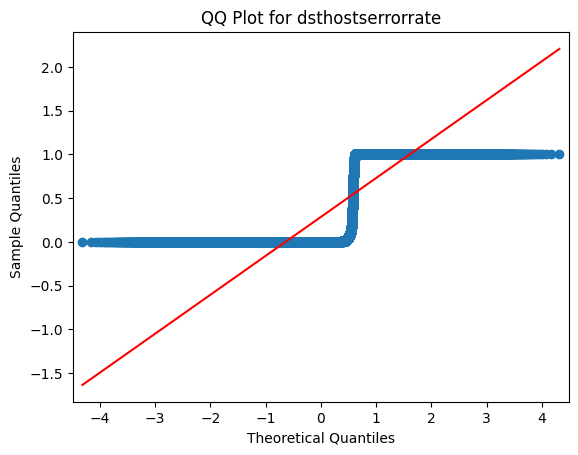

dsthostserrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostserrorrate across the groups in numfailedlogins (Kruskal-Wallis).
=============== dsthostserrorrate-numroot ================
             count      mean       std  min  25%  50%  75%   max
numroot                                                        
0        125324.0  0.285677  0.445440  0.0  0.0  0.0  1.0  1.00
1           649.0  0.047935  0.169727  0.0  0.0  0.0  0.0  0.99




<Figure size 800x600 with 0 Axes>

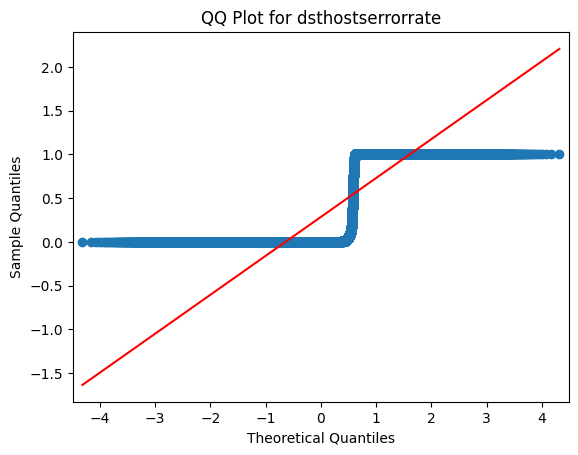

dsthostserrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostserrorrate across the groups in numroot (Kruskal-Wallis).
=============== dsthostserrorrate-numshells ================
               count      mean       std  min  25%  50%    75%   max
numshells                                                          
0          125926.0  0.284550  0.444836  0.0  0.0  0.0  1.000  1.00
1              47.0  0.023404  0.069573  0.0  0.0  0.0  0.005  0.33




<Figure size 800x600 with 0 Axes>

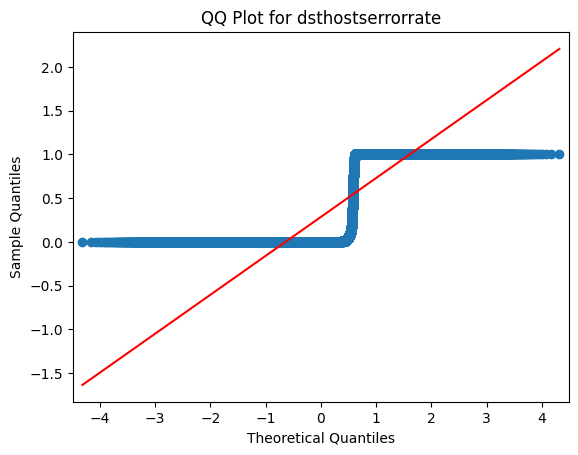

dsthostserrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostserrorrate across the groups in numshells (Kruskal-Wallis).
=============== dsthostserrorrate-loggedin ================
             count      mean       std  min  25%   50%  75%  max
loggedin                                                       
0         76121.0  0.461358  0.492783  0.0  0.0  0.03  1.0  1.0
1         49852.0  0.014329  0.091458  0.0  0.0  0.00  0.0  1.0




<Figure size 800x600 with 0 Axes>

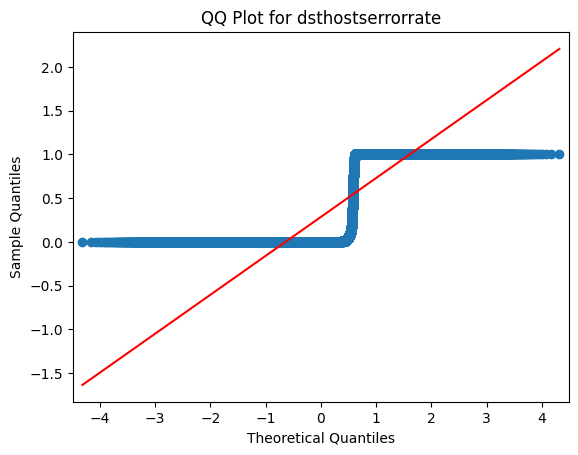

dsthostserrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostserrorrate across the groups in loggedin (Kruskal-Wallis).
=============== dsthostserrorrate-urgent ================
            count      mean       std  min  25%  50%  75%   max
urgent                                                        
0       125964.0  0.284472  0.444794  0.0  0.0  0.0  1.0  1.00
1            9.0  0.008889  0.026667  0.0  0.0  0.0  0.0  0.08




<Figure size 800x600 with 0 Axes>

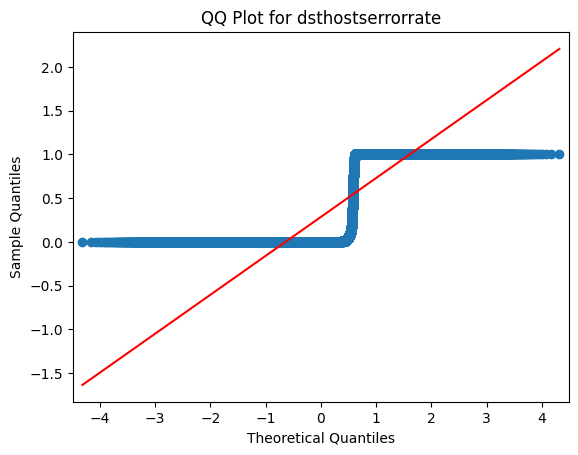

dsthostserrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostserrorrate-land ================
          count      mean       std   min  25%  50%  75%  max
land                                                        
0     125948.0  0.284328  0.444726  0.00  0.0  0.0  1.0  1.0
1         25.0  0.910800  0.259550  0.07  1.0  1.0  1.0  1.0




<Figure size 800x600 with 0 Axes>

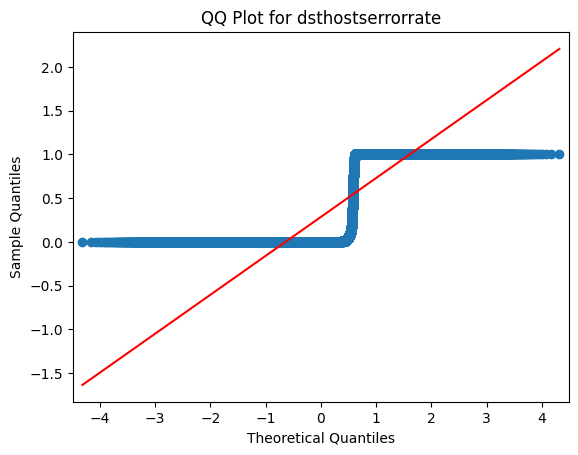

dsthostserrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostserrorrate across the groups in land (Kruskal-Wallis).
=============== dsthostserrorrate-lastflag ================
             count      mean       std  min  25%   50%    75%   max
lastflag                                                          
0            66.0  0.005303  0.007487  0.0  0.0  0.00  0.010  0.02
1            62.0  0.050645  0.216089  0.0  0.0  0.00  0.000  1.00
2            54.0  0.059630  0.192177  0.0  0.0  0.00  0.020  1.00
3            65.0  0.023231  0.059585  0.0  0.0  0.00  0.020  0.33
4            79.0  0.065063  0.133502  0.0  0.0  0.00  0.105  1.00
5            81.0  0.089012  0.225453  0.0  0.0  0.00  0.060  1.00
6            96.0  0.005729  0.017091  0.0  0.0  0.00  0.010  0.13
7           118.0  0.046525  0.170567  0.0  0.0  0.00  0.010  0.94
8           106.0  0.033019  0.153152  0.0  0.

<Figure size 800x600 with 0 Axes>

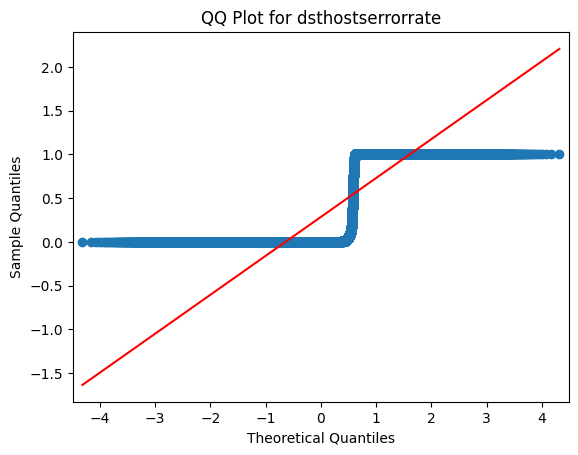

dsthostserrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostserrorrate across the groups in lastflag (Kruskal-Wallis).
=============== dsthostserrorrate-hot ================
         count      mean       std  min  25%  50%  75%  max
hot                                                       
0    123302.0  0.290249  0.447635  0.0  0.0  0.0  1.0  1.0
1      2671.0  0.016863  0.084921  0.0  0.0  0.0  0.0  1.0




<Figure size 800x600 with 0 Axes>

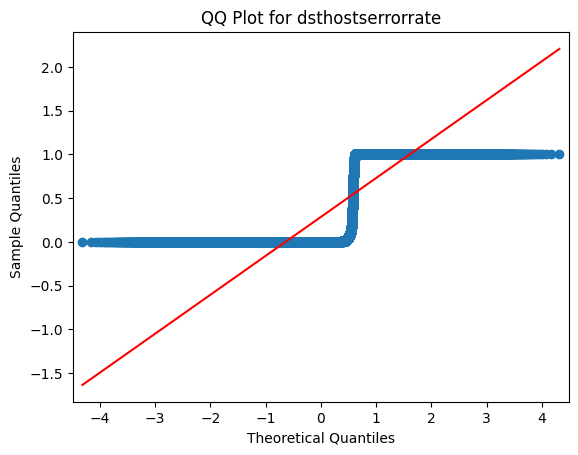

dsthostserrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostserrorrate across the groups in hot (Kruskal-Wallis).
=============== dsthostserrorrate-rootshell ================
               count      mean       std  min  25%  50%   75%   max
rootshell                                                         
0          125804.0  0.284736  0.444945  0.0  0.0  0.0  1.00  1.00
1             169.0  0.073195  0.217010  0.0  0.0  0.0  0.01  0.99




<Figure size 800x600 with 0 Axes>

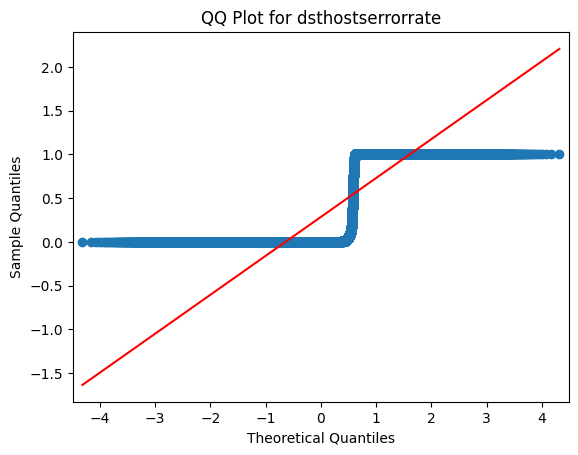

dsthostserrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostserrorrate across the groups in rootshell (Kruskal-Wallis).
=============== dsthostserrorrate-isguestlogin ================
                  count      mean       std  min  25%  50%  75%   max
isguestlogin                                                        
0             124786.0  0.287087  0.446060  0.0  0.0  0.0  1.0  1.00
1               1187.0  0.007439  0.029229  0.0  0.0  0.0  0.0  0.39




<Figure size 800x600 with 0 Axes>

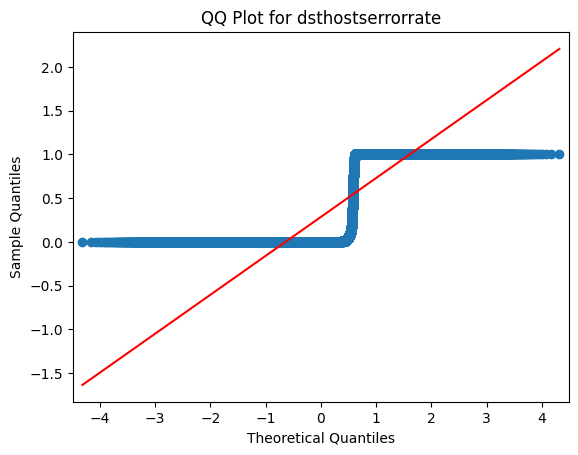

dsthostserrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostserrorrate across the groups in isguestlogin (Kruskal-Wallis).
=============== dsthostserrorrate-wrongfragment ================
                   count      mean       std  min  25%  50%   75%   max
wrongfragment                                                         
0              124883.0  0.286639  0.446021  0.0  0.0  0.0  1.00  1.00
1                1090.0  0.033936  0.091103  0.0  0.0  0.0  0.02  0.61




<Figure size 800x600 with 0 Axes>

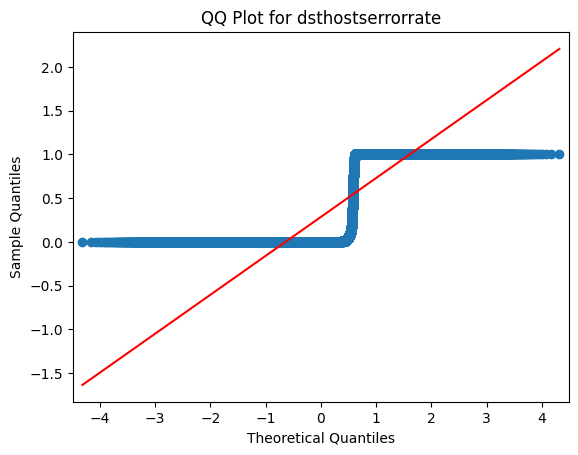

dsthostserrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostserrorrate across the groups in wrongfragment (Kruskal-Wallis).
=============== dsthostserrorrate-flag ================
           count      mean       std   min     25%   50%   75%   max
flag                                                               
OTH        46.0  0.025870  0.019616  0.00  0.0025  0.03  0.04  0.08
REJ     11233.0  0.015516  0.045768  0.00  0.0000  0.00  0.00  0.71
RSTO     1562.0  0.008611  0.066383  0.00  0.0000  0.00  0.00  0.96
RSTOS0    103.0  0.305049  0.198864  0.00  0.0900  0.36  0.47  0.58
RSTR     2421.0  0.008257  0.049125  0.00  0.0000  0.00  0.00  0.93
S0      34851.0  0.986282  0.104845  0.00  1.0000  1.00  1.00  1.00
S1        365.0  0.120521  0.243619  0.00  0.0100  0.02  0.09  1.00
S2        127.0  0.117638  0.251183  0.00  0.0100  0.02  0.08  1.00
S3         49.0  0.097143  0.22

<Figure size 800x600 with 0 Axes>

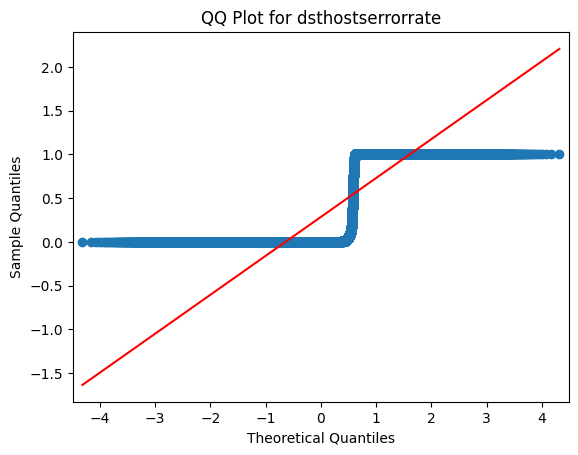

dsthostserrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostserrorrate across the groups in flag (Kruskal-Wallis).
=============== dsthostserrorrate-protocoltype ================
                  count      mean       std  min  25%  50%  75%   max
protocoltype                                                        
icmp            8291.0  0.006619  0.047384  0.0  0.0  0.0  0.0  0.76
tcp           102689.0  0.347798  0.469821  0.0  0.0  0.0  1.0  1.00
udp            14993.0  0.004227  0.021403  0.0  0.0  0.0  0.0  0.29




<Figure size 800x600 with 0 Axes>

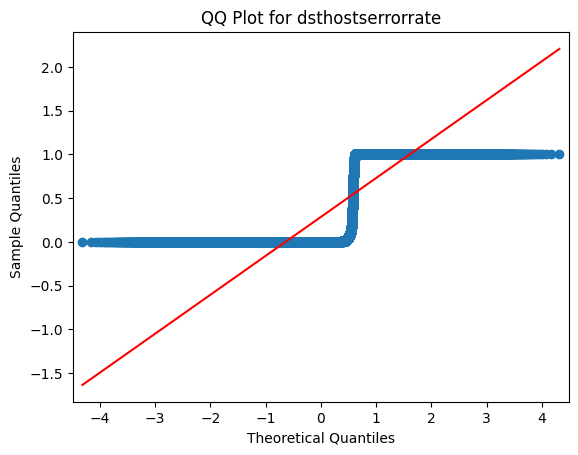

dsthostserrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostserrorrate across the groups in protocoltype (Kruskal-Wallis).
=============== dsthostserrorrate-numaccessfiles ================
                    count      mean       std  min  25%  50%  75%  max
numaccessfiles                                                       
0               125602.0  0.285105  0.445138  0.0  0.0  0.0  1.0  1.0
1                  371.0  0.063585  0.206236  0.0  0.0  0.0  0.0  1.0




<Figure size 800x600 with 0 Axes>

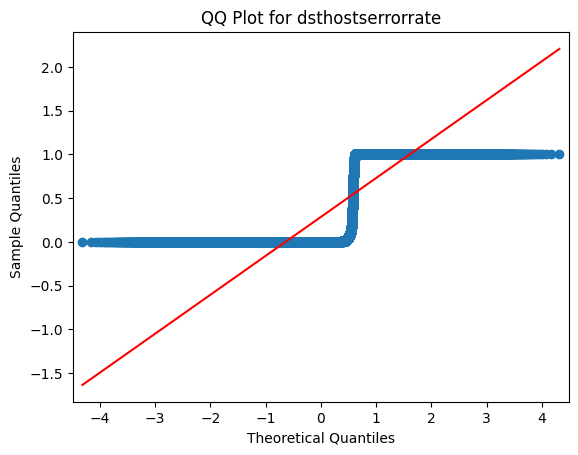

dsthostserrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostserrorrate across the groups in numaccessfiles (Kruskal-Wallis).
=============== dsthostserrorrate-numcompromised ================
                    count      mean       std  min  25%  50%   75%  max
numcompromised                                                        
0               124687.0  0.286567  0.446026  0.0  0.0  0.0  1.00  1.0
1                 1286.0  0.079432  0.219394  0.0  0.0  0.0  0.01  1.0




<Figure size 800x600 with 0 Axes>

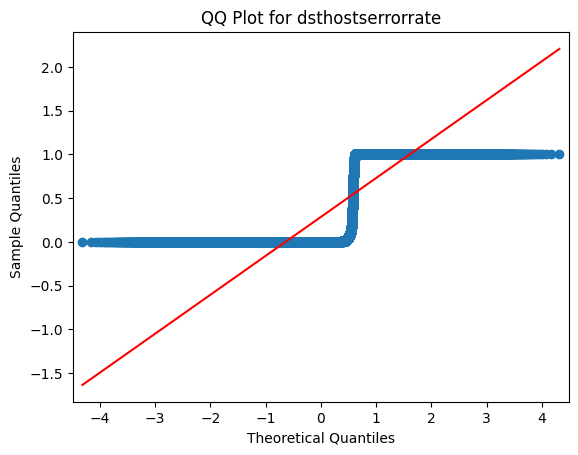

dsthostserrorrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostserrorrate across the groups in numcompromised (Kruskal-Wallis).
=============== srcbytes-suattempted ================
                 count         mean          std    min    25%    50%      75%  \
suattempted                                                                     
0            125893.0  1029.448309  6139.706517    0.0    0.0   44.0   275.00   
1                80.0  1107.887500  1682.398792  142.0  477.0  747.0  1151.75   

                 max  
suattempted           
0            54540.0  
1            14384.0  




<Figure size 800x600 with 0 Axes>

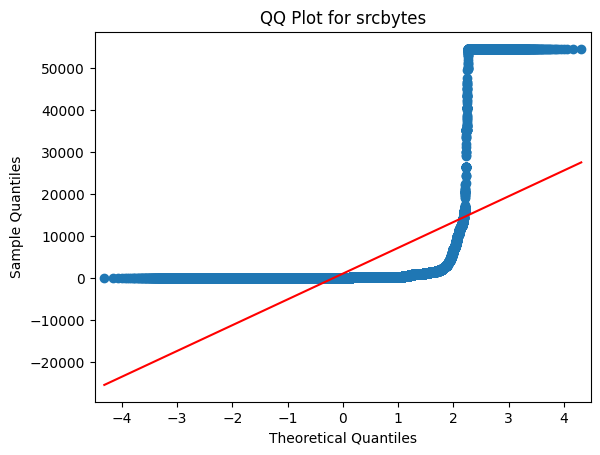

srcbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srcbytes across the groups in suattempted (Kruskal-Wallis).
=============== srcbytes-numfilecreations ================
                      count         mean          std   min    25%     50%  \
numfilecreations                                                            
0                 125686.0  1021.127604  6137.485518   0.0    0.0    44.0   
1                    287.0  4695.202091  5151.198811  36.0  983.5  2206.0   

                     75%      max  
numfilecreations                   
0                  274.0  54540.0  
1                 7940.0  16787.0  




<Figure size 800x600 with 0 Axes>

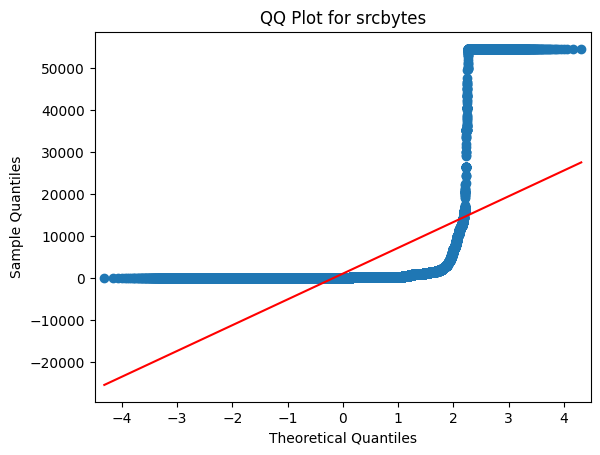

srcbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srcbytes across the groups in numfilecreations (Kruskal-Wallis).
=============== srcbytes-numfailedlogins ================
                     count         mean          std   min   25%    50%    75%  \
numfailedlogins                                                                 
0                125851.0  1030.216534  6140.807136   0.0   0.0   44.0  276.0   
1                   122.0   288.409836   569.561246  55.0  92.0  126.0  126.0   

                     max  
numfailedlogins           
0                54540.0  
1                 4454.0  




<Figure size 800x600 with 0 Axes>

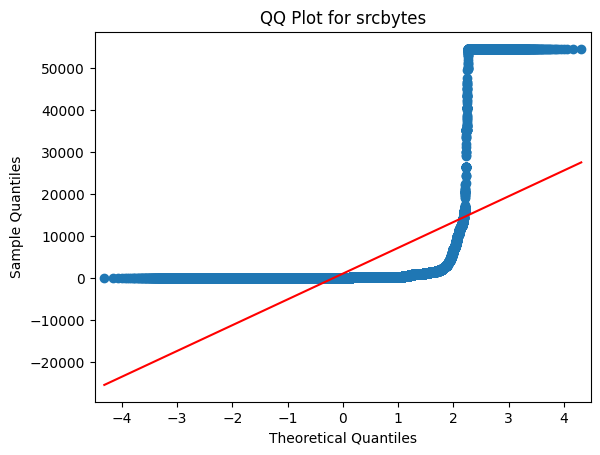

srcbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srcbytes across the groups in numfailedlogins (Kruskal-Wallis).
=============== srcbytes-numroot ================
             count         mean           std  min    25%    50%    75%  \
numroot                                                                  
0        125324.0  1021.118732   6108.610421  0.0    0.0   44.0  273.0   
1           649.0  2647.585516  10221.126296  0.0  245.0  567.0  748.0   

             max  
numroot           
0        54540.0  
1        54540.0  




<Figure size 800x600 with 0 Axes>

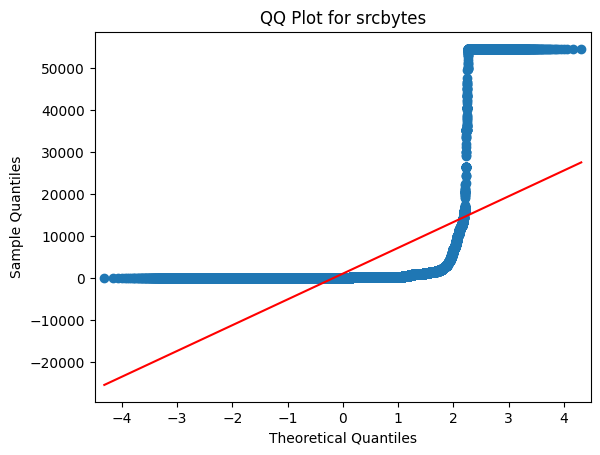

srcbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srcbytes across the groups in numroot (Kruskal-Wallis).
=============== srcbytes-numshells ================
               count         mean          std    min     25%     50%     75%  \
numshells                                                                      
0          125926.0  1028.556279  6138.760222    0.0     0.0    44.0   276.0   
1              47.0  3552.957447  1768.435405  231.0  4316.0  4316.0  4753.0   

               max  
numshells           
0          54540.0  
1           4753.0  




<Figure size 800x600 with 0 Axes>

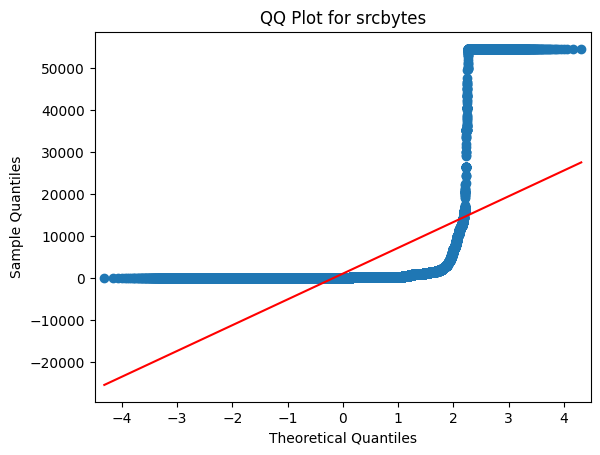

srcbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srcbytes across the groups in numshells (Kruskal-Wallis).
=============== srcbytes-loggedin ================
             count         mean          std  min    25%    50%    75%      max
loggedin                                                                      
0         76121.0   218.487054  2473.232744  0.0    0.0    0.0   28.0  54540.0
1         49852.0  2267.863155  9128.119635  0.0  222.0  289.0  365.0  54540.0




<Figure size 800x600 with 0 Axes>

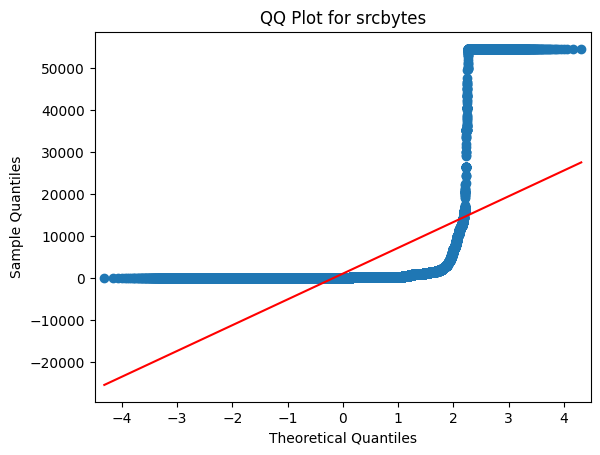

srcbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srcbytes across the groups in loggedin (Kruskal-Wallis).
=============== srcbytes-urgent ================
            count         mean          std    min    25%    50%    75%  \
urgent                                                                   
0       125964.0  1029.520982  6138.116854    0.0    0.0   44.0  276.0   
1            9.0   709.555556   810.647598  100.0  137.0  465.0  621.0   

            max  
urgent           
0       54540.0  
1        2238.0  




<Figure size 800x600 with 0 Axes>

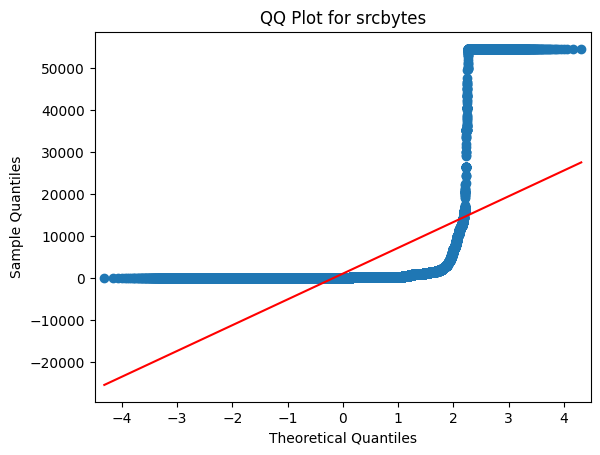

srcbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srcbytes across the groups in urgent (Kruskal-Wallis).
=============== srcbytes-land ================
          count         mean          std  min  25%   50%    75%      max
land                                                                    
0     125948.0  1029.702472  6138.493584  0.0  0.0  44.0  276.0  54540.0
1         25.0     0.000000     0.000000  0.0  0.0   0.0    0.0      0.0




<Figure size 800x600 with 0 Axes>

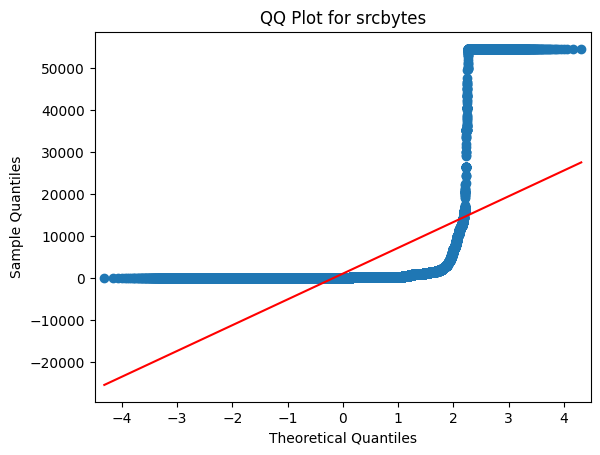

srcbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srcbytes across the groups in land (Kruskal-Wallis).
=============== srcbytes-lastflag ================
             count          mean           std  min     25%      50%       75%  \
lastflag                                                                        
0            66.0    689.363636   1321.204260  5.0   94.50    334.0    334.00   
1            62.0   2027.354839   9710.688124  0.0    0.00     18.0    315.50   
2            54.0    918.629630   1181.522975  0.0    0.00    984.5   1265.25   
3            65.0   4913.292308  14570.844146  0.0   20.00    334.0   1170.00   
4            79.0   2713.569620   9392.480142  0.0    9.00    334.0   1175.00   
5            81.0   2647.740741   9106.013091  0.0    0.00     20.0   1199.00   
6            96.0   7925.385417  17936.748066  0.0    8.00    100.0   1235.50   
7           11

<Figure size 800x600 with 0 Axes>

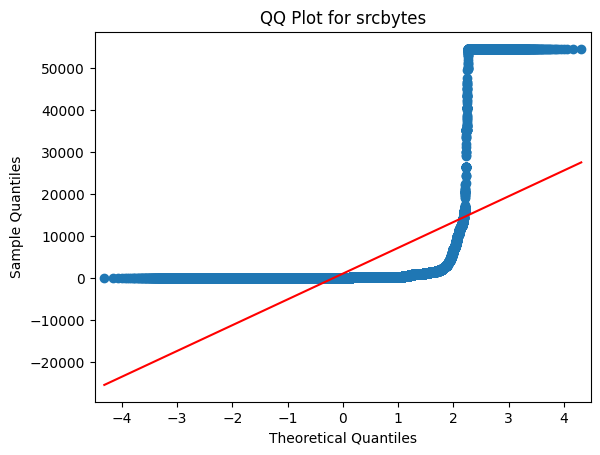

srcbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srcbytes across the groups in lastflag (Kruskal-Wallis).
=============== srcbytes-hot ================
         count          mean           std  min    25%     50%      75%  \
hot                                                                      
0    123302.0    604.027250   3943.427158  0.0    0.0    43.0    259.0   
1      2671.0  20670.609884  25788.832132  0.0  336.0  1265.0  54540.0   

         max  
hot           
0    54540.0  
1    54540.0  




<Figure size 800x600 with 0 Axes>

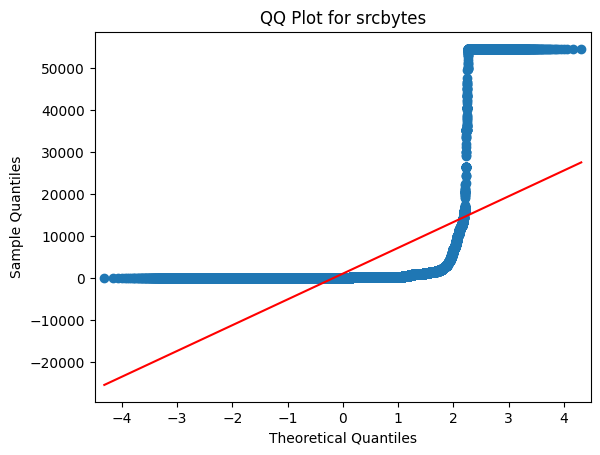

srcbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srcbytes across the groups in hot (Kruskal-Wallis).
=============== srcbytes-rootshell ================
               count         mean          std  min    25%    50%    75%  \
rootshell                                                                 
0          125804.0  1029.328757  6139.965227  0.0    0.0   44.0  275.0   
1             169.0  1155.573964  4348.434194  0.0  258.0  394.0  975.0   

               max  
rootshell           
0          54540.0  
1          54540.0  




<Figure size 800x600 with 0 Axes>

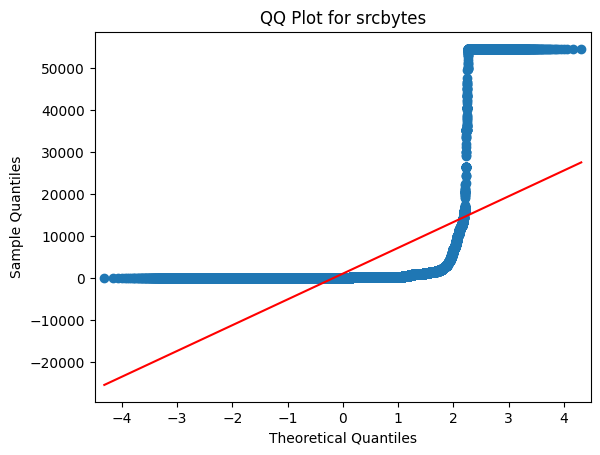

srcbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srcbytes across the groups in rootshell (Kruskal-Wallis).
=============== srcbytes-isguestlogin ================
                  count         mean          std   min    25%     50%     75%  \
isguestlogin                                                                    
0             124786.0  1030.413123  6166.842079   0.0    0.0    44.0   267.0   
1               1187.0   933.306655   478.137036  36.0  334.5  1150.0  1255.5   

                  max  
isguestlogin           
0             54540.0  
1              1560.0  




<Figure size 800x600 with 0 Axes>

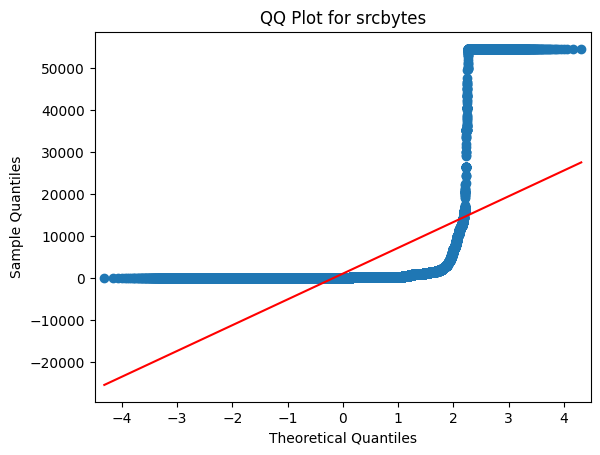

srcbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srcbytes across the groups in isguestlogin (Kruskal-Wallis).
=============== srcbytes-wrongfragment ================
                   count         mean          std   min   25%   50%    75%  \
wrongfragment                                                                
0              124883.0  1035.937245  6164.019358   0.0   0.0  44.0  276.0   
1                1090.0   291.757798   560.085655  28.0  28.0  28.0   28.0   

                   max  
wrongfragment           
0              54540.0  
1               1480.0  




<Figure size 800x600 with 0 Axes>

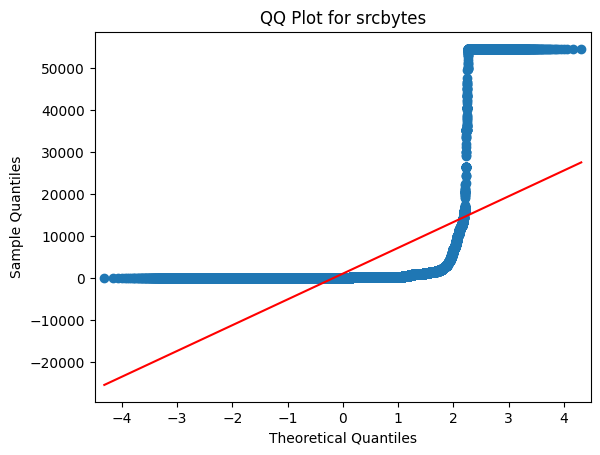

srcbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srcbytes across the groups in wrongfragment (Kruskal-Wallis).
=============== srcbytes-flag ================
           count          mean           std  min    25%    50%     75%  \
flag                                                                     
OTH        46.0     62.804348    338.577982  0.0    0.0    0.0     0.0   
REJ     11233.0      0.000000      0.000000  0.0    0.0    0.0     0.0   
RSTO     1562.0    145.505762   2094.447121  0.0    0.0    0.0     0.0   
RSTOS0    103.0   2647.582524  11778.619547  0.0    0.0    0.0     0.0   
RSTR     2421.0   1830.515903   9071.323929  0.0    0.0    1.0     1.0   
S0      34851.0      0.025365      2.413565  0.0    0.0    0.0     0.0   
S1        365.0   5806.641096  14594.842783  0.0  167.0  260.0   926.0   
S2        127.0   3256.448819  10816.218983  0.0  180.5  240.0   638.5  

<Figure size 800x600 with 0 Axes>

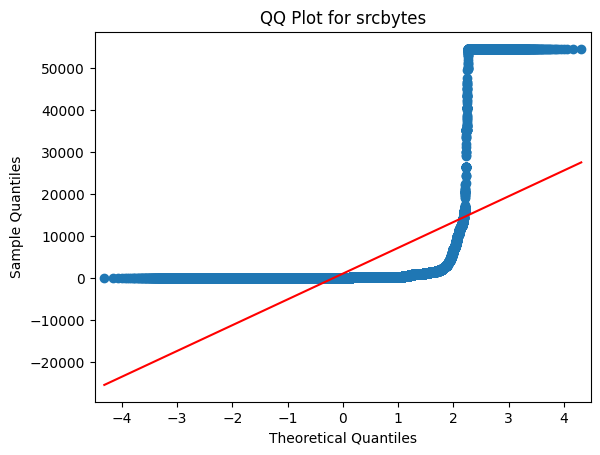

srcbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srcbytes across the groups in flag (Kruskal-Wallis).
=============== srcbytes-protocoltype ================
                  count         mean          std  min   25%   50%     75%  \
protocoltype                                                                
icmp            8291.0   342.577976   463.467400  8.0   8.0  30.0  1032.0   
tcp           102689.0  1224.993641  6781.387429  0.0   0.0  12.0   292.0   
udp            14993.0    70.384913    83.174308  1.0  42.0  44.0    86.0   

                  max  
protocoltype           
icmp           1480.0  
tcp           54540.0  
udp             516.0  




<Figure size 800x600 with 0 Axes>

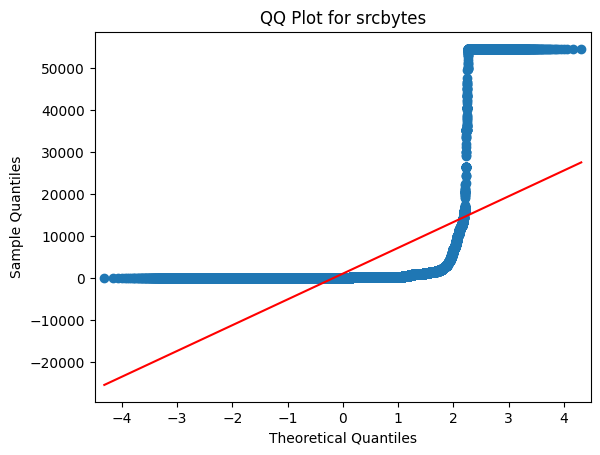

srcbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srcbytes across the groups in protocoltype (Kruskal-Wallis).
=============== srcbytes-numaccessfiles ================
                    count         mean          std   min    25%    50%    75%  \
numaccessfiles                                                                  
0               125602.0  1028.065548  6144.666874   0.0    0.0   44.0  274.0   
1                  371.0  1514.495957  3054.737779  51.0  270.5  311.0  977.0   

                    max  
numaccessfiles           
0               54540.0  
1               12324.0  




<Figure size 800x600 with 0 Axes>

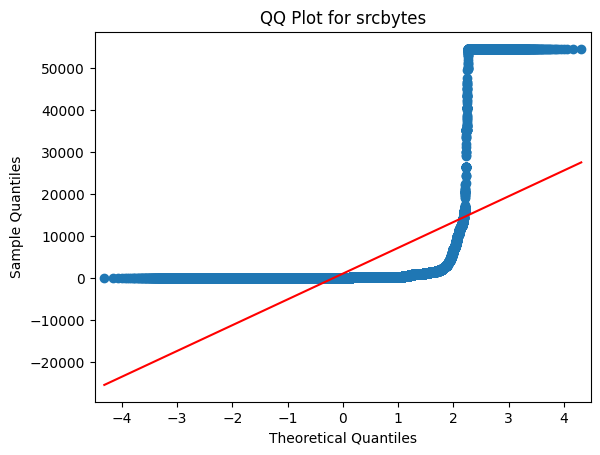

srcbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srcbytes across the groups in numaccessfiles (Kruskal-Wallis).
=============== srcbytes-numcompromised ================
                    count          mean           std  min      25%      50%  \
numcompromised                                                                
0               124687.0    653.395125   4221.692931  0.0     0.00     44.0   
1                 1286.0  37495.403577  24887.242845  0.0  1037.25  54540.0   

                    75%      max  
numcompromised                    
0                 266.0  54540.0  
1               54540.0  54540.0  




<Figure size 800x600 with 0 Axes>

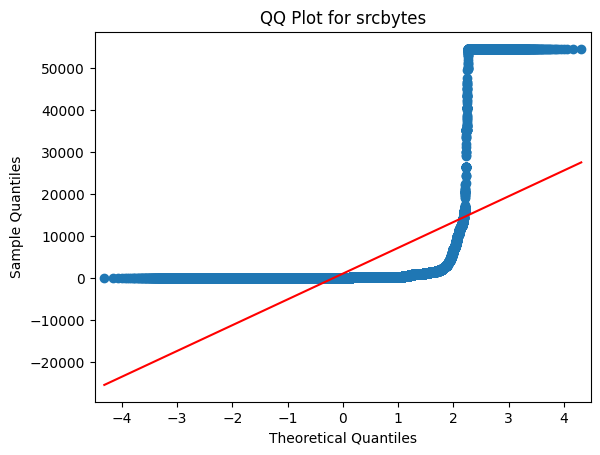

srcbytes does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srcbytes across the groups in numcompromised (Kruskal-Wallis).
=============== srvdiffhostrate-suattempted ================
                 count      mean       std  min  25%  50%  75%  max
suattempted                                                       
0            125893.0  0.097383  0.259901  0.0  0.0  0.0  0.0  1.0
1                80.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0




<Figure size 800x600 with 0 Axes>

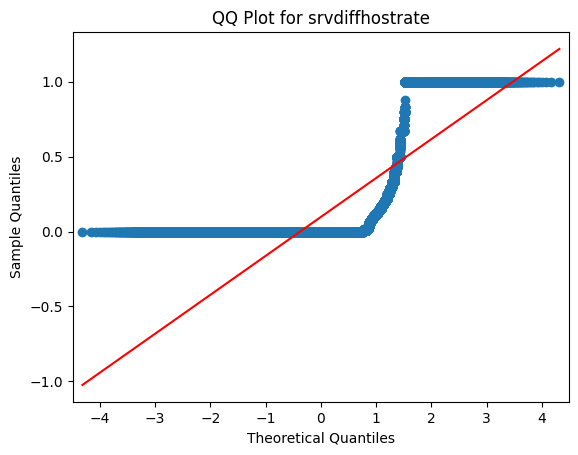

srvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvdiffhostrate across the groups in suattempted (Kruskal-Wallis).
=============== srvdiffhostrate-numfilecreations ================
                      count      mean       std  min  25%  50%  75%  max
numfilecreations                                                       
0                 125686.0  0.097271  0.259683  0.0  0.0  0.0  0.0  1.0
1                    287.0  0.119338  0.317634  0.0  0.0  0.0  0.0  1.0




<Figure size 800x600 with 0 Axes>

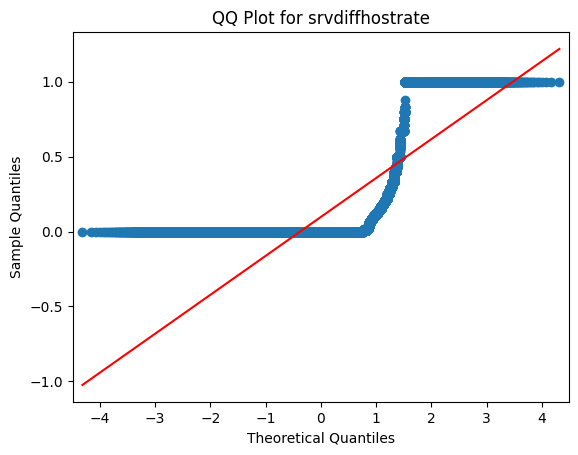

srvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvdiffhostrate across the groups in numfilecreations (Kruskal-Wallis).
=============== srvdiffhostrate-numfailedlogins ================
                     count      mean       std  min  25%  50%  75%  max
numfailedlogins                                                       
0                125851.0  0.097416  0.259939  0.0  0.0  0.0  0.0  1.0
1                   122.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0




<Figure size 800x600 with 0 Axes>

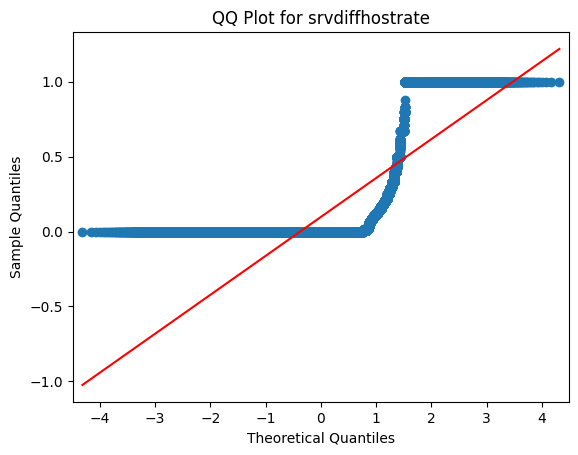

srvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvdiffhostrate across the groups in numfailedlogins (Kruskal-Wallis).
=============== srvdiffhostrate-numroot ================
             count      mean       std  min  25%  50%  75%  max
numroot                                                       
0        125324.0  0.097578  0.260093  0.0  0.0  0.0  0.0  1.0
1           649.0  0.047766  0.196722  0.0  0.0  0.0  0.0  1.0




<Figure size 800x600 with 0 Axes>

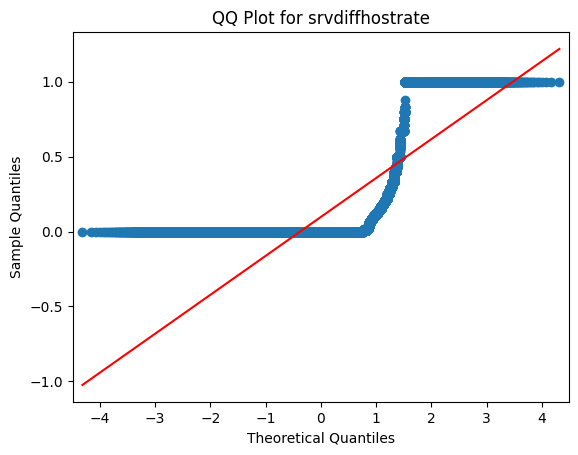

srvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvdiffhostrate across the groups in numroot (Kruskal-Wallis).
=============== srvdiffhostrate-numshells ================
               count      mean       std  min  25%  50%  75%  max
numshells                                                       
0          125926.0  0.097354  0.259872  0.0  0.0  0.0  0.0  1.0
1              47.0  0.010213  0.040189  0.0  0.0  0.0  0.0  0.2




<Figure size 800x600 with 0 Axes>

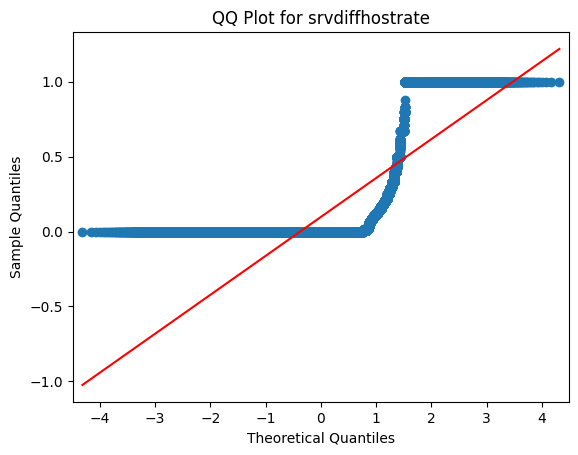

srvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvdiffhostrate across the groups in numshells (Kruskal-Wallis).
=============== srvdiffhostrate-loggedin ================
             count      mean       std  min  25%  50%   75%  max
loggedin                                                       
0         76121.0  0.069761  0.244612  0.0  0.0  0.0  0.00  1.0
1         49852.0  0.139406  0.276232  0.0  0.0  0.0  0.14  1.0




<Figure size 800x600 with 0 Axes>

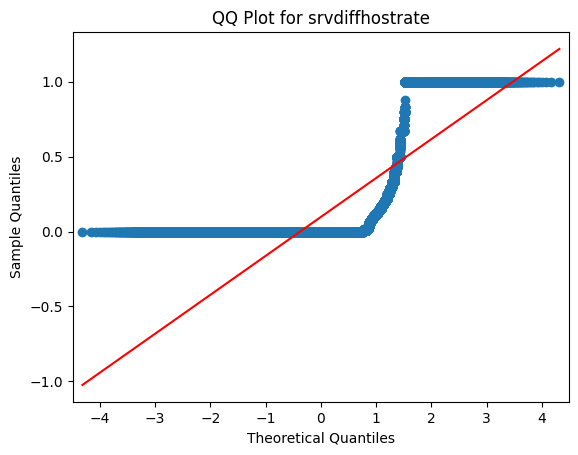

srvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvdiffhostrate across the groups in loggedin (Kruskal-Wallis).
=============== srvdiffhostrate-urgent ================
            count      mean       std  min  25%  50%  75%  max
urgent                                                       
0       125964.0  0.097329  0.259838  0.0  0.0  0.0  0.0  1.0
1            9.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0




<Figure size 800x600 with 0 Axes>

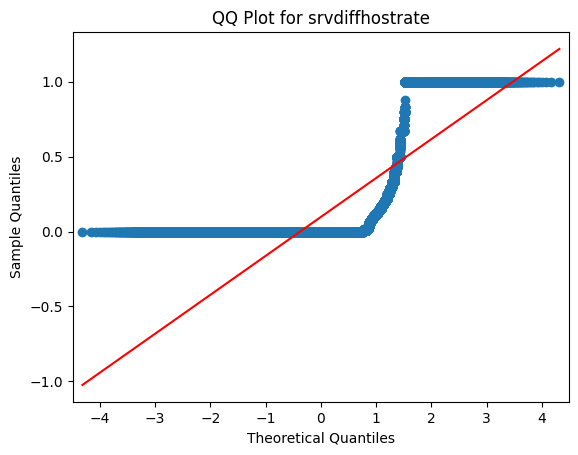

srvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== srvdiffhostrate-land ================
          count      mean       std  min  25%  50%  75%  max
land                                                       
0     125948.0  0.097182  0.259606  0.0  0.0  0.0  0.0  1.0
1         25.0  0.800000  0.408248  0.0  1.0  1.0  1.0  1.0




<Figure size 800x600 with 0 Axes>

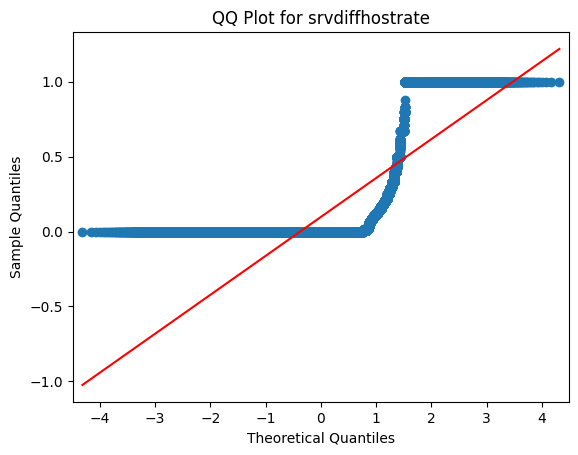

srvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvdiffhostrate across the groups in land (Kruskal-Wallis).
=============== srvdiffhostrate-lastflag ================
             count      mean       std  min  25%   50%     75%  max
lastflag                                                          
0            66.0  0.015152  0.123091  0.0  0.0  0.00  0.0000  1.0
1            62.0  0.064516  0.247676  0.0  0.0  0.00  0.0000  1.0
2            54.0  0.055556  0.231212  0.0  0.0  0.00  0.0000  1.0
3            65.0  0.048769  0.181233  0.0  0.0  0.00  0.0000  1.0
4            79.0  0.012658  0.112509  0.0  0.0  0.00  0.0000  1.0
5            81.0  0.018519  0.123603  0.0  0.0  0.00  0.0000  1.0
6            96.0  0.045833  0.192385  0.0  0.0  0.00  0.0000  1.0
7           118.0  0.028814  0.149639  0.0  0.0  0.00  0.0000  1.0
8           106.0  0.028113  0.146990  0.0  0.0  0.0

<Figure size 800x600 with 0 Axes>

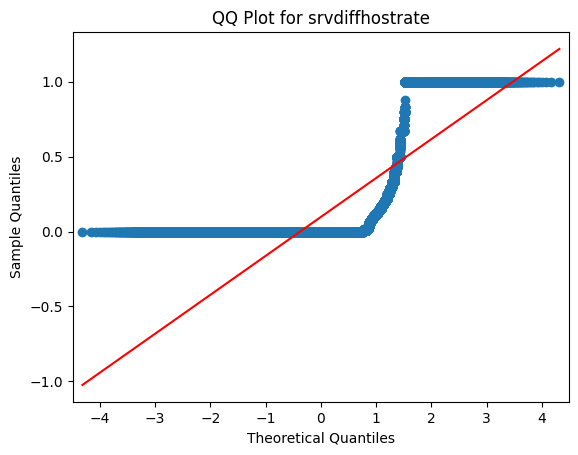

srvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvdiffhostrate across the groups in lastflag (Kruskal-Wallis).
=============== srvdiffhostrate-hot ================
         count      mean       std  min  25%  50%  75%  max
hot                                                       
0    123302.0  0.097703  0.260510  0.0  0.0  0.0  0.0  1.0
1      2671.0  0.079708  0.225612  0.0  0.0  0.0  0.0  1.0




<Figure size 800x600 with 0 Axes>

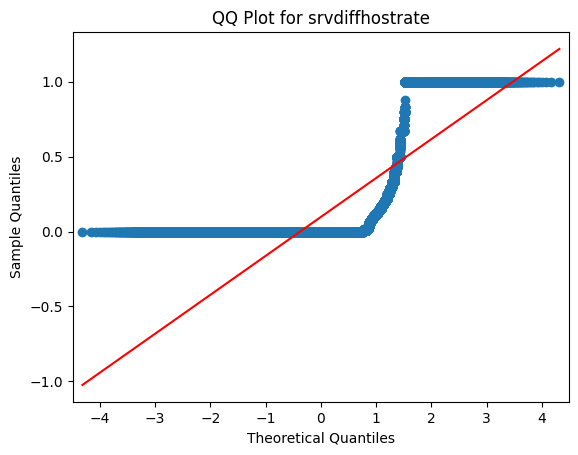

srvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvdiffhostrate across the groups in hot (Kruskal-Wallis).
=============== srvdiffhostrate-rootshell ================
               count      mean       std  min  25%  50%  75%  max
rootshell                                                       
0          125804.0  0.097437  0.259968  0.0  0.0  0.0  0.0  1.0
1             169.0  0.011361  0.083288  0.0  0.0  0.0  0.0  1.0




<Figure size 800x600 with 0 Axes>

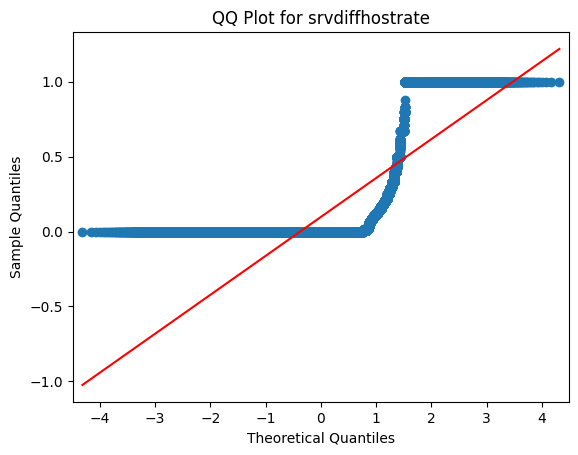

srvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvdiffhostrate across the groups in rootshell (Kruskal-Wallis).
=============== srvdiffhostrate-isguestlogin ================
                  count      mean       std  min  25%  50%  75%  max
isguestlogin                                                       
0             124786.0  0.098127  0.260704  0.0  0.0  0.0  0.0  1.0
1               1187.0  0.012637  0.111749  0.0  0.0  0.0  0.0  1.0




<Figure size 800x600 with 0 Axes>

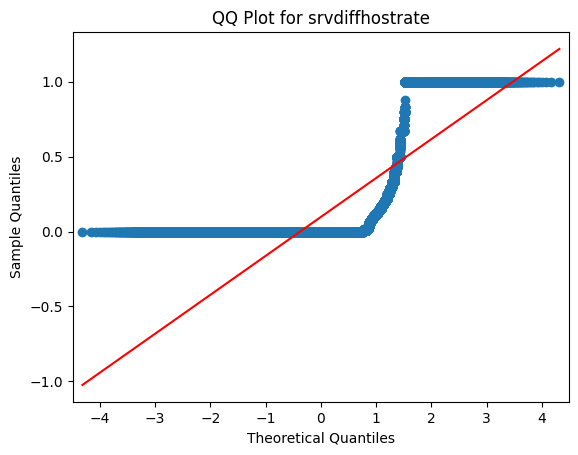

srvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvdiffhostrate across the groups in isguestlogin (Kruskal-Wallis).
=============== srvdiffhostrate-wrongfragment ================
                   count      mean       std  min  25%  50%  75%  max
wrongfragment                                                       
0              124883.0  0.097688  0.260422  0.0  0.0  0.0  0.0  1.0
1                1090.0  0.055358  0.174742  0.0  0.0  0.0  0.0  1.0




<Figure size 800x600 with 0 Axes>

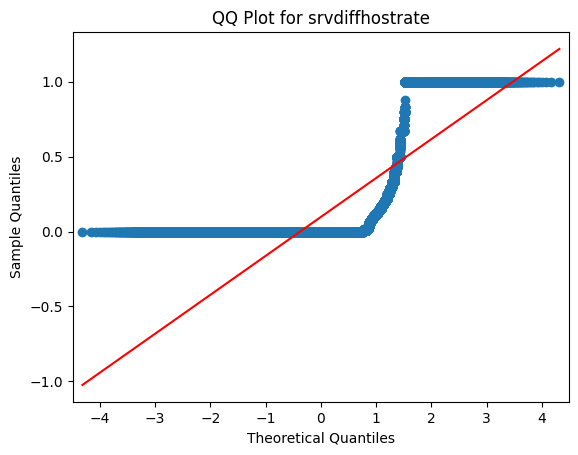

srvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvdiffhostrate across the groups in wrongfragment (Kruskal-Wallis).
=============== srvdiffhostrate-flag ================
           count      mean       std  min  25%  50%    75%   max
flag                                                           
OTH        46.0  0.026522  0.150262  0.0  0.0  0.0  0.000  1.00
REJ     11233.0  0.056044  0.227165  0.0  0.0  0.0  0.000  1.00
RSTO     1562.0  0.011818  0.100582  0.0  0.0  0.0  0.000  1.00
RSTOS0    103.0  0.000000  0.000000  0.0  0.0  0.0  0.000  0.00
RSTR     2421.0  0.006902  0.066200  0.0  0.0  0.0  0.000  1.00
S0      34851.0  0.004102  0.049311  0.0  0.0  0.0  0.000  1.00
S1        365.0  0.096493  0.258034  0.0  0.0  0.0  0.000  1.00
S2        127.0  0.252992  0.394551  0.0  0.0  0.0  0.415  1.00
S3         49.0  0.100000  0.230778  0.0  0.0  0.0  0.000  1.00
SF      74945

<Figure size 800x600 with 0 Axes>

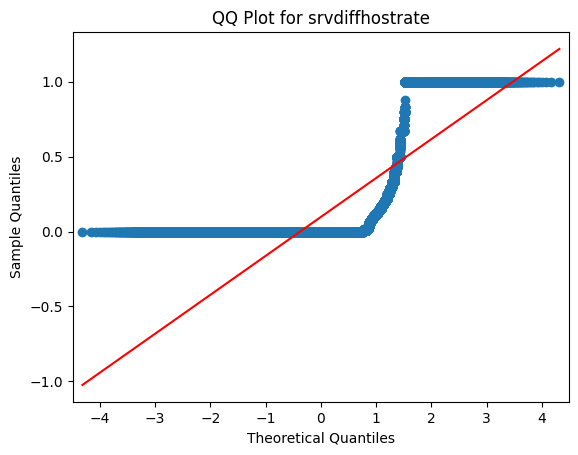

srvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvdiffhostrate across the groups in flag (Kruskal-Wallis).
=============== srvdiffhostrate-protocoltype ================
                  count      mean       std  min  25%  50%   75%  max
protocoltype                                                        
icmp            8291.0  0.429356  0.491315  0.0  0.0  0.0  1.00  1.0
tcp           102689.0  0.075875  0.219206  0.0  0.0  0.0  0.00  1.0
udp            14993.0  0.060603  0.197992  0.0  0.0  0.0  0.01  1.0




<Figure size 800x600 with 0 Axes>

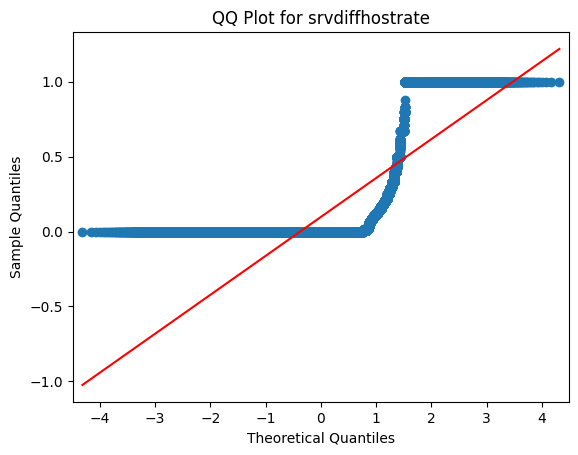

srvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvdiffhostrate across the groups in protocoltype (Kruskal-Wallis).
=============== srvdiffhostrate-numaccessfiles ================
                    count      mean       std  min  25%  50%    75%  max
numaccessfiles                                                         
0               125602.0  0.097094  0.259545  0.0  0.0  0.0  0.000  1.0
1                  371.0  0.174474  0.334786  0.0  0.0  0.0  0.175  1.0




<Figure size 800x600 with 0 Axes>

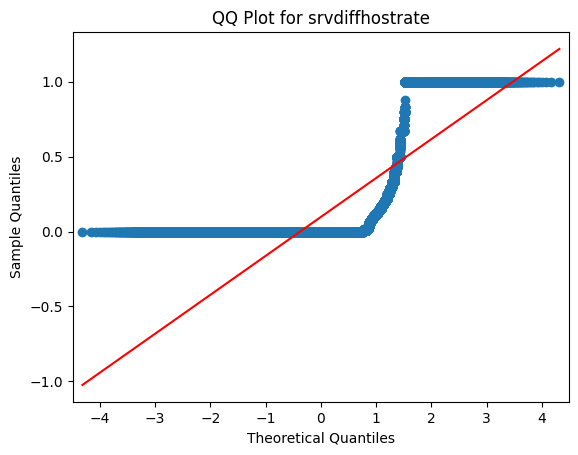

srvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvdiffhostrate across the groups in numaccessfiles (Kruskal-Wallis).
=============== srvdiffhostrate-numcompromised ================
                    count      mean       std  min  25%  50%  75%  max
numcompromised                                                       
0               124687.0  0.097446  0.260234  0.0  0.0  0.0  0.0  1.0
1                 1286.0  0.085218  0.216898  0.0  0.0  0.0  0.0  1.0




<Figure size 800x600 with 0 Axes>

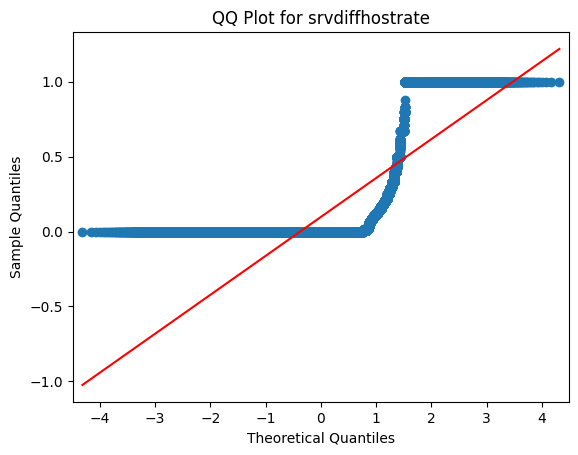

srvdiffhostrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the srvdiffhostrate across the groups in numcompromised (Kruskal-Wallis).
=============== diffsrvrate-suattempted ================
                 count      mean       std  min  25%  50%   75%  max
suattempted                                                        
0            125893.0  0.063085  0.180345  0.0  0.0  0.0  0.06  1.0
1                80.0  0.012500  0.111803  0.0  0.0  0.0  0.00  1.0




<Figure size 800x600 with 0 Axes>

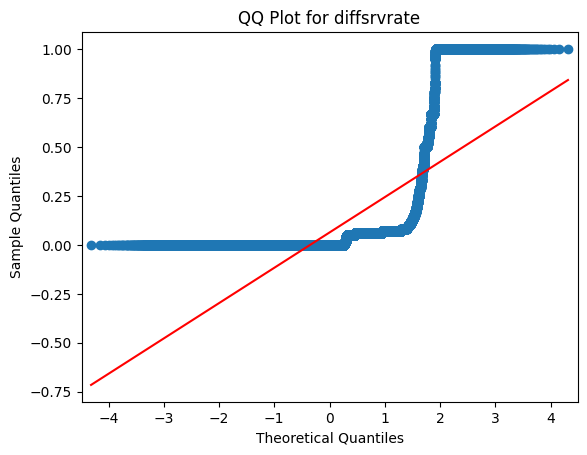

diffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the diffsrvrate across the groups in suattempted (Kruskal-Wallis).
=============== diffsrvrate-numfilecreations ================
                      count      mean       std  min  25%  50%   75%  max
numfilecreations                                                        
0                 125686.0  0.063121  0.180369  0.0  0.0  0.0  0.06  1.0
1                    287.0  0.033310  0.151793  0.0  0.0  0.0  0.00  1.0




<Figure size 800x600 with 0 Axes>

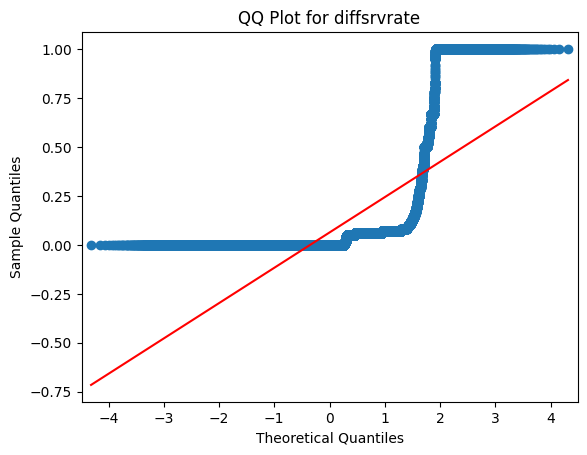

diffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the diffsrvrate across the groups in numfilecreations (Kruskal-Wallis).
=============== diffsrvrate-numfailedlogins ================
                     count      mean       std  min  25%  50%   75%  max
numfailedlogins                                                        
0                125851.0  0.063097  0.180353  0.0  0.0  0.0  0.06  1.0
1                   122.0  0.017623  0.128069  0.0  0.0  0.0  0.00  1.0




<Figure size 800x600 with 0 Axes>

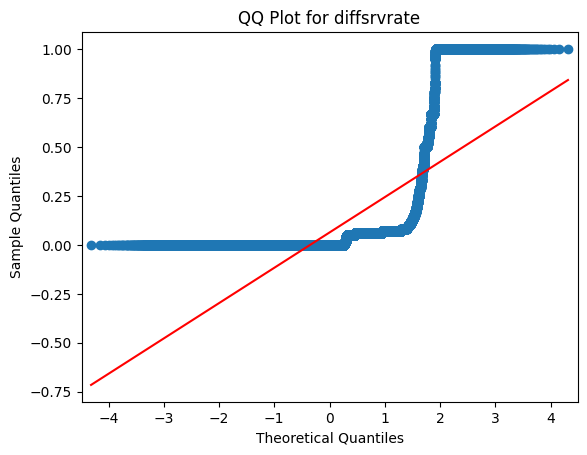

diffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the diffsrvrate across the groups in numfailedlogins (Kruskal-Wallis).
=============== diffsrvrate-numroot ================
             count      mean       std  min  25%  50%   75%  max
numroot                                                        
0        125324.0  0.063109  0.180132  0.0  0.0  0.0  0.06  1.0
1           649.0  0.052080  0.212512  0.0  0.0  0.0  0.00  1.0




<Figure size 800x600 with 0 Axes>

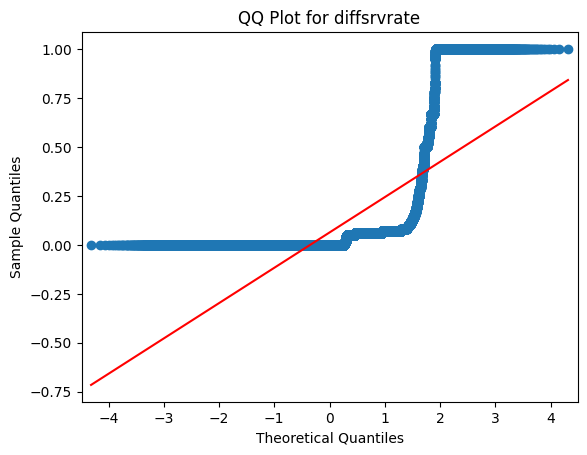

diffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the diffsrvrate across the groups in numroot (Kruskal-Wallis).
=============== diffsrvrate-numshells ================
               count      mean       std  min  25%  50%   75%   max
numshells                                                         
0          125926.0  0.063058  0.180319  0.0  0.0  0.0  0.06  1.00
1              47.0  0.049362  0.169877  0.0  0.0  0.0  0.00  0.92




<Figure size 800x600 with 0 Axes>

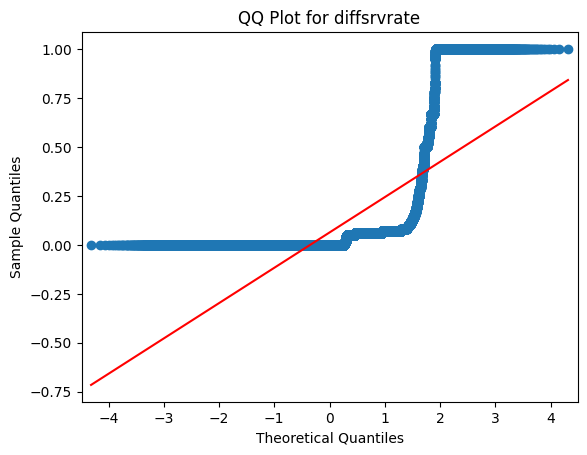

diffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the diffsrvrate across the groups in numshells (Kruskal-Wallis).
=============== diffsrvrate-loggedin ================
             count      mean       std  min  25%   50%   75%  max
loggedin                                                        
0         76121.0  0.095348  0.208501  0.0  0.0  0.06  0.07  1.0
1         49852.0  0.013739  0.108421  0.0  0.0  0.00  0.00  1.0




<Figure size 800x600 with 0 Axes>

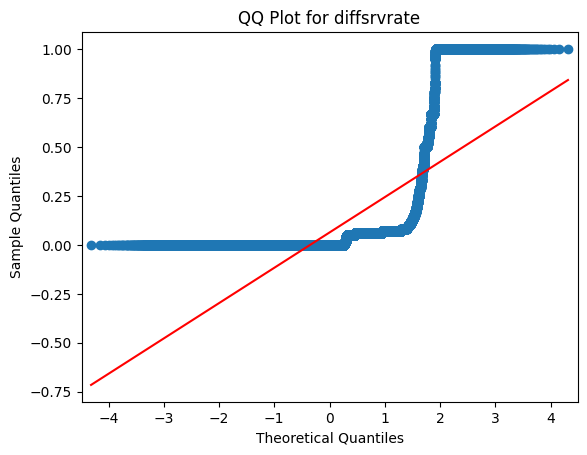

diffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the diffsrvrate across the groups in loggedin (Kruskal-Wallis).
=============== diffsrvrate-urgent ================
            count      mean      std  min  25%  50%   75%  max
urgent                                                       
0       125964.0  0.063057  0.18032  0.0  0.0  0.0  0.06  1.0
1            9.0  0.000000  0.00000  0.0  0.0  0.0  0.00  0.0




<Figure size 800x600 with 0 Axes>

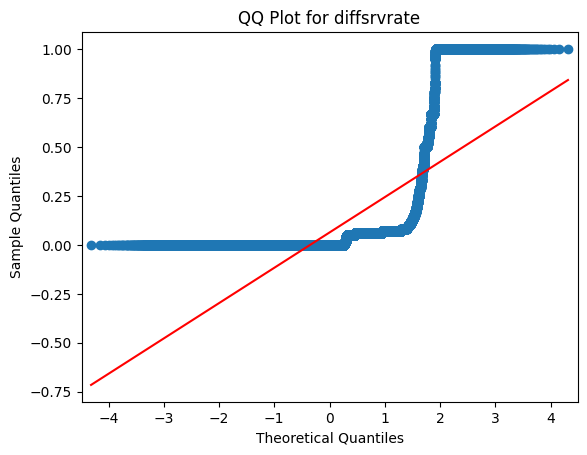

diffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the diffsrvrate across the groups in urgent (Kruskal-Wallis).
=============== diffsrvrate-land ================
          count      mean       std  min  25%  50%   75%  max
land                                                        
0     125948.0  0.063057  0.180311  0.0  0.0  0.0  0.06  1.0
1         25.0  0.043200  0.199973  0.0  0.0  0.0  0.00  1.0




<Figure size 800x600 with 0 Axes>

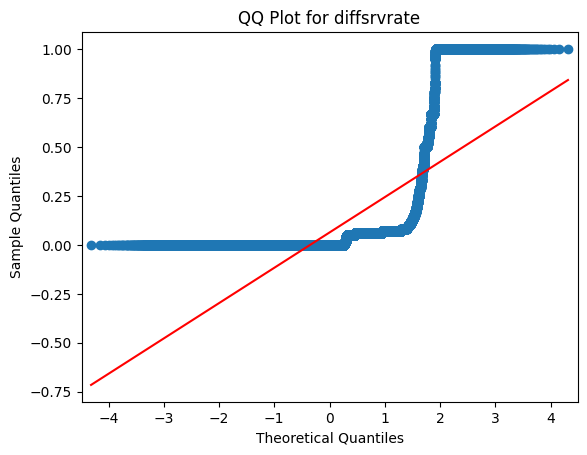

diffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the diffsrvrate across the groups in land (Kruskal-Wallis).
=============== diffsrvrate-lastflag ================
             count      mean       std  min   25%   50%   75%  max
lastflag                                                         
0            66.0  0.104242  0.290512  0.0  0.00  0.00  0.00  1.0
1            62.0  0.071935  0.229446  0.0  0.00  0.00  0.00  1.0
2            54.0  0.075556  0.264152  0.0  0.00  0.00  0.00  1.0
3            65.0  0.069231  0.248069  0.0  0.00  0.00  0.00  1.0
4            79.0  0.073291  0.241229  0.0  0.00  0.00  0.00  1.0
5            81.0  0.090741  0.274835  0.0  0.00  0.00  0.00  1.0
6            96.0  0.083542  0.269155  0.0  0.00  0.00  0.00  1.0
7           118.0  0.061949  0.221777  0.0  0.00  0.00  0.00  1.0
8           106.0  0.046509  0.196852  0.0  0.00  0.00  0.00  1.0
9       

<Figure size 800x600 with 0 Axes>

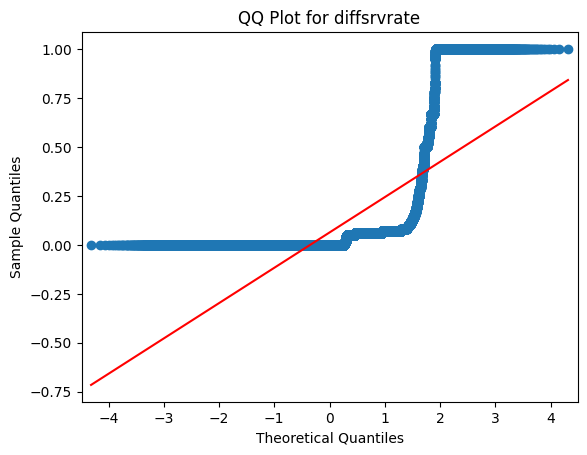

diffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the diffsrvrate across the groups in lastflag (Kruskal-Wallis).
=============== diffsrvrate-hot ================
         count      mean       std  min  25%  50%   75%  max
hot                                                        
0    123302.0  0.063941  0.181013  0.0  0.0  0.0  0.06  1.0
1      2671.0  0.022052  0.138386  0.0  0.0  0.0  0.00  1.0




<Figure size 800x600 with 0 Axes>

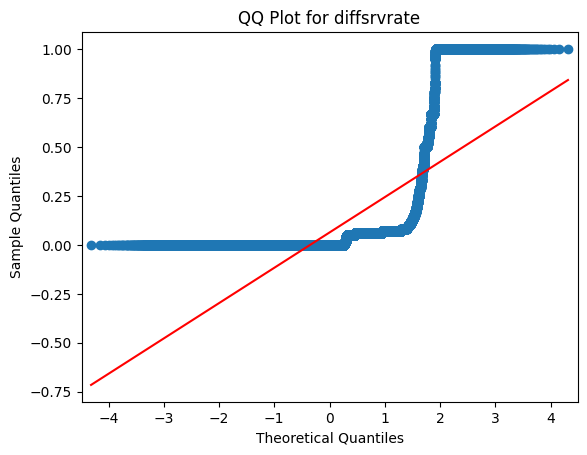

diffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the diffsrvrate across the groups in hot (Kruskal-Wallis).
=============== diffsrvrate-rootshell ================
               count      mean       std  min  25%  50%   75%  max
rootshell                                                        
0          125804.0  0.063117  0.180378  0.0  0.0  0.0  0.06  1.0
1             169.0  0.014793  0.114772  0.0  0.0  0.0  0.00  1.0




<Figure size 800x600 with 0 Axes>

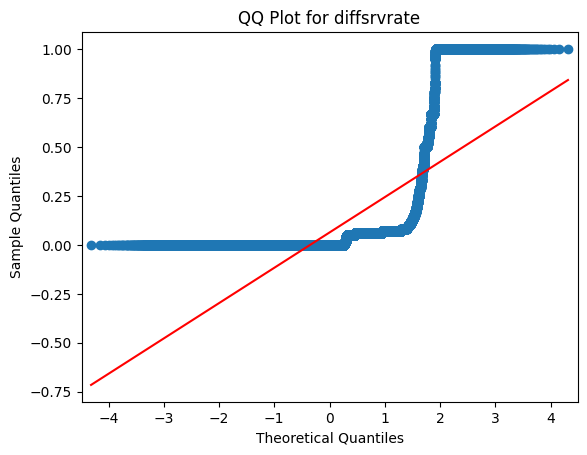

diffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the diffsrvrate across the groups in rootshell (Kruskal-Wallis).
=============== diffsrvrate-isguestlogin ================
                  count      mean       std  min  25%  50%   75%  max
isguestlogin                                                        
0             124786.0  0.063307  0.180263  0.0  0.0  0.0  0.06  1.0
1               1187.0  0.036293  0.183803  0.0  0.0  0.0  0.00  1.0




<Figure size 800x600 with 0 Axes>

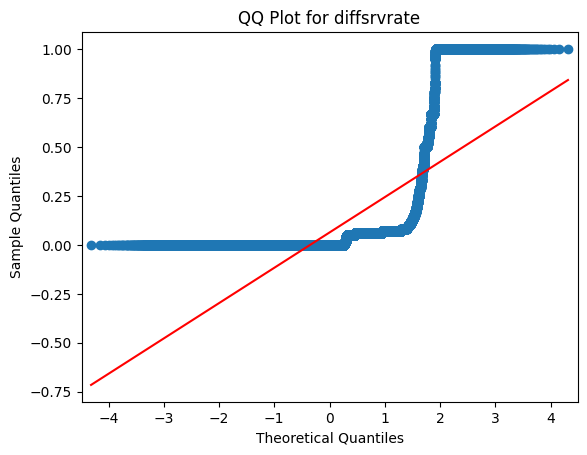

diffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the diffsrvrate across the groups in isguestlogin (Kruskal-Wallis).
=============== diffsrvrate-wrongfragment ================
                   count      mean       std  min  25%  50%   75%  max
wrongfragment                                                        
0              124883.0  0.063531  0.181019  0.0  0.0  0.0  0.06  1.0
1                1090.0  0.008239  0.018132  0.0  0.0  0.0  0.00  0.1




<Figure size 800x600 with 0 Axes>

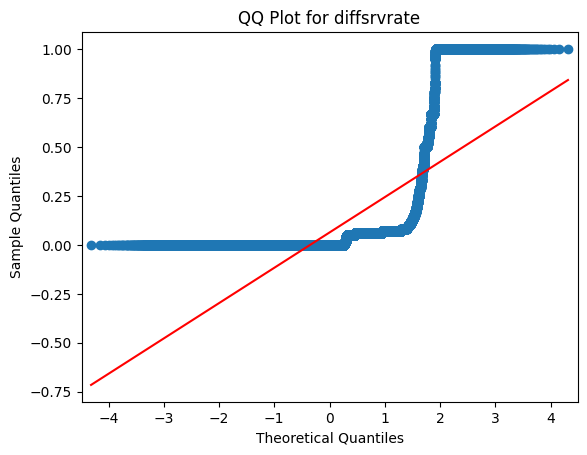

diffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the diffsrvrate across the groups in wrongfragment (Kruskal-Wallis).
=============== diffsrvrate-flag ================
           count      mean       std  min   25%   50%    75%   max
flag                                                             
OTH        46.0  0.000000  0.000000  0.0  0.00  0.00  0.000  0.00
REJ     11233.0  0.241643  0.384800  0.0  0.00  0.06  0.080  1.00
RSTO     1562.0  0.079770  0.147652  0.0  0.06  0.06  0.070  1.00
RSTOS0    103.0  0.368252  0.139919  0.0  0.37  0.39  0.415  0.58
RSTR     2421.0  0.050553  0.176633  0.0  0.00  0.00  0.000  1.00
S0      34851.0  0.076369  0.087129  0.0  0.06  0.06  0.070  1.00
S1        365.0  0.044630  0.183459  0.0  0.00  0.00  0.000  1.00
S2        127.0  0.028268  0.160520  0.0  0.00  0.00  0.000  1.00
S3         49.0  0.040816  0.199915  0.0  0.00  0.00  0.000  1.00
SF 

<Figure size 800x600 with 0 Axes>

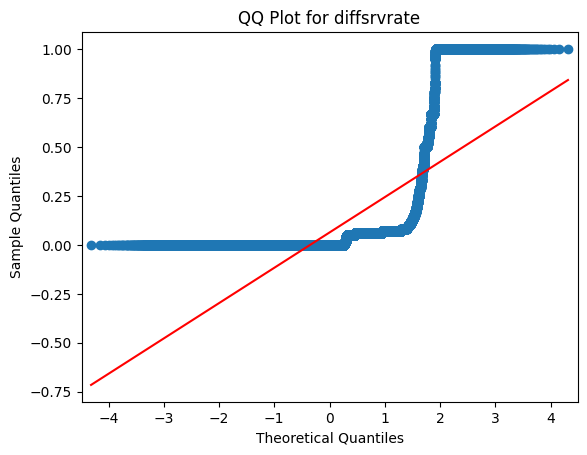

diffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the diffsrvrate across the groups in flag (Kruskal-Wallis).
=============== diffsrvrate-protocoltype ================
                  count      mean       std  min  25%  50%   75%  max
protocoltype                                                        
icmp            8291.0  0.050938  0.199041  0.0  0.0  0.0  0.00  1.0
tcp           102689.0  0.063619  0.178531  0.0  0.0  0.0  0.06  1.0
udp            14993.0  0.065874  0.181334  0.0  0.0  0.0  0.01  1.0




<Figure size 800x600 with 0 Axes>

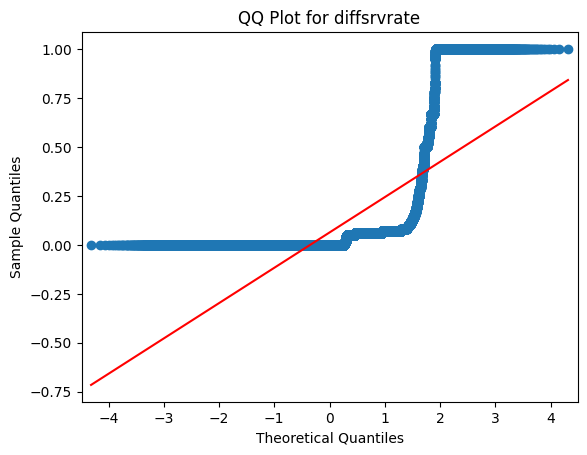

diffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the diffsrvrate across the groups in protocoltype (Kruskal-Wallis).
=============== diffsrvrate-numaccessfiles ================
                    count      mean       std  min  25%  50%   75%  max
numaccessfiles                                                        
0               125602.0  0.063205  0.180490  0.0  0.0  0.0  0.06  1.0
1                  371.0  0.011509  0.091719  0.0  0.0  0.0  0.00  1.0




<Figure size 800x600 with 0 Axes>

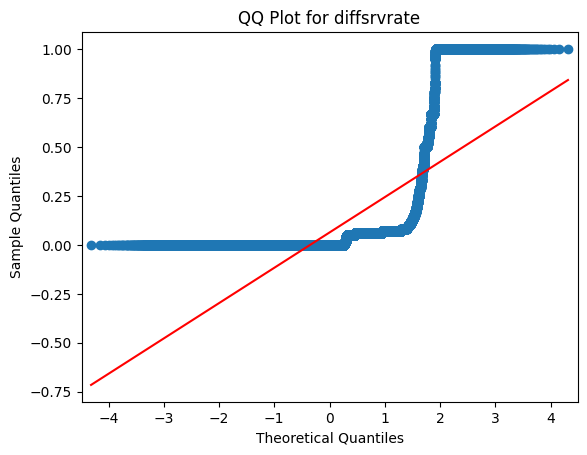

diffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the diffsrvrate across the groups in numaccessfiles (Kruskal-Wallis).
=============== diffsrvrate-numcompromised ================
                    count      mean       std  min  25%  50%   75%  max
numcompromised                                                        
0               124687.0  0.063615  0.180970  0.0  0.0  0.0  0.06  1.0
1                 1286.0  0.008499  0.080961  0.0  0.0  0.0  0.00  1.0




<Figure size 800x600 with 0 Axes>

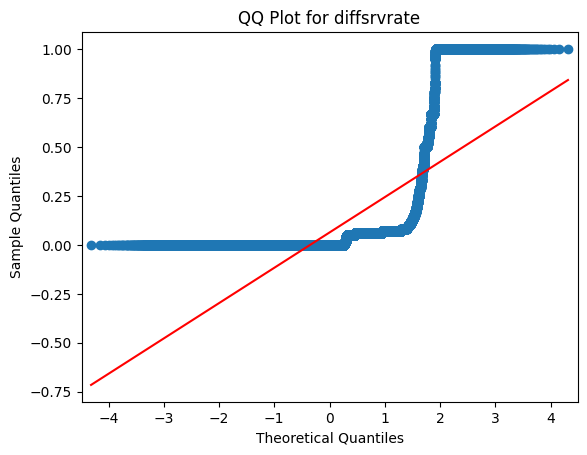

diffsrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the diffsrvrate across the groups in numcompromised (Kruskal-Wallis).
=============== samesrvrate-suattempted ================
                 count      mean       std  min   25%  50%  75%  max
suattempted                                                        
0            125893.0  0.660716  0.439680  0.0  0.09  1.0  1.0  1.0
1                80.0  0.993750  0.055902  0.5  1.00  1.0  1.0  1.0




<Figure size 800x600 with 0 Axes>

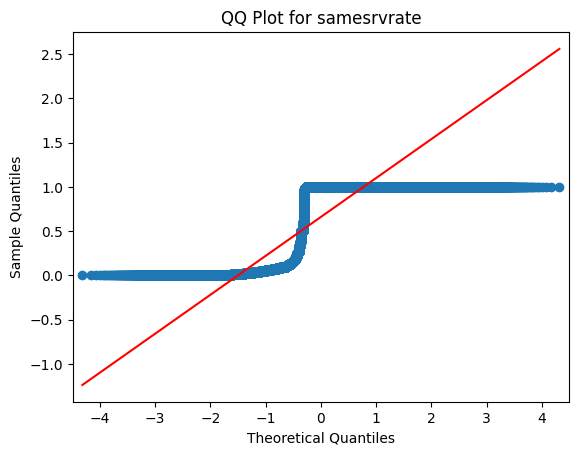

samesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the samesrvrate across the groups in suattempted (Kruskal-Wallis).
=============== samesrvrate-numfilecreations ================
                      count      mean       std   min   25%  50%  75%  max
numfilecreations                                                         
0                 125686.0  0.660277  0.439801  0.00  0.09  1.0  1.0  1.0
1                    287.0  0.945854  0.208138  0.01  1.00  1.0  1.0  1.0




<Figure size 800x600 with 0 Axes>

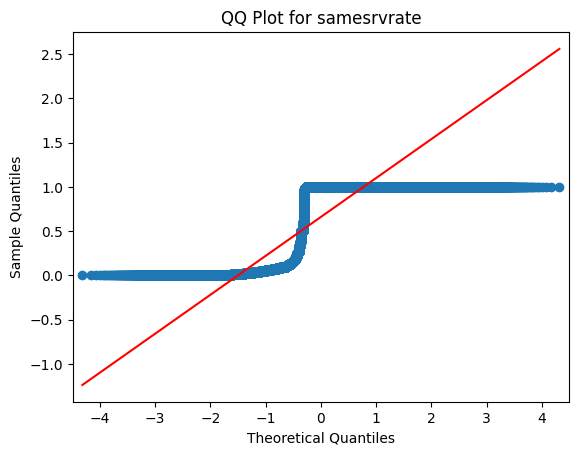

samesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the samesrvrate across the groups in numfilecreations (Kruskal-Wallis).
=============== samesrvrate-numfailedlogins ================
                     count      mean       std   min   25%  50%  75%  max
numfailedlogins                                                         
0                125851.0  0.660614  0.439709  0.00  0.09  1.0  1.0  1.0
1                   122.0  0.984262  0.104295  0.08  1.00  1.0  1.0  1.0




<Figure size 800x600 with 0 Axes>

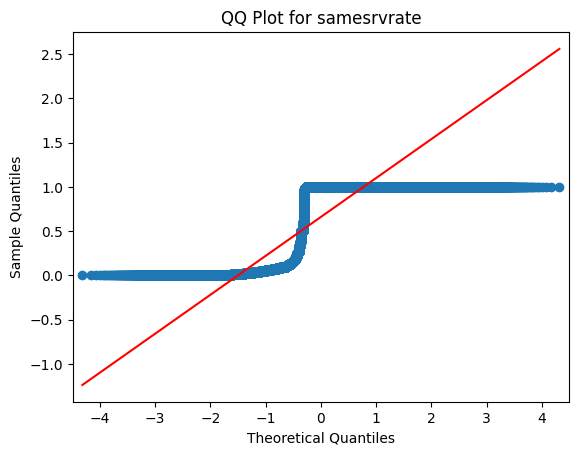

samesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the samesrvrate across the groups in numfailedlogins (Kruskal-Wallis).
=============== samesrvrate-numroot ================
             count      mean       std   min   25%  50%  75%  max
numroot                                                         
0        125324.0  0.659325  0.440106  0.00  0.09  1.0  1.0  1.0
1           649.0  0.970370  0.122052  0.01  1.00  1.0  1.0  1.0




<Figure size 800x600 with 0 Axes>

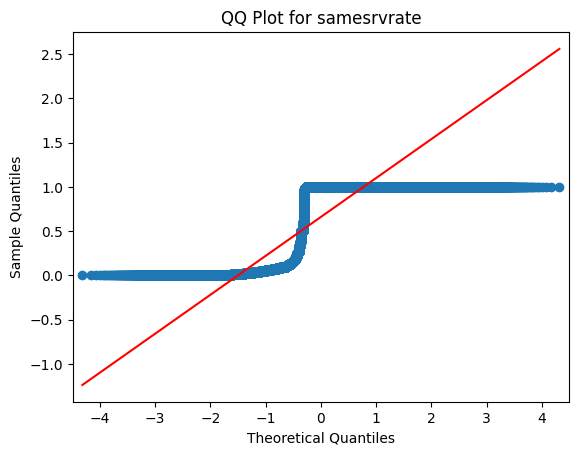

samesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the samesrvrate across the groups in numroot (Kruskal-Wallis).
=============== samesrvrate-numshells ================
               count      mean       std   min   25%  50%  75%  max
numshells                                                         
0          125926.0  0.660831  0.439650  0.00  0.09  1.0  1.0  1.0
1              47.0  0.919574  0.253694  0.07  1.00  1.0  1.0  1.0




<Figure size 800x600 with 0 Axes>

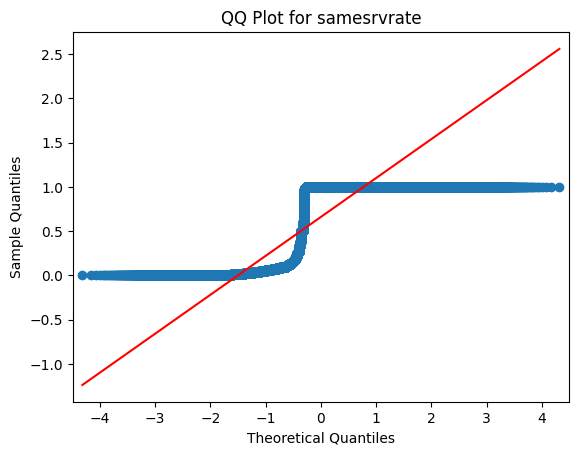

samesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the samesrvrate across the groups in numshells (Kruskal-Wallis).
=============== samesrvrate-loggedin ================
             count      mean       std  min   25%   50%  75%  max
loggedin                                                        
0         76121.0  0.447276  0.445412  0.0  0.05  0.15  1.0  1.0
1         49852.0  0.987161  0.096521  0.0  1.00  1.00  1.0  1.0




<Figure size 800x600 with 0 Axes>

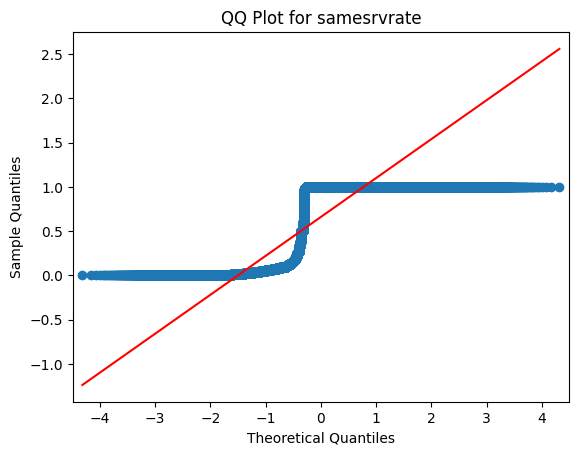

samesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the samesrvrate across the groups in loggedin (Kruskal-Wallis).
=============== samesrvrate-urgent ================
            count      mean       std  min   25%  50%  75%  max
urgent                                                        
0       125964.0  0.660903  0.439629  0.0  0.09  1.0  1.0  1.0
1            9.0  1.000000  0.000000  1.0  1.00  1.0  1.0  1.0




<Figure size 800x600 with 0 Axes>

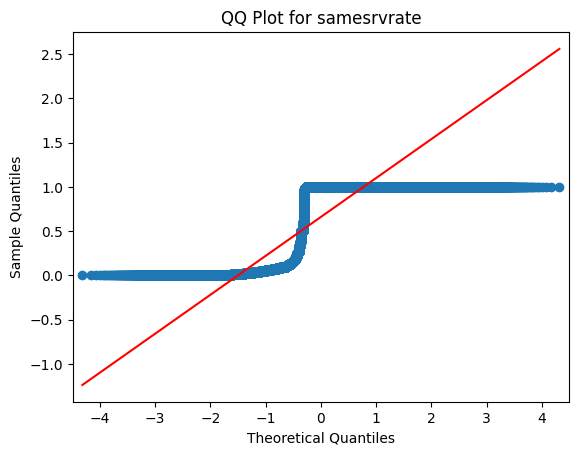

samesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the samesrvrate across the groups in urgent (Kruskal-Wallis).
=============== samesrvrate-land ================
          count      mean       std   min   25%  50%  75%  max
land                                                         
0     125948.0  0.660874  0.439638  0.00  0.09  1.0  1.0  1.0
1         25.0  0.933600  0.234412  0.01  1.00  1.0  1.0  1.0




<Figure size 800x600 with 0 Axes>

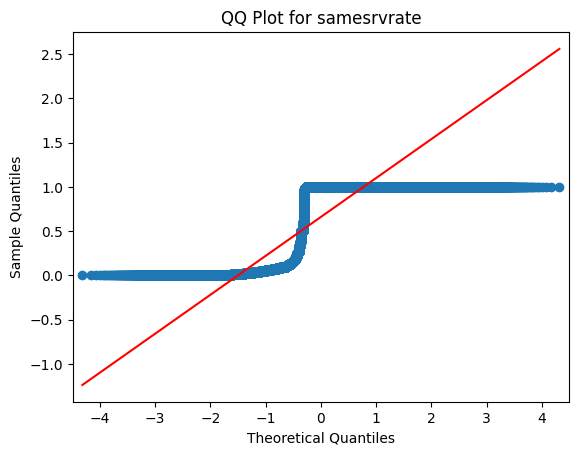

samesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the samesrvrate across the groups in land (Kruskal-Wallis).
=============== samesrvrate-lastflag ================
             count      mean       std   min   25%   50%  75%  max
lastflag                                                         
0            66.0  0.926364  0.206417  0.14  1.00  1.00  1.0  1.0
1            62.0  0.957097  0.141923  0.25  1.00  1.00  1.0  1.0
2            54.0  0.931481  0.225283  0.01  1.00  1.00  1.0  1.0
3            65.0  0.953077  0.168142  0.20  1.00  1.00  1.0  1.0
4            79.0  0.935063  0.207660  0.02  1.00  1.00  1.0  1.0
5            81.0  0.902222  0.270023  0.01  1.00  1.00  1.0  1.0
6            96.0  0.917500  0.248765  0.00  1.00  1.00  1.0  1.0
7           118.0  0.929915  0.222125  0.01  1.00  1.00  1.0  1.0
8           106.0  0.910000  0.264536  0.00  1.00  1.00  1.0  1.0
9       

<Figure size 800x600 with 0 Axes>

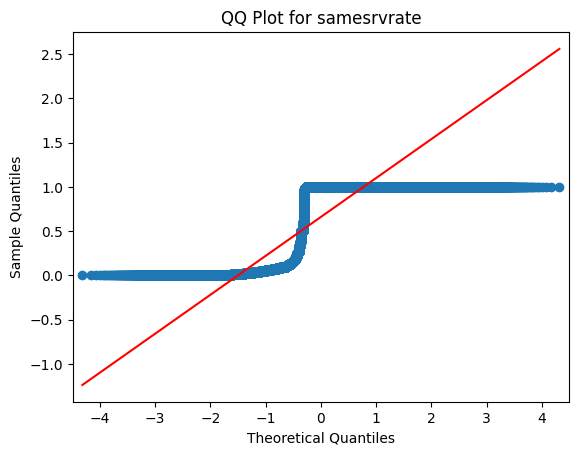

samesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the samesrvrate across the groups in lastflag (Kruskal-Wallis).
=============== samesrvrate-hot ================
         count      mean       std  min   25%  50%  75%  max
hot                                                        
0    123302.0  0.653932  0.441496  0.0  0.09  1.0  1.0  1.0
1      2671.0  0.983886  0.102636  0.0  1.00  1.0  1.0  1.0




<Figure size 800x600 with 0 Axes>

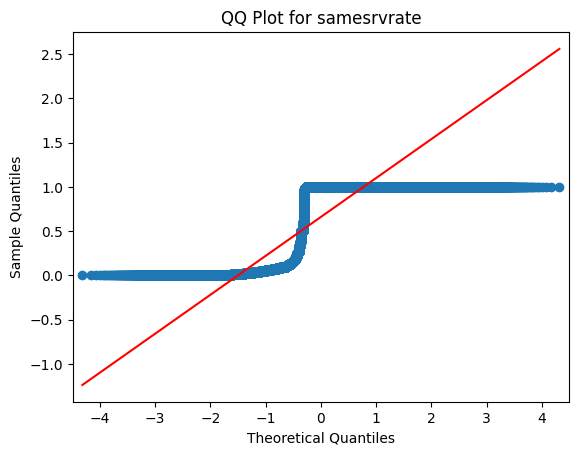

samesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the samesrvrate across the groups in hot (Kruskal-Wallis).
=============== samesrvrate-rootshell ================
               count      mean       std  min   25%  50%  75%  max
rootshell                                                        
0          125804.0  0.660482  0.439745  0.0  0.09  1.0  1.0  1.0
1             169.0  0.992604  0.057386  0.5  1.00  1.0  1.0  1.0




<Figure size 800x600 with 0 Axes>

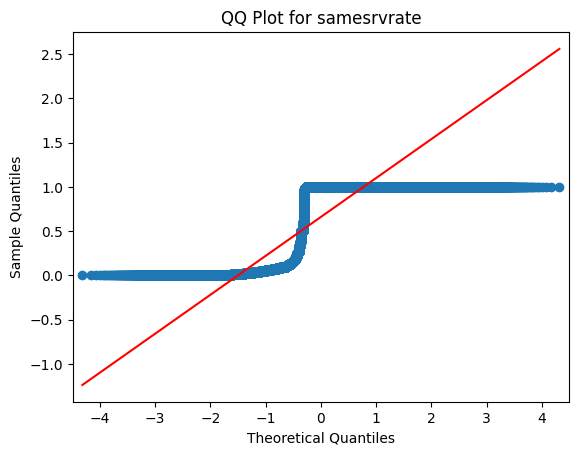

samesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the samesrvrate across the groups in rootshell (Kruskal-Wallis).
=============== samesrvrate-isguestlogin ================
                  count      mean       std   min   25%  50%  75%  max
isguestlogin                                                         
0             124786.0  0.657901  0.440487  0.00  0.09  1.0  1.0  1.0
1               1187.0  0.979132  0.105494  0.08  1.00  1.0  1.0  1.0




<Figure size 800x600 with 0 Axes>

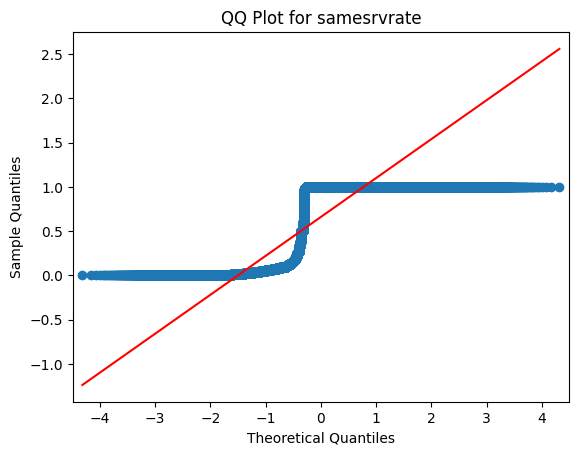

samesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the samesrvrate across the groups in isguestlogin (Kruskal-Wallis).
=============== samesrvrate-wrongfragment ================
                   count      mean       std   min   25%  50%  75%  max
wrongfragment                                                         
0              124883.0  0.658508  0.440382  0.00  0.09  1.0  1.0  1.0
1                1090.0  0.938165  0.198188  0.01  1.00  1.0  1.0  1.0




<Figure size 800x600 with 0 Axes>

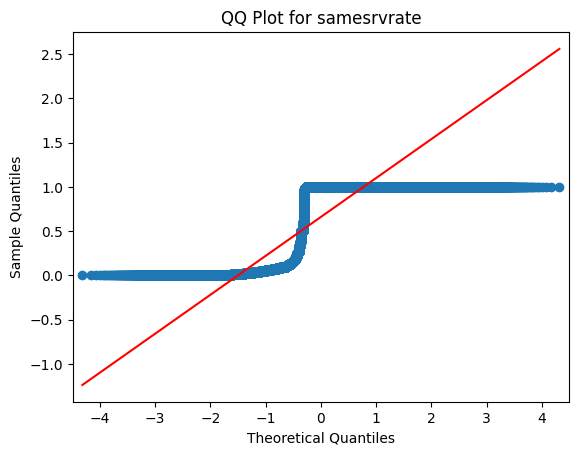

samesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the samesrvrate across the groups in wrongfragment (Kruskal-Wallis).
=============== samesrvrate-flag ================
           count      mean       std   min   25%   50%   75%  max
flag                                                            
OTH        46.0  1.000000  0.000000  1.00  1.00  1.00  1.00  1.0
REJ     11233.0  0.329784  0.426775  0.00  0.02  0.07  1.00  1.0
RSTO     1562.0  0.240250  0.367721  0.00  0.03  0.07  0.14  1.0
RSTOS0    103.0  0.132233  0.304599  0.01  0.01  0.01  0.04  1.0
RSTR     2421.0  0.927960  0.245491  0.00  1.00  1.00  1.00  1.0
S0      34851.0  0.116914  0.172536  0.00  0.03  0.07  0.12  1.0
S1        365.0  0.962438  0.158341  0.01  1.00  1.00  1.00  1.0
S2        127.0  0.976378  0.138040  0.00  1.00  1.00  1.00  1.0
S3         49.0  0.969592  0.157109  0.01  1.00  1.00  1.00  1.0
SF      74945.

<Figure size 800x600 with 0 Axes>

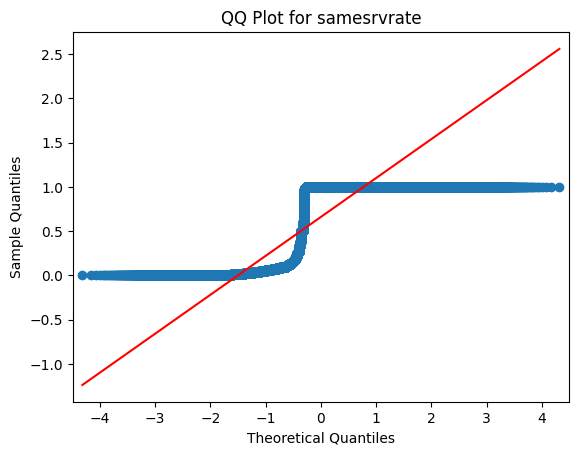

samesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the samesrvrate across the groups in flag (Kruskal-Wallis).
=============== samesrvrate-protocoltype ================
                  count      mean       std  min   25%  50%  75%  max
protocoltype                                                        
icmp            8291.0  0.940900  0.196218  0.0  1.00  1.0  1.0  1.0
tcp           102689.0  0.605146  0.454787  0.0  0.07  1.0  1.0  1.0
udp            14993.0  0.888160  0.263965  0.0  1.00  1.0  1.0  1.0




<Figure size 800x600 with 0 Axes>

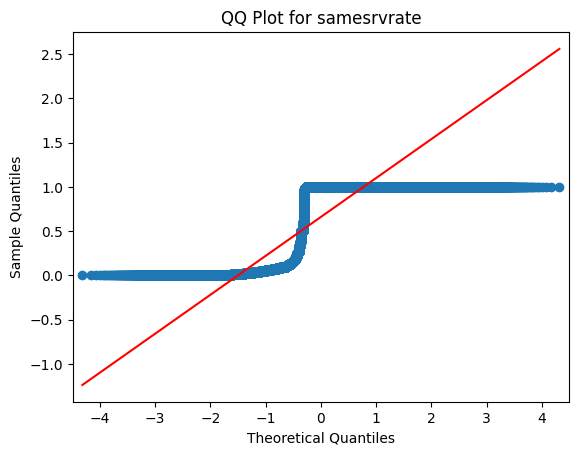

samesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the samesrvrate across the groups in protocoltype (Kruskal-Wallis).
=============== samesrvrate-numaccessfiles ================
                    count      mean       std   min   25%  50%  75%  max
numaccessfiles                                                         
0               125602.0  0.659965  0.439883  0.00  0.09  1.0  1.0  1.0
1                  371.0  0.986981  0.095784  0.01  1.00  1.0  1.0  1.0




<Figure size 800x600 with 0 Axes>

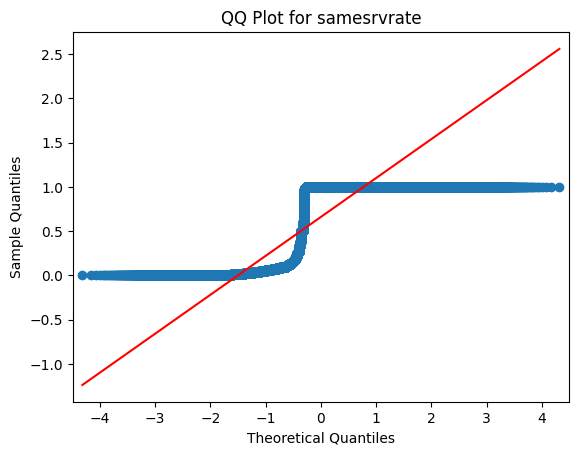

samesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the samesrvrate across the groups in numaccessfiles (Kruskal-Wallis).
=============== samesrvrate-numcompromised ================
                    count      mean      std   min   25%  50%  75%  max
numcompromised                                                        
0               124687.0  0.657504  0.44053  0.00  0.09  1.0  1.0  1.0
1                 1286.0  0.992854  0.06748  0.01  1.00  1.0  1.0  1.0




<Figure size 800x600 with 0 Axes>

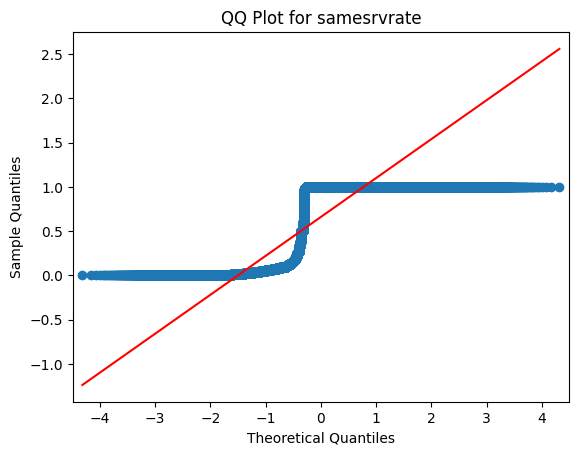

samesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the samesrvrate across the groups in numcompromised (Kruskal-Wallis).
=============== countt-suattempted ================
                 count       mean         std  min  25%   50%    75%    max
suattempted                                                               
0            125893.0  79.512546  100.995318  0.0  2.0  14.0  143.0  301.0
1                80.0   1.025000    0.157110  1.0  1.0   1.0    1.0    2.0




<Figure size 800x600 with 0 Axes>

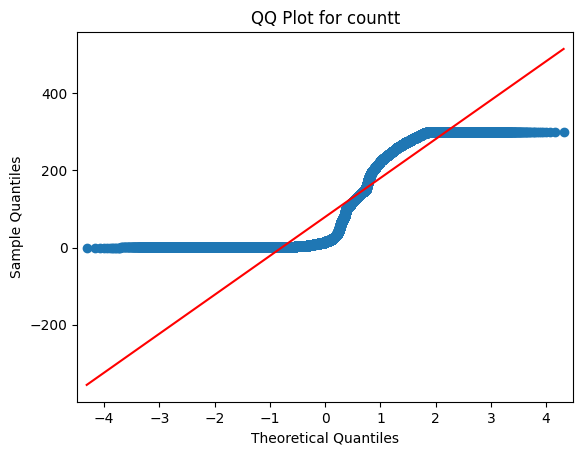

countt does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the countt across the groups in suattempted (Kruskal-Wallis).
=============== countt-numfilecreations ================
                      count       mean         std  min  25%   50%    75%  \
numfilecreations                                                           
0                 125686.0  79.634550  101.031360  0.0  2.0  15.0  143.0   
1                    287.0   4.205575   14.435154  1.0  1.0   1.0    1.5   

                    max  
numfilecreations         
0                 301.0  
1                 151.0  




<Figure size 800x600 with 0 Axes>

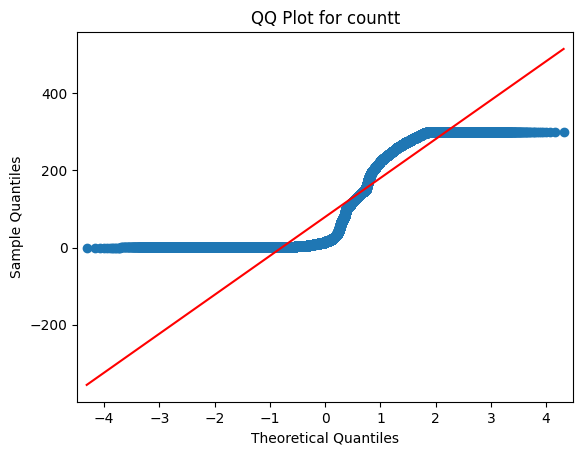

countt does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the countt across the groups in numfilecreations (Kruskal-Wallis).
=============== countt-numfailedlogins ================
                     count       mean         std  min  25%   50%    75%    max
numfailedlogins                                                               
0                125851.0  79.538430  101.002223  0.0  2.0  14.0  143.0  301.0
1                   122.0   1.344262    1.155443  1.0  1.0   1.0    1.0   13.0




<Figure size 800x600 with 0 Axes>

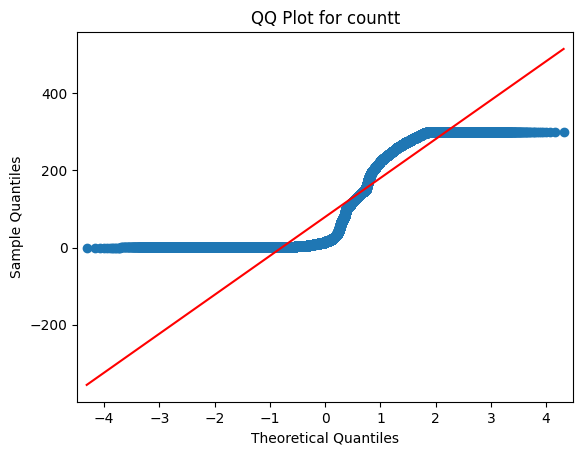

countt does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the countt across the groups in numfailedlogins (Kruskal-Wallis).
=============== countt-numroot ================
             count       mean         std  min  25%   50%    75%    max
numroot                                                               
0        125324.0  79.863554  101.088552  0.0  2.0  15.0  144.0  301.0
1           649.0   2.057011    6.385614  1.0  1.0   1.0    2.0  151.0




<Figure size 800x600 with 0 Axes>

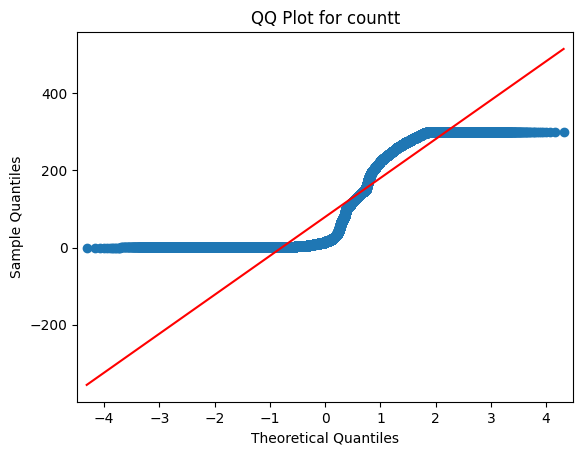

countt does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the countt across the groups in numroot (Kruskal-Wallis).
=============== countt-numshells ================
               count       mean         std  min  25%   50%    75%    max
numshells                                                               
0          125926.0  79.489526  100.991838  0.0  2.0  14.0  143.0  301.0
1              47.0   7.595745    5.874261  1.0  1.0   6.0   12.5   18.0




<Figure size 800x600 with 0 Axes>

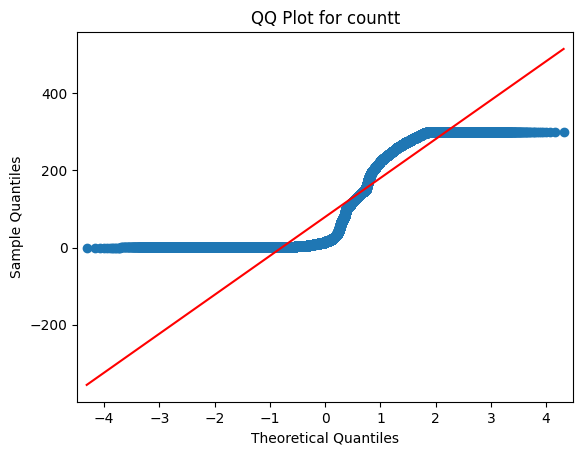

countt does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the countt across the groups in numshells (Kruskal-Wallis).
=============== countt-loggedin ================
             count        mean         std  min  25%    50%    75%    max
loggedin                                                                
0         76121.0  126.487343  105.835596  0.0  6.0  121.0  228.0  301.0
1         49852.0    7.658910   11.515531  0.0  1.0    4.0   11.0  301.0




<Figure size 800x600 with 0 Axes>

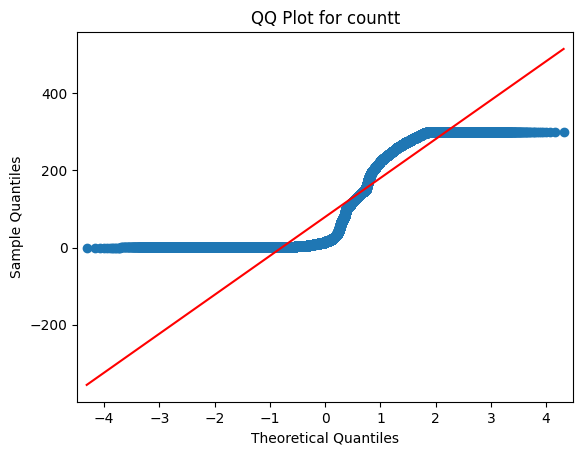

countt does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the countt across the groups in loggedin (Kruskal-Wallis).
=============== countt-urgent ================
            count       mean         std  min  25%   50%    75%    max
urgent                                                               
0       125964.0  79.468308  100.984033  0.0  2.0  14.0  143.0  301.0
1            9.0   1.000000    0.000000  1.0  1.0   1.0    1.0    1.0




<Figure size 800x600 with 0 Axes>

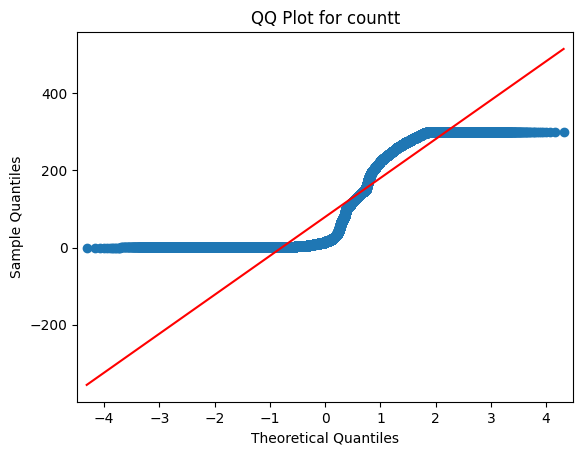

countt does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the countt across the groups in urgent (Kruskal-Wallis).
=============== countt-land ================
          count      mean         std  min  25%   50%    75%    max
land                                                              
0     125948.0  79.47765  100.986829  0.0  2.0  14.0  143.0  301.0
1         25.0   4.16000   15.388524  1.0  1.0   1.0    1.0   78.0




<Figure size 800x600 with 0 Axes>

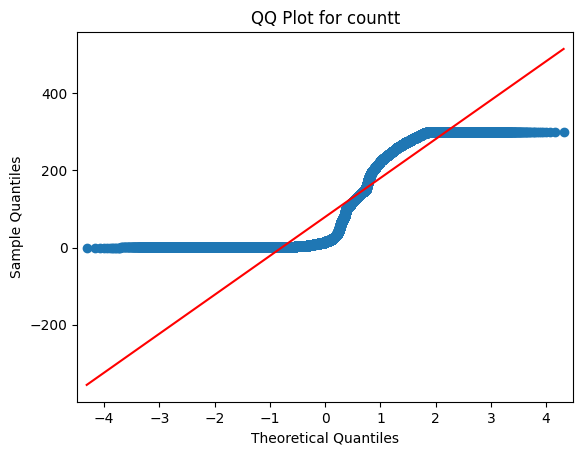

countt does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the countt across the groups in land (Kruskal-Wallis).
=============== countt-lastflag ================
             count        mean         std  min   25%    50%     75%    max
lastflag                                                                  
0            66.0    1.878788    1.306965  1.0   1.0    1.5    2.00    7.0
1            62.0    1.338710    1.039286  1.0   1.0    1.0    1.00    8.0
2            54.0    2.814815   11.179621  1.0   1.0    1.0    1.00   83.0
3            65.0    1.507692    0.953990  1.0   1.0    1.0    2.00    6.0
4            79.0    2.265823    5.183081  1.0   1.0    1.0    1.50   44.0
5            81.0    6.086420   20.453116  1.0   1.0    1.0    2.00  151.0
6            96.0    5.437500   30.617096  1.0   1.0    1.0    3.00  301.0
7           118.0    4.169492   17.156547  1.0   1.0    1.0    2.00  151.0

<Figure size 800x600 with 0 Axes>

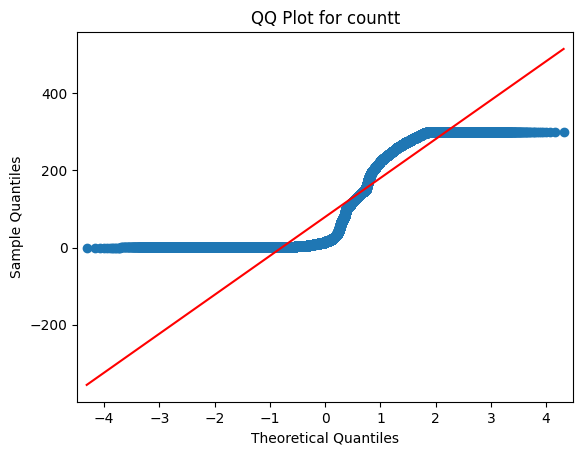

countt does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the countt across the groups in lastflag (Kruskal-Wallis).
=============== countt-hot ================
         count       mean         std  min  25%   50%    75%    max
hot                                                               
0    123302.0  81.119982  101.418859  0.0  2.0  16.0  145.0  301.0
1      2671.0   2.957319   11.897678  1.0  1.0   1.0    3.0  301.0




<Figure size 800x600 with 0 Axes>

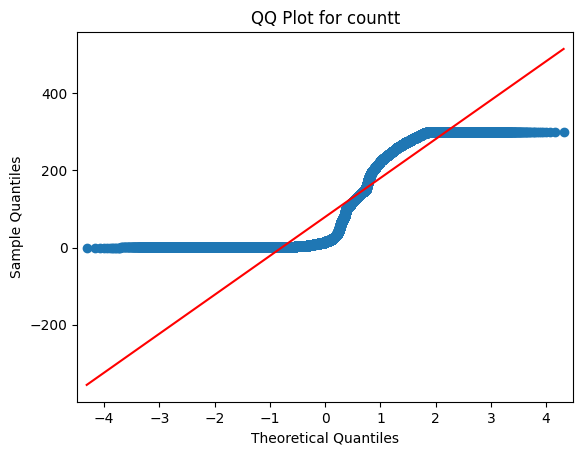

countt does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the countt across the groups in hot (Kruskal-Wallis).
=============== countt-rootshell ================
               count       mean         std  min  25%   50%    75%    max
rootshell                                                               
0          125804.0  79.564028  101.012153  0.0  2.0  14.0  143.0  301.0
1             169.0   4.035503    7.602391  1.0  1.0   1.0    2.0   51.0




<Figure size 800x600 with 0 Axes>

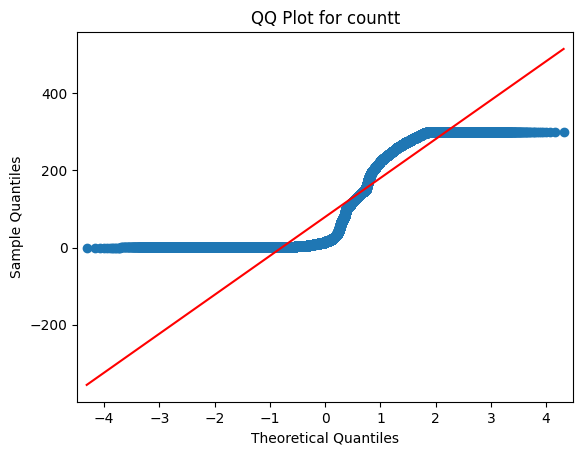

countt does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the countt across the groups in rootshell (Kruskal-Wallis).
=============== countt-isguestlogin ================
                  count       mean         std  min  25%   50%    75%    max
isguestlogin                                                               
0             124786.0  80.208429  101.170490  0.0  2.0  15.0  144.0  301.0
1               1187.0   1.066554    0.438207  1.0  1.0   1.0    1.0   13.0




<Figure size 800x600 with 0 Axes>

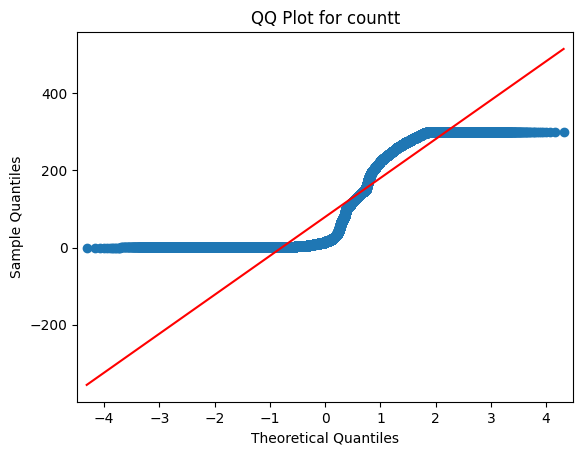

countt does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the countt across the groups in isguestlogin (Kruskal-Wallis).
=============== countt-wrongfragment ================
                   count       mean         std  min   25%   50%    75%    max
wrongfragment                                                                
0              124883.0  79.711986  101.305102  0.0   2.0  14.0  144.0  301.0
1                1090.0  50.901835   43.613046  1.0  14.0  44.5   77.0  200.0




<Figure size 800x600 with 0 Axes>

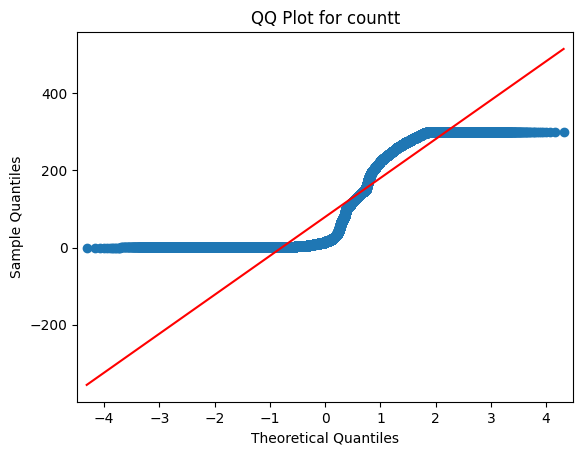

countt does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the countt across the groups in wrongfragment (Kruskal-Wallis).
=============== countt-flag ================
           count        mean         std  min    25%    50%    75%    max
flag                                                                    
OTH        46.0    1.608696    2.444752  1.0    1.0    1.0    1.0   15.0
REJ     11233.0  138.446630  113.009461  0.0    1.0  133.0  247.0  301.0
RSTO     1562.0  149.992318   95.810284  1.0  104.0  141.0  243.0  301.0
RSTOS0    103.0  125.446602   70.830193  1.0   76.5  138.0  181.0  234.0
RSTR     2421.0   14.020653   56.355142  0.0    1.0    2.0    2.0  301.0
S0      34851.0  169.127371   84.834569  1.0  110.0  170.0  244.0  301.0
S1        365.0    2.578082    6.234216  1.0    1.0    1.0    2.0  107.0
S2        127.0    4.370079   26.721017  1.0    1.0    1.0    2.0  301.0
S3         49.

<Figure size 800x600 with 0 Axes>

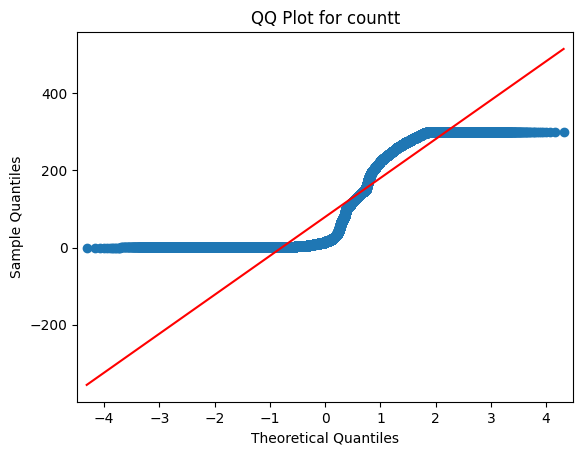

countt does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the countt across the groups in flag (Kruskal-Wallis).
=============== countt-protocoltype ================
                  count       mean         std  min  25%   50%    75%    max
protocoltype                                                               
icmp            8291.0  82.365577  126.823551  0.0  1.0   1.0  210.0  301.0
tcp           102689.0  79.160144  100.346264  0.0  2.0  14.0  143.0  301.0
udp            14993.0  79.929701   88.406584  0.0  3.0  51.0  139.0  301.0




<Figure size 800x600 with 0 Axes>

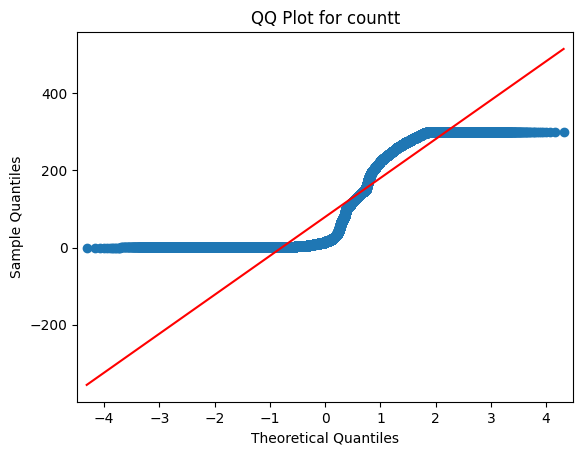

countt does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the countt across the groups in protocoltype (Kruskal-Wallis).
=============== countt-numaccessfiles ================
                    count       mean         std  min  25%   50%    75%    max
numaccessfiles                                                               
0               125602.0  79.687951  101.044937  0.0  2.0  15.0  143.0  301.0
1                  371.0   3.204852   10.100365  1.0  1.0   1.0    3.0  151.0




<Figure size 800x600 with 0 Axes>

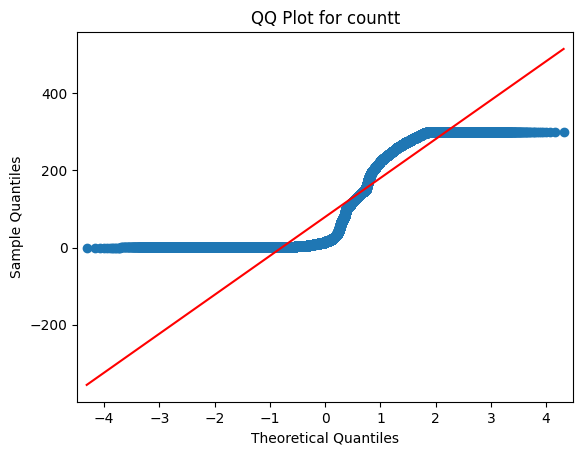

countt does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the countt across the groups in numaccessfiles (Kruskal-Wallis).
=============== countt-numcompromised ================
                    count       mean         std  min  25%   50%    75%    max
numcompromised                                                               
0               124687.0  80.249328  101.200181  0.0  2.0  15.0  144.0  301.0
1                 1286.0   3.193624    7.444047  1.0  1.0   2.0    4.0  151.0




<Figure size 800x600 with 0 Axes>

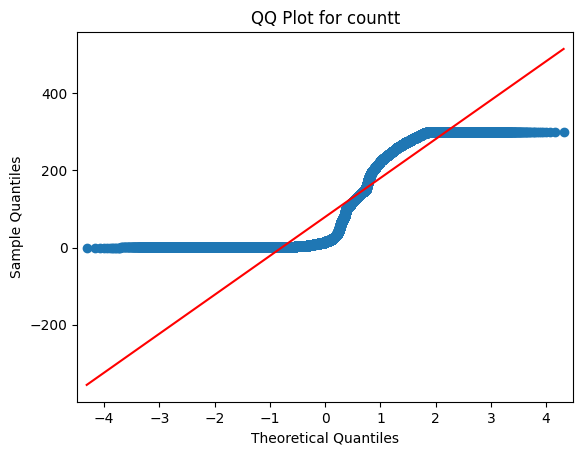

countt does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the countt across the groups in numcompromised (Kruskal-Wallis).
=============== dsthostsamesrvrate-suattempted ================
                 count      mean       std  min   25%   50%   75%  max
suattempted                                                          
0            125893.0  0.521426  0.448996  0.0  0.05  0.52  1.00  1.0
1                80.0  0.230750  0.226569  0.0  0.08  0.20  0.26  1.0




<Figure size 800x600 with 0 Axes>

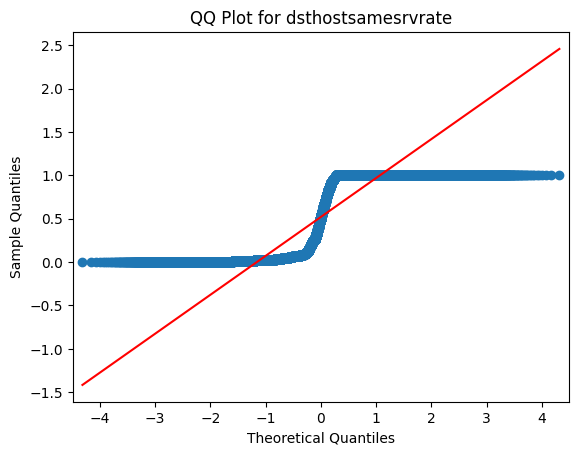

dsthostsamesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrvrate across the groups in suattempted (Kruskal-Wallis).
=============== dsthostsamesrvrate-numfilecreations ================
                      count      mean       std  min   25%   50%   75%  max
numfilecreations                                                          
0                 125686.0  0.521572  0.449143  0.0  0.05  0.52  1.00  1.0
1                    287.0  0.376655  0.323915  0.0  0.11  0.27  0.61  1.0




<Figure size 800x600 with 0 Axes>

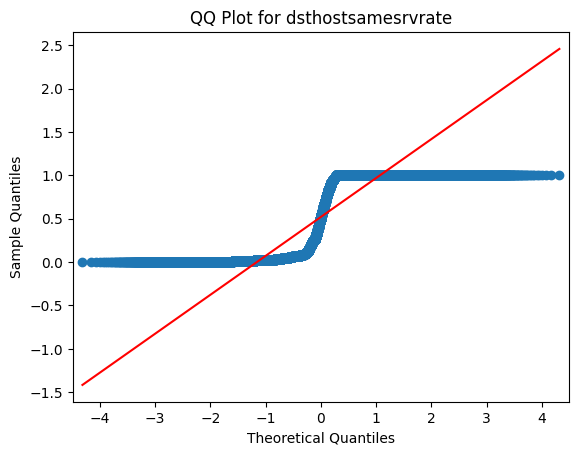

dsthostsamesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrvrate across the groups in numfilecreations (Kruskal-Wallis).
=============== dsthostsamesrvrate-numfailedlogins ================
                     count      mean       std  min   25%   50%  75%  max
numfailedlogins                                                         
0                125851.0  0.521207  0.448992  0.0  0.05  0.51  1.0  1.0
1                   122.0  0.557295  0.402044  0.0  0.21  0.40  1.0  1.0




<Figure size 800x600 with 0 Axes>

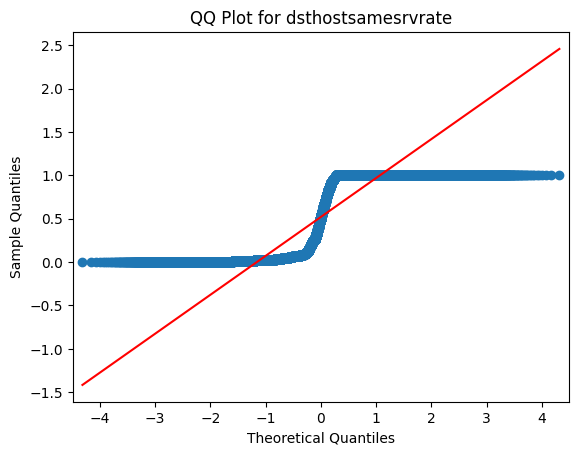

dsthostsamesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrvrate across the groups in numfailedlogins (Kruskal-Wallis).
=============== dsthostsamesrvrate-numroot ================
             count      mean       std  min   25%   50%   75%  max
numroot                                                          
0        125324.0  0.522321  0.449346  0.0  0.05  0.52  1.00  1.0
1           649.0  0.312912  0.298732  0.0  0.08  0.22  0.41  1.0




<Figure size 800x600 with 0 Axes>

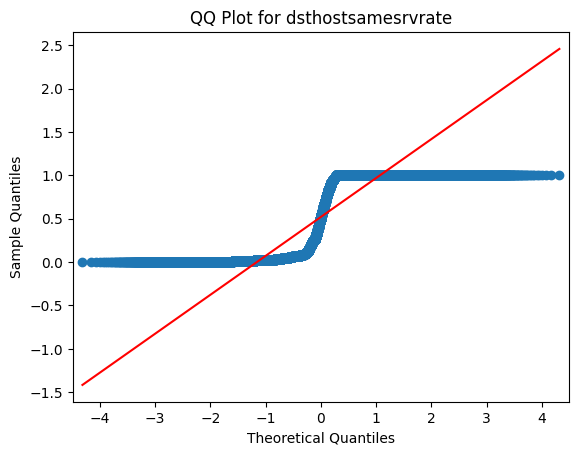

dsthostsamesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrvrate across the groups in numroot (Kruskal-Wallis).
=============== dsthostsamesrvrate-numshells ================
               count      mean       std  min    25%   50%   75%  max
numshells                                                           
0          125926.0  0.521308  0.448982  0.0  0.050  0.51  1.00  1.0
1              47.0  0.342553  0.305283  0.0  0.175  0.25  0.42  1.0




<Figure size 800x600 with 0 Axes>

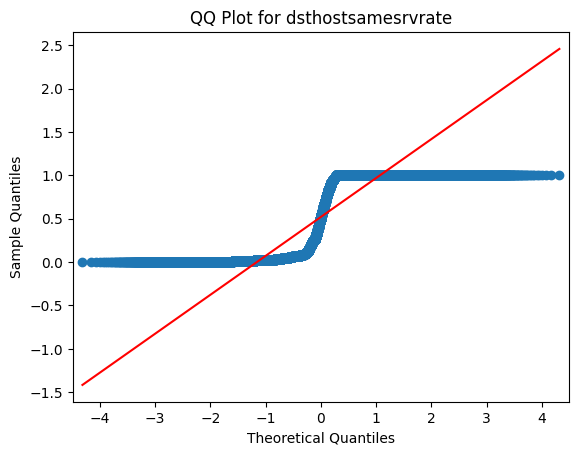

dsthostsamesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostsamesrvrate-loggedin ================
             count      mean       std  min   25%   50%   75%  max
loggedin                                                         
0         76121.0  0.301778  0.400404  0.0  0.02  0.07  0.72  1.0
1         49852.0  0.856350  0.280487  0.0  0.93  1.00  1.00  1.0




<Figure size 800x600 with 0 Axes>

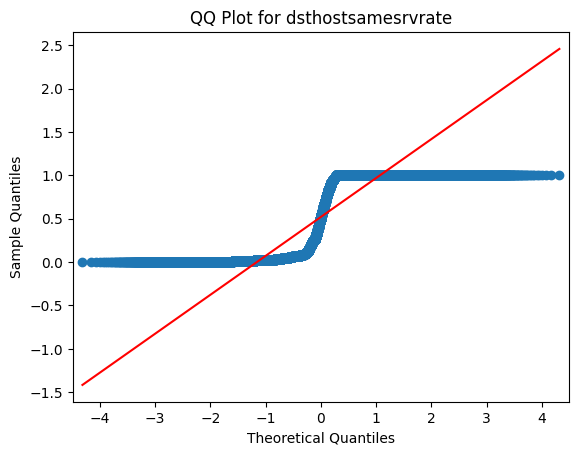

dsthostsamesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrvrate across the groups in loggedin (Kruskal-Wallis).
=============== dsthostsamesrvrate-urgent ================
            count      mean       std  min   25%   50%  75%  max
urgent                                                         
0       125964.0  0.521255  0.448950  0.0  0.05  0.51  1.0  1.0
1            9.0  0.341111  0.426364  0.0  0.01  0.03  0.5  1.0




<Figure size 800x600 with 0 Axes>

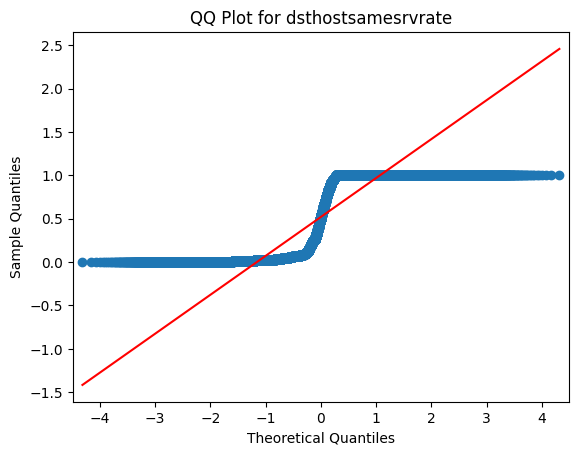

dsthostsamesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is no sufficient evidence of a significant difference between the medians across the groups.
=============== dsthostsamesrvrate-land ================
          count      mean       std   min   25%   50%  75%  max
land                                                          
0     125948.0  0.521168  0.448944  0.00  0.05  0.51  1.0  1.0
1         25.0  0.890800  0.301909  0.07  1.00  1.00  1.0  1.0




<Figure size 800x600 with 0 Axes>

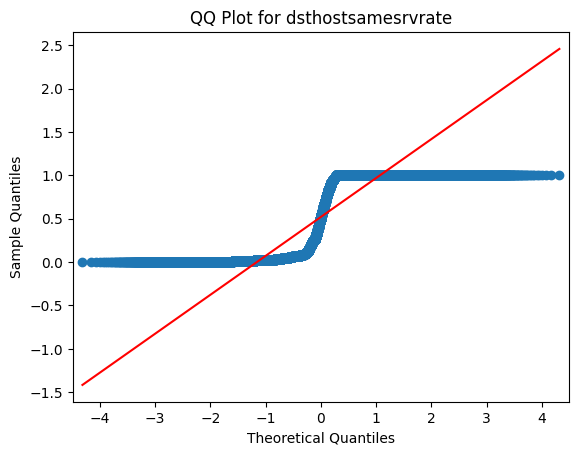

dsthostsamesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrvrate across the groups in land (Kruskal-Wallis).
=============== dsthostsamesrvrate-lastflag ================
             count      mean       std   min     25%    50%     75%  max
lastflag                                                               
0            66.0  0.268636  0.189362  0.01  0.1175  0.270  0.3575  1.0
1            62.0  0.422097  0.425341  0.00  0.0200  0.215  1.0000  1.0
2            54.0  0.443704  0.420693  0.00  0.0825  0.170  1.0000  1.0
3            65.0  0.435538  0.393534  0.00  0.0300  0.270  0.8800  1.0
4            79.0  0.382658  0.428781  0.00  0.0400  0.100  0.9400  1.0
5            81.0  0.290247  0.385376  0.00  0.0200  0.140  0.3300  1.0
6            96.0  0.357396  0.413619  0.00  0.0200  0.160  1.0000  1.0
7           118.0  0.318983  0.395186  0.00  0.0200  0.145  0.515

<Figure size 800x600 with 0 Axes>

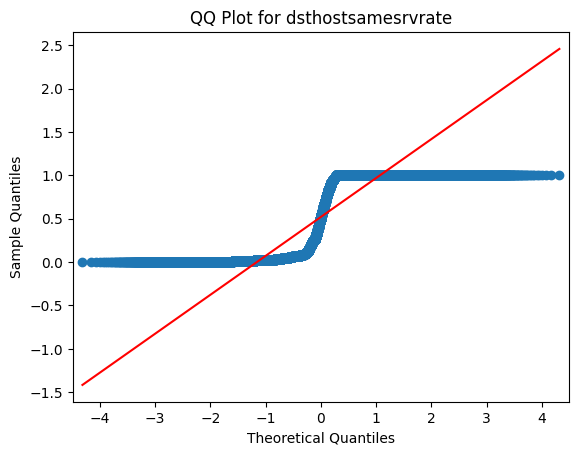

dsthostsamesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrvrate across the groups in lastflag (Kruskal-Wallis).
=============== dsthostsamesrvrate-hot ================
         count      mean       std  min   25%   50%  75%  max
hot                                                         
0    123302.0  0.518578  0.449785  0.0  0.05  0.51  1.0  1.0
1      2671.0  0.644204  0.389200  0.0  0.23  1.00  1.0  1.0




<Figure size 800x600 with 0 Axes>

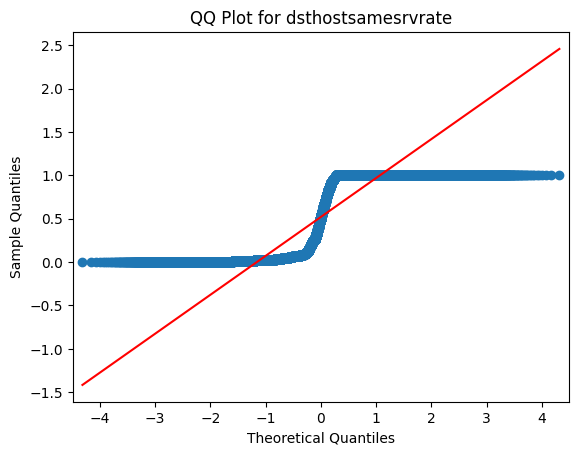

dsthostsamesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrvrate across the groups in hot (Kruskal-Wallis).
=============== dsthostsamesrvrate-rootshell ================
               count      mean       std  min   25%   50%  75%  max
rootshell                                                         
0          125804.0  0.521116  0.448969  0.0  0.05  0.51  1.0  1.0
1             169.0  0.614438  0.425385  0.0  0.18  1.00  1.0  1.0




<Figure size 800x600 with 0 Axes>

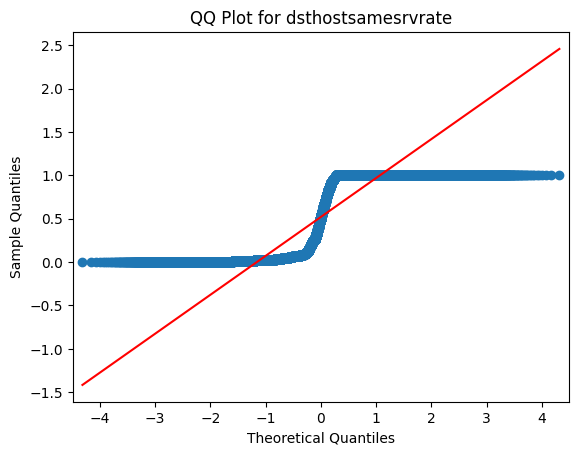

dsthostsamesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrvrate across the groups in rootshell (Kruskal-Wallis).
=============== dsthostsamesrvrate-isguestlogin ================
                  count      mean       std  min   25%   50%   75%  max
isguestlogin                                                          
0             124786.0  0.523619  0.450058  0.0  0.05  0.54  1.00  1.0
1               1187.0  0.271306  0.183825  0.0  0.17  0.23  0.31  1.0




<Figure size 800x600 with 0 Axes>

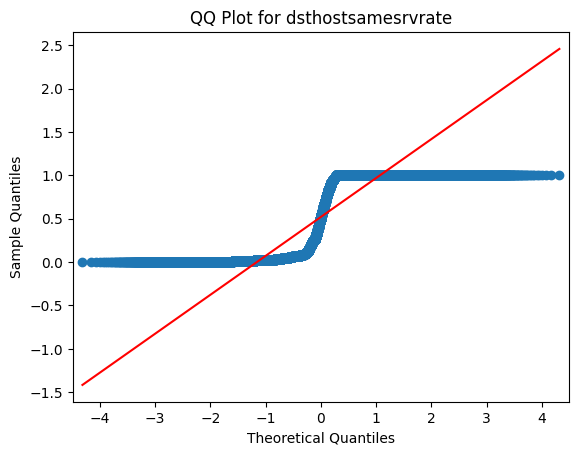

dsthostsamesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrvrate across the groups in isguestlogin (Kruskal-Wallis).
=============== dsthostsamesrvrate-wrongfragment ================
                   count      mean       std  min   25%   50%   75%  max
wrongfragment                                                          
0              124883.0  0.523086  0.449799  0.0  0.05  0.53  1.00  1.0
1                1090.0  0.309881  0.262728  0.0  0.12  0.25  0.38  1.0




<Figure size 800x600 with 0 Axes>

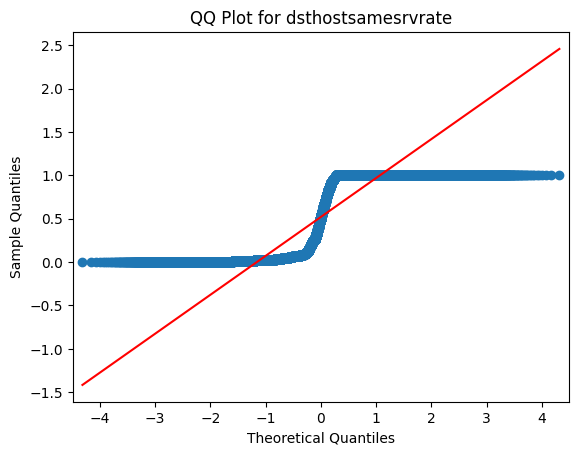

dsthostsamesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrvrate across the groups in wrongfragment (Kruskal-Wallis).
=============== dsthostsamesrvrate-flag ================
           count      mean       std   min    25%   50%     75%  max
flag                                                               
OTH        46.0  0.137609  0.297823  0.00  0.010  0.01  0.0325  1.0
REJ     11233.0  0.258696  0.408845  0.00  0.010  0.04  0.1200  1.0
RSTO     1562.0  0.139168  0.276501  0.00  0.020  0.04  0.0700  1.0
RSTOS0    103.0  0.025631  0.108245  0.00  0.010  0.01  0.0100  0.8
RSTR     2421.0  0.067778  0.213618  0.00  0.000  0.01  0.0100  1.0
S0      34851.0  0.073152  0.119154  0.00  0.020  0.05  0.0700  1.0
S1        365.0  0.634438  0.401718  0.00  0.190  0.86  1.0000  1.0
S2        127.0  0.873780  0.258113  0.00  0.915  1.00  1.0000  1.0
S3         49.0  0.653469  0

<Figure size 800x600 with 0 Axes>

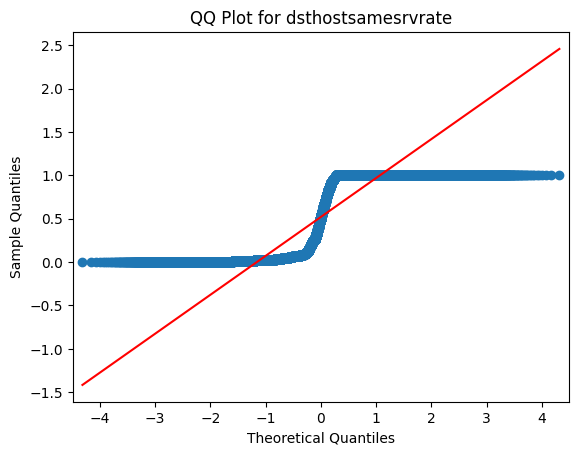

dsthostsamesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrvrate across the groups in flag (Kruskal-Wallis).
=============== dsthostsamesrvrate-protocoltype ================
                  count      mean       std  min   25%   50%  75%  max
protocoltype                                                         
icmp            8291.0  0.784729  0.353874  0.0  0.61  1.00  1.0  1.0
tcp           102689.0  0.478294  0.450718  0.0  0.04  0.25  1.0  1.0
udp            14993.0  0.669687  0.399782  0.0  0.21  0.90  1.0  1.0




<Figure size 800x600 with 0 Axes>

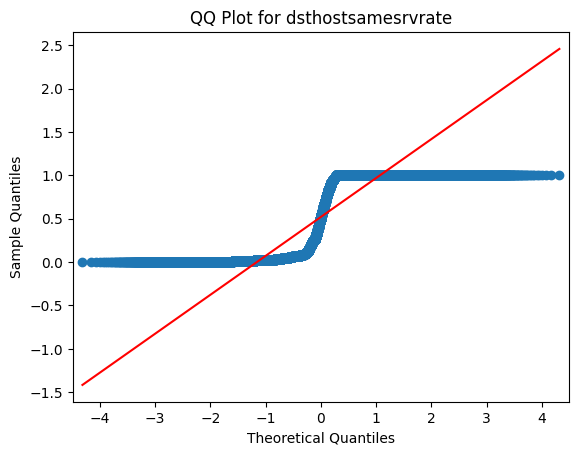

dsthostsamesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrvrate across the groups in protocoltype (Kruskal-Wallis).
=============== dsthostsamesrvrate-numaccessfiles ================
                    count      mean       std  min   25%   50%   75%  max
numaccessfiles                                                          
0               125602.0  0.520684  0.449116  0.0  0.05  0.51  1.00  1.0
1                  371.0  0.710135  0.339904  0.0  0.39  0.92  0.98  1.0




<Figure size 800x600 with 0 Axes>

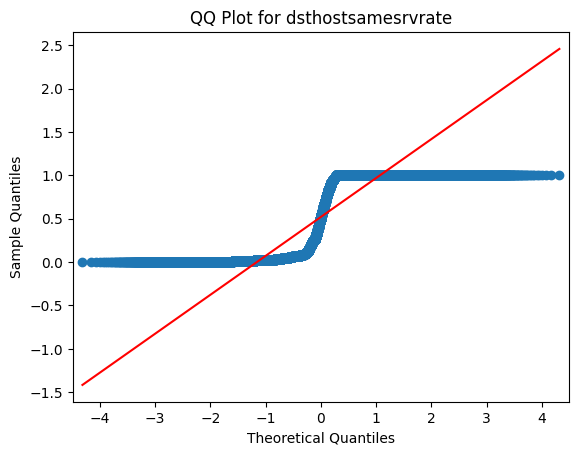

dsthostsamesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrvrate across the groups in numaccessfiles (Kruskal-Wallis).
=============== dsthostsamesrvrate-numcompromised ================
                    count      mean       std  min   25%  50%  75%  max
numcompromised                                                        
0               124687.0  0.518529  0.448881  0.0  0.05  0.5  1.0  1.0
1                 1286.0  0.784269  0.371079  0.0  0.50  1.0  1.0  1.0




<Figure size 800x600 with 0 Axes>

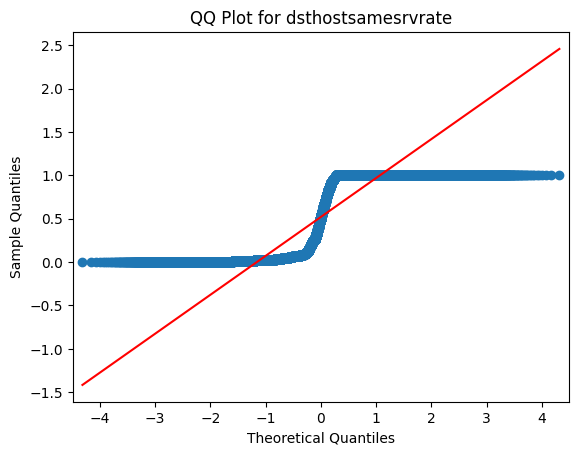

dsthostsamesrvrate does not appear normally distributed (p = 0.0000), proceeding with Kruskal-Wallis test.
There is a statistically significant difference in the dsthostsamesrvrate across the groups in numcompromised (Kruskal-Wallis).


In [30]:
anova_df=pd.DataFrame([[0]*len(numerical_vars)]*len(categorical_vars),index=categorical_vars,columns=numerical_vars)

for col in numerical_vars:
    for col1 in range(len(categorical_vars)):
        print('=============== {}-{} ================\n'.format(col,categorical_vars[col1]),df.groupby([categorical_vars[col1]])[col].describe())
        print('\n')
        anova_df.loc[categorical_vars[col1],col],f=anova_kruskal_test(df,col,categorical_vars[col1])

        
        

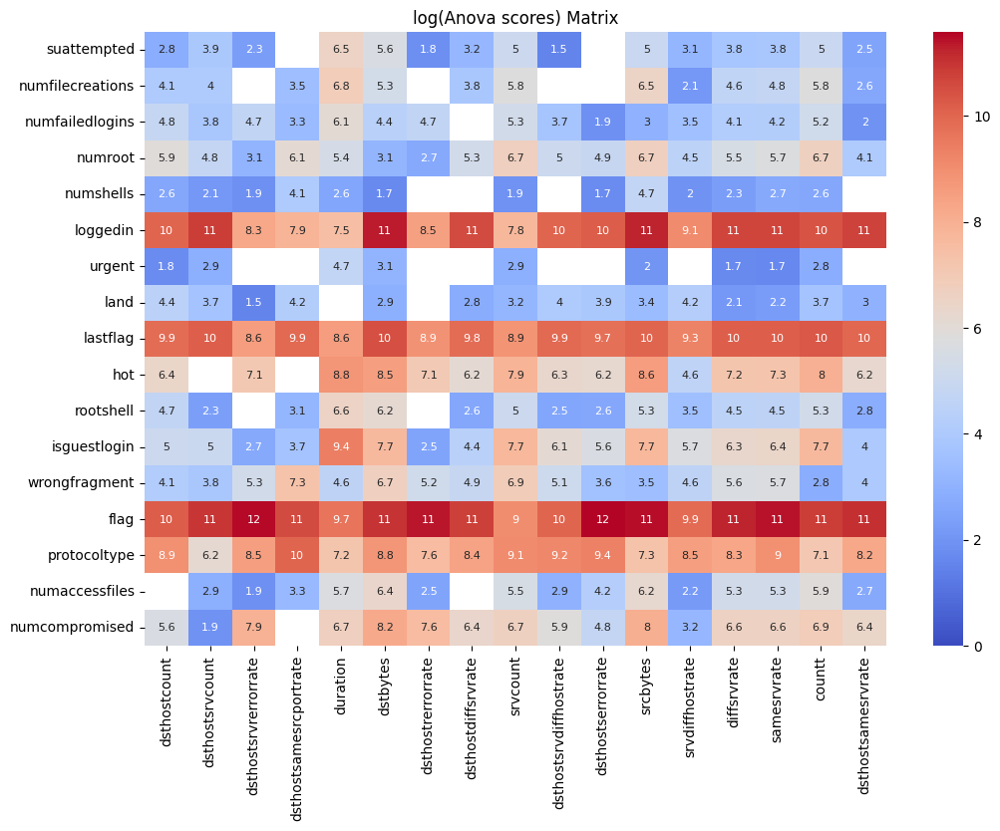

In [31]:
plt.figure(figsize=(12,8))
sns.heatmap(np.log(anova_df),annot=True,vmin=0,cmap='coolwarm',annot_kws={'size':8})
plt.title('log(Anova scores) Matrix')
plt.show()



In [32]:
## do it after the dropped cols

anova_drop_cols=get_correlated_vars(np.log(anova_df),12,False)   # log(anova) threshold score=12
numerical_vars=list(set(numerical_vars)-set(anova_drop_cols))
categorical_vars=list(set(categorical_vars)-set(anova_drop_cols))


### Standardize and one-hot encode/WoE encode

In [33]:



def filter_numeric(data,coll):
    enum_coll=list(enumerate(coll))
    cols=data.select_dtypes(include=['number']).columns
    cc=[]
    for col in cols:
        if (data[col].nunique(dropna=True)>2) or\
        ((sorted(list(data[col].dropna().unique()))!=[0,1]) and\
        (sorted(list(data[col].dropna().unique()))!=[0]) and\
        (sorted(list(data[col].dropna().unique()))!=[1])):
            cc.append(col)

    cols=cc
    numeric_cols=list(set(cols).intersection(set(coll)))
    li=[sett[1] for sett in enum_coll if sett[1] in numeric_cols]
    return li

def standardize_data(d,cols,strategy='standard'):
    if strategy=='standard':
        scalar=StandardScaler()
    else:
        scalar=MinMaxScaler()
    data=d.copy()
    cols=filter_numeric(data,cols)
    #print(cols)
    data.loc[:,cols]=pd.DataFrame(scalar.fit_transform(data[cols]),columns=cols,index=data.index)

    return data,scalar,cols

def transform_standardize_data(d,cols,scalar):
    data=d.copy()
    data.loc[:,cols]=pd.DataFrame(scalar.transform(data[cols]),columns=cols,index=data.index)
    return data

def revtransform_standardize_data(d,cols,scalar):
    data=d.copy()
    data.loc[:,cols]=pd.DataFrame(scalar.inverse_transform(data[cols]),columns=cols,index=data.index)
    return data

## One hot encoding
def dummy_str_col(d,cols):
    data=d.copy()
    drop_str_cols=[]
    str_cols=cols
    for str_col in str_cols:
        str_data=pd.get_dummies(data.loc[:,str_col]).astype(int)
        str_data.columns=[str_col+'_'+str(col) for col in str_data.columns]
        drop_str_cols.append(str_data.columns[-1])
        str_data.drop(str_data.columns[-1],axis=1,inplace=True)

        data.drop(str_col,axis=1,inplace=True)
        data=pd.concat([data,str_data],axis=1)
    return data,drop_str_cols

In [34]:
# WoE encoding function
def calculate_woe(data, feature, target_var):
    # Group by the feature to calculate WoE
    temp_df = data.groupby(feature)[target_var].agg(['count', 'sum'])
    temp_df['non_event'] = temp_df['count'] - temp_df['sum']
    temp_df['event_dist'] = temp_df['sum'] / temp_df['sum'].sum()
    temp_df['non_event_dist'] = temp_df['non_event'] / temp_df['non_event'].sum()
    temp_df['woe'] = np.log(temp_df['event_dist'] / temp_df['non_event_dist']).replace([np.inf, -np.inf], 0)
    
    # Return a mapping of WoE values for each category
    return temp_df['woe']

# Training function
def woe_encoding_train(df, to_encode_cols, target_var):
    d = df.copy()
    encoding_dict = {}

    for col in to_encode_cols:
        woe_values = calculate_woe(d, col, target_var)
        encoding_dict[col] = woe_values.to_dict()
        
        # Apply WoE transformation
        d[col + '_woe'] = d[col].map(encoding_dict[col]).fillna(0)
    
    return d, encoding_dict

# Test function
def woe_encoding_test(df, encoding_dict):
    d = df.copy()
    
    for col, woe_map in encoding_dict.items():
        d[col + '_woe'] = d[col].map(woe_map).fillna(0)
    
    # Drop original columns after encoding
    d.drop(columns=encoding_dict.keys(), inplace=True)
    
    return d




### VIF to drop any multicorrelated columns

In [35]:

from statsmodels.stats.outliers_influence import variance_inflation_factor

def Handle_Multicollinearity(data,vif_threshold):
    train_data=data.copy()
    flag=0
    while (not train_data.empty) and (flag==0):
        vif_data = pd.DataFrame()
        vif_data['Feature'] = train_data.columns
        vif_data['VIF'] = [variance_inflation_factor(train_data.values, i) for i in range(len(train_data.columns))]
        vif_data=vif_data.sort_values('VIF',ascending=False)
        vif_data.reset_index(drop=True,inplace=True)
        
        table = BeautifulTable()
        for ind,row in vif_data.iterrows():
            table.rows.append(row)
        table.columns.header = vif_data.columns
        print(table)
        
        if vif_data.iloc[0,1]>vif_threshold:
            drop_col=vif_data.iloc[0,0]
            train_data.drop(drop_col,axis=1,inplace=True)
        else:
            flag=1
            
    if train_data.empty:
        print('All features are multicollinear')
    else:
        print('Features and their respective VIF scores after dropping multicollinear variables!! (VIF<{})\n'.format(vif_threshold))
        table = BeautifulTable()
        for ind,row in vif_data.iterrows():
            table.rows.append(row)
        table.columns.header = vif_data.columns
        print(table)
    return vif_data

In [36]:
df['is_anamoly']=pd.Series(np.where(df['target_attacks']=='normal',0,1),index=df.index)
df_cleaned=df.loc[:,numerical_vars+categorical_vars+[target_var,'is_anamoly']].copy()

df_cleaned,drop_cols=dummy_str_col(df_cleaned,['protocoltype'])

df_cleaned,encoding_dict=woe_encoding_train(df_cleaned, to_encode_cols=['lastflag','flag'], target_var='is_anamoly')


df_cleaned.drop(['lastflag','flag'],axis=1,inplace=True) #'service',

target_df=df_cleaned[[target_var]].copy()
biclass_df=df_cleaned[['is_anamoly']].copy()
df_cleaned.drop([target_var,'is_anamoly'],axis=1,inplace=True)

df_cleaned,scalar,numeric_cols=standardize_data(df_cleaned,df_cleaned.columns)

In [37]:
vif_data=Handle_Multicollinearity(df_cleaned,5)
non_collinear_columns=vif_data.Feature.values

df_cleaned=df_cleaned.loc[:,non_collinear_columns].copy()

+------------------------+--------+
|        Feature         |  VIF   |
+------------------------+--------+
|   dsthostserrorrate    | 21.501 |
+------------------------+--------+
|        flag_woe        | 20.74  |
+------------------------+--------+
|        loggedin        | 14.078 |
+------------------------+--------+
|   dsthostsamesrvrate   | 12.081 |
+------------------------+--------+
|      samesrvrate       | 9.665  |
+------------------------+--------+
|  dsthostsrvrerrorrate  |  9.33  |
+------------------------+--------+
|    protocoltype_tcp    | 9.057  |
+------------------------+--------+
|    dsthostsrvcount     | 8.962  |
+------------------------+--------+
|   dsthostrerrorrate    | 8.476  |
+------------------------+--------+
|          hot           | 4.791  |
+------------------------+--------+
|         countt         | 3.571  |
+------------------------+--------+
|      isguestlogin      | 3.413  |
+------------------------+--------+
|     numcompromised     | 2

+------------------------+-------+
|        Feature         |  VIF  |
+------------------------+-------+
|   dsthostrerrorrate    | 7.665 |
+------------------------+-------+
|  dsthostsrvrerrorrate  | 7.538 |
+------------------------+-------+
|          hot           | 4.707 |
+------------------------+-------+
|        flag_woe        | 3.36  |
+------------------------+-------+
|      isguestlogin      | 3.356 |
+------------------------+-------+
|    dsthostsrvcount     | 3.271 |
+------------------------+-------+
|         countt         | 2.675 |
+------------------------+-------+
|     numcompromised     | 2.604 |
+------------------------+-------+
|   protocoltype_icmp    | 2.288 |
+------------------------+-------+
| dsthostsamesrcportrate | 2.25  |
+------------------------+-------+
|        srvcount        | 2.152 |
+------------------------+-------+
|   dsthostdiffsrvrate   | 2.096 |
+------------------------+-------+
|        srcbytes        |  2.0  |
+-------------------

In [38]:
important_features

Index(['service', 'lastflag', 'flag', 'samesrvrate', 'srvserrorrate',
       'serrorrate', 'dstbytes', 'dsthostsrvserrorrate', 'srcbytes',
       'dsthostserrorrate', 'diffsrvrate', 'loggedin', 'countt',
       'dsthostsrvcount', 'dsthostsamesrvrate', 'dsthostdiffsrvrate',
       'dsthostsamesrcportrate', 'dsthostcount', 'dsthostsrvdiffhostrate',
       'protocoltype', 'srvdiffhostrate', 'rerrorrate', 'srvrerrorrate',
       'dsthostrerrorrate', 'dsthostsrvrerrorrate', 'isguestlogin',
       'rootshell', 'hot', 'srvcount', 'duration', 'numfilecreations',
       'numfailedlogins', 'wrongfragment', 'numcompromised', 'numshells',
       'numroot', 'urgent', 'numaccessfiles', 'suattempted', 'land'],
      dtype='object')

In [39]:
non_collinear_columns

array(['hot', 'isguestlogin', 'flag_woe', 'dsthostsrvcount', 'countt',
       'numcompromised', 'protocoltype_icmp', 'dsthostsamesrcportrate',
       'srvcount', 'dsthostdiffsrvrate', 'srcbytes', 'dsthostcount',
       'suattempted', 'dsthostsrvdiffhostrate', 'lastflag_woe',
       'rootshell', 'duration', 'diffsrvrate', 'srvdiffhostrate',
       'dsthostsrvrerrorrate', 'protocoltype_tcp', 'dstbytes', 'numroot',
       'numaccessfiles', 'wrongfragment', 'numfailedlogins',
       'numfilecreations', 'urgent', 'numshells', 'land'], dtype=object)

### Applying PCA on non-important features while important features stays intact

In [40]:

imp_ff=[]
for imp_f in important_features:
    for ncc in non_collinear_columns:
        if imp_f in ncc.split('_') and ncc not in imp_ff:
            imp_ff.append(ncc)
            
imp_ff=imp_ff[:int(np.ceil(len(non_collinear_columns)*1/4))]

non_imp_ff=list(set(non_collinear_columns)-set(imp_ff))

In [41]:
imp_ff   #important features

['lastflag_woe',
 'flag_woe',
 'dstbytes',
 'srcbytes',
 'diffsrvrate',
 'countt',
 'dsthostsrvcount',
 'dsthostdiffsrvrate']

In [42]:
non_imp_ff  # planning to decompose this

['dsthostsrvrerrorrate',
 'suattempted',
 'duration',
 'dsthostsrvdiffhostrate',
 'srvdiffhostrate',
 'numshells',
 'protocoltype_icmp',
 'isguestlogin',
 'wrongfragment',
 'numaccessfiles',
 'numcompromised',
 'numfilecreations',
 'numfailedlogins',
 'numroot',
 'srvcount',
 'protocoltype_tcp',
 'urgent',
 'dsthostcount',
 'dsthostsamesrcportrate',
 'land',
 'hot',
 'rootshell']

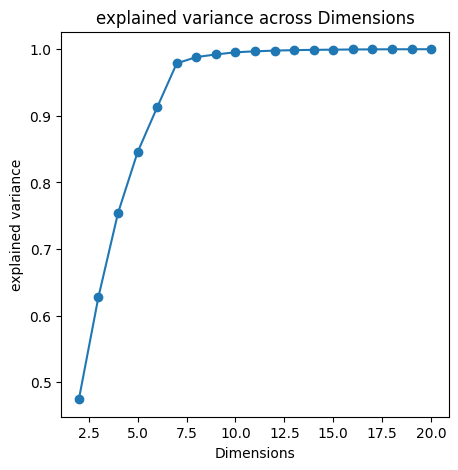

In [43]:
##decomposing high dimension data to dim=10

import umap.umap_ as umap
from sklearn.decomposition import PCA

pca_var=[]
pca_df=[]
for i in range(2,len(non_imp_ff)-1):
    pca1 = PCA(n_components=i,random_state=42) 
    X_pca_cleaned = pca1.fit_transform(df_cleaned[non_imp_ff])
    df_pca=pd.DataFrame(X_pca_cleaned,columns=['col_{}'.format(j) for j in range(i)])

    var=np.sum(pca1.explained_variance_ratio_)
    pca_var.append(var)
    pca_df.append(df_pca.copy())
    
plt.figure(figsize=(5,5))
plt.plot(range(2,len(non_imp_ff)-1),pca_var,marker='o')
plt.title('explained variance across Dimensions')
plt.xlabel('Dimensions')
plt.ylabel('explained variance')
plt.show()

#pca_var

#84% explained variance from 5 components

In [44]:
pca_cleaned=pd.concat([df_cleaned[imp_ff],pca_df[3]],axis=1)
df_cleaned=pd.concat([df_cleaned[imp_ff],pca_df[3]],axis=1)

In [45]:
{i+2:j for i,j in enumerate(pca_var)}

{2: 0.47446386726579337,
 3: 0.628162300814155,
 4: 0.754132979749442,
 5: 0.8454286249186149,
 6: 0.9128438972714974,
 7: 0.9787507470374032,
 8: 0.9881701391779314,
 9: 0.9921186881585243,
 10: 0.9953934011436367,
 11: 0.9967858732366981,
 12: 0.9979007573186688,
 13: 0.9986088006729598,
 14: 0.9990133300482649,
 15: 0.9993148158141169,
 16: 0.9995751719733836,
 17: 0.9997461020435724,
 18: 0.9998734273831968,
 19: 0.9999246514540179,
 20: 0.9999633806674041}

In [46]:
#visualize dataset in 2-d

start_time=time.time()

pca = PCA(n_components=2,random_state=42)   

X_umap = umap.UMAP(n_components=2,random_state=42,n_neighbors=500,min_dist=0.1,n_jobs=-1).fit_transform(pca_cleaned)

X_pca = pca.fit_transform(pca_cleaned)

end_time=time.time()
time_taken = end_time - start_time

print(f'Time taken to execute the code: {time_taken:.2f} seconds')


Time taken to execute the code: 1004.15 seconds


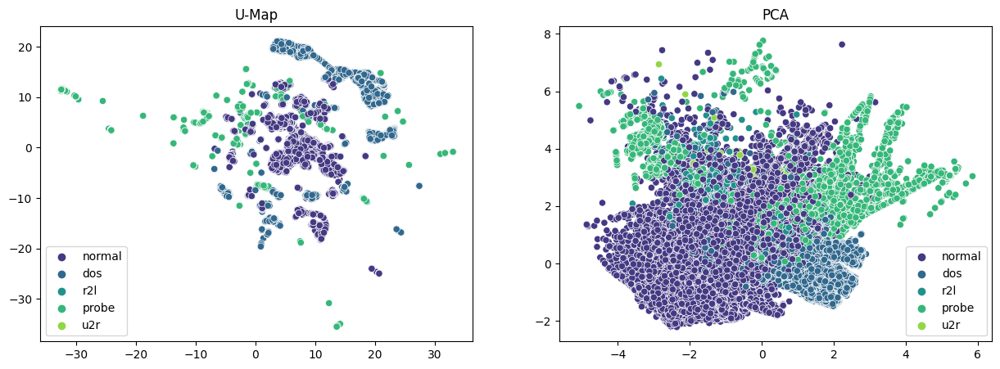

In [47]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

sns.scatterplot(x=X_umap[:, 0], y=X_umap[:, 1],  ax=axes[0], palette='viridis',hue=target_df.values.ravel())
axes[0].set_title('U-Map')

sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1],  ax=axes[1], palette='viridis',hue=target_df.values.ravel())
axes[1].set_title('PCA')

plt.show()

In [48]:

# for lab in target_df.target_attacks.unique():
#     print('==============================\nattack: ',lab)
#     fig=plt.figure()
#     sns.scatterplot(x=X_umap[(target_df.target_attacks==lab), 0], y=X_umap[(target_df.target_attacks==lab), 1]
#                     , palette='viridis')
#     plt.show()

### Outlier labelling

In [49]:
from sklearn.cluster import DBSCAN, KMeans
from sklearn.metrics import silhouette_score, pairwise_distances
from sklearn.metrics import make_scorer
from scipy.spatial.distance import pdist, squareform

import seaborn as sns

def plot_clusters(X_umap,X_pca, labels, method, param1):
    
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    
    sns.scatterplot(x=X_umap[:, 0], y=X_umap[:, 1], hue=labels, ax=axes[0], palette='viridis')
    axes[0].set_title(f'{method} (U-Map) - {param1}')
    
    sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=labels, ax=axes[1], palette='viridis')
    axes[1].set_title(f'{method} (PCA) - {param1}')
    
    plt.show()
    
    
def dunn_index(X, labels):
    unique_clusters = set(labels)
    if len(unique_clusters) == 1:
        return 0

    clusters = [X[labels == c] for c in unique_clusters]
    
    intra_dists = [max(pdist(cluster)) if len(cluster)>1 else 0 for cluster in clusters]
    inter_dists = [min(pairwise_distances(clusters[i], clusters[j]).min()
                       for i in range(len(clusters)) for j in range(i + 1, len(clusters)))]

    if len(inter_dists) == 0:
        return 0

    return min(inter_dists) / max(intra_dists)

Combo of Isolated Forest and LOF


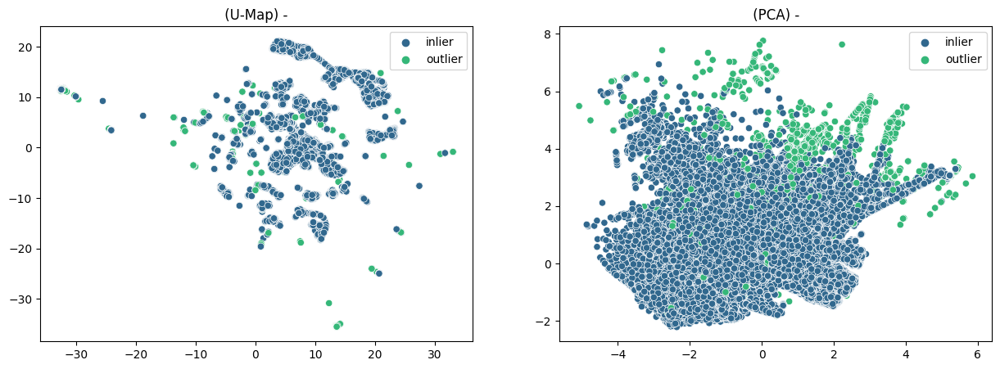

In [50]:
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor

#2.5% outliers
iso_forest = IsolationForest(contamination=0.025, random_state=42)
iso_forest.fit(df_cleaned)
iso_labels = iso_forest.predict(df_cleaned)

#2.5% outliers and outlier threshold=4
lof = LocalOutlierFactor(n_neighbors=20, contamination=0.025)
lof_labels = lof.fit_predict(df_cleaned)
lof_labels = np.where(-lof.negative_outlier_factor_ >= 4, -1, 1)

print('Combo of Isolated Forest and LOF')
labels=np.where(((iso_labels==-1)|(lof_labels==-1)),'outlier','inlier')
labels=np.where((labels == 'outlier') & (target_df.target_attacks.isin(['u2r', 'r2l'])), 'inlier', labels)

plot_clusters(X_umap,X_pca, labels, '', '')



In [51]:
len(labels)

125973

=============================== Outliers ==============================================


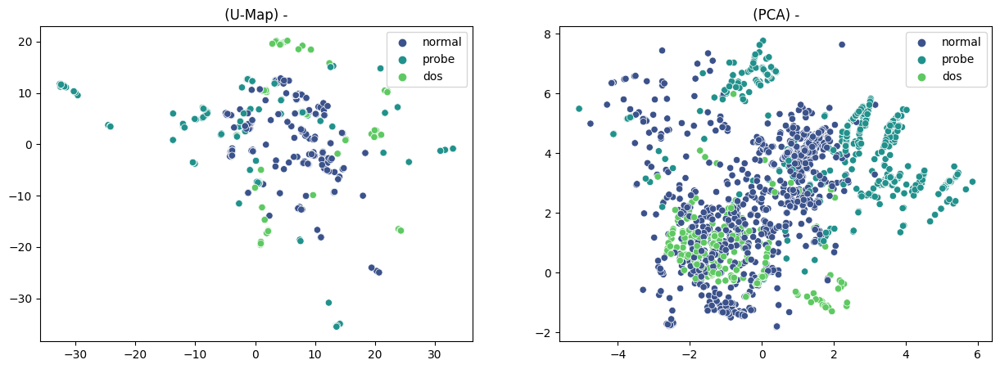

=============================== Inliers ==============================================


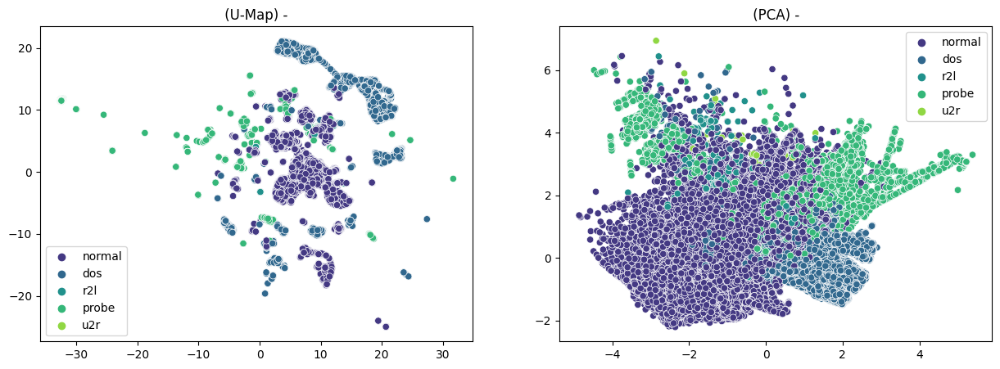

In [52]:
print('=============================== Outliers ==============================================')
plot_clusters(X_umap[labels=='outlier',:],X_pca[labels=='outlier',:]
              , target_df.loc[labels=='outlier'].values.ravel(),  '', '')

print('=============================== Inliers ==============================================')
plot_clusters(X_umap[~(labels=='outlier'),:],X_pca[~(labels=='outlier'),:]
              , target_df.loc[~(labels=='outlier')].values.ravel(),  '', '')

In [53]:
inliers=~(labels=='outlier')

target_df=target_df.loc[inliers].copy()
df_cleaned=df_cleaned.loc[inliers].copy()
df=df.loc[inliers].copy()
data=data.loc[inliers].copy()
target_df.reset_index(inplace=True,drop=True)
df_cleaned.reset_index(inplace=True,drop=True)
df.reset_index(inplace=True,drop=True)
data.reset_index(inplace=True,drop=True)

X_umap=X_umap[inliers,:].copy()
X_pca=X_pca[inliers,:].copy()



In [54]:
data=pd.read_csv('Network_anomaly_data.csv')
data['is_inlier']=pd.Series(inliers,index=data.index)   ## won't consider these outliers while training
data.to_csv('Network_anomaly_data_enhanced.csv',index=False)